In [214]:
import numpy as np
import unified_calibration
import imp
imp.reload(unified_calibration)
import matplotlib
import matplotlib.pyplot as plt
import scipy
import pickle

In [2]:
data_sim_expanded, data_sim_vis_no_noise, bl_group_uvw = unified_calibration.load_data()
model_sim_visibilities = np.copy(data_sim_vis_no_noise)
baseline_cov_inv, a_mat, gains_exp_mat_1, gains_exp_mat_2, ant_locs = unified_calibration.calc_calibration_components(
    data_sim_expanded, bl_group_uvw
)

Telescope square_grid is not in known_telescopes.
Missing some redundant groups. Filling in available data.


In [3]:
# Define constants
N_red_baselines = np.shape(bl_group_uvw)[0]
N_ants = data_sim_expanded.Nants_data
N_vis = data_sim_expanded.Nbls

In [4]:
n_trials = 100

In [5]:
model_stddev = .4
data_stddev = .2

In [6]:
noisy_model_data = np.zeros((N_red_baselines, n_trials), dtype=np.complex_)
noisy_data = np.zeros((N_vis, n_trials), dtype=np.complex_)
for ind in range(n_trials):
    noisy_model_data[:, ind] = (
        model_sim_visibilities 
        + np.random.normal(0, model_stddev, N_red_baselines)
        + 1j*np.random.normal(0, model_stddev, N_red_baselines)
    )
    noisy_data[:, ind] = (
        data_sim_expanded.data_array[:, 0, 0, 0]
        + np.random.normal(0, data_stddev, N_vis)
        + 1j*np.random.normal(0, data_stddev, N_vis)
    )

5.575420282504045
5.5957023707842115
5.867304265258236
5.869248892943678
5.867304265258236
5.566535179720134


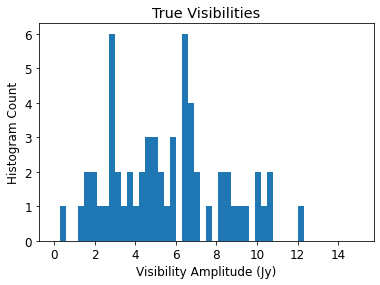

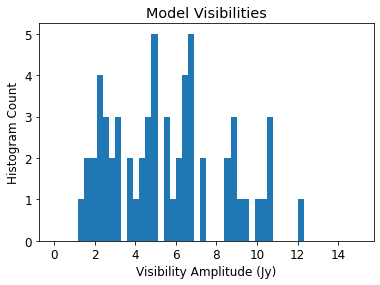

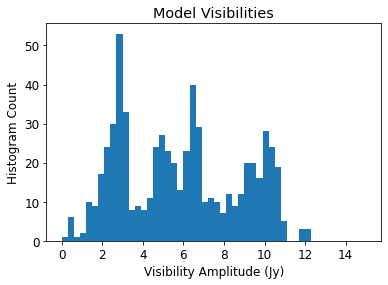

In [128]:
print(np.mean(np.abs(data_sim_vis_no_noise)))
print(np.mean(np.abs(noisy_model_data[:,0])))
print(np.mean(np.abs(data_sim_expanded.data_array[:, 0, 0, 0])))
print(np.mean(np.abs(noisy_data[:,0])))
print(np.mean(np.abs((np.matmul(a_mat, data_sim_vis_no_noise)))))
print(np.mean(np.abs((np.matmul(np.linalg.pinv(a_mat), noisy_data[:,0])))))

plt.hist(np.abs(data_sim_vis_no_noise), bins=50, range=[0,15])
plt.xlabel('Visibility Amplitude (Jy)')
plt.ylabel('Histogram Count')
plt.title('True Visibilities')
plt.show()

plt.hist(np.abs(noisy_model_data[:,0]), bins=50, range=[0,15])
plt.xlabel('Visibility Amplitude (Jy)')
plt.ylabel('Histogram Count')
plt.title('Model Visibilities')
plt.show()

plt.hist(np.abs(noisy_data[:,0]), bins=50, range=[0,15])
plt.xlabel('Visibility Amplitude (Jy)')
plt.ylabel('Histogram Count')
plt.title('Model Visibilities')
plt.show()


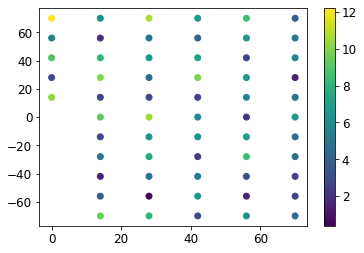

In [124]:
plt.scatter(bl_group_uvw[:,0], bl_group_uvw[:,1], c=np.abs(data_sim_vis_no_noise))
plt.colorbar()
plt.show()

In [7]:
gain_vals = np.zeros((N_ants, n_trials, n_trials, 3), dtype=np.complex_)
vis_diff_vals = np.zeros((N_red_baselines, n_trials, n_trials, 3), dtype=np.complex_)

for model_trial in range(n_trials):
    use_model = noisy_model_data[:, model_trial]
    for data_trial in range(n_trials):
        use_data = noisy_data[:, data_trial]
        for optimize_style_ind in range(3):
            if optimize_style_ind == 0:
                optimize_function_name = unified_calibration.optimize_sky_cal
            elif optimize_style_ind == 1:
                optimize_function_name = unified_calibration.optimize_unified_cal
            else:
                optimize_function_name = unified_calibration.optimize_redundant_cal
            gains_fit, vis_fit = optimize_function_name(
                use_data, use_model,
                baseline_cov_inv, a_mat, gains_exp_mat_1, gains_exp_mat_2,
                N_red_baselines, N_ants, data_stddev, model_stddev,
                ant_locs,
                gains_init=None,
                fitted_visibilities_init=use_model
            )
            gain_vals[:, model_trial, data_trial, optimize_style_ind] = gains_fit
            vis_diff_vals[:, model_trial, data_trial, optimize_style_ind] = vis_fit-data_sim_vis_no_noise

         Current function value: 5978.047915
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1229.180100
         Iterations: 788
         Function evaluations: 1390
         Gradient evaluations: 1389
         Current function value: 1077.173242
         Iterations: 375
         Function evaluations: 661
         Gradient evaluations: 660
Optimization terminated successfully.
         Current function value: 6175.088505
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1268.623179
         Iterations: 685
         Function evaluations: 1222
         Gradient evaluations: 1221
         Current function value: 1117.834260
         Iterations: 413
         Function evaluations: 714
         Gradient evaluations: 713
         Current function value: 6388.746610
         Iterations: 13
         Function evaluations: 28
         Gradient eva

         Current function value: 1237.219272
         Iterations: 725
         Function evaluations: 1338
         Gradient evaluations: 1326
         Current function value: 1086.049354
         Iterations: 346
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 6048.913662
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1178.244220
         Iterations: 605
         Function evaluations: 1052
         Gradient evaluations: 1051
         Current function value: 1024.999698
         Iterations: 312
         Function evaluations: 573
         Gradient evaluations: 572
         Current function value: 6021.715268
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1232.009703
         Iterations: 774
         Function evaluations: 1321
         Gradient evaluations: 1320
         Current fun

         Current function value: 1093.658163
         Iterations: 343
         Function evaluations: 605
         Gradient evaluations: 604
Optimization terminated successfully.
         Current function value: 6071.171384
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1199.556131
         Iterations: 762
         Function evaluations: 1306
         Gradient evaluations: 1305
         Current function value: 1047.223592
         Iterations: 433
         Function evaluations: 743
         Gradient evaluations: 742
Optimization terminated successfully.
         Current function value: 6377.407127
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1231.324991
         Iterations: 806
         Function evaluations: 1421
         Gradient evaluations: 1420
         Current function value: 1070.422365
         Iterations: 441
         Functio

         Current function value: 1272.636676
         Iterations: 619
         Function evaluations: 1091
         Gradient evaluations: 1090
         Current function value: 1117.933027
         Iterations: 410
         Function evaluations: 690
         Gradient evaluations: 689
Optimization terminated successfully.
         Current function value: 5849.940214
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1201.609888
         Iterations: 731
         Function evaluations: 1249
         Gradient evaluations: 1248
         Current function value: 1055.292120
         Iterations: 297
         Function evaluations: 547
         Gradient evaluations: 546
         Current function value: 6148.977443
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1201.393161
         Iterations: 864
         Function evaluations: 1527
         Gradient 

         Current function value: 1009.323344
         Iterations: 375
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 6028.109489
         Iterations: 13
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1157.164046
         Iterations: 669
         Function evaluations: 1226
         Gradient evaluations: 1214
         Current function value: 1003.302320
         Iterations: 415
         Function evaluations: 710
         Gradient evaluations: 709
Optimization terminated successfully.
         Current function value: 6341.226333
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1248.778512
         Iterations: 677
         Function evaluations: 1207
         Gradient evaluations: 1206
         Current function value: 1090.575055
         Iterations: 426
         Function evaluations: 770
         Gradient e

         Current function value: 1329.235567
         Iterations: 699
         Function evaluations: 1204
         Gradient evaluations: 1203
         Current function value: 1173.479596
         Iterations: 429
         Function evaluations: 734
         Gradient evaluations: 733
Optimization terminated successfully.
         Current function value: 6076.771663
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1276.165076
         Iterations: 638
         Function evaluations: 1146
         Gradient evaluations: 1134
         Current function value: 1118.980452
         Iterations: 371
         Function evaluations: 653
         Gradient evaluations: 652
Optimization terminated successfully.
         Current function value: 6086.182311
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1242.026462
         Iterations: 721
         Functio

         Current function value: 1154.919645
         Iterations: 844
         Function evaluations: 1449
         Gradient evaluations: 1448
         Current function value: 1009.189672
         Iterations: 434
         Function evaluations: 751
         Gradient evaluations: 750
Optimization terminated successfully.
         Current function value: 6342.193016
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1220.792584
         Iterations: 742
         Function evaluations: 1295
         Gradient evaluations: 1294
         Current function value: 1060.645499
         Iterations: 410
         Function evaluations: 705
         Gradient evaluations: 704
Optimization terminated successfully.
         Current function value: 6021.705860
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1226.994720
         Iterations: 746
         Functio

         Current function value: 1042.985578
         Iterations: 361
         Function evaluations: 638
         Gradient evaluations: 637
Optimization terminated successfully.
         Current function value: 6130.236215
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1275.048983
         Iterations: 784
         Function evaluations: 1367
         Gradient evaluations: 1366
         Current function value: 1115.617980
         Iterations: 356
         Function evaluations: 624
         Gradient evaluations: 623
Optimization terminated successfully.
         Current function value: 5797.234871
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1215.830115
         Iterations: 666
         Function evaluations: 1188
         Gradient evaluations: 1187
         Current function value: 1072.688657
         Iterations: 339
         Functio

         Current function value: 1078.131991
         Iterations: 747
         Function evaluations: 1317
         Gradient evaluations: 1315
         Current function value: 964.759136
         Iterations: 402
         Function evaluations: 725
         Gradient evaluations: 723
Optimization terminated successfully.
         Current function value: 5247.914217
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1138.152532
         Iterations: 712
         Function evaluations: 1305
         Gradient evaluations: 1293
         Current function value: 1023.011519
         Iterations: 394
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 5458.474929
         Iterations: 13
         Function evaluations: 78
         Gradient evaluations: 66
         Current function value: 1255.024497
         Iterations: 696
         Function evaluations: 1196
         Gradient e

         Current function value: 1175.912168
         Iterations: 685
         Function evaluations: 1209
         Gradient evaluations: 1208
         Current function value: 1053.186919
         Iterations: 395
         Function evaluations: 698
         Gradient evaluations: 697
         Current function value: 5013.829613
         Iterations: 13
         Function evaluations: 51
         Gradient evaluations: 39
         Current function value: 1173.394604
         Iterations: 664
         Function evaluations: 1160
         Gradient evaluations: 1159
         Current function value: 1066.046648
         Iterations: 352
         Function evaluations: 631
         Gradient evaluations: 630
Optimization terminated successfully.
         Current function value: 5157.150432
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1189.308727
         Iterations: 638
         Function evaluations: 1105
         Gradient 

         Current function value: 1129.892825
         Iterations: 642
         Function evaluations: 1130
         Gradient evaluations: 1129
         Current function value: 1019.046972
         Iterations: 375
         Function evaluations: 692
         Gradient evaluations: 680
Optimization terminated successfully.
         Current function value: 5331.270912
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1311.940795
         Iterations: 726
         Function evaluations: 1243
         Gradient evaluations: 1242
         Current function value: 1189.814158
         Iterations: 381
         Function evaluations: 673
         Gradient evaluations: 672
Optimization terminated successfully.
         Current function value: 5271.223663
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1192.574329
         Iterations: 648
         Functio

         Current function value: 1210.866007
         Iterations: 551
         Function evaluations: 1054
         Gradient evaluations: 1042
         Current function value: 1100.635847
         Iterations: 345
         Function evaluations: 657
         Gradient evaluations: 645
         Current function value: 5141.698504
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1187.385209
         Iterations: 751
         Function evaluations: 1346
         Gradient evaluations: 1334
         Current function value: 1080.447863
         Iterations: 367
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 5229.767778
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1187.898600
         Iterations: 646
         Function evaluations: 1152
         Gradient 

         Current function value: 1176.087076
         Iterations: 588
         Function evaluations: 1060
         Gradient evaluations: 1059
         Current function value: 1058.462370
         Iterations: 399
         Function evaluations: 739
         Gradient evaluations: 728
Optimization terminated successfully.
         Current function value: 5329.251895
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1224.168235
         Iterations: 654
         Function evaluations: 1163
         Gradient evaluations: 1162
         Current function value: 1105.458948
         Iterations: 400
         Function evaluations: 713
         Gradient evaluations: 712
Optimization terminated successfully.
         Current function value: 4926.168883
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1167.332405
         Iterations: 659
         Functio

         Current function value: 1264.181350
         Iterations: 798
         Function evaluations: 1484
         Gradient evaluations: 1473
         Current function value: 1150.347755
         Iterations: 439
         Function evaluations: 757
         Gradient evaluations: 756
Optimization terminated successfully.
         Current function value: 5142.323005
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1117.371085
         Iterations: 663
         Function evaluations: 1199
         Gradient evaluations: 1198
         Current function value: 1003.093252
         Iterations: 422
         Function evaluations: 725
         Gradient evaluations: 724
         Current function value: 4870.948133
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1166.841028
         Iterations: 781
         Function evaluations: 1429
         Gradient 

         Current function value: 1187.393132
         Iterations: 751
         Function evaluations: 1311
         Gradient evaluations: 1310
         Current function value: 1066.257298
         Iterations: 435
         Function evaluations: 754
         Gradient evaluations: 753
         Current function value: 5172.391765
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1159.335441
         Iterations: 655
         Function evaluations: 1148
         Gradient evaluations: 1147
         Current function value: 1047.032367
         Iterations: 380
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 5246.975504
         Iterations: 13
         Function evaluations: 63
         Gradient evaluations: 51
         Current function value: 1156.073185
         Iterations: 612
         Function evaluations: 1088
         Gradient evaluations: 1087
         Current fun

         Current function value: 1204.369084
         Iterations: 738
         Function evaluations: 1292
         Gradient evaluations: 1291
         Current function value: 1089.114873
         Iterations: 384
         Function evaluations: 664
         Gradient evaluations: 663
Optimization terminated successfully.
         Current function value: 5560.211057
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1195.929029
         Iterations: 728
         Function evaluations: 1281
         Gradient evaluations: 1280
         Current function value: 1075.934154
         Iterations: 345
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 5338.062224
         Iterations: 13
         Function evaluations: 89
         Gradient evaluations: 77
         Current function value: 1079.459963
         Iterations: 608
         Function evaluations: 1063
         Gradient 

         Current function value: 1142.435204
         Iterations: 702
         Function evaluations: 1232
         Gradient evaluations: 1231
         Current function value: 1021.858919
         Iterations: 346
         Function evaluations: 600
         Gradient evaluations: 599
Optimization terminated successfully.
         Current function value: 5361.165073
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1187.542515
         Iterations: 665
         Function evaluations: 1128
         Gradient evaluations: 1127
         Current function value: 1077.665812
         Iterations: 396
         Function evaluations: 690
         Gradient evaluations: 689
Optimization terminated successfully.
         Current function value: 5538.889565
         Iterations: 16
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1175.305430
         Iterations: 692
         Functio

         Current function value: 1220.050221
         Iterations: 630
         Function evaluations: 1094
         Gradient evaluations: 1093
         Current function value: 1108.746483
         Iterations: 387
         Function evaluations: 678
         Gradient evaluations: 677
Optimization terminated successfully.
         Current function value: 5740.443060
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1220.597370
         Iterations: 694
         Function evaluations: 1229
         Gradient evaluations: 1228
         Current function value: 1096.074917
         Iterations: 410
         Function evaluations: 706
         Gradient evaluations: 705
Optimization terminated successfully.
         Current function value: 5472.148219
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1136.376435
         Iterations: 637
         Functio

         Current function value: 1042.296792
         Iterations: 402
         Function evaluations: 687
         Gradient evaluations: 686
Optimization terminated successfully.
         Current function value: 5769.643570
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1261.534053
         Iterations: 744
         Function evaluations: 1360
         Gradient evaluations: 1349
         Current function value: 1135.901327
         Iterations: 348
         Function evaluations: 610
         Gradient evaluations: 609
Optimization terminated successfully.
         Current function value: 5840.267143
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1267.316686
         Iterations: 741
         Function evaluations: 1298
         Gradient evaluations: 1297
         Current function value: 1140.217134
         Iterations: 412
         Functio

         Current function value: 1167.952066
         Iterations: 839
         Function evaluations: 1516
         Gradient evaluations: 1504
         Current function value: 1058.487171
         Iterations: 314
         Function evaluations: 557
         Gradient evaluations: 556
Optimization terminated successfully.
         Current function value: 5315.468507
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1140.100504
         Iterations: 665
         Function evaluations: 1167
         Gradient evaluations: 1166
         Current function value: 1023.293947
         Iterations: 345
         Function evaluations: 601
         Gradient evaluations: 600
Optimization terminated successfully.
         Current function value: 5278.442559
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1166.562611
         Iterations: 871
         Functio

         Current function value: 1183.757404
         Iterations: 715
         Function evaluations: 1222
         Gradient evaluations: 1221
         Current function value: 1071.366568
         Iterations: 358
         Function evaluations: 637
         Gradient evaluations: 636
Optimization terminated successfully.
         Current function value: 5446.275311
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1219.855063
         Iterations: 511
         Function evaluations: 927
         Gradient evaluations: 926
         Current function value: 1109.098854
         Iterations: 347
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 5470.666693
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1192.573987
         Iterations: 605
         Function evaluations: 1065
         Gradient ev

         Current function value: 1172.153975
         Iterations: 632
         Function evaluations: 1086
         Gradient evaluations: 1085
         Current function value: 1055.675195
         Iterations: 379
         Function evaluations: 654
         Gradient evaluations: 653
Optimization terminated successfully.
         Current function value: 5504.381620
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1210.886082
         Iterations: 768
         Function evaluations: 1333
         Gradient evaluations: 1332
         Current function value: 1095.729650
         Iterations: 372
         Function evaluations: 651
         Gradient evaluations: 650
Optimization terminated successfully.
         Current function value: 5699.617868
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1173.300334
         Iterations: 762
         Functio

         Current function value: 1129.936806
         Iterations: 716
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1016.020174
         Iterations: 348
         Function evaluations: 656
         Gradient evaluations: 644
         Current function value: 5833.898856
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1153.846776
         Iterations: 663
         Function evaluations: 1217
         Gradient evaluations: 1206
         Current function value: 1037.438421
         Iterations: 389
         Function evaluations: 735
         Gradient evaluations: 723
         Current function value: 5812.755430
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1204.511324
         Iterations: 684
         Function evaluations: 1240
         Gradient evaluations: 1228
         Current fun

         Current function value: 1041.226642
         Iterations: 336
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 5643.673856
         Iterations: 13
         Function evaluations: 98
         Gradient evaluations: 86
         Current function value: 1207.038274
         Iterations: 722
         Function evaluations: 1337
         Gradient evaluations: 1325
         Current function value: 1099.844575
         Iterations: 397
         Function evaluations: 680
         Gradient evaluations: 679
Optimization terminated successfully.
         Current function value: 5626.765442
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1178.735215
         Iterations: 583
         Function evaluations: 1042
         Gradient evaluations: 1041
         Current function value: 1065.057606
         Iterations: 321
         Function evaluations: 573
         Gradient e

         Current function value: 1277.785310
         Iterations: 748
         Function evaluations: 1310
         Gradient evaluations: 1309
         Current function value: 1163.428118
         Iterations: 401
         Function evaluations: 675
         Gradient evaluations: 674
Optimization terminated successfully.
         Current function value: 5632.972575
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1112.685546
         Iterations: 738
         Function evaluations: 1262
         Gradient evaluations: 1261
         Current function value: 997.891032
         Iterations: 439
         Function evaluations: 792
         Gradient evaluations: 781
Optimization terminated successfully.
         Current function value: 6003.677379
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1202.242782
         Iterations: 597
         Function

         Current function value: 1055.805234
         Iterations: 391
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 5843.549927
         Iterations: 12
         Function evaluations: 86
         Gradient evaluations: 74
         Current function value: 1143.767297
         Iterations: 722
         Function evaluations: 1252
         Gradient evaluations: 1251
         Current function value: 1028.824858
         Iterations: 353
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 5606.492436
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1127.618673
         Iterations: 626
         Function evaluations: 1079
         Gradient evaluations: 1078
         Current function value: 1011.168838
         Iterations: 374
         Function evaluations: 652
         Gradient evaluations: 651
         Current funct

         Current function value: 1231.195923
         Iterations: 645
         Function evaluations: 1153
         Gradient evaluations: 1152
         Current function value: 1115.077602
         Iterations: 353
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 5867.033836
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1184.002701
         Iterations: 668
         Function evaluations: 1151
         Gradient evaluations: 1150
         Current function value: 1065.578582
         Iterations: 369
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 5789.306293
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1133.308493
         Iterations: 660
         Function evaluations: 1147
         Gradient evaluations: 1145
         Current fun

         Current function value: 1006.497723
         Iterations: 368
         Function evaluations: 644
         Gradient evaluations: 643
Optimization terminated successfully.
         Current function value: 5821.858573
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1197.823731
         Iterations: 634
         Function evaluations: 1111
         Gradient evaluations: 1110
         Current function value: 1074.616596
         Iterations: 354
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 5590.605048
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1147.135356
         Iterations: 523
         Function evaluations: 937
         Gradient evaluations: 936
         Current function value: 1035.046546
         Iterations: 394
         Function evaluations: 689
         Gradient eva

         Current function value: 1214.438340
         Iterations: 643
         Function evaluations: 1151
         Gradient evaluations: 1139
         Current function value: 1097.452711
         Iterations: 382
         Function evaluations: 726
         Gradient evaluations: 714
         Current function value: 5698.265372
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1162.757548
         Iterations: 726
         Function evaluations: 1250
         Gradient evaluations: 1249
         Current function value: 1053.174863
         Iterations: 390
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 5500.832766
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1161.306458
         Iterations: 673
         Function evaluations: 1178
         Gradient evaluations: 1177
         Current fun

         Current function value: 1100.401066
         Iterations: 407
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 5885.249516
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1316.593770
         Iterations: 756
         Function evaluations: 1343
         Gradient evaluations: 1331
         Current function value: 1206.869289
         Iterations: 388
         Function evaluations: 733
         Gradient evaluations: 721
         Current function value: 5752.420699
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1237.177019
         Iterations: 745
         Function evaluations: 1398
         Gradient evaluations: 1385
         Current function value: 1118.563372
         Iterations: 446
         Function evaluations: 763
         Gradient evaluations: 762
Optimization terminate

         Current function value: 1245.087319
         Iterations: 568
         Function evaluations: 1021
         Gradient evaluations: 1020
         Current function value: 1119.611571
         Iterations: 408
         Function evaluations: 807
         Gradient evaluations: 794
         Current function value: 5287.796746
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1146.661113
         Iterations: 615
         Function evaluations: 1065
         Gradient evaluations: 1064
         Current function value: 1035.988866
         Iterations: 434
         Function evaluations: 735
         Gradient evaluations: 734
Optimization terminated successfully.
         Current function value: 5447.913231
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1196.037698
         Iterations: 711
         Function evaluations: 1235
         Gradient 

         Current function value: 1073.641727
         Iterations: 349
         Function evaluations: 609
         Gradient evaluations: 608
Optimization terminated successfully.
         Current function value: 5514.068817
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1179.149465
         Iterations: 728
         Function evaluations: 1295
         Gradient evaluations: 1284
         Current function value: 1063.567606
         Iterations: 354
         Function evaluations: 634
         Gradient evaluations: 633
Optimization terminated successfully.
         Current function value: 5510.022416
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1213.931808
         Iterations: 717
         Function evaluations: 1235
         Gradient evaluations: 1234
         Current function value: 1093.658163
         Iterations: 343
         Functio

         Current function value: 1186.514369
         Iterations: 612
         Function evaluations: 1222
         Gradient evaluations: 1210
         Current function value: 1077.505184
         Iterations: 371
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 5343.929302
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1261.094833
         Iterations: 772
         Function evaluations: 1318
         Gradient evaluations: 1317
         Current function value: 1154.551258
         Iterations: 386
         Function evaluations: 737
         Gradient evaluations: 725
Optimization terminated successfully.
         Current function value: 5400.090884
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1231.857979
         Iterations: 550
         Function evaluations: 1078
         Gradient 

         Current function value: 1080.447863
         Iterations: 407
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 5419.811062
         Iterations: 13
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1184.947497
         Iterations: 670
         Function evaluations: 1198
         Gradient evaluations: 1197
         Current function value: 1068.992561
         Iterations: 417
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 5470.500975
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1128.206644
         Iterations: 574
         Function evaluations: 1017
         Gradient evaluations: 1016
         Current function value: 1009.323344
         Iterations: 363
         Function evaluations: 615
         Gradient evaluations: 614
         Current funct

         Current function value: 1216.579423
         Iterations: 660
         Function evaluations: 1176
         Gradient evaluations: 1175
         Current function value: 1105.458948
         Iterations: 393
         Function evaluations: 685
         Gradient evaluations: 684
Optimization terminated successfully.
         Current function value: 5806.173210
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1181.909427
         Iterations: 729
         Function evaluations: 1326
         Gradient evaluations: 1314
         Current function value: 1058.283706
         Iterations: 407
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 5421.862370
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1279.338681
         Iterations: 821
         Function evaluations: 1517
         Gradient 

         Current function value: 1150.347755
         Iterations: 361
         Function evaluations: 628
         Gradient evaluations: 627
Optimization terminated successfully.
         Current function value: 5554.894539
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1126.160696
         Iterations: 712
         Function evaluations: 1250
         Gradient evaluations: 1249
         Current function value: 1003.093252
         Iterations: 402
         Function evaluations: 709
         Gradient evaluations: 708
Optimization terminated successfully.
         Current function value: 5230.714859
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1170.552131
         Iterations: 643
         Function evaluations: 1121
         Gradient evaluations: 1120
         Current function value: 1059.064181
         Iterations: 371
         Functio

         Current function value: 1178.649318
         Iterations: 694
         Function evaluations: 1217
         Gradient evaluations: 1216
         Current function value: 1066.257298
         Iterations: 375
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 5457.463940
         Iterations: 14
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1163.786290
         Iterations: 666
         Function evaluations: 1159
         Gradient evaluations: 1158
         Current function value: 1047.032367
         Iterations: 437
         Function evaluations: 741
         Gradient evaluations: 740
         Current function value: 5394.639644
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1156.735919
         Iterations: 658
         Function evaluations: 1171
         Gradient evaluations: 1160
         Current fun

         Current function value: 1091.009744
         Iterations: 375
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 5858.244231
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1213.172454
         Iterations: 728
         Function evaluations: 1253
         Gradient evaluations: 1252
         Current function value: 1089.114873
         Iterations: 355
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 5515.480327
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1190.425128
         Iterations: 787
         Function evaluations: 1341
         Gradient evaluations: 1340
         Current function value: 1075.934154
         Iterations: 374
         Function evaluations: 640
         Gradient e

         Current function value: 1093.191648
         Iterations: 670
         Function evaluations: 1218
         Gradient evaluations: 1207
         Current function value: 970.760058
         Iterations: 339
         Function evaluations: 617
         Gradient evaluations: 606
         Current function value: 5705.393430
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1151.582996
         Iterations: 652
         Function evaluations: 1227
         Gradient evaluations: 1215
         Current function value: 1021.858919
         Iterations: 396
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 5714.622169
         Iterations: 13
         Function evaluations: 88
         Gradient evaluations: 76
         Current function value: 1204.065261
         Iterations: 707
         Function evaluations: 1223
         Gradient evaluations: 1222
         Current func

         Current function value: 1073.453770
         Iterations: 356
         Function evaluations: 621
         Gradient evaluations: 620
Optimization terminated successfully.
         Current function value: 5678.705353
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1122.974776
         Iterations: 796
         Function evaluations: 1347
         Gradient evaluations: 1346
         Current function value: 1001.392653
         Iterations: 347
         Function evaluations: 676
         Gradient evaluations: 664
         Current function value: 5772.870474
         Iterations: 14
         Function evaluations: 114
         Gradient evaluations: 102
         Current function value: 1231.657159
         Iterations: 699
         Function evaluations: 1210
         Gradient evaluations: 1209
         Current function value: 1108.746483
         Iterations: 396
         Function evaluations: 683
         Gradient

         Current function value: 1171.962224
         Iterations: 668
         Function evaluations: 1184
         Gradient evaluations: 1183
         Current function value: 1049.760791
         Iterations: 356
         Function evaluations: 633
         Gradient evaluations: 632
         Current function value: 5738.822040
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1164.713935
         Iterations: 690
         Function evaluations: 1207
         Gradient evaluations: 1206
         Current function value: 1042.296792
         Iterations: 409
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 5604.862716
         Iterations: 13
         Function evaluations: 68
         Gradient evaluations: 56
         Current function value: 1257.223541
         Iterations: 577
         Function evaluations: 1061
         Gradient evaluations: 1059
         Current fun

         Current function value: 1020.025391
         Iterations: 402
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 5834.028036
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1157.733512
         Iterations: 800
         Function evaluations: 1402
         Gradient evaluations: 1401
         Current function value: 1025.110794
         Iterations: 478
         Function evaluations: 794
         Gradient evaluations: 793
         Current function value: 5651.283517
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1178.742912
         Iterations: 713
         Function evaluations: 1246
         Gradient evaluations: 1245
         Current function value: 1058.487171
         Iterations: 365
         Function evaluations: 637
         Gradient evaluations: 636
         Current funct

         Current function value: 1136.343727
         Iterations: 804
         Function evaluations: 1441
         Gradient evaluations: 1439
         Current function value: 1012.054501
         Iterations: 371
         Function evaluations: 700
         Gradient evaluations: 689
Optimization terminated successfully.
         Current function value: 5792.803628
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1207.498317
         Iterations: 731
         Function evaluations: 1363
         Gradient evaluations: 1351
         Current function value: 1084.711800
         Iterations: 376
         Function evaluations: 702
         Gradient evaluations: 700
         Current function value: 5745.959866
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1201.317372
         Iterations: 752
         Function evaluations: 1362
         Gradient 

         Current function value: 1046.929326
         Iterations: 385
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 5773.643686
         Iterations: 14
         Function evaluations: 79
         Gradient evaluations: 67
         Current function value: 1231.697903
         Iterations: 719
         Function evaluations: 1294
         Gradient evaluations: 1292
         Current function value: 1105.161768
         Iterations: 388
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 5572.914146
         Iterations: 13
         Function evaluations: 107
         Gradient evaluations: 95
         Current function value: 1180.443738
         Iterations: 706
         Function evaluations: 1260
         Gradient evaluations: 1256
         Current function value: 1061.728647
         Iterations: 335
         Function evaluations: 592
         Gradient evaluations: 591
         Current func

         Current function value: 1201.498321
         Iterations: 756
         Function evaluations: 1322
         Gradient evaluations: 1321
         Current function value: 1077.173242
         Iterations: 310
         Function evaluations: 630
         Gradient evaluations: 619
         Current function value: 6304.910403
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1247.660302
         Iterations: 723
         Function evaluations: 1306
         Gradient evaluations: 1296
         Current function value: 1117.834260
         Iterations: 343
         Function evaluations: 605
         Gradient evaluations: 604
Optimization terminated successfully.
         Current function value: 5940.773563
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1226.173156
         Iterations: 682
         Function evaluations: 1284
         Gradient 

         Current function value: 1086.049354
         Iterations: 349
         Function evaluations: 643
         Gradient evaluations: 641
         Current function value: 5951.867757
         Iterations: 13
         Function evaluations: 94
         Gradient evaluations: 83
         Current function value: 1138.913520
         Iterations: 942
         Function evaluations: 1624
         Gradient evaluations: 1623
         Current function value: 1024.999698
         Iterations: 411
         Function evaluations: 685
         Gradient evaluations: 684
Optimization terminated successfully.
         Current function value: 5841.697035
         Iterations: 15
         Function evaluations: 87
         Gradient evaluations: 84
         Current function value: 1200.756198
         Iterations: 629
         Function evaluations: 1084
         Gradient evaluations: 1083
         Current function value: 1088.171494
         Iterations: 405
         Function evaluations: 705
         Gradient e

         Current function value: 1168.709515
         Iterations: 747
         Function evaluations: 1343
         Gradient evaluations: 1333
         Current function value: 1047.223592
         Iterations: 395
         Function evaluations: 664
         Gradient evaluations: 663
Optimization terminated successfully.
         Current function value: 5904.292431
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1189.749387
         Iterations: 700
         Function evaluations: 1285
         Gradient evaluations: 1273
         Current function value: 1070.422365
         Iterations: 433
         Function evaluations: 796
         Gradient evaluations: 785
Optimization terminated successfully.
         Current function value: 5984.053627
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1153.378888
         Iterations: 620
         Functio

         Current function value: 1117.933027
         Iterations: 339
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 5874.416971
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1175.535234
         Iterations: 785
         Function evaluations: 1353
         Gradient evaluations: 1352
         Current function value: 1055.292120
         Iterations: 432
         Function evaluations: 746
         Gradient evaluations: 745
Optimization terminated successfully.
         Current function value: 5954.541931
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1157.814266
         Iterations: 654
         Function evaluations: 1132
         Gradient evaluations: 1131
         Current function value: 1039.434331
         Iterations: 403
         Function evaluations: 716
         Gradient e

         Current function value: 1120.276190
         Iterations: 668
         Function evaluations: 1235
         Gradient evaluations: 1223
         Current function value: 1003.302320
         Iterations: 342
         Function evaluations: 607
         Gradient evaluations: 606
Optimization terminated successfully.
         Current function value: 6041.414333
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1206.725783
         Iterations: 652
         Function evaluations: 1140
         Gradient evaluations: 1139
         Current function value: 1090.575055
         Iterations: 403
         Function evaluations: 752
         Gradient evaluations: 740
Optimization terminated successfully.
         Current function value: 5964.190746
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1143.551978
         Iterations: 603
         Functio

         Current function value: 1173.479596
         Iterations: 381
         Function evaluations: 693
         Gradient evaluations: 681
         Current function value: 6390.722511
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1240.837109
         Iterations: 757
         Function evaluations: 1307
         Gradient evaluations: 1306
         Current function value: 1118.980452
         Iterations: 338
         Function evaluations: 583
         Gradient evaluations: 582
         Current function value: 6267.609986
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1207.756556
         Iterations: 586
         Function evaluations: 1125
         Gradient evaluations: 1114
         Current function value: 1087.981110
         Iterations: 324
         Function evaluations: 586
         Gradient evaluations: 585
Optimization terminate

         Current function value: 1128.414676
         Iterations: 713
         Function evaluations: 1292
         Gradient evaluations: 1290
         Current function value: 1009.189672
         Iterations: 440
         Function evaluations: 743
         Gradient evaluations: 742
Optimization terminated successfully.
         Current function value: 5910.945957
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1173.169141
         Iterations: 719
         Function evaluations: 1248
         Gradient evaluations: 1247
         Current function value: 1060.645499
         Iterations: 384
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 5972.317739
         Iterations: 13
         Function evaluations: 72
         Gradient evaluations: 60
         Current function value: 1183.870858
         Iterations: 684
         Function evaluations: 1215
         Gradient 

         Current function value: 1042.985578
         Iterations: 367
         Function evaluations: 639
         Gradient evaluations: 638
Optimization terminated successfully.
         Current function value: 6083.293235
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1231.784001
         Iterations: 764
         Function evaluations: 1368
         Gradient evaluations: 1357
         Current function value: 1115.617980
         Iterations: 454
         Function evaluations: 810
         Gradient evaluations: 808
Optimization terminated successfully.
         Current function value: 5958.385752
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1183.832003
         Iterations: 706
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1072.688657
         Iterations: 406
         Functio

         Current function value: 1082.575300
         Iterations: 837
         Function evaluations: 1457
         Gradient evaluations: 1456
         Current function value: 964.759136
         Iterations: 346
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 5879.926926
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1139.057002
         Iterations: 723
         Function evaluations: 1271
         Gradient evaluations: 1270
         Current function value: 1023.011519
         Iterations: 373
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 6239.858830
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1252.184203
         Iterations: 668
         Function evaluations: 1169
         Gradient evaluations: 1168
         Current func

         Current function value: 1077.665812
         Iterations: 377
         Function evaluations: 668
         Gradient evaluations: 667
Optimization terminated successfully.
         Current function value: 6077.345753
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1163.465127
         Iterations: 662
         Function evaluations: 1227
         Gradient evaluations: 1216
         Current function value: 1053.186919
         Iterations: 321
         Function evaluations: 575
         Gradient evaluations: 574
Optimization terminated successfully.
         Current function value: 6163.449982
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1188.694608
         Iterations: 689
         Function evaluations: 1224
         Gradient evaluations: 1223
         Current function value: 1066.046648
         Iterations: 345
         Functio

         Current function value: 1207.772514
         Iterations: 717
         Function evaluations: 1240
         Gradient evaluations: 1239
         Current function value: 1096.074917
         Iterations: 384
         Function evaluations: 667
         Gradient evaluations: 666
Optimization terminated successfully.
         Current function value: 6165.941628
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1131.812611
         Iterations: 723
         Function evaluations: 1256
         Gradient evaluations: 1255
         Current function value: 1019.046972
         Iterations: 399
         Function evaluations: 748
         Gradient evaluations: 736
         Current function value: 6164.280283
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1308.338861
         Iterations: 621
         Function evaluations: 1101
         Gradient 

         Current function value: 1135.901327
         Iterations: 337
         Function evaluations: 602
         Gradient evaluations: 601
Optimization terminated successfully.
         Current function value: 6197.251705
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1267.621781
         Iterations: 815
         Function evaluations: 1406
         Gradient evaluations: 1405
         Current function value: 1140.217134
         Iterations: 393
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 5884.030343
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1210.837432
         Iterations: 724
         Function evaluations: 1253
         Gradient evaluations: 1252
         Current function value: 1100.635847
         Iterations: 391
         Function evaluations: 685
         Gradient e

         Current function value: 1130.909074
         Iterations: 627
         Function evaluations: 1165
         Gradient evaluations: 1154
         Current function value: 1023.293947
         Iterations: 420
         Function evaluations: 722
         Gradient evaluations: 721
Optimization terminated successfully.
         Current function value: 6150.335516
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1164.663326
         Iterations: 669
         Function evaluations: 1173
         Gradient evaluations: 1172
         Current function value: 1043.337602
         Iterations: 332
         Function evaluations: 577
         Gradient evaluations: 576
Optimization terminated successfully.
         Current function value: 5953.781697
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1176.102122
         Iterations: 721
         Functio

         Current function value: 1223.528771
         Iterations: 748
         Function evaluations: 1296
         Gradient evaluations: 1295
         Current function value: 1109.098854
         Iterations: 362
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 6025.729464
         Iterations: 12
         Function evaluations: 92
         Gradient evaluations: 80
         Current function value: 1193.218764
         Iterations: 630
         Function evaluations: 1179
         Gradient evaluations: 1168
         Current function value: 1077.082982
         Iterations: 396
         Function evaluations: 780
         Gradient evaluations: 767
         Current function value: 6266.857733
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1269.464608
         Iterations: 830
         Function evaluations: 1477
         Gradient evaluations: 1475
         Current fun

         Current function value: 1055.675195
         Iterations: 345
         Function evaluations: 599
         Gradient evaluations: 598
Optimization terminated successfully.
         Current function value: 5945.485631
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1211.069982
         Iterations: 615
         Function evaluations: 1051
         Gradient evaluations: 1050
         Current function value: 1095.729650
         Iterations: 317
         Function evaluations: 569
         Gradient evaluations: 568
Optimization terminated successfully.
         Current function value: 6155.763759
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1172.567740
         Iterations: 600
         Function evaluations: 1107
         Gradient evaluations: 1105
         Current function value: 1047.879360
         Iterations: 364
         Functio

         Current function value: 1144.079165
         Iterations: 824
         Function evaluations: 1417
         Gradient evaluations: 1416
         Current function value: 1016.020174
         Iterations: 376
         Function evaluations: 705
         Gradient evaluations: 692
         Current function value: 6387.971179
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1181.735884
         Iterations: 685
         Function evaluations: 1192
         Gradient evaluations: 1191
         Current function value: 1037.438421
         Iterations: 376
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 6267.175163
         Iterations: 14
         Function evaluations: 92
         Gradient evaluations: 80
         Current function value: 1233.554122
         Iterations: 812
         Function evaluations: 1425
         Gradient evaluations: 1424
         Current fun

         Current function value: 1041.226642
         Iterations: 335
         Function evaluations: 584
         Gradient evaluations: 583
         Current function value: 5932.714848
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1231.730357
         Iterations: 524
         Function evaluations: 1021
         Gradient evaluations: 1009
         Current function value: 1099.844575
         Iterations: 385
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 6235.187657
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1198.533047
         Iterations: 610
         Function evaluations: 1225
         Gradient evaluations: 1212
         Current function value: 1065.057606
         Iterations: 380
         Function evaluations: 656
         Gradient evaluations: 655
         Current funct

         Current function value: 1298.189433
         Iterations: 673
         Function evaluations: 1238
         Gradient evaluations: 1227
         Current function value: 1163.428118
         Iterations: 338
         Function evaluations: 604
         Gradient evaluations: 603
Optimization terminated successfully.
         Current function value: 6054.544110
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1133.645058
         Iterations: 730
         Function evaluations: 1254
         Gradient evaluations: 1253
         Current function value: 997.891032
         Iterations: 409
         Function evaluations: 773
         Gradient evaluations: 762
         Current function value: 6107.981128
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1209.218649
         Iterations: 668
         Function evaluations: 1177
         Gradient e

         Current function value: 1055.805234
         Iterations: 346
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 6168.505097
         Iterations: 13
         Function evaluations: 95
         Gradient evaluations: 84
         Current function value: 1163.540453
         Iterations: 690
         Function evaluations: 1181
         Gradient evaluations: 1180
         Current function value: 1028.824858
         Iterations: 362
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 6057.899863
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1148.324455
         Iterations: 698
         Function evaluations: 1210
         Gradient evaluations: 1209
         Current function value: 1011.168838
         Iterations: 370
         Function evaluations: 642
         Gradient evaluations: 641
Optimization terminate

         Current function value: 1257.721495
         Iterations: 874
         Function evaluations: 1544
         Gradient evaluations: 1533
         Current function value: 1115.077602
         Iterations: 408
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 6218.191269
         Iterations: 13
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1205.386611
         Iterations: 803
         Function evaluations: 1459
         Gradient evaluations: 1447
         Current function value: 1065.578582
         Iterations: 413
         Function evaluations: 711
         Gradient evaluations: 710
Optimization terminated successfully.
         Current function value: 6443.586258
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1163.224825
         Iterations: 745
         Function evaluations: 1296
         Gradient 

         Current function value: 1006.497723
         Iterations: 417
         Function evaluations: 724
         Gradient evaluations: 723
         Current function value: 6195.512325
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1210.078078
         Iterations: 741
         Function evaluations: 1296
         Gradient evaluations: 1295
         Current function value: 1074.616596
         Iterations: 382
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 6339.478769
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1178.011927
         Iterations: 703
         Function evaluations: 1318
         Gradient evaluations: 1306
         Current function value: 1035.046546
         Iterations: 351
         Function evaluations: 631
         Gradient evaluations: 630
Optimization terminate

         Current function value: 1237.788867
         Iterations: 577
         Function evaluations: 1003
         Gradient evaluations: 1002
         Current function value: 1097.452711
         Iterations: 379
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 6485.338723
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1196.396949
         Iterations: 752
         Function evaluations: 1291
         Gradient evaluations: 1290
         Current function value: 1053.174863
         Iterations: 377
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 6560.834643
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1191.637490
         Iterations: 579
         Function evaluations: 1015
         Gradient evaluations: 1014
         Current fun

         Current function value: 1100.401066
         Iterations: 391
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 6344.749711
         Iterations: 13
         Function evaluations: 76
         Gradient evaluations: 64
         Current function value: 1340.763050
         Iterations: 701
         Function evaluations: 1235
         Gradient evaluations: 1233
         Current function value: 1206.869289
         Iterations: 401
         Function evaluations: 822
         Gradient evaluations: 809
         Current function value: 6559.206043
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1264.812732
         Iterations: 675
         Function evaluations: 1156
         Gradient evaluations: 1155
         Current function value: 1118.563372
         Iterations: 376
         Function evaluations: 655
         Gradient evaluations: 654
         Current funct

         Current function value: 1276.826130
         Iterations: 758
         Function evaluations: 1366
         Gradient evaluations: 1355
         Current function value: 1119.611571
         Iterations: 437
         Function evaluations: 804
         Gradient evaluations: 792
         Current function value: 6669.815376
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1172.833408
         Iterations: 733
         Function evaluations: 1256
         Gradient evaluations: 1255
         Current function value: 1035.988866
         Iterations: 377
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 6812.890612
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1230.078934
         Iterations: 649
         Function evaluations: 1133
         Gradient evaluations: 1132
         Current fun

         Current function value: 1073.641727
         Iterations: 355
         Function evaluations: 642
         Gradient evaluations: 640
         Current function value: 6635.846847
         Iterations: 13
         Function evaluations: 89
         Gradient evaluations: 77
         Current function value: 1207.484152
         Iterations: 690
         Function evaluations: 1232
         Gradient evaluations: 1231
         Current function value: 1063.567606
         Iterations: 421
         Function evaluations: 832
         Gradient evaluations: 820
         Current function value: 6956.256441
         Iterations: 13
         Function evaluations: 88
         Gradient evaluations: 76
         Current function value: 1244.188546
         Iterations: 752
         Function evaluations: 1324
         Gradient evaluations: 1323
         Current function value: 1093.658163
         Iterations: 347
         Function evaluations: 655
         Gradient evaluations: 643
         Current funct

         Current function value: 1221.467725
         Iterations: 683
         Function evaluations: 1193
         Gradient evaluations: 1192
         Current function value: 1077.505184
         Iterations: 418
         Function evaluations: 718
         Gradient evaluations: 717
         Current function value: 6774.432384
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1295.668552
         Iterations: 626
         Function evaluations: 1101
         Gradient evaluations: 1100
         Current function value: 1154.551258
         Iterations: 380
         Function evaluations: 665
         Gradient evaluations: 664
Optimization terminated successfully.
         Current function value: 6517.590146
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1257.761449
         Iterations: 835
         Function evaluations: 1479
         Gradient 

         Current function value: 1080.447863
         Iterations: 422
         Function evaluations: 728
         Gradient evaluations: 727
         Current function value: 6728.020276
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1218.367017
         Iterations: 606
         Function evaluations: 1092
         Gradient evaluations: 1091
         Current function value: 1068.992561
         Iterations: 352
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 6792.631697
         Iterations: 13
         Function evaluations: 91
         Gradient evaluations: 79
         Current function value: 1159.444508
         Iterations: 714
         Function evaluations: 1329
         Gradient evaluations: 1317
         Current function value: 1009.323344
         Iterations: 399
         Function evaluations: 687
         Gradient evaluations: 686
         Current funct

         Current function value: 1244.179402
         Iterations: 637
         Function evaluations: 1177
         Gradient evaluations: 1166
         Current function value: 1105.458948
         Iterations: 404
         Function evaluations: 701
         Gradient evaluations: 700
Optimization terminated successfully.
         Current function value: 6902.617647
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1205.057862
         Iterations: 753
         Function evaluations: 1287
         Gradient evaluations: 1286
         Current function value: 1058.283706
         Iterations: 417
         Function evaluations: 786
         Gradient evaluations: 774
         Current function value: 6740.506669
         Iterations: 13
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1311.279416
         Iterations: 767
         Function evaluations: 1368
         Gradient 

         Current function value: 1150.347755
         Iterations: 375
         Function evaluations: 724
         Gradient evaluations: 712
         Current function value: 6695.974168
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1161.368924
         Iterations: 622
         Function evaluations: 1164
         Gradient evaluations: 1153
         Current function value: 1003.093252
         Iterations: 395
         Function evaluations: 747
         Gradient evaluations: 735
         Current function value: 6724.328144
         Iterations: 12
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1202.246989
         Iterations: 693
         Function evaluations: 1211
         Gradient evaluations: 1210
         Current function value: 1059.064181
         Iterations: 467
         Function evaluations: 794
         Gradient evaluations: 793
         Current funct

         Current function value: 1218.049641
         Iterations: 715
         Function evaluations: 1269
         Gradient evaluations: 1268
         Current function value: 1066.257298
         Iterations: 386
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 6622.178876
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1188.521617
         Iterations: 781
         Function evaluations: 1321
         Gradient evaluations: 1320
         Current function value: 1047.032367
         Iterations: 386
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 6577.248309
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1183.858310
         Iterations: 731
         Function evaluations: 1282
         Gradient evaluations: 1281
         Current fun

         Current function value: 1091.009744
         Iterations: 376
         Function evaluations: 716
         Gradient evaluations: 704
         Current function value: 5149.914315
         Iterations: 12
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1195.970056
         Iterations: 570
         Function evaluations: 1006
         Gradient evaluations: 1005
         Current function value: 1089.114873
         Iterations: 348
         Function evaluations: 630
         Gradient evaluations: 629
Optimization terminated successfully.
         Current function value: 5473.472213
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 28
         Current function value: 1189.593428
         Iterations: 756
         Function evaluations: 1388
         Gradient evaluations: 1376
         Current function value: 1075.934154
         Iterations: 457
         Function evaluations: 775
         Gradient e

         Current function value: 1086.293729
         Iterations: 678
         Function evaluations: 1172
         Gradient evaluations: 1171
         Current function value: 970.760058
         Iterations: 333
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 5141.077538
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1137.156422
         Iterations: 701
         Function evaluations: 1226
         Gradient evaluations: 1225
         Current function value: 1021.858919
         Iterations: 372
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 5535.117544
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1195.675672
         Iterations: 769
         Function evaluations: 1318
         Gradient e

         Current function value: 1073.453770
         Iterations: 332
         Function evaluations: 623
         Gradient evaluations: 611
         Current function value: 5288.563688
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1119.992114
         Iterations: 784
         Function evaluations: 1357
         Gradient evaluations: 1356
         Current function value: 1001.392653
         Iterations: 370
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 5216.429253
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1221.411743
         Iterations: 662
         Function evaluations: 1156
         Gradient evaluations: 1144
         Current function value: 1108.746483
         Iterations: 413
         Function evaluations: 732
         Gradient evaluations: 731
         Current funct

         Current function value: 1156.430457
         Iterations: 748
         Function evaluations: 1354
         Gradient evaluations: 1352
         Current function value: 1049.760791
         Iterations: 356
         Function evaluations: 637
         Gradient evaluations: 636
Optimization terminated successfully.
         Current function value: 5371.989659
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1159.955009
         Iterations: 601
         Function evaluations: 1044
         Gradient evaluations: 1043
         Current function value: 1042.296792
         Iterations: 415
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 5394.033988
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1249.105675
         Iterations: 664
         Function evaluations: 1155
         Gradient 

         Current function value: 1146.025521
         Iterations: 727
         Function evaluations: 1264
         Gradient evaluations: 1263
         Current function value: 1025.110794
         Iterations: 385
         Function evaluations: 721
         Gradient evaluations: 709
         Current function value: 5304.595114
         Iterations: 13
         Function evaluations: 76
         Gradient evaluations: 64
         Current function value: 1179.842432
         Iterations: 671
         Function evaluations: 1226
         Gradient evaluations: 1214
         Current function value: 1058.487171
         Iterations: 390
         Function evaluations: 674
         Gradient evaluations: 673
Optimization terminated successfully.
         Current function value: 5144.459295
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1128.694664
         Iterations: 738
         Function evaluations: 1250
         Gradient 

         Current function value: 1012.054501
         Iterations: 394
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 5080.113824
         Iterations: 12
         Function evaluations: 87
         Gradient evaluations: 75
         Current function value: 1192.601255
         Iterations: 739
         Function evaluations: 1274
         Gradient evaluations: 1273
         Current function value: 1084.711800
         Iterations: 310
         Function evaluations: 549
         Gradient evaluations: 548
         Current function value: 5284.298660
         Iterations: 12
         Function evaluations: 86
         Gradient evaluations: 74
         Current function value: 1189.251084
         Iterations: 681
         Function evaluations: 1186
         Gradient evaluations: 1185
         Current function value: 1071.366568
         Iterations: 419
         Function evaluations: 721
         Gradient evaluations: 720
         Current funct

         Current function value: 1218.933356
         Iterations: 738
         Function evaluations: 1259
         Gradient evaluations: 1258
         Current function value: 1105.161768
         Iterations: 361
         Function evaluations: 654
         Gradient evaluations: 653
Optimization terminated successfully.
         Current function value: 5361.015331
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1178.207326
         Iterations: 706
         Function evaluations: 1324
         Gradient evaluations: 1312
         Current function value: 1061.728647
         Iterations: 447
         Function evaluations: 761
         Gradient evaluations: 760
         Current function value: 5408.727887
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1173.210831
         Iterations: 734
         Function evaluations: 1270
         Gradient 

         Current function value: 1077.173242
         Iterations: 338
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 6643.939980
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1287.204166
         Iterations: 587
         Function evaluations: 1072
         Gradient evaluations: 1071
         Current function value: 1117.834260
         Iterations: 395
         Function evaluations: 773
         Gradient evaluations: 761
         Current function value: 6879.668613
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1289.296555
         Iterations: 828
         Function evaluations: 1442
         Gradient evaluations: 1441
         Current function value: 1112.184797
         Iterations: 407
         Function evaluations: 693
         Gradient evaluations: 692
Optimization terminate

         Current function value: 1201.433315
         Iterations: 748
         Function evaluations: 1272
         Gradient evaluations: 1271
         Current function value: 1024.999698
         Iterations: 430
         Function evaluations: 733
         Gradient evaluations: 732
Optimization terminated successfully.
         Current function value: 6483.047273
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1253.165244
         Iterations: 690
         Function evaluations: 1204
         Gradient evaluations: 1203
         Current function value: 1088.171494
         Iterations: 318
         Function evaluations: 575
         Gradient evaluations: 574
         Current function value: 6665.904025
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1218.955786
         Iterations: 815
         Function evaluations: 1397
         Gradient 

         Current function value: 1047.223592
         Iterations: 441
         Function evaluations: 753
         Gradient evaluations: 752
         Current function value: 6760.669282
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1241.155222
         Iterations: 685
         Function evaluations: 1172
         Gradient evaluations: 1171
         Current function value: 1070.422365
         Iterations: 430
         Function evaluations: 755
         Gradient evaluations: 754
         Current function value: 6691.278447
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1209.512670
         Iterations: 660
         Function evaluations: 1162
         Gradient evaluations: 1161
         Current function value: 1036.170691
         Iterations: 400
         Function evaluations: 689
         Gradient evaluations: 688
         Current funct

         Current function value: 1219.558619
         Iterations: 618
         Function evaluations: 1118
         Gradient evaluations: 1106
         Current function value: 1055.292120
         Iterations: 422
         Function evaluations: 729
         Gradient evaluations: 728
         Current function value: 6894.701362
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1212.444384
         Iterations: 713
         Function evaluations: 1258
         Gradient evaluations: 1247
         Current function value: 1039.434331
         Iterations: 398
         Function evaluations: 682
         Gradient evaluations: 681
Optimization terminated successfully.
         Current function value: 6804.668129
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 30
         Current function value: 1236.954856
         Iterations: 779
         Function evaluations: 1354
         Gradient 

         Current function value: 1003.302320
         Iterations: 383
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 6670.050854
         Iterations: 13
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1258.244318
         Iterations: 708
         Function evaluations: 1220
         Gradient evaluations: 1219
         Current function value: 1090.575055
         Iterations: 382
         Function evaluations: 728
         Gradient evaluations: 716
         Current function value: 6682.355099
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1203.040381
         Iterations: 680
         Function evaluations: 1233
         Gradient evaluations: 1221
         Current function value: 1026.598652
         Iterations: 345
         Function evaluations: 667
         Gradient evaluations: 655
         Current funct

         Current function value: 1274.876083
         Iterations: 698
         Function evaluations: 1209
         Gradient evaluations: 1208
         Current function value: 1118.980452
         Iterations: 383
         Function evaluations: 726
         Gradient evaluations: 715
Optimization terminated successfully.
         Current function value: 6702.179115
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1250.319816
         Iterations: 819
         Function evaluations: 1421
         Gradient evaluations: 1420
         Current function value: 1087.981110
         Iterations: 408
         Function evaluations: 769
         Gradient evaluations: 757
         Current function value: 6718.729356
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1178.089390
         Iterations: 752
         Function evaluations: 1325
         Gradient 

         Current function value: 1009.189672
         Iterations: 352
         Function evaluations: 690
         Gradient evaluations: 678
         Current function value: 6587.474463
         Iterations: 14
         Function evaluations: 36
         Gradient evaluations: 35
         Current function value: 1230.048729
         Iterations: 681
         Function evaluations: 1161
         Gradient evaluations: 1160
         Current function value: 1060.645499
         Iterations: 407
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 6610.652738
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1241.855823
         Iterations: 638
         Function evaluations: 1143
         Gradient evaluations: 1132
         Current function value: 1072.781712
         Iterations: 374
         Function evaluations: 654
         Gradient evaluations: 653
Optimization terminate

         Current function value: 1277.737939
         Iterations: 752
         Function evaluations: 1354
         Gradient evaluations: 1342
         Current function value: 1115.617980
         Iterations: 329
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 6775.116182
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1241.891351
         Iterations: 813
         Function evaluations: 1417
         Gradient evaluations: 1416
         Current function value: 1072.688657
         Iterations: 361
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 6723.582075
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1265.519240
         Iterations: 657
         Function evaluations: 1148
         Gradient evaluations: 1147
         Current fun

         Current function value: 964.759136
         Iterations: 383
         Function evaluations: 671
         Gradient evaluations: 670
Optimization terminated successfully.
         Current function value: 6436.814441
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1165.032232
         Iterations: 828
         Function evaluations: 1496
         Gradient evaluations: 1484
         Current function value: 1023.011519
         Iterations: 401
         Function evaluations: 684
         Gradient evaluations: 683
Optimization terminated successfully.
         Current function value: 6568.489658
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1278.466240
         Iterations: 824
         Function evaluations: 1434
         Gradient evaluations: 1433
         Current function value: 1133.176496
         Iterations: 404
         Function

         Current function value: 1195.495548
         Iterations: 799
         Function evaluations: 1397
         Gradient evaluations: 1396
         Current function value: 1053.186919
         Iterations: 381
         Function evaluations: 647
         Gradient evaluations: 646
Optimization terminated successfully.
         Current function value: 6459.440225
         Iterations: 13
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1206.185321
         Iterations: 751
         Function evaluations: 1277
         Gradient evaluations: 1276
         Current function value: 1066.046648
         Iterations: 402
         Function evaluations: 689
         Gradient evaluations: 688
Optimization terminated successfully.
         Current function value: 6562.634271
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1211.268362
         Iterations: 657
         Functio

         Current function value: 1096.074917
         Iterations: 405
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 6742.148005
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1170.899853
         Iterations: 753
         Function evaluations: 1339
         Gradient evaluations: 1338
         Current function value: 1019.046972
         Iterations: 329
         Function evaluations: 602
         Gradient evaluations: 601
Optimization terminated successfully.
         Current function value: 6752.375115
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1340.399295
         Iterations: 764
         Function evaluations: 1330
         Gradient evaluations: 1329
         Current function value: 1189.814158
         Iterations: 351
         Function evaluations: 619
         Gradient e

         Current function value: 1287.844579
         Iterations: 651
         Function evaluations: 1154
         Gradient evaluations: 1153
         Current function value: 1140.217134
         Iterations: 418
         Function evaluations: 716
         Gradient evaluations: 715
Optimization terminated successfully.
         Current function value: 6653.840077
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1246.590140
         Iterations: 755
         Function evaluations: 1293
         Gradient evaluations: 1292
         Current function value: 1100.635847
         Iterations: 300
         Function evaluations: 538
         Gradient evaluations: 537
         Current function value: 6840.020707
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1230.264869
         Iterations: 685
         Function evaluations: 1262
         Gradient 

         Current function value: 1023.293947
         Iterations: 381
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 6629.979126
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1186.584266
         Iterations: 729
         Function evaluations: 1251
         Gradient evaluations: 1250
         Current function value: 1043.337602
         Iterations: 353
         Function evaluations: 625
         Gradient evaluations: 624
Optimization terminated successfully.
         Current function value: 6746.779921
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1210.876771
         Iterations: 692
         Function evaluations: 1198
         Gradient evaluations: 1197
         Current function value: 1058.462370
         Iterations: 395
         Function evaluations: 688
         Gradient e

         Current function value: 1258.640138
         Iterations: 777
         Function evaluations: 1327
         Gradient evaluations: 1326
         Current function value: 1109.098854
         Iterations: 389
         Function evaluations: 733
         Gradient evaluations: 721
         Current function value: 6539.483408
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1215.958808
         Iterations: 712
         Function evaluations: 1256
         Gradient evaluations: 1255
         Current function value: 1077.082982
         Iterations: 320
         Function evaluations: 573
         Gradient evaluations: 572
Optimization terminated successfully.
         Current function value: 6724.353980
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1289.424468
         Iterations: 752
         Function evaluations: 1316
         Gradient 

         Current function value: 1055.675195
         Iterations: 347
         Function evaluations: 655
         Gradient evaluations: 643
Optimization terminated successfully.
         Current function value: 6674.141303
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1237.765284
         Iterations: 753
         Function evaluations: 1335
         Gradient evaluations: 1334
         Current function value: 1095.729650
         Iterations: 353
         Function evaluations: 632
         Gradient evaluations: 631
Optimization terminated successfully.
         Current function value: 6739.694365
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1198.398120
         Iterations: 753
         Function evaluations: 1390
         Gradient evaluations: 1378
         Current function value: 1047.879360
         Iterations: 339
         Functio

         Current function value: 1116.236596
         Iterations: 649
         Function evaluations: 1137
         Gradient evaluations: 1136
         Current function value: 1016.020174
         Iterations: 368
         Function evaluations: 698
         Gradient evaluations: 688
Optimization terminated successfully.
         Current function value: 4775.935181
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1133.231481
         Iterations: 740
         Function evaluations: 1356
         Gradient evaluations: 1344
         Current function value: 1037.438421
         Iterations: 438
         Function evaluations: 744
         Gradient evaluations: 743
Optimization terminated successfully.
         Current function value: 4524.048914
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1178.048372
         Iterations: 686
         Functio

         Current function value: 1041.226642
         Iterations: 381
         Function evaluations: 728
         Gradient evaluations: 716
Optimization terminated successfully.
         Current function value: 4741.147137
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1196.873136
         Iterations: 667
         Function evaluations: 1180
         Gradient evaluations: 1179
         Current function value: 1099.844575
         Iterations: 368
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 4523.960612
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1154.300291
         Iterations: 662
         Function evaluations: 1142
         Gradient evaluations: 1141
         Current function value: 1065.057606
         Iterations: 359
         Function evaluations: 632
         Gradient e

         Current function value: 1262.521012
         Iterations: 744
         Function evaluations: 1308
         Gradient evaluations: 1297
         Current function value: 1163.428118
         Iterations: 367
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 4746.669641
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1100.152954
         Iterations: 779
         Function evaluations: 1358
         Gradient evaluations: 1357
         Current function value: 997.891032
         Iterations: 377
         Function evaluations: 698
         Gradient evaluations: 687
Optimization terminated successfully.
         Current function value: 4777.268544
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1171.769315
         Iterations: 631
         Function evaluations: 1110
         Gradient e

         Current function value: 1055.805234
         Iterations: 305
         Function evaluations: 552
         Gradient evaluations: 551
Optimization terminated successfully.
         Current function value: 4700.385640
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1122.591986
         Iterations: 898
         Function evaluations: 1545
         Gradient evaluations: 1544
         Current function value: 1028.824858
         Iterations: 376
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 4556.948797
         Iterations: 12
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1111.265782
         Iterations: 654
         Function evaluations: 1143
         Gradient evaluations: 1142
         Current function value: 1011.168838
         Iterations: 365
         Function evaluations: 642
         Gradient e

         Current function value: 1211.678893
         Iterations: 631
         Function evaluations: 1160
         Gradient evaluations: 1148
         Current function value: 1115.077602
         Iterations: 424
         Function evaluations: 732
         Gradient evaluations: 731
         Current function value: 4672.746824
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1162.216535
         Iterations: 691
         Function evaluations: 1197
         Gradient evaluations: 1196
         Current function value: 1065.578582
         Iterations: 368
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 4781.609252
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1120.896023
         Iterations: 698
         Function evaluations: 1208
         Gradient evaluations: 1207
         Current fun

         Current function value: 1006.497723
         Iterations: 396
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 4941.526464
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1171.815603
         Iterations: 690
         Function evaluations: 1238
         Gradient evaluations: 1226
         Current function value: 1074.616596
         Iterations: 408
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 4859.859147
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1138.815792
         Iterations: 657
         Function evaluations: 1148
         Gradient evaluations: 1147
         Current function value: 1035.046546
         Iterations: 411
         Function evaluations: 716
         Gradient evaluations: 715
Optimization terminate

         Current function value: 1200.764174
         Iterations: 547
         Function evaluations: 955
         Gradient evaluations: 954
         Current function value: 1097.452711
         Iterations: 320
         Function evaluations: 580
         Gradient evaluations: 579
         Current function value: 4698.588266
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1145.807965
         Iterations: 712
         Function evaluations: 1267
         Gradient evaluations: 1266
         Current function value: 1053.174863
         Iterations: 368
         Function evaluations: 705
         Gradient evaluations: 703
         Current function value: 4594.416675
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1138.022848
         Iterations: 703
         Function evaluations: 1187
         Gradient evaluations: 1186
         Current funct

         Current function value: 1100.401066
         Iterations: 340
         Function evaluations: 598
         Gradient evaluations: 597
         Current function value: 4876.222731
         Iterations: 13
         Function evaluations: 80
         Gradient evaluations: 68
         Current function value: 1300.637622
         Iterations: 669
         Function evaluations: 1221
         Gradient evaluations: 1210
         Current function value: 1206.869289
         Iterations: 361
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 4731.046312
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1210.489053
         Iterations: 664
         Function evaluations: 1152
         Gradient evaluations: 1151
         Current function value: 1118.563372
         Iterations: 404
         Function evaluations: 715
         Gradient evaluations: 714
         Current funct

         Current function value: 1227.012398
         Iterations: 678
         Function evaluations: 1208
         Gradient evaluations: 1207
         Current function value: 1119.611571
         Iterations: 339
         Function evaluations: 603
         Gradient evaluations: 602
         Current function value: 4590.785060
         Iterations: 14
         Function evaluations: 35
         Gradient evaluations: 34
         Current function value: 1144.465702
         Iterations: 841
         Function evaluations: 1449
         Gradient evaluations: 1448
         Current function value: 1035.988866
         Iterations: 319
         Function evaluations: 578
         Gradient evaluations: 577
         Current function value: 4716.241500
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1199.005880
         Iterations: 728
         Function evaluations: 1340
         Gradient evaluations: 1329
         Current fun

         Current function value: 1073.641727
         Iterations: 430
         Function evaluations: 757
         Gradient evaluations: 756
         Current function value: 4721.289066
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1173.550917
         Iterations: 726
         Function evaluations: 1259
         Gradient evaluations: 1258
         Current function value: 1063.567606
         Iterations: 372
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 4742.820142
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1209.646845
         Iterations: 811
         Function evaluations: 1416
         Gradient evaluations: 1415
         Current function value: 1093.658163
         Iterations: 353
         Function evaluations: 601
         Gradient evaluations: 600
         Current funct

         Current function value: 1183.849322
         Iterations: 604
         Function evaluations: 1052
         Gradient evaluations: 1051
         Current function value: 1077.505184
         Iterations: 347
         Function evaluations: 616
         Gradient evaluations: 615
Optimization terminated successfully.
         Current function value: 4713.518792
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1265.823191
         Iterations: 712
         Function evaluations: 1231
         Gradient evaluations: 1230
         Current function value: 1154.551258
         Iterations: 384
         Function evaluations: 723
         Gradient evaluations: 711
Optimization terminated successfully.
         Current function value: 4940.081561
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1230.322409
         Iterations: 779
         Functio

         Current function value: 1080.447863
         Iterations: 377
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 4514.901366
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1173.143547
         Iterations: 462
         Function evaluations: 791
         Gradient evaluations: 790
         Current function value: 1068.992561
         Iterations: 290
         Function evaluations: 539
         Gradient evaluations: 538
         Current function value: 4598.950853
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1119.905243
         Iterations: 646
         Function evaluations: 1158
         Gradient evaluations: 1157
         Current function value: 1009.323344
         Iterations: 393
         Function evaluations: 665
         Gradient evaluations: 664
         Current functio

         Current function value: 1213.262743
         Iterations: 707
         Function evaluations: 1239
         Gradient evaluations: 1238
         Current function value: 1105.458948
         Iterations: 330
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 4638.984320
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1162.604530
         Iterations: 708
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1058.283706
         Iterations: 344
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 4697.751103
         Iterations: 13
         Function evaluations: 85
         Gradient evaluations: 74
         Current function value: 1279.028720
         Iterations: 629
         Function evaluations: 1173
         Gradient evaluations: 1162
         Current fun

         Current function value: 1150.347755
         Iterations: 400
         Function evaluations: 691
         Gradient evaluations: 690
Optimization terminated successfully.
         Current function value: 4600.867465
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1119.856609
         Iterations: 600
         Function evaluations: 1091
         Gradient evaluations: 1079
         Current function value: 1003.093252
         Iterations: 405
         Function evaluations: 684
         Gradient evaluations: 683
         Current function value: 4624.491642
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1165.429876
         Iterations: 797
         Function evaluations: 1357
         Gradient evaluations: 1356
         Current function value: 1059.064181
         Iterations: 318
         Function evaluations: 553
         Gradient e

         Current function value: 1166.691916
         Iterations: 668
         Function evaluations: 1168
         Gradient evaluations: 1167
         Current function value: 1066.257298
         Iterations: 361
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 4545.200698
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1155.349087
         Iterations: 689
         Function evaluations: 1277
         Gradient evaluations: 1265
         Current function value: 1047.032367
         Iterations: 343
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 4619.140742
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1154.112374
         Iterations: 711
         Function evaluations: 1237
         Gradient evaluations: 1236
         Current fun

         Current function value: 1091.009744
         Iterations: 369
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 6200.092993
         Iterations: 15
         Function evaluations: 100
         Gradient evaluations: 88
         Current function value: 1202.042357
         Iterations: 738
         Function evaluations: 1261
         Gradient evaluations: 1260
         Current function value: 1089.114873
         Iterations: 346
         Function evaluations: 685
         Gradient evaluations: 673
         Current function value: 6074.964643
         Iterations: 13
         Function evaluations: 54
         Gradient evaluations: 42
         Current function value: 1190.333138
         Iterations: 541
         Function evaluations: 958
         Gradient evaluations: 957
         Current function value: 1075.934154
         Iterations: 372
         Function evaluations: 645
         Gradient evaluations: 644
Optimization terminated

         Current function value: 1083.727205
         Iterations: 828
         Function evaluations: 1430
         Gradient evaluations: 1429
         Current function value: 970.760058
         Iterations: 359
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 6003.450465
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1134.139953
         Iterations: 630
         Function evaluations: 1104
         Gradient evaluations: 1103
         Current function value: 1021.858919
         Iterations: 326
         Function evaluations: 720
         Gradient evaluations: 708
Optimization terminated successfully.
         Current function value: 6074.051383
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1189.708854
         Iterations: 725
         Function evaluations: 1361
         Gradient e

         Current function value: 1073.453770
         Iterations: 419
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 6330.530427
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1126.175783
         Iterations: 705
         Function evaluations: 1217
         Gradient evaluations: 1216
         Current function value: 1001.392653
         Iterations: 382
         Function evaluations: 714
         Gradient evaluations: 702
         Current function value: 6050.824536
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1220.892714
         Iterations: 788
         Function evaluations: 1453
         Gradient evaluations: 1451
         Current function value: 1108.746483
         Iterations: 393
         Function evaluations: 687
         Gradient evaluations: 686
         Current funct

         Current function value: 1172.959807
         Iterations: 657
         Function evaluations: 1182
         Gradient evaluations: 1181
         Current function value: 1049.760791
         Iterations: 342
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 6041.429966
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1157.685987
         Iterations: 772
         Function evaluations: 1396
         Gradient evaluations: 1384
         Current function value: 1042.296792
         Iterations: 415
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 6434.275419
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1254.421293
         Iterations: 769
         Function evaluations: 1339
         Gradient evaluations: 1338
         Current fun

         Current function value: 1020.025391
         Iterations: 420
         Function evaluations: 756
         Gradient evaluations: 744
         Current function value: 6234.476638
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1146.158822
         Iterations: 632
         Function evaluations: 1105
         Gradient evaluations: 1104
         Current function value: 1025.110794
         Iterations: 361
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 6118.049091
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1172.267821
         Iterations: 634
         Function evaluations: 1095
         Gradient evaluations: 1094
         Current function value: 1058.487171
         Iterations: 339
         Function evaluations: 668
         Gradient evaluations: 664
         Current funct

         Current function value: 1128.328885
         Iterations: 714
         Function evaluations: 1242
         Gradient evaluations: 1241
         Current function value: 1012.054501
         Iterations: 399
         Function evaluations: 729
         Gradient evaluations: 717
         Current function value: 6408.515452
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1199.680324
         Iterations: 778
         Function evaluations: 1332
         Gradient evaluations: 1331
         Current function value: 1084.711800
         Iterations: 344
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 6226.188685
         Iterations: 12
         Function evaluations: 114
         Gradient evaluations: 102
         Current function value: 1189.919287
         Iterations: 750
         Function evaluations: 1292
         Gradient evaluations: 1291
         Current f

         Current function value: 1046.929326
         Iterations: 346
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 6317.006831
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1218.681007
         Iterations: 615
         Function evaluations: 1126
         Gradient evaluations: 1114
         Current function value: 1105.161768
         Iterations: 364
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 6075.849155
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1176.007844
         Iterations: 705
         Function evaluations: 1243
         Gradient evaluations: 1242
         Current function value: 1061.728647
         Iterations: 344
         Function evaluations: 663
         Gradient evaluations: 661
         Current funct

         Current function value: 1212.535493
         Iterations: 693
         Function evaluations: 1277
         Gradient evaluations: 1265
         Current function value: 1077.173242
         Iterations: 425
         Function evaluations: 727
         Gradient evaluations: 726
         Current function value: 5300.456466
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1245.776551
         Iterations: 688
         Function evaluations: 1195
         Gradient evaluations: 1194
         Current function value: 1117.834260
         Iterations: 323
         Function evaluations: 582
         Gradient evaluations: 581
         Current function value: 5565.096656
         Iterations: 12
         Function evaluations: 63
         Gradient evaluations: 51
         Current function value: 1239.052525
         Iterations: 667
         Function evaluations: 1179
         Gradient evaluations: 1178
         Current fun

         Current function value: 1086.049354
         Iterations: 384
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 5548.387150
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1163.207349
         Iterations: 763
         Function evaluations: 1336
         Gradient evaluations: 1335
         Current function value: 1024.999698
         Iterations: 366
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 5354.448500
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1215.727068
         Iterations: 787
         Function evaluations: 1358
         Gradient evaluations: 1357
         Current function value: 1088.171494
         Iterations: 415
         Function evaluations: 716
         Gradient evaluations: 715
         Current funct

         Current function value: 1170.954272
         Iterations: 684
         Function evaluations: 1216
         Gradient evaluations: 1215
         Current function value: 1047.223592
         Iterations: 440
         Function evaluations: 752
         Gradient evaluations: 751
         Current function value: 5199.071698
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1190.730457
         Iterations: 759
         Function evaluations: 1309
         Gradient evaluations: 1308
         Current function value: 1070.422365
         Iterations: 359
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 5498.956463
         Iterations: 13
         Function evaluations: 91
         Gradient evaluations: 79
         Current function value: 1176.645129
         Iterations: 707
         Function evaluations: 1255
         Gradient evaluations: 1254
         Current fun

         Current function value: 1248.852228
         Iterations: 836
         Function evaluations: 1487
         Gradient evaluations: 1476
         Current function value: 1117.933027
         Iterations: 314
         Function evaluations: 552
         Gradient evaluations: 551
Optimization terminated successfully.
         Current function value: 5449.945465
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1181.706040
         Iterations: 530
         Function evaluations: 955
         Gradient evaluations: 954
         Current function value: 1055.292120
         Iterations: 359
         Function evaluations: 620
         Gradient evaluations: 619
Optimization terminated successfully.
         Current function value: 5485.594962
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1172.193999
         Iterations: 693
         Function 

         Current function value: 1009.323344
         Iterations: 386
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 5137.881134
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1120.268082
         Iterations: 635
         Function evaluations: 1121
         Gradient evaluations: 1120
         Current function value: 1003.302320
         Iterations: 350
         Function evaluations: 621
         Gradient evaluations: 620
         Current function value: 5369.925727
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1211.480406
         Iterations: 654
         Function evaluations: 1203
         Gradient evaluations: 1191
         Current function value: 1090.575055
         Iterations: 345
         Function evaluations: 612
         Gradient evaluations: 611
         Current funct

         Current function value: 1299.389809
         Iterations: 722
         Function evaluations: 1261
         Gradient evaluations: 1260
         Current function value: 1173.479596
         Iterations: 339
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 5758.558207
         Iterations: 14
         Function evaluations: 72
         Gradient evaluations: 60
         Current function value: 1263.228788
         Iterations: 716
         Function evaluations: 1250
         Gradient evaluations: 1249
         Current function value: 1118.980452
         Iterations: 425
         Function evaluations: 714
         Gradient evaluations: 713
         Current function value: 5418.657079
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1215.128352
         Iterations: 703
         Function evaluations: 1315
         Gradient evaluations: 1304
         Current fun

         Current function value: 1059.064181
         Iterations: 362
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 5264.376858
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1135.404032
         Iterations: 742
         Function evaluations: 1252
         Gradient evaluations: 1251
         Current function value: 1009.189672
         Iterations: 325
         Function evaluations: 679
         Gradient evaluations: 667
         Current function value: 5571.098152
         Iterations: 13
         Function evaluations: 76
         Gradient evaluations: 65
         Current function value: 1195.277104
         Iterations: 746
         Function evaluations: 1376
         Gradient evaluations: 1364
         Current function value: 1060.645499
         Iterations: 335
         Function evaluations: 596
         Gradient evaluations: 595
         Current funct

         Current function value: 1163.708745
         Iterations: 563
         Function evaluations: 987
         Gradient evaluations: 986
         Current function value: 1042.985578
         Iterations: 371
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 5690.750912
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1250.727518
         Iterations: 619
         Function evaluations: 1104
         Gradient evaluations: 1103
         Current function value: 1115.617980
         Iterations: 356
         Function evaluations: 616
         Gradient evaluations: 615
Optimization terminated successfully.
         Current function value: 5493.782458
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1204.239840
         Iterations: 756
         Function evaluations: 1325
         Gradient ev

         Current function value: 1075.934154
         Iterations: 369
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 6289.647743
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1083.183624
         Iterations: 611
         Function evaluations: 1136
         Gradient evaluations: 1123
         Current function value: 964.759136
         Iterations: 411
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 6465.901384
         Iterations: 13
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1140.072689
         Iterations: 730
         Function evaluations: 1430
         Gradient evaluations: 1417
         Current function value: 1023.011519
         Iterations: 433
         Function evaluations: 734
         Gradient evaluations: 733
         Current functi

         Current function value: 1198.487696
         Iterations: 746
         Function evaluations: 1309
         Gradient evaluations: 1308
         Current function value: 1077.665812
         Iterations: 377
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 6407.315145
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1174.506624
         Iterations: 663
         Function evaluations: 1153
         Gradient evaluations: 1152
         Current function value: 1053.186919
         Iterations: 431
         Function evaluations: 736
         Gradient evaluations: 735
         Current function value: 6260.078591
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1184.623315
         Iterations: 736
         Function evaluations: 1319
         Gradient evaluations: 1307
         Current fun

         Current function value: 1108.746483
         Iterations: 432
         Function evaluations: 750
         Gradient evaluations: 749
         Current function value: 6475.144161
         Iterations: 13
         Function evaluations: 74
         Gradient evaluations: 62
         Current function value: 1219.165409
         Iterations: 727
         Function evaluations: 1271
         Gradient evaluations: 1270
         Current function value: 1096.074917
         Iterations: 349
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 6207.569247
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1132.684219
         Iterations: 728
         Function evaluations: 1334
         Gradient evaluations: 1323
         Current function value: 1019.046972
         Iterations: 384
         Function evaluations: 738
         Gradient evaluations: 727
         Current funct

         Current function value: 1259.019432
         Iterations: 723
         Function evaluations: 1264
         Gradient evaluations: 1263
         Current function value: 1135.901327
         Iterations: 351
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 6313.742141
         Iterations: 12
         Function evaluations: 93
         Gradient evaluations: 82
         Current function value: 1251.459856
         Iterations: 762
         Function evaluations: 1308
         Gradient evaluations: 1307
         Current function value: 1140.217134
         Iterations: 376
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 6364.021602
         Iterations: 14
         Function evaluations: 94
         Gradient evaluations: 83
         Current function value: 1218.000098
         Iterations: 643
         Function evaluations: 1193
         Gradient evaluations: 1181
         Current fun

         Current function value: 1058.487171
         Iterations: 396
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 6416.876225
         Iterations: 13
         Function evaluations: 72
         Gradient evaluations: 60
         Current function value: 1146.753618
         Iterations: 723
         Function evaluations: 1243
         Gradient evaluations: 1242
         Current function value: 1023.293947
         Iterations: 365
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 6367.664767
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1161.042578
         Iterations: 705
         Function evaluations: 1228
         Gradient evaluations: 1227
         Current function value: 1043.337602
         Iterations: 342
         Function evaluations: 600
         Gradient evaluations: 599
         Current funct

         Current function value: 1189.739202
         Iterations: 707
         Function evaluations: 1206
         Gradient evaluations: 1205
         Current function value: 1071.366568
         Iterations: 376
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 6518.789848
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1231.028292
         Iterations: 702
         Function evaluations: 1229
         Gradient evaluations: 1228
         Current function value: 1109.098854
         Iterations: 417
         Function evaluations: 716
         Gradient evaluations: 715
         Current function value: 6455.338151
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1198.990001
         Iterations: 833
         Function evaluations: 1450
         Gradient evaluations: 1449
         Current fun

         Current function value: 1061.728647
         Iterations: 327
         Function evaluations: 598
         Gradient evaluations: 597
         Current function value: 6363.840014
         Iterations: 13
         Function evaluations: 94
         Gradient evaluations: 82
         Current function value: 1170.522089
         Iterations: 881
         Function evaluations: 1533
         Gradient evaluations: 1532
         Current function value: 1055.675195
         Iterations: 384
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 6288.051531
         Iterations: 13
         Function evaluations: 98
         Gradient evaluations: 86
         Current function value: 1208.508098
         Iterations: 679
         Function evaluations: 1215
         Gradient evaluations: 1203
         Current function value: 1095.729650
         Iterations: 402
         Function evaluations: 703
         Gradient evaluations: 702
Optimization terminate

         Current function value: 1269.439877
         Iterations: 850
         Function evaluations: 1488
         Gradient evaluations: 1487
         Current function value: 1112.184797
         Iterations: 389
         Function evaluations: 735
         Gradient evaluations: 724
Optimization terminated successfully.
         Current function value: 6272.376276
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1155.978821
         Iterations: 672
         Function evaluations: 1174
         Gradient evaluations: 1173
         Current function value: 1016.020174
         Iterations: 478
         Function evaluations: 831
         Gradient evaluations: 829
Optimization terminated successfully.
         Current function value: 6274.200990
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1180.721053
         Iterations: 623
         Functio

         Current function value: 1088.171494
         Iterations: 419
         Function evaluations: 731
         Gradient evaluations: 730
         Current function value: 6320.033125
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1193.893124
         Iterations: 702
         Function evaluations: 1257
         Gradient evaluations: 1256
         Current function value: 1041.226642
         Iterations: 350
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 6231.046443
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1246.120546
         Iterations: 709
         Function evaluations: 1246
         Gradient evaluations: 1245
         Current function value: 1099.844575
         Iterations: 386
         Function evaluations: 676
         Gradient evaluations: 675
Optimization terminate

         Current function value: 1180.777915
         Iterations: 732
         Function evaluations: 1269
         Gradient evaluations: 1268
         Current function value: 1036.170691
         Iterations: 434
         Function evaluations: 828
         Gradient evaluations: 816
Optimization terminated successfully.
         Current function value: 6506.848121
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1311.370546
         Iterations: 618
         Function evaluations: 1086
         Gradient evaluations: 1085
         Current function value: 1163.428118
         Iterations: 395
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 6374.651162
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1149.075557
         Iterations: 773
         Function evaluations: 1339
         Gradient 

         Current function value: 1202.051113
         Iterations: 789
         Function evaluations: 1464
         Gradient evaluations: 1451
         Current function value: 1055.805234
         Iterations: 353
         Function evaluations: 725
         Gradient evaluations: 713
         Current function value: 6598.353276
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 30
         Current function value: 1181.707897
         Iterations: 710
         Function evaluations: 1256
         Gradient evaluations: 1255
         Current function value: 1028.824858
         Iterations: 372
         Function evaluations: 681
         Gradient evaluations: 680
Optimization terminated successfully.
         Current function value: 6291.642386
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1158.244200
         Iterations: 720
         Function evaluations: 1288
         Gradient 

         Current function value: 1255.806643
         Iterations: 859
         Function evaluations: 1476
         Gradient evaluations: 1475
         Current function value: 1115.077602
         Iterations: 411
         Function evaluations: 725
         Gradient evaluations: 724
Optimization terminated successfully.
         Current function value: 6402.097422
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1216.376630
         Iterations: 723
         Function evaluations: 1272
         Gradient evaluations: 1271
         Current function value: 1065.578582
         Iterations: 335
         Function evaluations: 587
         Gradient evaluations: 586
Optimization terminated successfully.
         Current function value: 6409.402869
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1167.063033
         Iterations: 688
         Functio

         Current function value: 1226.102482
         Iterations: 643
         Function evaluations: 1126
         Gradient evaluations: 1125
         Current function value: 1074.616596
         Iterations: 370
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 6515.473180
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1183.258934
         Iterations: 809
         Function evaluations: 1473
         Gradient evaluations: 1462
         Current function value: 1035.046546
         Iterations: 361
         Function evaluations: 709
         Gradient evaluations: 697
Optimization terminated successfully.
         Current function value: 6541.879154
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1164.698586
         Iterations: 812
         Function evaluations: 1382
         Gradient 

         Current function value: 1097.452711
         Iterations: 362
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 6440.019601
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1198.168265
         Iterations: 533
         Function evaluations: 933
         Gradient evaluations: 932
         Current function value: 1053.174863
         Iterations: 325
         Function evaluations: 646
         Gradient evaluations: 634
         Current function value: 6632.647683
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1204.370889
         Iterations: 580
         Function evaluations: 1121
         Gradient evaluations: 1108
         Current function value: 1046.929326
         Iterations: 360
         Function evaluations: 627
         Gradient evaluations: 626
         Current functio

         Current function value: 1354.808910
         Iterations: 757
         Function evaluations: 1311
         Gradient evaluations: 1310
         Current function value: 1206.869289
         Iterations: 389
         Function evaluations: 717
         Gradient evaluations: 715
Optimization terminated successfully.
         Current function value: 6541.426708
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1272.092789
         Iterations: 667
         Function evaluations: 1148
         Gradient evaluations: 1147
         Current function value: 1118.563372
         Iterations: 403
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 5496.269254
         Iterations: 13
         Function evaluations: 87
         Gradient evaluations: 76
         Current function value: 1197.823073
         Iterations: 613
         Function evaluations: 1117
         Gradient 

         Current function value: 1119.611571
         Iterations: 343
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 5314.069909
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1153.319967
         Iterations: 646
         Function evaluations: 1122
         Gradient evaluations: 1121
         Current function value: 1035.988866
         Iterations: 364
         Function evaluations: 639
         Gradient evaluations: 638
Optimization terminated successfully.
         Current function value: 5450.239668
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1213.740349
         Iterations: 775
         Function evaluations: 1367
         Gradient evaluations: 1366
         Current function value: 1086.049354
         Iterations: 328
         Function evaluations: 622
         Gradient e

         Current function value: 1189.362928
         Iterations: 825
         Function evaluations: 1389
         Gradient evaluations: 1388
         Current function value: 1063.567606
         Iterations: 284
         Function evaluations: 548
         Gradient evaluations: 536
Optimization terminated successfully.
         Current function value: 5473.631058
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1218.674807
         Iterations: 638
         Function evaluations: 1195
         Gradient evaluations: 1192
         Current function value: 1093.658163
         Iterations: 393
         Function evaluations: 738
         Gradient evaluations: 727
Optimization terminated successfully.
         Current function value: 5626.280425
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1172.647556
         Iterations: 749
         Functio

         Current function value: 1282.307156
         Iterations: 642
         Function evaluations: 1182
         Gradient evaluations: 1170
         Current function value: 1154.551258
         Iterations: 401
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 5459.377949
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1237.874403
         Iterations: 661
         Function evaluations: 1252
         Gradient evaluations: 1240
         Current function value: 1117.933027
         Iterations: 353
         Function evaluations: 614
         Gradient evaluations: 613
Optimization terminated successfully.
         Current function value: 5420.531491
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1180.247917
         Iterations: 625
         Function evaluations: 1135
         Gradient 

         Current function value: 1068.992561
         Iterations: 394
         Function evaluations: 751
         Gradient evaluations: 739
         Current function value: 5176.223023
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1125.042646
         Iterations: 669
         Function evaluations: 1152
         Gradient evaluations: 1151
         Current function value: 1009.323344
         Iterations: 430
         Function evaluations: 799
         Gradient evaluations: 787
Optimization terminated successfully.
         Current function value: 5340.555509
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1128.250891
         Iterations: 740
         Function evaluations: 1287
         Gradient evaluations: 1286
         Current function value: 1003.302320
         Iterations: 393
         Function evaluations: 681
         Gradient e

         Current function value: 1177.321457
         Iterations: 754
         Function evaluations: 1275
         Gradient evaluations: 1274
         Current function value: 1058.283706
         Iterations: 353
         Function evaluations: 694
         Gradient evaluations: 682
         Current function value: 5664.547378
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1305.485251
         Iterations: 760
         Function evaluations: 1332
         Gradient evaluations: 1331
         Current function value: 1173.479596
         Iterations: 406
         Function evaluations: 716
         Gradient evaluations: 715
         Current function value: 5731.688562
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1252.514147
         Iterations: 722
         Function evaluations: 1264
         Gradient evaluations: 1263
         Current fun

         Current function value: 1003.093252
         Iterations: 394
         Function evaluations: 735
         Gradient evaluations: 723
         Current function value: 5364.067609
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1185.451599
         Iterations: 557
         Function evaluations: 983
         Gradient evaluations: 982
         Current function value: 1059.064181
         Iterations: 327
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 5621.579388
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1136.510904
         Iterations: 696
         Function evaluations: 1250
         Gradient evaluations: 1249
         Current function value: 1009.189672
         Iterations: 321
         Function evaluations: 573
         Gradient evaluations: 572
         Current functio

         Current function value: 1174.430118
         Iterations: 738
         Function evaluations: 1299
         Gradient evaluations: 1298
         Current function value: 1047.032367
         Iterations: 359
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 5460.529569
         Iterations: 13
         Function evaluations: 61
         Gradient evaluations: 50
         Current function value: 1169.244528
         Iterations: 715
         Function evaluations: 1246
         Gradient evaluations: 1245
         Current function value: 1042.985578
         Iterations: 386
         Function evaluations: 742
         Gradient evaluations: 731
         Current function value: 5591.204002
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1242.170219
         Iterations: 689
         Function evaluations: 1298
         Gradient evaluations: 1286
         Current fun

         Current function value: 1089.114873
         Iterations: 361
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 6478.715042
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1191.881699
         Iterations: 770
         Function evaluations: 1320
         Gradient evaluations: 1319
         Current function value: 1075.934154
         Iterations: 385
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 6461.514897
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1085.621325
         Iterations: 678
         Function evaluations: 1172
         Gradient evaluations: 1171
         Current function value: 964.759136
         Iterations: 364
         Function evaluations: 673
         Gradient evaluations: 663
         Current functi

         Current function value: 1140.414376
         Iterations: 783
         Function evaluations: 1386
         Gradient evaluations: 1375
         Current function value: 1021.858919
         Iterations: 397
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 6643.538399
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1193.913395
         Iterations: 682
         Function evaluations: 1205
         Gradient evaluations: 1204
         Current function value: 1077.665812
         Iterations: 350
         Function evaluations: 702
         Gradient evaluations: 690
         Current function value: 6454.710824
         Iterations: 15
         Function evaluations: 38
         Gradient evaluations: 37
         Current function value: 1173.590340
         Iterations: 691
         Function evaluations: 1211
         Gradient evaluations: 1210
         Current fun

         Current function value: 1001.392653
         Iterations: 350
         Function evaluations: 655
         Gradient evaluations: 652
         Current function value: 6511.820665
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1225.491565
         Iterations: 734
         Function evaluations: 1322
         Gradient evaluations: 1310
         Current function value: 1108.746483
         Iterations: 446
         Function evaluations: 764
         Gradient evaluations: 763
Optimization terminated successfully.
         Current function value: 6711.539394
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1218.575115
         Iterations: 604
         Function evaluations: 1111
         Gradient evaluations: 1099
         Current function value: 1096.074917
         Iterations: 388
         Function evaluations: 665
         Gradient e

         Current function value: 1158.615806
         Iterations: 728
         Function evaluations: 1256
         Gradient evaluations: 1255
         Current function value: 1042.296792
         Iterations: 386
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 6639.646538
         Iterations: 13
         Function evaluations: 64
         Gradient evaluations: 52
         Current function value: 1253.470376
         Iterations: 687
         Function evaluations: 1210
         Gradient evaluations: 1209
         Current function value: 1135.901327
         Iterations: 397
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 6487.170584
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1252.331055
         Iterations: 726
         Function evaluations: 1255
         Gradient evaluations: 1254
         Current fun

         Current function value: 1025.110794
         Iterations: 373
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 6209.228356
         Iterations: 14
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1167.574629
         Iterations: 684
         Function evaluations: 1199
         Gradient evaluations: 1198
         Current function value: 1058.487171
         Iterations: 358
         Function evaluations: 626
         Gradient evaluations: 625
Optimization terminated successfully.
         Current function value: 6398.094346
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1142.456767
         Iterations: 788
         Function evaluations: 1370
         Gradient evaluations: 1369
         Current function value: 1023.293947
         Iterations: 367
         Function evaluations: 708
         Gradient e

         Current function value: 1199.029218
         Iterations: 747
         Function evaluations: 1285
         Gradient evaluations: 1284
         Current function value: 1084.711800
         Iterations: 285
         Function evaluations: 517
         Gradient evaluations: 516
         Current function value: 6526.883815
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1187.463688
         Iterations: 564
         Function evaluations: 992
         Gradient evaluations: 991
         Current function value: 1071.366568
         Iterations: 345
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 6544.738517
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1223.608971
         Iterations: 683
         Function evaluations: 1207
         Gradient evaluations: 1206
         Current funct

         Current function value: 1105.161768
         Iterations: 413
         Function evaluations: 707
         Gradient evaluations: 706
Optimization terminated successfully.
         Current function value: 6584.225331
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1176.915636
         Iterations: 689
         Function evaluations: 1199
         Gradient evaluations: 1198
         Current function value: 1061.728647
         Iterations: 386
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 6362.530094
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1168.848423
         Iterations: 702
         Function evaluations: 1194
         Gradient evaluations: 1193
         Current function value: 1055.675195
         Iterations: 419
         Function evaluations: 773
         Gradient e

         Current function value: 1244.926942
         Iterations: 790
         Function evaluations: 1424
         Gradient evaluations: 1412
         Current function value: 1117.834260
         Iterations: 351
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 5313.945201
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1235.345596
         Iterations: 781
         Function evaluations: 1320
         Gradient evaluations: 1319
         Current function value: 1112.184797
         Iterations: 292
         Function evaluations: 587
         Gradient evaluations: 576
         Current function value: 5168.667944
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1148.199538
         Iterations: 756
         Function evaluations: 1314
         Gradient evaluations: 1313
         Current fun

         Current function value: 1024.999698
         Iterations: 407
         Function evaluations: 773
         Gradient evaluations: 762
Optimization terminated successfully.
         Current function value: 5170.923953
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1214.279990
         Iterations: 682
         Function evaluations: 1204
         Gradient evaluations: 1203
         Current function value: 1088.171494
         Iterations: 395
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 5064.512736
         Iterations: 13
         Function evaluations: 82
         Gradient evaluations: 70
         Current function value: 1165.691880
         Iterations: 713
         Function evaluations: 1231
         Gradient evaluations: 1230
         Current function value: 1041.226642
         Iterations: 401
         Function evaluations: 708
         Gradient e

         Current function value: 1200.103487
         Iterations: 694
         Function evaluations: 1204
         Gradient evaluations: 1203
         Current function value: 1070.422365
         Iterations: 442
         Function evaluations: 752
         Gradient evaluations: 751
         Current function value: 5044.596851
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1163.538431
         Iterations: 691
         Function evaluations: 1211
         Gradient evaluations: 1199
         Current function value: 1036.170691
         Iterations: 369
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 5303.499239
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1294.301436
         Iterations: 570
         Function evaluations: 1073
         Gradient evaluations: 1061
         Current fun

         Current function value: 1055.292120
         Iterations: 406
         Function evaluations: 699
         Gradient evaluations: 698
Optimization terminated successfully.
         Current function value: 5383.738678
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1170.409920
         Iterations: 636
         Function evaluations: 1161
         Gradient evaluations: 1149
         Current function value: 1039.434331
         Iterations: 390
         Function evaluations: 680
         Gradient evaluations: 679
Optimization terminated successfully.
         Current function value: 5412.534761
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1190.926541
         Iterations: 787
         Function evaluations: 1431
         Gradient evaluations: 1429
         Current function value: 1055.805234
         Iterations: 317
         Functio

         Current function value: 1216.909112
         Iterations: 735
         Function evaluations: 1338
         Gradient evaluations: 1326
         Current function value: 1090.575055
         Iterations: 361
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 5431.333731
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1160.593352
         Iterations: 725
         Function evaluations: 1258
         Gradient evaluations: 1257
         Current function value: 1026.598652
         Iterations: 363
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 5253.526652
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1247.652421
         Iterations: 751
         Function evaluations: 1299
         Gradient evaluations: 1298
         Current fun

         Current function value: 1118.980452
         Iterations: 314
         Function evaluations: 559
         Gradient evaluations: 558
         Current function value: 5260.399928
         Iterations: 14
         Function evaluations: 72
         Gradient evaluations: 60
         Current function value: 1214.754124
         Iterations: 644
         Function evaluations: 1143
         Gradient evaluations: 1142
         Current function value: 1087.981110
         Iterations: 337
         Function evaluations: 588
         Gradient evaluations: 587
Optimization terminated successfully.
         Current function value: 5073.237782
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1134.897671
         Iterations: 851
         Function evaluations: 1481
         Gradient evaluations: 1480
         Current function value: 1006.497723
         Iterations: 379
         Function evaluations: 671
         Gradient e

         Current function value: 1181.304088
         Iterations: 704
         Function evaluations: 1227
         Gradient evaluations: 1226
         Current function value: 1060.645499
         Iterations: 333
         Function evaluations: 635
         Gradient evaluations: 623
Optimization terminated successfully.
         Current function value: 5166.717363
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1193.700633
         Iterations: 759
         Function evaluations: 1328
         Gradient evaluations: 1327
         Current function value: 1072.781712
         Iterations: 353
         Function evaluations: 619
         Gradient evaluations: 618
Optimization terminated successfully.
         Current function value: 5317.257687
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1227.180103
         Iterations: 645
         Functio

         Current function value: 1115.617980
         Iterations: 377
         Function evaluations: 736
         Gradient evaluations: 724
         Current function value: 5251.549082
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1198.088515
         Iterations: 684
         Function evaluations: 1215
         Gradient evaluations: 1214
         Current function value: 1072.688657
         Iterations: 383
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 5179.781582
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1225.440409
         Iterations: 693
         Function evaluations: 1211
         Gradient evaluations: 1210
         Current function value: 1100.401066
         Iterations: 350
         Function evaluations: 679
         Gradient evaluations: 667
         Current funct

         Current function value: 1134.586430
         Iterations: 676
         Function evaluations: 1201
         Gradient evaluations: 1200
         Current function value: 1023.011519
         Iterations: 381
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 4675.968588
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1240.063870
         Iterations: 689
         Function evaluations: 1194
         Gradient evaluations: 1193
         Current function value: 1133.176496
         Iterations: 413
         Function evaluations: 786
         Gradient evaluations: 774
         Current function value: 4635.656591
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1235.963606
         Iterations: 688
         Function evaluations: 1201
         Gradient evaluations: 1200
         Current fun

         Current function value: 1053.186919
         Iterations: 349
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 4477.503930
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1172.291832
         Iterations: 708
         Function evaluations: 1202
         Gradient evaluations: 1201
         Current function value: 1066.046648
         Iterations: 349
         Function evaluations: 619
         Gradient evaluations: 618
Optimization terminated successfully.
         Current function value: 4536.721723
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1178.138167
         Iterations: 844
         Function evaluations: 1457
         Gradient evaluations: 1456
         Current function value: 1073.641727
         Iterations: 361
         Function evaluations: 636
         Gradient e

         Current function value: 1128.175850
         Iterations: 826
         Function evaluations: 1544
         Gradient evaluations: 1531
         Current function value: 1019.046972
         Iterations: 368
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 4603.963028
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1289.083212
         Iterations: 773
         Function evaluations: 1356
         Gradient evaluations: 1355
         Current function value: 1189.814158
         Iterations: 377
         Function evaluations: 672
         Gradient evaluations: 671
Optimization terminated successfully.
         Current function value: 4588.223591
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1187.243164
         Iterations: 637
         Function evaluations: 1118
         Gradient 

         Current function value: 1140.217134
         Iterations: 376
         Function evaluations: 651
         Gradient evaluations: 650
Optimization terminated successfully.
         Current function value: 4845.763576
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1213.289154
         Iterations: 848
         Function evaluations: 1437
         Gradient evaluations: 1436
         Current function value: 1100.635847
         Iterations: 368
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 4582.404478
         Iterations: 13
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1187.059515
         Iterations: 669
         Function evaluations: 1219
         Gradient evaluations: 1207
         Current function value: 1080.447863
         Iterations: 416
         Function evaluations: 706
         Gradient e

         Current function value: 1153.821300
         Iterations: 772
         Function evaluations: 1349
         Gradient evaluations: 1348
         Current function value: 1043.337602
         Iterations: 352
         Function evaluations: 615
         Gradient evaluations: 614
Optimization terminated successfully.
         Current function value: 4506.394928
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1157.539568
         Iterations: 791
         Function evaluations: 1357
         Gradient evaluations: 1356
         Current function value: 1058.462370
         Iterations: 361
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 4588.214493
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1212.060170
         Iterations: 678
         Functio

         Current function value: 1109.098854
         Iterations: 330
         Function evaluations: 580
         Gradient evaluations: 579
Optimization terminated successfully.
         Current function value: 4652.132102
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1184.418120
         Iterations: 603
         Function evaluations: 1098
         Gradient evaluations: 1097
         Current function value: 1077.082982
         Iterations: 374
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 4567.632654
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1255.406393
         Iterations: 674
         Function evaluations: 1171
         Gradient evaluations: 1170
         Current function value: 1150.347755
         Iterations: 419
         Function evaluations: 777
         Gradient e

         Current function value: 1207.604744
         Iterations: 702
         Function evaluations: 1230
         Gradient evaluations: 1229
         Current function value: 1095.729650
         Iterations: 379
         Function evaluations: 664
         Gradient evaluations: 663
Optimization terminated successfully.
         Current function value: 4569.191043
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1156.628582
         Iterations: 733
         Function evaluations: 1266
         Gradient evaluations: 1265
         Current function value: 1047.879360
         Iterations: 322
         Function evaluations: 576
         Gradient evaluations: 575
         Current function value: 4733.325889
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1183.025068
         Iterations: 819
         Function evaluations: 1366
         Gradient 

         Current function value: 1016.020174
         Iterations: 431
         Function evaluations: 796
         Gradient evaluations: 784
         Current function value: 7954.467977
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1176.220631
         Iterations: 651
         Function evaluations: 1168
         Gradient evaluations: 1167
         Current function value: 1037.438421
         Iterations: 382
         Function evaluations: 736
         Gradient evaluations: 725
         Current function value: 8214.338496
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1240.952762
         Iterations: 727
         Function evaluations: 1276
         Gradient evaluations: 1275
         Current function value: 1091.009744
         Iterations: 390
         Function evaluations: 688
         Gradient evaluations: 687
         Current funct

         Current function value: 1244.368457
         Iterations: 753
         Function evaluations: 1307
         Gradient evaluations: 1306
         Current function value: 1099.844575
         Iterations: 341
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 8028.138662
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1212.004500
         Iterations: 826
         Function evaluations: 1409
         Gradient evaluations: 1408
         Current function value: 1065.057606
         Iterations: 401
         Function evaluations: 719
         Gradient evaluations: 707
Optimization terminated successfully.
         Current function value: 8109.146272
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1114.403349
         Iterations: 685
         Function evaluations: 1193
         Gradient 

         Current function value: 1163.428118
         Iterations: 420
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 8317.313411
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1150.322440
         Iterations: 776
         Function evaluations: 1347
         Gradient evaluations: 1346
         Current function value: 997.891032
         Iterations: 347
         Function evaluations: 610
         Gradient evaluations: 609
Optimization terminated successfully.
         Current function value: 8237.908813
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1224.326890
         Iterations: 740
         Function evaluations: 1334
         Gradient evaluations: 1323
         Current function value: 1073.453770
         Iterations: 342
         Function evaluations: 610
         Gradient ev

         Current function value: 1173.027861
         Iterations: 512
         Function evaluations: 971
         Gradient evaluations: 969
         Current function value: 1028.824858
         Iterations: 373
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 8063.222855
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1160.125413
         Iterations: 654
         Function evaluations: 1159
         Gradient evaluations: 1158
         Current function value: 1011.168838
         Iterations: 339
         Function evaluations: 604
         Gradient evaluations: 603
Optimization terminated successfully.
         Current function value: 8238.535307
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1203.702001
         Iterations: 816
         Function evaluations: 1398
         Gradient ev

         Current function value: 1115.077602
         Iterations: 349
         Function evaluations: 615
         Gradient evaluations: 614
Optimization terminated successfully.
         Current function value: 8022.032439
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1209.729524
         Iterations: 569
         Function evaluations: 1011
         Gradient evaluations: 1010
         Current function value: 1065.578582
         Iterations: 347
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 8021.073375
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1167.777749
         Iterations: 727
         Function evaluations: 1316
         Gradient evaluations: 1305
         Current function value: 1020.025391
         Iterations: 389
         Function evaluations: 685
         Gradient e

         Current function value: 1228.411280
         Iterations: 730
         Function evaluations: 1259
         Gradient evaluations: 1258
         Current function value: 1074.616596
         Iterations: 414
         Function evaluations: 713
         Gradient evaluations: 712
         Current function value: 8076.775567
         Iterations: 13
         Function evaluations: 74
         Gradient evaluations: 62
         Current function value: 1179.143310
         Iterations: 683
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1035.046546
         Iterations: 344
         Function evaluations: 603
         Gradient evaluations: 602
         Current function value: 8317.352925
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1165.743026
         Iterations: 867
         Function evaluations: 1559
         Gradient evaluations: 1557
         Current fun

         Current function value: 1097.452711
         Iterations: 431
         Function evaluations: 729
         Gradient evaluations: 728
         Current function value: 8136.310033
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1199.407945
         Iterations: 648
         Function evaluations: 1233
         Gradient evaluations: 1221
         Current function value: 1053.174863
         Iterations: 410
         Function evaluations: 688
         Gradient evaluations: 687
Optimization terminated successfully.
         Current function value: 8176.886441
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1198.358119
         Iterations: 727
         Function evaluations: 1255
         Gradient evaluations: 1254
         Current function value: 1046.929326
         Iterations: 416
         Function evaluations: 727
         Gradient e

         Current function value: 1358.333606
         Iterations: 659
         Function evaluations: 1134
         Gradient evaluations: 1133
         Current function value: 1206.869289
         Iterations: 352
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 8245.958549
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1267.902726
         Iterations: 638
         Function evaluations: 1110
         Gradient evaluations: 1109
         Current function value: 1118.563372
         Iterations: 369
         Function evaluations: 649
         Gradient evaluations: 648
Optimization terminated successfully.
         Current function value: 5779.758232
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1191.722993
         Iterations: 616
         Function evaluations: 1107
         Gradient 

         Current function value: 1150.312451
         Iterations: 653
         Function evaluations: 1128
         Gradient evaluations: 1127
         Current function value: 1035.988866
         Iterations: 360
         Function evaluations: 672
         Gradient evaluations: 660
Optimization terminated successfully.
         Current function value: 5332.828747
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1185.960019
         Iterations: 653
         Function evaluations: 1162
         Gradient evaluations: 1161
         Current function value: 1086.049354
         Iterations: 351
         Function evaluations: 627
         Gradient evaluations: 626
Optimization terminated successfully.
         Current function value: 5557.133378
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1134.263104
         Iterations: 728
         Functio

         Current function value: 1209.003396
         Iterations: 673
         Function evaluations: 1176
         Gradient evaluations: 1175
         Current function value: 1093.658163
         Iterations: 369
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 5564.213042
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1163.809473
         Iterations: 538
         Function evaluations: 907
         Gradient evaluations: 906
         Current function value: 1047.223592
         Iterations: 384
         Function evaluations: 730
         Gradient evaluations: 718
Optimization terminated successfully.
         Current function value: 5809.864679
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1194.453338
         Iterations: 571
         Function evaluations: 1059
         Gradient ev

         Current function value: 1224.622655
         Iterations: 799
         Function evaluations: 1347
         Gradient evaluations: 1346
         Current function value: 1117.933027
         Iterations: 391
         Function evaluations: 681
         Gradient evaluations: 680
         Current function value: 5679.745491
         Iterations: 13
         Function evaluations: 91
         Gradient evaluations: 79
         Current function value: 1168.462007
         Iterations: 663
         Function evaluations: 1151
         Gradient evaluations: 1150
         Current function value: 1055.292120
         Iterations: 390
         Function evaluations: 690
         Gradient evaluations: 689
Optimization terminated successfully.
         Current function value: 5513.646730
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1143.495564
         Iterations: 558
         Function evaluations: 1076
         Gradient 

         Current function value: 1117.314936
         Iterations: 669
         Function evaluations: 1193
         Gradient evaluations: 1181
         Current function value: 1003.302320
         Iterations: 336
         Function evaluations: 591
         Gradient evaluations: 590
Optimization terminated successfully.
         Current function value: 5668.956106
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1206.264422
         Iterations: 642
         Function evaluations: 1122
         Gradient evaluations: 1121
         Current function value: 1090.575055
         Iterations: 427
         Function evaluations: 738
         Gradient evaluations: 737
Optimization terminated successfully.
         Current function value: 5480.535410
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1136.228477
         Iterations: 735
         Functio

         Current function value: 1221.042556
         Iterations: 637
         Function evaluations: 1199
         Gradient evaluations: 1188
         Current function value: 1118.980452
         Iterations: 456
         Function evaluations: 792
         Gradient evaluations: 791
Optimization terminated successfully.
         Current function value: 5620.304320
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1202.280422
         Iterations: 707
         Function evaluations: 1350
         Gradient evaluations: 1338
         Current function value: 1087.981110
         Iterations: 362
         Function evaluations: 643
         Gradient evaluations: 642
Optimization terminated successfully.
         Current function value: 5422.968048
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1118.279008
         Iterations: 591
         Functio

         Current function value: 1179.377663
         Iterations: 662
         Function evaluations: 1162
         Gradient evaluations: 1161
         Current function value: 1060.645499
         Iterations: 336
         Function evaluations: 575
         Gradient evaluations: 574
         Current function value: 5515.870750
         Iterations: 13
         Function evaluations: 79
         Gradient evaluations: 68
         Current function value: 1183.093724
         Iterations: 856
         Function evaluations: 1459
         Gradient evaluations: 1447
         Current function value: 1072.781712
         Iterations: 353
         Function evaluations: 628
         Gradient evaluations: 627
Optimization terminated successfully.
         Current function value: 5486.935179
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1207.827406
         Iterations: 683
         Function evaluations: 1258
         Gradient 

         Current function value: 1190.509867
         Iterations: 799
         Function evaluations: 1369
         Gradient evaluations: 1368
         Current function value: 1072.688657
         Iterations: 391
         Function evaluations: 751
         Gradient evaluations: 739
Optimization terminated successfully.
         Current function value: 5667.135990
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1214.777064
         Iterations: 655
         Function evaluations: 1198
         Gradient evaluations: 1197
         Current function value: 1100.401066
         Iterations: 418
         Function evaluations: 738
         Gradient evaluations: 737
Optimization terminated successfully.
         Current function value: 5627.677329
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1320.968138
         Iterations: 853
         Functio

         Current function value: 1023.011519
         Iterations: 404
         Function evaluations: 715
         Gradient evaluations: 714
Optimization terminated successfully.
         Current function value: 5605.287279
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1260.401433
         Iterations: 705
         Function evaluations: 1245
         Gradient evaluations: 1244
         Current function value: 1133.176496
         Iterations: 366
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 5626.795975
         Iterations: 13
         Function evaluations: 106
         Gradient evaluations: 94
         Current function value: 1235.632848
         Iterations: 797
         Function evaluations: 1424
         Gradient evaluations: 1421
         Current function value: 1119.611571
         Iterations: 357
         Function evaluations: 687
         Gradient 

         Current function value: 1188.525416
         Iterations: 733
         Function evaluations: 1253
         Gradient evaluations: 1252
         Current function value: 1066.046648
         Iterations: 375
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 5724.532251
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1192.255914
         Iterations: 570
         Function evaluations: 993
         Gradient evaluations: 992
         Current function value: 1073.641727
         Iterations: 324
         Function evaluations: 667
         Gradient evaluations: 655
         Current function value: 5669.843016
         Iterations: 12
         Function evaluations: 94
         Gradient evaluations: 82
         Current function value: 1189.230872
         Iterations: 770
         Function evaluations: 1323
         Gradient evaluations: 1322
         Current funct

         Current function value: 1019.046972
         Iterations: 398
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 5440.572052
         Iterations: 15
         Function evaluations: 34
         Gradient evaluations: 32
         Current function value: 1307.242193
         Iterations: 685
         Function evaluations: 1262
         Gradient evaluations: 1250
         Current function value: 1189.814158
         Iterations: 386
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 5675.346463
         Iterations: 13
         Function evaluations: 53
         Gradient evaluations: 41
         Current function value: 1197.652062
         Iterations: 739
         Function evaluations: 1322
         Gradient evaluations: 1311
         Current function value: 1077.505184
         Iterations: 388
         Function evaluations: 670
         Gradient evaluations: 669
         Current funct

         Current function value: 1221.273920
         Iterations: 654
         Function evaluations: 1139
         Gradient evaluations: 1138
         Current function value: 1100.635847
         Iterations: 375
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 5736.620575
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1206.298697
         Iterations: 765
         Function evaluations: 1315
         Gradient evaluations: 1314
         Current function value: 1080.447863
         Iterations: 359
         Function evaluations: 633
         Gradient evaluations: 632
         Current function value: 5435.751651
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1183.254948
         Iterations: 759
         Function evaluations: 1293
         Gradient evaluations: 1292
Optimization termina

         Current function value: 1043.337602
         Iterations: 371
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 5608.877224
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1181.956681
         Iterations: 687
         Function evaluations: 1223
         Gradient evaluations: 1222
         Current function value: 1058.462370
         Iterations: 383
         Function evaluations: 772
         Gradient evaluations: 760
         Current function value: 5565.683878
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1222.673626
         Iterations: 726
         Function evaluations: 1341
         Gradient evaluations: 1330
         Current function value: 1105.458948
         Iterations: 353
         Function evaluations: 600
         Gradient evaluations: 599
         Current funct

         Current function value: 1197.423831
         Iterations: 794
         Function evaluations: 1417
         Gradient evaluations: 1405
         Current function value: 1077.082982
         Iterations: 358
         Function evaluations: 621
         Gradient evaluations: 620
Optimization terminated successfully.
         Current function value: 5477.463808
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1264.046336
         Iterations: 610
         Function evaluations: 1209
         Gradient evaluations: 1197
         Current function value: 1150.347755
         Iterations: 430
         Function evaluations: 728
         Gradient evaluations: 727
Optimization terminated successfully.
         Current function value: 5557.402846
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1123.630933
         Iterations: 695
         Functio

         Current function value: 1095.729650
         Iterations: 387
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 5553.645206
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1172.364237
         Iterations: 801
         Function evaluations: 1361
         Gradient evaluations: 1360
         Current function value: 1047.879360
         Iterations: 372
         Function evaluations: 646
         Gradient evaluations: 645
Optimization terminated successfully.
         Current function value: 5595.720427
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1179.255988
         Iterations: 633
         Function evaluations: 1095
         Gradient evaluations: 1094
         Current function value: 1066.257298
         Iterations: 435
         Function evaluations: 774
         Gradient e

         Current function value: 1155.729608
         Iterations: 676
         Function evaluations: 1164
         Gradient evaluations: 1163
         Current function value: 1037.438421
         Iterations: 386
         Function evaluations: 682
         Gradient evaluations: 681
Optimization terminated successfully.
         Current function value: 4974.668174
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1204.531488
         Iterations: 747
         Function evaluations: 1291
         Gradient evaluations: 1290
         Current function value: 1091.009744
         Iterations: 343
         Function evaluations: 611
         Gradient evaluations: 610
Optimization terminated successfully.
         Current function value: 5221.628786
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1212.542459
         Iterations: 626
         Functio

         Current function value: 1198.511581
         Iterations: 602
         Function evaluations: 1141
         Gradient evaluations: 1130
         Current function value: 1065.057606
         Iterations: 301
         Function evaluations: 602
         Gradient evaluations: 590
Optimization terminated successfully.
         Current function value: 4951.238843
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1088.641930
         Iterations: 682
         Function evaluations: 1180
         Gradient evaluations: 1179
         Current function value: 970.760058
         Iterations: 331
         Function evaluations: 576
         Gradient evaluations: 575
Optimization terminated successfully.
         Current function value: 5113.494312
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1149.140961
         Iterations: 905
         Function

         Current function value: 1204.362142
         Iterations: 688
         Function evaluations: 1205
         Gradient evaluations: 1204
         Current function value: 1073.453770
         Iterations: 396
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 4986.895988
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1126.980951
         Iterations: 742
         Function evaluations: 1271
         Gradient evaluations: 1270
         Current function value: 1001.392653
         Iterations: 356
         Function evaluations: 630
         Gradient evaluations: 629
Optimization terminated successfully.
         Current function value: 5232.761982
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1239.804243
         Iterations: 683
         Function evaluations: 1194
         Gradient 

         Current function value: 1172.881939
         Iterations: 714
         Function evaluations: 1247
         Gradient evaluations: 1246
         Current function value: 1049.760791
         Iterations: 400
         Function evaluations: 700
         Gradient evaluations: 699
Optimization terminated successfully.
         Current function value: 4822.382266
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1155.878640
         Iterations: 663
         Function evaluations: 1147
         Gradient evaluations: 1146
         Current function value: 1042.296792
         Iterations: 337
         Function evaluations: 670
         Gradient evaluations: 658
         Current function value: 5213.782975
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1256.710094
         Iterations: 713
         Function evaluations: 1242
         Gradient 

         Current function value: 1148.209076
         Iterations: 788
         Function evaluations: 1381
         Gradient evaluations: 1370
         Current function value: 1025.110794
         Iterations: 423
         Function evaluations: 737
         Gradient evaluations: 736
Optimization terminated successfully.
         Current function value: 5267.431814
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1188.743526
         Iterations: 686
         Function evaluations: 1209
         Gradient evaluations: 1208
         Current function value: 1058.487171
         Iterations: 361
         Function evaluations: 639
         Gradient evaluations: 638
Optimization terminated successfully.
         Current function value: 4812.247958
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1138.847309
         Iterations: 683
         Functio

         Current function value: 1208.867219
         Iterations: 602
         Function evaluations: 1058
         Gradient evaluations: 1057
         Current function value: 1084.711800
         Iterations: 334
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 5094.034505
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1193.483186
         Iterations: 534
         Function evaluations: 988
         Gradient evaluations: 977
         Current function value: 1071.366568
         Iterations: 366
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 5152.937049
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1231.681296
         Iterations: 644
         Function evaluations: 1147
         Gradient evaluations: 1146
         Current funct

         Current function value: 1187.869478
         Iterations: 697
         Function evaluations: 1333
         Gradient evaluations: 1319
         Current function value: 1061.728647
         Iterations: 358
         Function evaluations: 624
         Gradient evaluations: 623
Optimization terminated successfully.
         Current function value: 5098.088384
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1175.366332
         Iterations: 665
         Function evaluations: 1158
         Gradient evaluations: 1157
         Current function value: 1055.675195
         Iterations: 357
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 5356.567716
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1222.196099
         Iterations: 722
         Functio

         Current function value: 1215.327310
         Iterations: 690
         Function evaluations: 1259
         Gradient evaluations: 1249
         Current function value: 1112.184797
         Iterations: 333
         Function evaluations: 730
         Gradient evaluations: 717
         Current function value: 4915.378303
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1119.400145
         Iterations: 701
         Function evaluations: 1325
         Gradient evaluations: 1313
         Current function value: 1016.020174
         Iterations: 368
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 4848.488309
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1144.670572
         Iterations: 762
         Function evaluations: 1375
         Gradient evaluations: 1364
         Current fun

         Current function value: 1088.171494
         Iterations: 355
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 4909.716248
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1145.813183
         Iterations: 552
         Function evaluations: 979
         Gradient evaluations: 978
         Current function value: 1041.226642
         Iterations: 373
         Function evaluations: 648
         Gradient evaluations: 647
Optimization terminated successfully.
         Current function value: 4976.604539
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1208.873496
         Iterations: 717
         Function evaluations: 1247
         Gradient evaluations: 1246
         Current function value: 1099.844575
         Iterations: 322
         Function evaluations: 562
         Gradient eva

         Current function value: 1146.118427
         Iterations: 793
         Function evaluations: 1359
         Gradient evaluations: 1358
         Current function value: 1036.170691
         Iterations: 363
         Function evaluations: 623
         Gradient evaluations: 622
Optimization terminated successfully.
         Current function value: 4933.214759
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1263.186457
         Iterations: 649
         Function evaluations: 1211
         Gradient evaluations: 1199
         Current function value: 1163.428118
         Iterations: 362
         Function evaluations: 668
         Gradient evaluations: 665
         Current function value: 4919.205201
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1101.007740
         Iterations: 814
         Function evaluations: 1405
         Gradient 

         Current function value: 1039.434331
         Iterations: 359
         Function evaluations: 623
         Gradient evaluations: 622
Optimization terminated successfully.
         Current function value: 4895.692938
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1158.896882
         Iterations: 600
         Function evaluations: 1117
         Gradient evaluations: 1105
         Current function value: 1055.805234
         Iterations: 349
         Function evaluations: 633
         Gradient evaluations: 621
         Current function value: 4892.663043
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1137.833014
         Iterations: 634
         Function evaluations: 1113
         Gradient evaluations: 1112
         Current function value: 1028.824858
         Iterations: 339
         Function evaluations: 586
         Gradient e

         Current function value: 1132.797435
         Iterations: 784
         Function evaluations: 1465
         Gradient evaluations: 1453
         Current function value: 1026.598652
         Iterations: 379
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 5152.510078
         Iterations: 13
         Function evaluations: 74
         Gradient evaluations: 62
         Current function value: 1219.808684
         Iterations: 651
         Function evaluations: 1143
         Gradient evaluations: 1142
         Current function value: 1115.077602
         Iterations: 314
         Function evaluations: 633
         Gradient evaluations: 621
         Current function value: 4910.401188
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1168.759671
         Iterations: 631
         Function evaluations: 1108
         Gradient evaluations: 1107
         Current fun

         Current function value: 1087.981110
         Iterations: 347
         Function evaluations: 595
         Gradient evaluations: 594
         Current function value: 4873.935903
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1110.865149
         Iterations: 668
         Function evaluations: 1142
         Gradient evaluations: 1141
         Current function value: 1006.497723
         Iterations: 354
         Function evaluations: 630
         Gradient evaluations: 629
Optimization terminated successfully.
         Current function value: 5071.919389
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1180.738997
         Iterations: 809
         Function evaluations: 1431
         Gradient evaluations: 1419
         Current function value: 1074.616596
         Iterations: 442
         Function evaluations: 752
         Gradient e

         Current function value: 1179.992255
         Iterations: 697
         Function evaluations: 1208
         Gradient evaluations: 1207
         Current function value: 1072.781712
         Iterations: 378
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 4830.505353
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1200.754176
         Iterations: 637
         Function evaluations: 1132
         Gradient evaluations: 1131
         Current function value: 1097.452711
         Iterations: 372
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 4881.577290
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1155.256137
         Iterations: 649
         Function evaluations: 1135
         Gradient 

         Current function value: 1072.688657
         Iterations: 320
         Function evaluations: 567
         Gradient evaluations: 566
         Current function value: 4906.283333
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1201.924748
         Iterations: 745
         Function evaluations: 1295
         Gradient evaluations: 1294
         Current function value: 1100.401066
         Iterations: 358
         Function evaluations: 622
         Gradient evaluations: 621
Optimization terminated successfully.
         Current function value: 5051.133010
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1312.197208
         Iterations: 710
         Function evaluations: 1322
         Gradient evaluations: 1310
         Current function value: 1206.869289
         Iterations: 376
         Function evaluations: 651
         Gradient e

         Current function value: 1237.951510
         Iterations: 751
         Function evaluations: 1306
         Gradient evaluations: 1305
         Current function value: 1133.176496
         Iterations: 373
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 5617.156574
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1227.893322
         Iterations: 735
         Function evaluations: 1325
         Gradient evaluations: 1313
         Current function value: 1119.611571
         Iterations: 327
         Function evaluations: 583
         Gradient evaluations: 582
         Current function value: 5399.079109
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1144.928420
         Iterations: 680
         Function evaluations: 1201
         Gradient evaluations: 1200
         Current fun

         Current function value: 1066.046648
         Iterations: 432
         Function evaluations: 738
         Gradient evaluations: 737
         Current function value: 5413.229071
         Iterations: 12
         Function evaluations: 69
         Gradient evaluations: 57
         Current function value: 1181.195614
         Iterations: 771
         Function evaluations: 1330
         Gradient evaluations: 1329
         Current function value: 1073.641727
         Iterations: 411
         Function evaluations: 710
         Gradient evaluations: 709
         Current function value: 5629.258717
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1175.187169
         Iterations: 744
         Function evaluations: 1319
         Gradient evaluations: 1318
         Current function value: 1063.567606
         Iterations: 399
         Function evaluations: 696
         Gradient evaluations: 695
         Current funct

         Current function value: 1296.734740
         Iterations: 610
         Function evaluations: 1121
         Gradient evaluations: 1110
         Current function value: 1189.814158
         Iterations: 351
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 5531.993384
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1183.001272
         Iterations: 681
         Function evaluations: 1221
         Gradient evaluations: 1210
         Current function value: 1077.505184
         Iterations: 384
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 5674.690250
         Iterations: 13
         Function evaluations: 95
         Gradient evaluations: 83
         Current function value: 1263.503468
         Iterations: 745
         Function evaluations: 1286
         Gradient evaluations: 1285
         Current fun

         Current function value: 1100.635847
         Iterations: 443
         Function evaluations: 775
         Gradient evaluations: 774
         Current function value: 5398.866302
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1183.097293
         Iterations: 839
         Function evaluations: 1449
         Gradient evaluations: 1448
         Current function value: 1080.447863
         Iterations: 344
         Function evaluations: 609
         Gradient evaluations: 608
Optimization terminated successfully.
         Current function value: 5698.246607
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1181.250294
         Iterations: 637
         Function evaluations: 1172
         Gradient evaluations: 1160
         Current function value: 1068.992561
         Iterations: 356
         Function evaluations: 620
         Gradient e

         Current function value: 1163.792596
         Iterations: 705
         Function evaluations: 1245
         Gradient evaluations: 1233
         Current function value: 1058.462370
         Iterations: 449
         Function evaluations: 763
         Gradient evaluations: 762
Optimization terminated successfully.
         Current function value: 5412.758141
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1212.951743
         Iterations: 768
         Function evaluations: 1488
         Gradient evaluations: 1474
         Current function value: 1105.458948
         Iterations: 353
         Function evaluations: 617
         Gradient evaluations: 616
Optimization terminated successfully.
         Current function value: 5511.621482
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1167.684906
         Iterations: 758
         Functio

         Current function value: 1252.217455
         Iterations: 699
         Function evaluations: 1226
         Gradient evaluations: 1225
         Current function value: 1150.347755
         Iterations: 347
         Function evaluations: 678
         Gradient evaluations: 667
         Current function value: 5382.209896
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1111.694732
         Iterations: 770
         Function evaluations: 1349
         Gradient evaluations: 1348
         Current function value: 1003.093252
         Iterations: 408
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 5368.324177
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1172.337199
         Iterations: 582
         Function evaluations: 1012
         Gradient evaluations: 1011
         Current fun

         Current function value: 1047.879360
         Iterations: 372
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 5559.746189
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1172.080370
         Iterations: 673
         Function evaluations: 1179
         Gradient evaluations: 1178
         Current function value: 1066.257298
         Iterations: 395
         Function evaluations: 687
         Gradient evaluations: 686
Optimization terminated successfully.
         Current function value: 5363.214862
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1153.733062
         Iterations: 674
         Function evaluations: 1181
         Gradient evaluations: 1180
         Current function value: 1047.032367
         Iterations: 309
         Function evaluations: 630
         Gradient e

         Current function value: 1202.505381
         Iterations: 700
         Function evaluations: 1264
         Gradient evaluations: 1262
         Current function value: 1091.009744
         Iterations: 357
         Function evaluations: 628
         Gradient evaluations: 627
Optimization terminated successfully.
         Current function value: 5196.350795
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1193.927475
         Iterations: 728
         Function evaluations: 1251
         Gradient evaluations: 1250
         Current function value: 1089.114873
         Iterations: 327
         Function evaluations: 578
         Gradient evaluations: 577
         Current function value: 5190.293032
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1186.976975
         Iterations: 702
         Function evaluations: 1207
         Gradient 

         Current function value: 1079.354522
         Iterations: 696
         Function evaluations: 1244
         Gradient evaluations: 1243
         Current function value: 970.760058
         Iterations: 431
         Function evaluations: 805
         Gradient evaluations: 793
         Current function value: 5220.951294
         Iterations: 13
         Function evaluations: 68
         Gradient evaluations: 56
         Current function value: 1138.813206
         Iterations: 697
         Function evaluations: 1184
         Gradient evaluations: 1183
         Current function value: 1021.858919
         Iterations: 360
         Function evaluations: 685
         Gradient evaluations: 673
         Current function value: 5087.477987
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1184.076563
         Iterations: 753
         Function evaluations: 1312
         Gradient evaluations: 1311
         Current func

         Current function value: 1113.834808
         Iterations: 643
         Function evaluations: 1132
         Gradient evaluations: 1131
         Current function value: 1001.392653
         Iterations: 354
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 5435.015042
         Iterations: 13
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1221.392075
         Iterations: 722
         Function evaluations: 1265
         Gradient evaluations: 1264
         Current function value: 1108.746483
         Iterations: 403
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 5145.985404
         Iterations: 13
         Function evaluations: 75
         Gradient evaluations: 63
         Current function value: 1200.762279
         Iterations: 808
         Function evaluations: 1390
         Gradient evaluations: 1389
         Current fun

         Current function value: 1156.725332
         Iterations: 666
         Function evaluations: 1160
         Gradient evaluations: 1159
         Current function value: 1042.296792
         Iterations: 399
         Function evaluations: 740
         Gradient evaluations: 728
Optimization terminated successfully.
         Current function value: 5417.011228
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1251.602415
         Iterations: 614
         Function evaluations: 1116
         Gradient evaluations: 1115
         Current function value: 1135.901327
         Iterations: 388
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 5362.463408
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1254.823247
         Iterations: 759
         Function evaluations: 1345
         Gradient 

         Current function value: 1161.146454
         Iterations: 743
         Function evaluations: 1281
         Gradient evaluations: 1280
         Current function value: 1058.487171
         Iterations: 346
         Function evaluations: 606
         Gradient evaluations: 605
Optimization terminated successfully.
         Current function value: 5253.095856
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1135.462909
         Iterations: 653
         Function evaluations: 1144
         Gradient evaluations: 1143
         Current function value: 1023.293947
         Iterations: 389
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 5044.942765
         Iterations: 13
         Function evaluations: 80
         Gradient evaluations: 68
         Current function value: 1155.004977
         Iterations: 617
         Function evaluations: 1066
         Gradient 

         Current function value: 1177.133105
         Iterations: 644
         Function evaluations: 1124
         Gradient evaluations: 1123
         Current function value: 1071.366568
         Iterations: 345
         Function evaluations: 610
         Gradient evaluations: 609
Optimization terminated successfully.
         Current function value: 5310.796659
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1221.021260
         Iterations: 811
         Function evaluations: 1492
         Gradient evaluations: 1480
         Current function value: 1109.098854
         Iterations: 396
         Function evaluations: 714
         Gradient evaluations: 703
         Current function value: 5374.174484
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1189.188046
         Iterations: 654
         Function evaluations: 1159
         Gradient 

         Current function value: 1166.366534
         Iterations: 606
         Function evaluations: 1043
         Gradient evaluations: 1042
         Current function value: 1055.675195
         Iterations: 418
         Function evaluations: 721
         Gradient evaluations: 720
Optimization terminated successfully.
         Current function value: 5341.182592
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1208.229721
         Iterations: 654
         Function evaluations: 1197
         Gradient evaluations: 1185
         Current function value: 1095.729650
         Iterations: 363
         Function evaluations: 636
         Gradient evaluations: 635
Optimization terminated successfully.
         Current function value: 5232.096602
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1161.129338
         Iterations: 716
         Functio

         Current function value: 1153.554573
         Iterations: 652
         Function evaluations: 1141
         Gradient evaluations: 1140
         Current function value: 1016.020174
         Iterations: 432
         Function evaluations: 798
         Gradient evaluations: 786
         Current function value: 6012.531379
         Iterations: 13
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1169.298197
         Iterations: 660
         Function evaluations: 1163
         Gradient evaluations: 1162
         Current function value: 1037.438421
         Iterations: 383
         Function evaluations: 673
         Gradient evaluations: 672
Optimization terminated successfully.
         Current function value: 6016.907916
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1228.371361
         Iterations: 624
         Function evaluations: 1093
         Gradient 

         Current function value: 1041.226642
         Iterations: 344
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 6560.058547
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1245.350982
         Iterations: 741
         Function evaluations: 1301
         Gradient evaluations: 1300
         Current function value: 1099.844575
         Iterations: 333
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 6085.282893
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1202.122970
         Iterations: 691
         Function evaluations: 1258
         Gradient evaluations: 1246
         Current function value: 1065.057606
         Iterations: 354
         Function evaluations: 606
         Gradient evaluations: 605
Optimization terminate

         Current function value: 1304.723956
         Iterations: 690
         Function evaluations: 1229
         Gradient evaluations: 1228
         Current function value: 1163.428118
         Iterations: 352
         Function evaluations: 661
         Gradient evaluations: 650
Optimization terminated successfully.
         Current function value: 6488.075783
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1152.950262
         Iterations: 673
         Function evaluations: 1242
         Gradient evaluations: 1230
         Current function value: 997.891032
         Iterations: 356
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 6202.558398
         Iterations: 12
         Function evaluations: 95
         Gradient evaluations: 83
         Current function value: 1215.085723
         Iterations: 646
         Function evaluations: 1114
         Gradient e

         Current function value: 1055.805234
         Iterations: 278
         Function evaluations: 489
         Gradient evaluations: 488
         Current function value: 5999.397072
         Iterations: 14
         Function evaluations: 87
         Gradient evaluations: 75
         Current function value: 1161.579032
         Iterations: 667
         Function evaluations: 1152
         Gradient evaluations: 1151
         Current function value: 1028.824858
         Iterations: 406
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 6121.361347
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1151.430415
         Iterations: 638
         Function evaluations: 1191
         Gradient evaluations: 1179
         Current function value: 1011.168838
         Iterations: 358
         Function evaluations: 628
         Gradient evaluations: 627
         Current funct

         Current function value: 1254.213188
         Iterations: 617
         Function evaluations: 1100
         Gradient evaluations: 1099
         Current function value: 1115.077602
         Iterations: 339
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 6220.451337
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1211.691714
         Iterations: 655
         Function evaluations: 1167
         Gradient evaluations: 1166
         Current function value: 1065.578582
         Iterations: 399
         Function evaluations: 684
         Gradient evaluations: 683
         Current function value: 6065.350412
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1154.064442
         Iterations: 663
         Function evaluations: 1179
         Gradient evaluations: 1178
         Current fun

         Current function value: 1006.497723
         Iterations: 435
         Function evaluations: 793
         Gradient evaluations: 782
         Current function value: 6316.284024
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1216.522100
         Iterations: 887
         Function evaluations: 1588
         Gradient evaluations: 1586
         Current function value: 1074.616596
         Iterations: 336
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 6220.415867
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1178.877534
         Iterations: 732
         Function evaluations: 1282
         Gradient evaluations: 1281
         Current function value: 1035.046546
         Iterations: 393
         Function evaluations: 685
         Gradient evaluations: 684
         Current funct

         Current function value: 1235.231213
         Iterations: 548
         Function evaluations: 953
         Gradient evaluations: 952
         Current function value: 1097.452711
         Iterations: 373
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 6167.617451
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1189.029759
         Iterations: 894
         Function evaluations: 1565
         Gradient evaluations: 1564
         Current function value: 1053.174863
         Iterations: 279
         Function evaluations: 604
         Gradient evaluations: 591
         Current function value: 6090.751192
         Iterations: 12
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1182.427520
         Iterations: 766
         Function evaluations: 1356
         Gradient evaluations: 1355
         Current funct

         Current function value: 1100.401066
         Iterations: 321
         Function evaluations: 567
         Gradient evaluations: 566
         Current function value: 6286.739421
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1351.475618
         Iterations: 594
         Function evaluations: 1071
         Gradient evaluations: 1070
         Current function value: 1206.869289
         Iterations: 371
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 6385.374754
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1259.627218
         Iterations: 735
         Function evaluations: 1288
         Gradient evaluations: 1287
         Current function value: 1118.563372
         Iterations: 375
         Function evaluations: 652
         Gradient evaluations: 651
Optimization terminate

         Current function value: 1252.731888
         Iterations: 783
         Function evaluations: 1346
         Gradient evaluations: 1345
         Current function value: 1119.611571
         Iterations: 384
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 6176.704386
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1168.954162
         Iterations: 803
         Function evaluations: 1401
         Gradient evaluations: 1400
         Current function value: 1035.988866
         Iterations: 377
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 6029.091644
         Iterations: 12
         Function evaluations: 82
         Gradient evaluations: 70
         Current function value: 1213.206028
         Iterations: 790
         Function evaluations: 1380
         Gradient evaluations: 1379
         Current fun

         Current function value: 1073.641727
         Iterations: 391
         Function evaluations: 721
         Gradient evaluations: 709
         Current function value: 6385.385454
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1203.290328
         Iterations: 712
         Function evaluations: 1279
         Gradient evaluations: 1277
         Current function value: 1063.567606
         Iterations: 339
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 6290.863211
         Iterations: 13
         Function evaluations: 88
         Gradient evaluations: 76
         Current function value: 1228.470250
         Iterations: 662
         Function evaluations: 1166
         Gradient evaluations: 1165
         Current function value: 1093.658163
         Iterations: 347
         Function evaluations: 607
         Gradient evaluations: 606
Optimization terminate

         Current function value: 1211.760525
         Iterations: 798
         Function evaluations: 1447
         Gradient evaluations: 1435
         Current function value: 1077.505184
         Iterations: 391
         Function evaluations: 681
         Gradient evaluations: 680
         Current function value: 6061.816600
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1282.992642
         Iterations: 589
         Function evaluations: 1037
         Gradient evaluations: 1036
         Current function value: 1154.551258
         Iterations: 365
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 6111.971615
         Iterations: 14
         Function evaluations: 44
         Gradient evaluations: 39
         Current function value: 1249.572821
         Iterations: 523
         Function evaluations: 907
         Gradient evaluations: 906
         Current funct

         Current function value: 1080.447863
         Iterations: 347
         Function evaluations: 598
         Gradient evaluations: 597
         Current function value: 6162.450298
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1202.373613
         Iterations: 745
         Function evaluations: 1310
         Gradient evaluations: 1309
         Current function value: 1068.992561
         Iterations: 359
         Function evaluations: 660
         Gradient evaluations: 648
         Current function value: 6173.639541
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1140.512616
         Iterations: 836
         Function evaluations: 1426
         Gradient evaluations: 1425
         Current function value: 1009.323344
         Iterations: 327
         Function evaluations: 594
         Gradient evaluations: 593
Optimization terminate

         Current function value: 1239.698907
         Iterations: 712
         Function evaluations: 1300
         Gradient evaluations: 1288
         Current function value: 1105.458948
         Iterations: 365
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 6133.402733
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1187.134386
         Iterations: 644
         Function evaluations: 1118
         Gradient evaluations: 1117
         Current function value: 1058.283706
         Iterations: 360
         Function evaluations: 713
         Gradient evaluations: 701
         Current function value: 6197.177376
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1302.586004
         Iterations: 620
         Function evaluations: 1067
         Gradient evaluations: 1066
         Current fun

         Current function value: 1150.347755
         Iterations: 386
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 6103.774268
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 70
         Current function value: 1137.155081
         Iterations: 584
         Function evaluations: 1036
         Gradient evaluations: 1035
         Current function value: 1003.093252
         Iterations: 379
         Function evaluations: 707
         Gradient evaluations: 696
         Current function value: 6309.089463
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1194.974296
         Iterations: 678
         Function evaluations: 1180
         Gradient evaluations: 1179
         Current function value: 1059.064181
         Iterations: 340
         Function evaluations: 595
         Gradient evaluations: 594
         Current funct

         Current function value: 1198.673079
         Iterations: 704
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1066.257298
         Iterations: 380
         Function evaluations: 750
         Gradient evaluations: 738
         Current function value: 6319.019594
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1187.325730
         Iterations: 553
         Function evaluations: 956
         Gradient evaluations: 955
         Current function value: 1047.032367
         Iterations: 324
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 6253.188627
         Iterations: 13
         Function evaluations: 69
         Gradient evaluations: 57
         Current function value: 1178.231540
         Iterations: 764
         Function evaluations: 1315
         Gradient evaluations: 1314
         Current funct

         Current function value: 1091.009744
         Iterations: 377
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 5729.108381
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1223.665844
         Iterations: 748
         Function evaluations: 1393
         Gradient evaluations: 1381
         Current function value: 1089.114873
         Iterations: 414
         Function evaluations: 772
         Gradient evaluations: 760
Optimization terminated successfully.
         Current function value: 5805.749783
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1207.690692
         Iterations: 652
         Function evaluations: 1149
         Gradient evaluations: 1148
         Current function value: 1075.934154
         Iterations: 389
         Function evaluations: 667
         Gradient e

         Current function value: 1097.695145
         Iterations: 787
         Function evaluations: 1346
         Gradient evaluations: 1345
         Current function value: 970.760058
         Iterations: 357
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 5460.195381
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1152.714876
         Iterations: 728
         Function evaluations: 1253
         Gradient evaluations: 1252
         Current function value: 1021.858919
         Iterations: 393
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 5491.093623
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1207.378035
         Iterations: 714
         Function evaluations: 1231
         Gradient evaluations: 1230
         Current func

         Current function value: 1073.453770
         Iterations: 348
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 5735.651014
         Iterations: 12
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1137.441297
         Iterations: 763
         Function evaluations: 1336
         Gradient evaluations: 1335
         Current function value: 1001.392653
         Iterations: 363
         Function evaluations: 644
         Gradient evaluations: 643
Optimization terminated successfully.
         Current function value: 5646.955608
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1235.880544
         Iterations: 574
         Function evaluations: 1015
         Gradient evaluations: 1014
         Current function value: 1108.746483
         Iterations: 386
         Function evaluations: 681
         Gradient e

         Current function value: 1177.164187
         Iterations: 701
         Function evaluations: 1216
         Gradient evaluations: 1215
         Current function value: 1049.760791
         Iterations: 396
         Function evaluations: 688
         Gradient evaluations: 687
         Current function value: 5737.529850
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1172.052291
         Iterations: 736
         Function evaluations: 1297
         Gradient evaluations: 1296
         Current function value: 1042.296792
         Iterations: 363
         Function evaluations: 673
         Gradient evaluations: 662
Optimization terminated successfully.
         Current function value: 5617.885592
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1258.555278
         Iterations: 744
         Function evaluations: 1352
         Gradient 

         Current function value: 1020.025391
         Iterations: 335
         Function evaluations: 672
         Gradient evaluations: 660
         Current function value: 5721.817503
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1157.912431
         Iterations: 734
         Function evaluations: 1277
         Gradient evaluations: 1276
         Current function value: 1025.110794
         Iterations: 356
         Function evaluations: 631
         Gradient evaluations: 630
Optimization terminated successfully.
         Current function value: 5795.744807
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1195.586989
         Iterations: 804
         Function evaluations: 1430
         Gradient evaluations: 1418
         Current function value: 1058.487171
         Iterations: 325
         Function evaluations: 599
         Gradient e

         Current function value: 1142.603885
         Iterations: 591
         Function evaluations: 1096
         Gradient evaluations: 1094
         Current function value: 1012.054501
         Iterations: 345
         Function evaluations: 696
         Gradient evaluations: 684
         Current function value: 5666.804681
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1216.419539
         Iterations: 676
         Function evaluations: 1170
         Gradient evaluations: 1169
         Current function value: 1084.711800
         Iterations: 325
         Function evaluations: 576
         Gradient evaluations: 575
Optimization terminated successfully.
         Current function value: 5780.662748
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1201.339872
         Iterations: 760
         Function evaluations: 1303
         Gradient 

         Current function value: 1046.929326
         Iterations: 330
         Function evaluations: 591
         Gradient evaluations: 590
Optimization terminated successfully.
         Current function value: 5798.691733
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1237.757269
         Iterations: 752
         Function evaluations: 1342
         Gradient evaluations: 1330
         Current function value: 1105.161768
         Iterations: 326
         Function evaluations: 572
         Gradient evaluations: 571
Optimization terminated successfully.
         Current function value: 5694.884775
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1186.180273
         Iterations: 754
         Function evaluations: 1327
         Gradient evaluations: 1326
         Current function value: 1061.728647
         Iterations: 361
         Functio

         Current function value: 1204.706588
         Iterations: 628
         Function evaluations: 1139
         Gradient evaluations: 1128
         Current function value: 1077.173242
         Iterations: 373
         Function evaluations: 718
         Gradient evaluations: 706
         Current function value: 6467.015392
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1244.463805
         Iterations: 730
         Function evaluations: 1269
         Gradient evaluations: 1268
         Current function value: 1117.834260
         Iterations: 367
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 6626.878108
         Iterations: 13
         Function evaluations: 120
         Gradient evaluations: 108
         Current function value: 1244.900013
         Iterations: 657
         Function evaluations: 1142
         Gradient evaluations: 1141
         Current f

         Current function value: 1086.049354
         Iterations: 352
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 6486.936828
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1152.690210
         Iterations: 582
         Function evaluations: 1094
         Gradient evaluations: 1082
         Current function value: 1024.999698
         Iterations: 329
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 6742.232297
         Iterations: 13
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1221.591623
         Iterations: 537
         Function evaluations: 1010
         Gradient evaluations: 999
         Current function value: 1088.171494
         Iterations: 324
         Function evaluations: 582
         Gradient evaluations: 581
         Current functi

         Current function value: 1185.836617
         Iterations: 745
         Function evaluations: 1358
         Gradient evaluations: 1347
         Current function value: 1047.223592
         Iterations: 390
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 6365.361352
         Iterations: 12
         Function evaluations: 58
         Gradient evaluations: 46
         Current function value: 1202.254841
         Iterations: 799
         Function evaluations: 1455
         Gradient evaluations: 1443
         Current function value: 1070.422365
         Iterations: 356
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 6611.429959
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1172.027483
         Iterations: 680
         Function evaluations: 1179
         Gradient evaluations: 1178
         Current fun

         Current function value: 1117.933027
         Iterations: 322
         Function evaluations: 581
         Gradient evaluations: 580
         Current function value: 6417.629339
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1185.035952
         Iterations: 656
         Function evaluations: 1261
         Gradient evaluations: 1249
         Current function value: 1055.292120
         Iterations: 311
         Function evaluations: 564
         Gradient evaluations: 563
         Current function value: 6320.963074
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1173.147803
         Iterations: 693
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1039.434331
         Iterations: 355
         Function evaluations: 623
         Gradient evaluations: 622
         Current funct

         Current function value: 1130.511784
         Iterations: 729
         Function evaluations: 1276
         Gradient evaluations: 1275
         Current function value: 1003.302320
         Iterations: 422
         Function evaluations: 712
         Gradient evaluations: 711
         Current function value: 6425.317319
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1219.345295
         Iterations: 737
         Function evaluations: 1327
         Gradient evaluations: 1316
         Current function value: 1090.575055
         Iterations: 414
         Function evaluations: 716
         Gradient evaluations: 715
         Current function value: 6266.237928
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1152.083514
         Iterations: 650
         Function evaluations: 1229
         Gradient evaluations: 1217
         Current fun

         Current function value: 1173.479596
         Iterations: 348
         Function evaluations: 616
         Gradient evaluations: 615
Optimization terminated successfully.
         Current function value: 6692.303063
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1252.843889
         Iterations: 676
         Function evaluations: 1205
         Gradient evaluations: 1194
         Current function value: 1118.980452
         Iterations: 426
         Function evaluations: 796
         Gradient evaluations: 784
Optimization terminated successfully.
         Current function value: 6270.420211
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1217.734117
         Iterations: 717
         Function evaluations: 1264
         Gradient evaluations: 1263
         Current function value: 1087.981110
         Iterations: 390
         Functio

         Current function value: 1134.321098
         Iterations: 691
         Function evaluations: 1170
         Gradient evaluations: 1169
         Current function value: 1009.189672
         Iterations: 296
         Function evaluations: 526
         Gradient evaluations: 525
         Current function value: 6533.444462
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1189.754597
         Iterations: 842
         Function evaluations: 1433
         Gradient evaluations: 1432
         Current function value: 1060.645499
         Iterations: 375
         Function evaluations: 649
         Gradient evaluations: 648
Optimization terminated successfully.
         Current function value: 6374.039902
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1201.372160
         Iterations: 727
         Function evaluations: 1334
         Gradient 

         Current function value: 1042.985578
         Iterations: 348
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 6398.383713
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1244.826402
         Iterations: 521
         Function evaluations: 906
         Gradient evaluations: 905
         Current function value: 1115.617980
         Iterations: 371
         Function evaluations: 642
         Gradient evaluations: 641
Optimization terminated successfully.
         Current function value: 6327.880868
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1203.511815
         Iterations: 671
         Function evaluations: 1182
         Gradient evaluations: 1181
         Current function value: 1072.688657
         Iterations: 353
         Function evaluations: 622
         Gradient eva

         Current function value: 1098.909015
         Iterations: 621
         Function evaluations: 1076
         Gradient evaluations: 1075
         Current function value: 964.759136
         Iterations: 388
         Function evaluations: 716
         Gradient evaluations: 704
         Current function value: 6233.779574
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1152.044365
         Iterations: 715
         Function evaluations: 1273
         Gradient evaluations: 1272
         Current function value: 1023.011519
         Iterations: 397
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 6365.897513
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1263.334935
         Iterations: 684
         Function evaluations: 1194
         Gradient evaluations: 1193
         Current func

         Current function value: 1077.665812
         Iterations: 386
         Function evaluations: 664
         Gradient evaluations: 663
Optimization terminated successfully.
         Current function value: 6150.086994
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1173.858438
         Iterations: 671
         Function evaluations: 1172
         Gradient evaluations: 1171
         Current function value: 1053.186919
         Iterations: 471
         Function evaluations: 810
         Gradient evaluations: 809
         Current function value: 6378.760394
         Iterations: 13
         Function evaluations: 94
         Gradient evaluations: 83
         Current function value: 1199.271719
         Iterations: 714
         Function evaluations: 1250
         Gradient evaluations: 1249
         Current function value: 1066.046648
         Iterations: 398
         Function evaluations: 696
         Gradient e

         Current function value: 1229.364569
         Iterations: 589
         Function evaluations: 1027
         Gradient evaluations: 1026
         Current function value: 1096.074917
         Iterations: 343
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 6267.390118
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1143.787866
         Iterations: 747
         Function evaluations: 1281
         Gradient evaluations: 1280
         Current function value: 1019.046972
         Iterations: 407
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 6519.280272
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1320.431965
         Iterations: 602
         Function evaluations: 1180
         Gradient evaluations: 1166
         Current fun

         Current function value: 1135.901327
         Iterations: 378
         Function evaluations: 642
         Gradient evaluations: 641
Optimization terminated successfully.
         Current function value: 6236.839361
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1264.933247
         Iterations: 663
         Function evaluations: 1159
         Gradient evaluations: 1158
         Current function value: 1140.217134
         Iterations: 384
         Function evaluations: 718
         Gradient evaluations: 706
         Current function value: 6144.424849
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1220.890668
         Iterations: 806
         Function evaluations: 1380
         Gradient evaluations: 1379
         Current function value: 1100.635847
         Iterations: 443
         Function evaluations: 755
         Gradient e

         Current function value: 1156.718478
         Iterations: 565
         Function evaluations: 1079
         Gradient evaluations: 1067
         Current function value: 1023.293947
         Iterations: 362
         Function evaluations: 719
         Gradient evaluations: 707
         Current function value: 6566.972100
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1177.195394
         Iterations: 753
         Function evaluations: 1323
         Gradient evaluations: 1322
         Current function value: 1043.337602
         Iterations: 348
         Function evaluations: 615
         Gradient evaluations: 614
Optimization terminated successfully.
         Current function value: 6436.947734
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1186.058904
         Iterations: 670
         Function evaluations: 1166
         Gradient 

         Current function value: 1071.366568
         Iterations: 358
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 6306.750751
         Iterations: 13
         Function evaluations: 95
         Gradient evaluations: 83
         Current function value: 1232.972660
         Iterations: 699
         Function evaluations: 1244
         Gradient evaluations: 1243
         Current function value: 1109.098854
         Iterations: 392
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 6376.674096
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1203.646759
         Iterations: 642
         Function evaluations: 1139
         Gradient evaluations: 1129
         Current function value: 1077.082982
         Iterations: 370
         Function evaluations: 672
         Gradient evaluations: 671
Optimization terminate

         Current function value: 1182.643722
         Iterations: 549
         Function evaluations: 1033
         Gradient evaluations: 1021
         Current function value: 1055.675195
         Iterations: 370
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 6298.989091
         Iterations: 12
         Function evaluations: 82
         Gradient evaluations: 70
         Current function value: 1228.484329
         Iterations: 519
         Function evaluations: 911
         Gradient evaluations: 910
         Current function value: 1095.729650
         Iterations: 322
         Function evaluations: 593
         Gradient evaluations: 592
         Current function value: 6261.550071
         Iterations: 13
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1175.685975
         Iterations: 857
         Function evaluations: 1444
         Gradient evaluations: 1443
         Current funct

         Current function value: 1112.184797
         Iterations: 405
         Function evaluations: 780
         Gradient evaluations: 768
Optimization terminated successfully.
         Current function value: 5537.864448
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1142.340725
         Iterations: 758
         Function evaluations: 1294
         Gradient evaluations: 1293
         Current function value: 1016.020174
         Iterations: 394
         Function evaluations: 687
         Gradient evaluations: 686
Optimization terminated successfully.
         Current function value: 5268.364019
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1152.388759
         Iterations: 825
         Function evaluations: 1404
         Gradient evaluations: 1403
         Current function value: 1037.438421
         Iterations: 371
         Functio

         Current function value: 1172.892929
         Iterations: 587
         Function evaluations: 1109
         Gradient evaluations: 1097
         Current function value: 1041.226642
         Iterations: 343
         Function evaluations: 675
         Gradient evaluations: 663
         Current function value: 5352.367929
         Iterations: 14
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1215.412070
         Iterations: 639
         Function evaluations: 1120
         Gradient evaluations: 1119
         Current function value: 1099.844575
         Iterations: 342
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 5543.581122
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1186.625242
         Iterations: 608
         Function evaluations: 1082
         Gradient evaluations: 1081
         Current fun

         Current function value: 1036.170691
         Iterations: 325
         Function evaluations: 577
         Gradient evaluations: 576
Optimization terminated successfully.
         Current function value: 5496.063923
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1290.685145
         Iterations: 775
         Function evaluations: 1355
         Gradient evaluations: 1354
         Current function value: 1163.428118
         Iterations: 365
         Function evaluations: 644
         Gradient evaluations: 643
Optimization terminated successfully.
         Current function value: 5541.963494
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1137.500893
         Iterations: 674
         Function evaluations: 1164
         Gradient evaluations: 1163
         Current function value: 997.891032
         Iterations: 435
         Function

         Current function value: 1172.267731
         Iterations: 683
         Function evaluations: 1222
         Gradient evaluations: 1221
         Current function value: 1055.805234
         Iterations: 317
         Function evaluations: 554
         Gradient evaluations: 553
Optimization terminated successfully.
         Current function value: 5316.559382
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1148.327107
         Iterations: 793
         Function evaluations: 1357
         Gradient evaluations: 1356
         Current function value: 1028.824858
         Iterations: 390
         Function evaluations: 653
         Gradient evaluations: 652
Optimization terminated successfully.
         Current function value: 5620.046506
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1142.129593
         Iterations: 966
         Functio

         Current function value: 1243.444518
         Iterations: 583
         Function evaluations: 1011
         Gradient evaluations: 1010
         Current function value: 1115.077602
         Iterations: 419
         Function evaluations: 713
         Gradient evaluations: 712
         Current function value: 5548.774307
         Iterations: 13
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1192.033207
         Iterations: 659
         Function evaluations: 1131
         Gradient evaluations: 1130
         Current function value: 1065.578582
         Iterations: 375
         Function evaluations: 646
         Gradient evaluations: 645
Optimization terminated successfully.
         Current function value: 5504.027484
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1151.194480
         Iterations: 702
         Function evaluations: 1314
         Gradient 

         Current function value: 1006.497723
         Iterations: 366
         Function evaluations: 638
         Gradient evaluations: 637
Optimization terminated successfully.
         Current function value: 5401.746758
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1199.883668
         Iterations: 698
         Function evaluations: 1224
         Gradient evaluations: 1223
         Current function value: 1074.616596
         Iterations: 371
         Function evaluations: 640
         Gradient evaluations: 639
Optimization terminated successfully.
         Current function value: 5482.965069
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1166.610021
         Iterations: 743
         Function evaluations: 1290
         Gradient evaluations: 1289
         Current function value: 1035.046546
         Iterations: 370
         Functio

         Current function value: 1228.189328
         Iterations: 666
         Function evaluations: 1152
         Gradient evaluations: 1151
         Current function value: 1097.452711
         Iterations: 379
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 5401.005697
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1175.604187
         Iterations: 716
         Function evaluations: 1312
         Gradient evaluations: 1300
         Current function value: 1053.174863
         Iterations: 325
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 5456.005660
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1168.933527
         Iterations: 723
         Function evaluations: 1234
         Gradient evaluations: 1233
         Current fun

         Current function value: 1100.401066
         Iterations: 406
         Function evaluations: 719
         Gradient evaluations: 718
         Current function value: 5569.841922
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1330.712025
         Iterations: 778
         Function evaluations: 1369
         Gradient evaluations: 1368
         Current function value: 1206.869289
         Iterations: 350
         Function evaluations: 603
         Gradient evaluations: 602
         Current function value: 5643.174801
         Iterations: 13
         Function evaluations: 80
         Gradient evaluations: 68
         Current function value: 1248.590971
         Iterations: 666
         Function evaluations: 1213
         Gradient evaluations: 1211
         Current function value: 1118.563372
         Iterations: 383
         Function evaluations: 658
         Gradient evaluations: 657
         Current funct

         Current function value: 1133.176496
         Iterations: 384
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 5355.218354
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1243.433856
         Iterations: 657
         Function evaluations: 1228
         Gradient evaluations: 1226
         Current function value: 1119.611571
         Iterations: 379
         Function evaluations: 712
         Gradient evaluations: 701
         Current function value: 5292.102021
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1162.088142
         Iterations: 682
         Function evaluations: 1214
         Gradient evaluations: 1213
         Current function value: 1035.988866
         Iterations: 306
         Function evaluations: 548
         Gradient evaluations: 547
         Current funct

         Current function value: 1199.603998
         Iterations: 729
         Function evaluations: 1323
         Gradient evaluations: 1312
         Current function value: 1073.641727
         Iterations: 307
         Function evaluations: 547
         Gradient evaluations: 546
Optimization terminated successfully.
         Current function value: 5492.167610
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1194.381464
         Iterations: 776
         Function evaluations: 1330
         Gradient evaluations: 1329
         Current function value: 1063.567606
         Iterations: 358
         Function evaluations: 633
         Gradient evaluations: 632
Optimization terminated successfully.
         Current function value: 5076.980267
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1209.053749
         Iterations: 751
         Functio

         Current function value: 1189.814158
         Iterations: 398
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 5290.244871
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1195.247121
         Iterations: 653
         Function evaluations: 1156
         Gradient evaluations: 1155
         Current function value: 1077.505184
         Iterations: 337
         Function evaluations: 588
         Gradient evaluations: 587
Optimization terminated successfully.
         Current function value: 5436.133467
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1279.247891
         Iterations: 524
         Function evaluations: 981
         Gradient evaluations: 969
         Current function value: 1154.551258
         Iterations: 377
         Function evaluations: 647
         Gradient eva

         Current function value: 1199.680032
         Iterations: 657
         Function evaluations: 1149
         Gradient evaluations: 1148
         Current function value: 1080.447863
         Iterations: 304
         Function evaluations: 548
         Gradient evaluations: 547
         Current function value: 5240.887264
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1196.481439
         Iterations: 938
         Function evaluations: 1557
         Gradient evaluations: 1556
         Current function value: 1068.992561
         Iterations: 358
         Function evaluations: 640
         Gradient evaluations: 639
Optimization terminated successfully.
         Current function value: 5195.689563
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1131.170899
         Iterations: 753
         Function evaluations: 1300
         Gradient 

         Current function value: 1058.462370
         Iterations: 422
         Function evaluations: 732
         Gradient evaluations: 731
Optimization terminated successfully.
         Current function value: 5356.443426
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1236.042193
         Iterations: 685
         Function evaluations: 1212
         Gradient evaluations: 1211
         Current function value: 1105.458948
         Iterations: 358
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 5356.190864
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1180.666551
         Iterations: 833
         Function evaluations: 1422
         Gradient evaluations: 1421
         Current function value: 1058.283706
         Iterations: 361
         Function evaluations: 633
         Gradient e

         Current function value: 1274.585758
         Iterations: 641
         Function evaluations: 1143
         Gradient evaluations: 1142
         Current function value: 1150.347755
         Iterations: 356
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 5274.686328
         Iterations: 13
         Function evaluations: 104
         Gradient evaluations: 92
         Current function value: 1132.442294
         Iterations: 793
         Function evaluations: 1364
         Gradient evaluations: 1363
         Current function value: 1003.093252
         Iterations: 381
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 5146.459260
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1181.317342
         Iterations: 789
         Function evaluations: 1425
         Gradient evaluations: 1413
         Current fu

         Current function value: 1047.879360
         Iterations: 413
         Function evaluations: 754
         Gradient evaluations: 743
Optimization terminated successfully.
         Current function value: 5304.141382
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1191.572318
         Iterations: 609
         Function evaluations: 1073
         Gradient evaluations: 1072
         Current function value: 1066.257298
         Iterations: 334
         Function evaluations: 599
         Gradient evaluations: 598
Optimization terminated successfully.
         Current function value: 5070.501305
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1166.214066
         Iterations: 744
         Function evaluations: 1287
         Gradient evaluations: 1286
         Current function value: 1047.032367
         Iterations: 400
         Functio

         Current function value: 1235.045402
         Iterations: 792
         Function evaluations: 1379
         Gradient evaluations: 1378
         Current function value: 1091.009744
         Iterations: 370
         Function evaluations: 645
         Gradient evaluations: 644
Optimization terminated successfully.
         Current function value: 7108.471411
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1233.080906
         Iterations: 754
         Function evaluations: 1290
         Gradient evaluations: 1289
         Current function value: 1089.114873
         Iterations: 422
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 7135.359546
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1224.566548
         Iterations: 792
         Function evaluations: 1422
         Gradient 

         Current function value: 1065.057606
         Iterations: 394
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 6935.034208
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1120.130991
         Iterations: 614
         Function evaluations: 1147
         Gradient evaluations: 1135
         Current function value: 970.760058
         Iterations: 359
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 7020.705406
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1173.292008
         Iterations: 656
         Function evaluations: 1143
         Gradient evaluations: 1142
         Current function value: 1021.858919
         Iterations: 396
         Function evaluations: 685
         Gradient evaluations: 684
Optimization terminated

         Current function value: 1221.087536
         Iterations: 650
         Function evaluations: 1218
         Gradient evaluations: 1206
         Current function value: 1073.453770
         Iterations: 363
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 6931.702369
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1148.867208
         Iterations: 740
         Function evaluations: 1297
         Gradient evaluations: 1296
         Current function value: 1001.392653
         Iterations: 368
         Function evaluations: 704
         Gradient evaluations: 692
         Current function value: 6727.560986
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1249.555021
         Iterations: 639
         Function evaluations: 1186
         Gradient evaluations: 1174
         Current fun

         Current function value: 1011.168838
         Iterations: 368
         Function evaluations: 719
         Gradient evaluations: 707
Optimization terminated successfully.
         Current function value: 7255.209290
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1206.968287
         Iterations: 701
         Function evaluations: 1236
         Gradient evaluations: 1235
         Current function value: 1049.760791
         Iterations: 376
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 7399.215280
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1194.114344
         Iterations: 712
         Function evaluations: 1246
         Gradient evaluations: 1245
         Current function value: 1042.296792
         Iterations: 355
         Function evaluations: 636
         Gradient e

         Current function value: 1177.509178
         Iterations: 725
         Function evaluations: 1260
         Gradient evaluations: 1259
         Current function value: 1020.025391
         Iterations: 424
         Function evaluations: 712
         Gradient evaluations: 711
Optimization terminated successfully.
         Current function value: 7117.604638
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1180.517014
         Iterations: 812
         Function evaluations: 1404
         Gradient evaluations: 1403
         Current function value: 1025.110794
         Iterations: 355
         Function evaluations: 629
         Gradient evaluations: 628
Optimization terminated successfully.
         Current function value: 7023.146922
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1206.195487
         Iterations: 774
         Functio

         Current function value: 1035.046546
         Iterations: 390
         Function evaluations: 697
         Gradient evaluations: 696
Optimization terminated successfully.
         Current function value: 6927.957213
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1159.501869
         Iterations: 776
         Function evaluations: 1419
         Gradient evaluations: 1407
         Current function value: 1012.054501
         Iterations: 356
         Function evaluations: 636
         Gradient evaluations: 635
Optimization terminated successfully.
         Current function value: 7071.249478
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1227.372426
         Iterations: 758
         Function evaluations: 1292
         Gradient evaluations: 1291
         Current function value: 1084.711800
         Iterations: 401
         Functio

         Current function value: 1197.097590
         Iterations: 778
         Function evaluations: 1346
         Gradient evaluations: 1345
         Current function value: 1046.929326
         Iterations: 420
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 7105.546528
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1250.623332
         Iterations: 739
         Function evaluations: 1295
         Gradient evaluations: 1294
         Current function value: 1105.161768
         Iterations: 325
         Function evaluations: 582
         Gradient evaluations: 581
Optimization terminated successfully.
         Current function value: 7122.362484
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1215.384376
         Iterations: 591
         Function evaluations: 1092
         Gradient 

         Current function value: 1118.563372
         Iterations: 410
         Function evaluations: 755
         Gradient evaluations: 744
Optimization terminated successfully.
         Current function value: 5561.297922
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1192.000050
         Iterations: 689
         Function evaluations: 1185
         Gradient evaluations: 1184
         Current function value: 1077.173242
         Iterations: 393
         Function evaluations: 676
         Gradient evaluations: 675
Optimization terminated successfully.
         Current function value: 5777.355252
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1232.331022
         Iterations: 685
         Function evaluations: 1216
         Gradient evaluations: 1215
         Current function value: 1117.834260
         Iterations: 323
         Functio

         Current function value: 1201.661238
         Iterations: 616
         Function evaluations: 1086
         Gradient evaluations: 1085
         Current function value: 1086.049354
         Iterations: 362
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 5607.946565
         Iterations: 13
         Function evaluations: 73
         Gradient evaluations: 61
         Current function value: 1136.816061
         Iterations: 702
         Function evaluations: 1215
         Gradient evaluations: 1214
         Current function value: 1024.999698
         Iterations: 340
         Function evaluations: 599
         Gradient evaluations: 598
Optimization terminated successfully.
         Current function value: 5970.724850
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1207.747133
         Iterations: 619
         Function evaluations: 1135
         Gradient 

         Current function value: 1168.797134
         Iterations: 706
         Function evaluations: 1304
         Gradient evaluations: 1302
         Current function value: 1047.223592
         Iterations: 335
         Function evaluations: 582
         Gradient evaluations: 581
         Current function value: 5942.175596
         Iterations: 13
         Function evaluations: 74
         Gradient evaluations: 63
         Current function value: 1194.148520
         Iterations: 612
         Function evaluations: 1063
         Gradient evaluations: 1062
         Current function value: 1070.422365
         Iterations: 312
         Function evaluations: 564
         Gradient evaluations: 563
Optimization terminated successfully.
         Current function value: 5629.632938
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1153.480273
         Iterations: 668
         Function evaluations: 1217
         Gradient 

         Current function value: 1174.311406
         Iterations: 779
         Function evaluations: 1351
         Gradient evaluations: 1350
         Current function value: 1055.292120
         Iterations: 303
         Function evaluations: 543
         Gradient evaluations: 542
         Current function value: 5886.826527
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1153.157683
         Iterations: 689
         Function evaluations: 1164
         Gradient evaluations: 1163
         Current function value: 1039.434331
         Iterations: 378
         Function evaluations: 663
         Gradient evaluations: 662
Optimization terminated successfully.
         Current function value: 5869.145290
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1174.521561
         Iterations: 715
         Function evaluations: 1323
         Gradient 

         Current function value: 1207.302432
         Iterations: 781
         Function evaluations: 1340
         Gradient evaluations: 1339
         Current function value: 1090.575055
         Iterations: 343
         Function evaluations: 603
         Gradient evaluations: 602
Optimization terminated successfully.
         Current function value: 5604.950942
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1138.913500
         Iterations: 654
         Function evaluations: 1144
         Gradient evaluations: 1143
         Current function value: 1026.598652
         Iterations: 413
         Function evaluations: 717
         Gradient evaluations: 716
Optimization terminated successfully.
         Current function value: 5614.547041
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1224.936134
         Iterations: 757
         Functio

         Current function value: 1202.615045
         Iterations: 787
         Function evaluations: 1353
         Gradient evaluations: 1352
         Current function value: 1087.981110
         Iterations: 376
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 5733.598883
         Iterations: 13
         Function evaluations: 96
         Gradient evaluations: 84
         Current function value: 1130.281036
         Iterations: 663
         Function evaluations: 1152
         Gradient evaluations: 1151
         Current function value: 1006.497723
         Iterations: 412
         Function evaluations: 711
         Gradient evaluations: 710
Optimization terminated successfully.
         Current function value: 5814.781110
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1186.920569
         Iterations: 834
         Function evaluations: 1423
         Gradient 

         Current function value: 1060.645499
         Iterations: 341
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 5668.263350
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1186.683216
         Iterations: 690
         Function evaluations: 1199
         Gradient evaluations: 1198
         Current function value: 1072.781712
         Iterations: 370
         Function evaluations: 645
         Gradient evaluations: 644
Optimization terminated successfully.
         Current function value: 5617.728263
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1209.348169
         Iterations: 737
         Function evaluations: 1303
         Gradient evaluations: 1302
         Current function value: 1097.452711
         Iterations: 342
         Function evaluations: 599
         Gradient e

         Current function value: 1189.828874
         Iterations: 677
         Function evaluations: 1242
         Gradient evaluations: 1240
         Current function value: 1072.688657
         Iterations: 408
         Function evaluations: 780
         Gradient evaluations: 768
         Current function value: 5802.825496
         Iterations: 14
         Function evaluations: 111
         Gradient evaluations: 99
         Current function value: 1216.719233
         Iterations: 900
         Function evaluations: 1535
         Gradient evaluations: 1534
         Current function value: 1100.401066
         Iterations: 419
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 5934.562167
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1326.784744
         Iterations: 908
         Function evaluations: 1579
         Gradient evaluations: 1578
         Current fu

         Current function value: 1023.011519
         Iterations: 403
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 7132.507541
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1295.071672
         Iterations: 721
         Function evaluations: 1228
         Gradient evaluations: 1227
         Current function value: 1133.176496
         Iterations: 333
         Function evaluations: 566
         Gradient evaluations: 565
         Current function value: 6993.860747
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1281.286143
         Iterations: 679
         Function evaluations: 1161
         Gradient evaluations: 1160
         Current function value: 1119.611571
         Iterations: 342
         Function evaluations: 599
         Gradient evaluations: 598
         Current funct

         Current function value: 1217.568323
         Iterations: 630
         Function evaluations: 1113
         Gradient evaluations: 1112
         Current function value: 1066.046648
         Iterations: 396
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 6632.280493
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1226.491617
         Iterations: 818
         Function evaluations: 1417
         Gradient evaluations: 1416
         Current function value: 1073.641727
         Iterations: 367
         Function evaluations: 638
         Gradient evaluations: 637
Optimization terminated successfully.
         Current function value: 6817.649398
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1227.783595
         Iterations: 581
         Function evaluations: 1026
         Gradient 

         Current function value: 1019.046972
         Iterations: 365
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 6912.743694
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1352.987159
         Iterations: 717
         Function evaluations: 1232
         Gradient evaluations: 1231
         Current function value: 1189.814158
         Iterations: 386
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 7116.320746
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1241.700507
         Iterations: 759
         Function evaluations: 1451
         Gradient evaluations: 1438
         Current function value: 1077.505184
         Iterations: 321
         Function evaluations: 572
         Gradient evaluations: 571
         Current funct

         Current function value: 1253.735635
         Iterations: 731
         Function evaluations: 1324
         Gradient evaluations: 1312
         Current function value: 1100.635847
         Iterations: 422
         Function evaluations: 780
         Gradient evaluations: 768
         Current function value: 6786.397876
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1235.512718
         Iterations: 754
         Function evaluations: 1291
         Gradient evaluations: 1290
         Current function value: 1080.447863
         Iterations: 336
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 6943.952748
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1232.807888
         Iterations: 732
         Function evaluations: 1330
         Gradient evaluations: 1328
         Current fun

         Current function value: 1043.337602
         Iterations: 346
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 6601.276588
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1212.648817
         Iterations: 674
         Function evaluations: 1176
         Gradient evaluations: 1175
         Current function value: 1058.462370
         Iterations: 408
         Function evaluations: 755
         Gradient evaluations: 743
Optimization terminated successfully.
         Current function value: 6910.768238
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1269.742470
         Iterations: 706
         Function evaluations: 1234
         Gradient evaluations: 1233
         Current function value: 1105.458948
         Iterations: 364
         Function evaluations: 635
         Gradient e

         Current function value: 1221.566633
         Iterations: 669
         Function evaluations: 1164
         Gradient evaluations: 1163
         Current function value: 1077.082982
         Iterations: 395
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 6921.369899
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1305.410186
         Iterations: 652
         Function evaluations: 1146
         Gradient evaluations: 1145
         Current function value: 1150.347755
         Iterations: 389
         Function evaluations: 662
         Gradient evaluations: 661
Optimization terminated successfully.
         Current function value: 6708.564853
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1166.806879
         Iterations: 658
         Function evaluations: 1150
         Gradient 

         Current function value: 1095.729650
         Iterations: 357
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 6519.206785
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1200.159945
         Iterations: 784
         Function evaluations: 1346
         Gradient evaluations: 1345
         Current function value: 1047.879360
         Iterations: 363
         Function evaluations: 700
         Gradient evaluations: 688
         Current function value: 6869.908160
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1229.969965
         Iterations: 876
         Function evaluations: 1547
         Gradient evaluations: 1535
         Current function value: 1066.257298
         Iterations: 347
         Function evaluations: 613
         Gradient evaluations: 612
Optimization terminate

         Current function value: 1161.513726
         Iterations: 662
         Function evaluations: 1162
         Gradient evaluations: 1161
         Current function value: 1037.438421
         Iterations: 362
         Function evaluations: 648
         Gradient evaluations: 647
Optimization terminated successfully.
         Current function value: 5861.410429
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1214.031300
         Iterations: 670
         Function evaluations: 1156
         Gradient evaluations: 1155
         Current function value: 1091.009744
         Iterations: 392
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 5848.538151
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1211.225818
         Iterations: 721
         Function evaluations: 1268
         Gradient 

         Current function value: 1184.495742
         Iterations: 658
         Function evaluations: 1158
         Gradient evaluations: 1157
         Current function value: 1065.057606
         Iterations: 398
         Function evaluations: 694
         Gradient evaluations: 693
Optimization terminated successfully.
         Current function value: 5688.973739
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1093.374018
         Iterations: 642
         Function evaluations: 1155
         Gradient evaluations: 1154
         Current function value: 970.760058
         Iterations: 363
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 5597.888751
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1140.533617
         Iterations: 600
         Function evaluations: 1068
         Gradient e

         Current function value: 997.891032
         Iterations: 327
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 5724.874046
         Iterations: 13
         Function evaluations: 57
         Gradient evaluations: 46
         Current function value: 1191.484184
         Iterations: 761
         Function evaluations: 1383
         Gradient evaluations: 1371
         Current function value: 1073.453770
         Iterations: 422
         Function evaluations: 732
         Gradient evaluations: 731
         Current function value: 6058.496566
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1127.931307
         Iterations: 717
         Function evaluations: 1235
         Gradient evaluations: 1234
         Current function value: 1001.392653
         Iterations: 365
         Function evaluations: 636
         Gradient evaluations: 635
         Current functi

         Current function value: 1137.768189
         Iterations: 701
         Function evaluations: 1209
         Gradient evaluations: 1208
         Current function value: 1011.168838
         Iterations: 406
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 6107.127794
         Iterations: 13
         Function evaluations: 104
         Gradient evaluations: 92
         Current function value: 1175.350130
         Iterations: 631
         Function evaluations: 1118
         Gradient evaluations: 1117
         Current function value: 1049.760791
         Iterations: 317
         Function evaluations: 565
         Gradient evaluations: 564
Optimization terminated successfully.
         Current function value: 6023.310693
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1166.696154
         Iterations: 612
         Function evaluations: 1123
         Gradient

         Current function value: 1065.578582
         Iterations: 419
         Function evaluations: 765
         Gradient evaluations: 753
         Current function value: 5953.543943
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1148.236101
         Iterations: 660
         Function evaluations: 1134
         Gradient evaluations: 1133
         Current function value: 1020.025391
         Iterations: 413
         Function evaluations: 776
         Gradient evaluations: 764
         Current function value: 5864.801201
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1152.542077
         Iterations: 519
         Function evaluations: 969
         Gradient evaluations: 958
         Current function value: 1025.110794
         Iterations: 393
         Function evaluations: 697
         Gradient evaluations: 696
         Current functio

         Current function value: 1168.792904
         Iterations: 698
         Function evaluations: 1185
         Gradient evaluations: 1184
         Current function value: 1035.046546
         Iterations: 379
         Function evaluations: 691
         Gradient evaluations: 690
Optimization terminated successfully.
         Current function value: 5778.595884
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1134.246630
         Iterations: 578
         Function evaluations: 1028
         Gradient evaluations: 1027
         Current function value: 1012.054501
         Iterations: 377
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 5794.862337
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1206.252560
         Iterations: 546
         Function evaluations: 971
         Gradient e

         Current function value: 1053.174863
         Iterations: 339
         Function evaluations: 592
         Gradient evaluations: 591
Optimization terminated successfully.
         Current function value: 6026.866678
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1172.817172
         Iterations: 788
         Function evaluations: 1372
         Gradient evaluations: 1371
         Current function value: 1046.929326
         Iterations: 386
         Function evaluations: 679
         Gradient evaluations: 678
Optimization terminated successfully.
         Current function value: 5806.976443
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1224.321451
         Iterations: 635
         Function evaluations: 1108
         Gradient evaluations: 1107
         Current function value: 1105.161768
         Iterations: 364
         Functio

         Current function value: 1248.562899
         Iterations: 515
         Function evaluations: 988
         Gradient evaluations: 976
         Current function value: 1118.563372
         Iterations: 343
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 5765.723847
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1198.868223
         Iterations: 738
         Function evaluations: 1264
         Gradient evaluations: 1263
         Current function value: 1077.173242
         Iterations: 413
         Function evaluations: 721
         Gradient evaluations: 720
         Current function value: 5836.856552
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1231.836454
         Iterations: 717
         Function evaluations: 1373
         Gradient evaluations: 1359
         Current funct

         Current function value: 1035.988866
         Iterations: 363
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 5613.662456
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1206.228600
         Iterations: 782
         Function evaluations: 1317
         Gradient evaluations: 1316
         Current function value: 1086.049354
         Iterations: 340
         Function evaluations: 643
         Gradient evaluations: 631
         Current function value: 5977.633823
         Iterations: 13
         Function evaluations: 94
         Gradient evaluations: 83
         Current function value: 1147.001573
         Iterations: 741
         Function evaluations: 1282
         Gradient evaluations: 1281
         Current function value: 1024.999698
         Iterations: 364
         Function evaluations: 640
         Gradient evaluations: 639
Optimization terminate

         Current function value: 1217.082690
         Iterations: 748
         Function evaluations: 1368
         Gradient evaluations: 1356
         Current function value: 1093.658163
         Iterations: 395
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 5719.025907
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1175.863186
         Iterations: 709
         Function evaluations: 1220
         Gradient evaluations: 1219
         Current function value: 1047.223592
         Iterations: 398
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 5733.434327
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1188.442723
         Iterations: 585
         Function evaluations: 1038
         Gradient evaluations: 1037
         Current fun

         Current function value: 1154.551258
         Iterations: 357
         Function evaluations: 692
         Gradient evaluations: 680
         Current function value: 5729.492341
         Iterations: 13
         Function evaluations: 101
         Gradient evaluations: 89
         Current function value: 1238.067373
         Iterations: 760
         Function evaluations: 1296
         Gradient evaluations: 1295
         Current function value: 1117.933027
         Iterations: 386
         Function evaluations: 741
         Gradient evaluations: 729
         Current function value: 5752.417591
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1180.031407
         Iterations: 717
         Function evaluations: 1275
         Gradient evaluations: 1274
         Current function value: 1055.292120
         Iterations: 369
         Function evaluations: 649
         Gradient evaluations: 648
         Current func

         Current function value: 1130.246472
         Iterations: 627
         Function evaluations: 1104
         Gradient evaluations: 1103
         Current function value: 1009.323344
         Iterations: 391
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 5822.002733
         Iterations: 14
         Function evaluations: 59
         Gradient evaluations: 47
         Current function value: 1125.756793
         Iterations: 667
         Function evaluations: 1175
         Gradient evaluations: 1174
         Current function value: 1003.302320
         Iterations: 360
         Function evaluations: 686
         Gradient evaluations: 674
         Current function value: 5753.769888
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1210.253625
         Iterations: 757
         Function evaluations: 1340
         Gradient evaluations: 1329
         Current fun

         Current function value: 1058.283706
         Iterations: 339
         Function evaluations: 593
         Gradient evaluations: 592
         Current function value: 5902.485277
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1298.277779
         Iterations: 674
         Function evaluations: 1221
         Gradient evaluations: 1209
         Current function value: 1173.479596
         Iterations: 423
         Function evaluations: 738
         Gradient evaluations: 737
Optimization terminated successfully.
         Current function value: 5882.711687
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1240.431891
         Iterations: 529
         Function evaluations: 992
         Gradient evaluations: 981
         Current function value: 1118.980452
         Iterations: 342
         Function evaluations: 597
         Gradient eva

         Current function value: 1181.948126
         Iterations: 590
         Function evaluations: 1108
         Gradient evaluations: 1096
         Current function value: 1059.064181
         Iterations: 286
         Function evaluations: 587
         Gradient evaluations: 575
Optimization terminated successfully.
         Current function value: 5668.209626
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1125.345618
         Iterations: 595
         Function evaluations: 1120
         Gradient evaluations: 1108
         Current function value: 1009.189672
         Iterations: 382
         Function evaluations: 710
         Gradient evaluations: 700
         Current function value: 5708.518660
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1185.890519
         Iterations: 574
         Function evaluations: 1012
         Gradient 

         Current function value: 1047.032367
         Iterations: 394
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 5784.902552
         Iterations: 12
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1169.936814
         Iterations: 542
         Function evaluations: 928
         Gradient evaluations: 927
         Current function value: 1042.985578
         Iterations: 319
         Function evaluations: 574
         Gradient evaluations: 573
         Current function value: 5762.729866
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1242.751314
         Iterations: 786
         Function evaluations: 1348
         Gradient evaluations: 1347
         Current function value: 1115.617980
         Iterations: 406
         Function evaluations: 703
         Gradient evaluations: 702
         Current functio

         Current function value: 1203.631298
         Iterations: 651
         Function evaluations: 1099
         Gradient evaluations: 1098
         Current function value: 1075.934154
         Iterations: 296
         Function evaluations: 540
         Gradient evaluations: 539
         Current function value: 5897.792451
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1085.912206
         Iterations: 644
         Function evaluations: 1102
         Gradient evaluations: 1101
         Current function value: 964.759136
         Iterations: 329
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 5900.990865
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1143.741065
         Iterations: 668
         Function evaluations: 1171
         Gradient evaluations: 1170
         Current func

         Current function value: 1021.858919
         Iterations: 352
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 5950.070963
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1192.347580
         Iterations: 683
         Function evaluations: 1219
         Gradient evaluations: 1218
         Current function value: 1077.665812
         Iterations: 384
         Function evaluations: 678
         Gradient evaluations: 677
Optimization terminated successfully.
         Current function value: 5979.768136
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1170.665678
         Iterations: 686
         Function evaluations: 1198
         Gradient evaluations: 1197
         Current function value: 1053.186919
         Iterations: 356
         Function evaluations: 616
         Gradient e

         Current function value: 1227.943107
         Iterations: 633
         Function evaluations: 1183
         Gradient evaluations: 1171
         Current function value: 1108.746483
         Iterations: 340
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 6249.755899
         Iterations: 14
         Function evaluations: 82
         Gradient evaluations: 70
         Current function value: 1213.569058
         Iterations: 752
         Function evaluations: 1286
         Gradient evaluations: 1285
         Current function value: 1096.074917
         Iterations: 401
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 6049.875244
         Iterations: 12
         Function evaluations: 82
         Gradient evaluations: 70
         Current function value: 1146.558862
         Iterations: 747
         Function evaluations: 1317
         Gradient evaluations: 1316
         Current fun

         Current function value: 1042.296792
         Iterations: 391
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 6092.483831
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1254.284556
         Iterations: 724
         Function evaluations: 1245
         Gradient evaluations: 1244
         Current function value: 1135.901327
         Iterations: 449
         Function evaluations: 765
         Gradient evaluations: 764
         Current function value: 6262.996651
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1263.293097
         Iterations: 622
         Function evaluations: 1120
         Gradient evaluations: 1119
         Current function value: 1140.217134
         Iterations: 516
         Function evaluations: 885
         Gradient evaluations: 884
Optimization terminate

         Current function value: 1172.146167
         Iterations: 814
         Function evaluations: 1388
         Gradient evaluations: 1387
         Current function value: 1058.487171
         Iterations: 394
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 5858.112620
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1135.663734
         Iterations: 576
         Function evaluations: 1005
         Gradient evaluations: 1004
         Current function value: 1023.293947
         Iterations: 365
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 6006.315696
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1164.897216
         Iterations: 614
         Function evaluations: 1068
         Gradient evaluations: 1067
         Current fun

         Current function value: 1084.711800
         Iterations: 394
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 6214.738385
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1196.818397
         Iterations: 693
         Function evaluations: 1200
         Gradient evaluations: 1199
         Current function value: 1071.366568
         Iterations: 382
         Function evaluations: 671
         Gradient evaluations: 669
Optimization terminated successfully.
         Current function value: 6078.032997
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1229.601732
         Iterations: 572
         Function evaluations: 1002
         Gradient evaluations: 1001
         Current function value: 1109.098854
         Iterations: 383
         Function evaluations: 709
         Gradient e

         Current function value: 1178.131749
         Iterations: 758
         Function evaluations: 1285
         Gradient evaluations: 1284
         Current function value: 1061.728647
         Iterations: 419
         Function evaluations: 778
         Gradient evaluations: 766
Optimization terminated successfully.
         Current function value: 5876.798600
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1167.047089
         Iterations: 809
         Function evaluations: 1407
         Gradient evaluations: 1405
         Current function value: 1055.675195
         Iterations: 318
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 5814.702139
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1210.066051
         Iterations: 583
         Function evaluations: 1044
         Gradient 

         Current function value: 1117.834260
         Iterations: 417
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 7091.736305
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1269.933175
         Iterations: 625
         Function evaluations: 1101
         Gradient evaluations: 1100
         Current function value: 1112.184797
         Iterations: 363
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 6860.893534
         Iterations: 13
         Function evaluations: 76
         Gradient evaluations: 64
         Current function value: 1168.897799
         Iterations: 639
         Function evaluations: 1123
         Gradient evaluations: 1122
         Current function value: 1016.020174
         Iterations: 332
         Function evaluations: 575
         Gradient evaluations: 574
         Current funct

         Current function value: 1254.033464
         Iterations: 604
         Function evaluations: 1059
         Gradient evaluations: 1058
         Current function value: 1088.171494
         Iterations: 348
         Function evaluations: 601
         Gradient evaluations: 600
Optimization terminated successfully.
         Current function value: 6531.915706
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1189.801054
         Iterations: 584
         Function evaluations: 1052
         Gradient evaluations: 1051
Optimization terminated successfully.
         Current function value: 1041.226642
         Iterations: 419
         Function evaluations: 714
         Gradient evaluations: 714
         Current function value: 6753.378951
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1246.217255
         Iterations: 697
         Functio

         Current function value: 1070.422365
         Iterations: 364
         Function evaluations: 703
         Gradient evaluations: 691
         Current function value: 6440.651368
         Iterations: 13
         Function evaluations: 87
         Gradient evaluations: 75
         Current function value: 1178.615578
         Iterations: 708
         Function evaluations: 1220
         Gradient evaluations: 1219
         Current function value: 1036.170691
         Iterations: 329
         Function evaluations: 593
         Gradient evaluations: 592
         Current function value: 7211.777615
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1324.881290
         Iterations: 843
         Function evaluations: 1463
         Gradient evaluations: 1451
         Current function value: 1163.428118
         Iterations: 322
         Function evaluations: 629
         Gradient evaluations: 618
         Current funct

         Current function value: 1195.091243
         Iterations: 611
         Function evaluations: 1084
         Gradient evaluations: 1083
         Current function value: 1039.434331
         Iterations: 423
         Function evaluations: 740
         Gradient evaluations: 739
         Current function value: 7021.097925
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1213.088459
         Iterations: 886
         Function evaluations: 1518
         Gradient evaluations: 1517
         Current function value: 1055.805234
         Iterations: 403
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 6792.394811
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1181.031244
         Iterations: 592
         Function evaluations: 1022
         Gradient evaluations: 1021
         Current fun

         Current function value: 1090.575055
         Iterations: 375
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 6563.760254
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1175.349593
         Iterations: 665
         Function evaluations: 1150
         Gradient evaluations: 1149
         Current function value: 1026.598652
         Iterations: 368
         Function evaluations: 651
         Gradient evaluations: 650
Optimization terminated successfully.
         Current function value: 6554.513540
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 1262.867175
         Iterations: 803
         Function evaluations: 1387
         Gradient evaluations: 1386
         Current function value: 1115.077602
         Iterations: 355
         Function evaluations: 617
         Gradient e

         Current function value: 1236.609688
         Iterations: 604
         Function evaluations: 1033
         Gradient evaluations: 1032
         Current function value: 1087.981110
         Iterations: 353
         Function evaluations: 685
         Gradient evaluations: 673
         Current function value: 6904.344488
         Iterations: 13
         Function evaluations: 91
         Gradient evaluations: 79
         Current function value: 1164.632108
         Iterations: 550
         Function evaluations: 977
         Gradient evaluations: 976
         Current function value: 1006.497723
         Iterations: 382
         Function evaluations: 659
         Gradient evaluations: 658
Optimization terminated successfully.
         Current function value: 6772.838971
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1229.834099
         Iterations: 765
         Function evaluations: 1381
         Gradient ev

         Current function value: 1060.645499
         Iterations: 418
         Function evaluations: 756
         Gradient evaluations: 744
         Current function value: 7001.099216
         Iterations: 12
         Function evaluations: 84
         Gradient evaluations: 72
         Current function value: 1228.182867
         Iterations: 698
         Function evaluations: 1318
         Gradient evaluations: 1306
         Current function value: 1072.781712
         Iterations: 385
         Function evaluations: 680
         Gradient evaluations: 679
Optimization terminated successfully.
         Current function value: 7006.601103
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1249.513870
         Iterations: 583
         Function evaluations: 1030
         Gradient evaluations: 1029
         Current function value: 1097.452711
         Iterations: 400
         Function evaluations: 676
         Gradient e

         Current function value: 1235.100572
         Iterations: 662
         Function evaluations: 1155
         Gradient evaluations: 1154
         Current function value: 1072.688657
         Iterations: 363
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 6698.370122
         Iterations: 15
         Function evaluations: 91
         Gradient evaluations: 79
         Current function value: 1252.891060
         Iterations: 791
         Function evaluations: 1382
         Gradient evaluations: 1381
         Current function value: 1100.401066
         Iterations: 373
         Function evaluations: 635
         Gradient evaluations: 634
Optimization terminated successfully.
         Current function value: 7071.781230
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 1363.482343
         Iterations: 835
         Function evaluations: 1467
         Gradient 

         Current function value: 1233.108679
         Iterations: 728
         Function evaluations: 1300
         Gradient evaluations: 1299
         Current function value: 1133.176496
         Iterations: 393
         Function evaluations: 757
         Gradient evaluations: 745
         Current function value: 4561.553503
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1229.687111
         Iterations: 701
         Function evaluations: 1248
         Gradient evaluations: 1236
         Current function value: 1119.611571
         Iterations: 349
         Function evaluations: 613
         Gradient evaluations: 612
Optimization terminated successfully.
         Current function value: 4577.691558
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1148.197008
         Iterations: 597
         Function evaluations: 1070
         Gradient 

         Current function value: 1066.046648
         Iterations: 371
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 4671.451488
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1185.066351
         Iterations: 543
         Function evaluations: 1021
         Gradient evaluations: 1009
         Current function value: 1073.641727
         Iterations: 387
         Function evaluations: 676
         Gradient evaluations: 675
Optimization terminated successfully.
         Current function value: 4788.233673
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1177.166685
         Iterations: 633
         Function evaluations: 1093
         Gradient evaluations: 1092
         Current function value: 1063.567606
         Iterations: 417
         Function evaluations: 803
         Gradient e

         Current function value: 1304.846483
         Iterations: 656
         Function evaluations: 1144
         Gradient evaluations: 1143
         Current function value: 1189.814158
         Iterations: 301
         Function evaluations: 540
         Gradient evaluations: 539
         Current function value: 4830.199676
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1195.740787
         Iterations: 692
         Function evaluations: 1205
         Gradient evaluations: 1204
         Current function value: 1077.505184
         Iterations: 390
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 4754.870542
         Iterations: 12
         Function evaluations: 55
         Gradient evaluations: 43
         Current function value: 1260.086412
         Iterations: 757
         Function evaluations: 1289
         Gradient evaluations: 1288
         Current fun

         Current function value: 1100.635847
         Iterations: 336
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 4871.571481
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1196.127751
         Iterations: 564
         Function evaluations: 1052
         Gradient evaluations: 1041
         Current function value: 1080.447863
         Iterations: 401
         Function evaluations: 689
         Gradient evaluations: 688
Optimization terminated successfully.
         Current function value: 4885.953943
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1187.383483
         Iterations: 613
         Function evaluations: 1118
         Gradient evaluations: 1107
         Current function value: 1068.992561
         Iterations: 355
         Function evaluations: 613
         Gradient e

         Current function value: 1171.641620
         Iterations: 511
         Function evaluations: 925
         Gradient evaluations: 924
         Current function value: 1058.462370
         Iterations: 409
         Function evaluations: 765
         Gradient evaluations: 754
         Current function value: 4576.498482
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1216.565131
         Iterations: 670
         Function evaluations: 1165
         Gradient evaluations: 1164
         Current function value: 1105.458948
         Iterations: 308
         Function evaluations: 558
         Gradient evaluations: 557
         Current function value: 4755.555946
         Iterations: 12
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1174.071831
         Iterations: 666
         Function evaluations: 1153
         Gradient evaluations: 1152
         Current funct

         Current function value: 1077.082982
         Iterations: 315
         Function evaluations: 565
         Gradient evaluations: 564
         Current function value: 4745.644688
         Iterations: 13
         Function evaluations: 105
         Gradient evaluations: 93
         Current function value: 1266.234623
         Iterations: 832
         Function evaluations: 1456
         Gradient evaluations: 1444
         Current function value: 1150.347755
         Iterations: 409
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 4756.401041
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1122.316642
         Iterations: 680
         Function evaluations: 1182
         Gradient evaluations: 1181
         Current function value: 1003.093252
         Iterations: 445
         Function evaluations: 791
         Gradient evaluations: 780
         Current func

         Current function value: 1151.052561
         Iterations: 605
         Function evaluations: 1111
         Gradient evaluations: 1100
         Current function value: 1047.879360
         Iterations: 384
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 4674.959022
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1181.076541
         Iterations: 798
         Function evaluations: 1386
         Gradient evaluations: 1385
         Current function value: 1066.257298
         Iterations: 356
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 4499.501372
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1151.652701
         Iterations: 601
         Function evaluations: 1078
         Gradient evaluations: 1077
         Current fun

         Current function value: 1037.438421
         Iterations: 375
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 5539.930242
         Iterations: 13
         Function evaluations: 73
         Gradient evaluations: 61
         Current function value: 1213.450581
         Iterations: 919
         Function evaluations: 1617
         Gradient evaluations: 1606
         Current function value: 1091.009744
         Iterations: 412
         Function evaluations: 717
         Gradient evaluations: 716
Optimization terminated successfully.
         Current function value: 5275.296732
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1196.815491
         Iterations: 662
         Function evaluations: 1147
         Gradient evaluations: 1146
         Current function value: 1089.114873
         Iterations: 312
         Function evaluations: 635
         Gradient e

         Current function value: 1179.081505
         Iterations: 768
         Function evaluations: 1346
         Gradient evaluations: 1345
         Current function value: 1065.057606
         Iterations: 357
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 5349.452418
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1086.455924
         Iterations: 798
         Function evaluations: 1482
         Gradient evaluations: 1470
         Current function value: 970.760058
         Iterations: 388
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 5451.465136
         Iterations: 14
         Function evaluations: 94
         Gradient evaluations: 82
         Current function value: 1142.465730
         Iterations: 726
         Function evaluations: 1267
         Gradient evaluations: 1266
         Current func

         Current function value: 997.891032
         Iterations: 331
         Function evaluations: 724
         Gradient evaluations: 710
         Current function value: 5482.386047
         Iterations: 13
         Function evaluations: 94
         Gradient evaluations: 83
         Current function value: 1188.571778
         Iterations: 690
         Function evaluations: 1191
         Gradient evaluations: 1190
         Current function value: 1073.453770
         Iterations: 401
         Function evaluations: 682
         Gradient evaluations: 681
Optimization terminated successfully.
         Current function value: 5190.101248
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1118.107766
         Iterations: 728
         Function evaluations: 1252
         Gradient evaluations: 1251
         Current function value: 1001.392653
         Iterations: 395
         Function evaluations: 679
         Gradient ev

         Current function value: 1126.204645
         Iterations: 772
         Function evaluations: 1333
         Gradient evaluations: 1332
         Current function value: 1011.168838
         Iterations: 407
         Function evaluations: 762
         Gradient evaluations: 750
Optimization terminated successfully.
         Current function value: 5381.079028
         Iterations: 15
         Function evaluations: 88
         Gradient evaluations: 85
         Current function value: 1169.572469
         Iterations: 743
         Function evaluations: 1286
         Gradient evaluations: 1285
         Current function value: 1049.760791
         Iterations: 397
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 5501.907893
         Iterations: 14
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1170.145924
         Iterations: 721
         Function evaluations: 1251
         Gradient 

         Current function value: 1065.578582
         Iterations: 371
         Function evaluations: 640
         Gradient evaluations: 639
Optimization terminated successfully.
         Current function value: 5501.572854
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1139.437479
         Iterations: 739
         Function evaluations: 1302
         Gradient evaluations: 1301
         Current function value: 1020.025391
         Iterations: 389
         Function evaluations: 718
         Gradient evaluations: 707
         Current function value: 5628.214080
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1147.374283
         Iterations: 626
         Function evaluations: 1095
         Gradient evaluations: 1094
         Current function value: 1025.110794
         Iterations: 390
         Function evaluations: 688
         Gradient e

         Current function value: 1143.515472
         Iterations: 684
         Function evaluations: 1226
         Gradient evaluations: 1225
         Current function value: 1035.046546
         Iterations: 366
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 5516.281686
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1125.960470
         Iterations: 660
         Function evaluations: 1132
         Gradient evaluations: 1131
         Current function value: 1012.054501
         Iterations: 348
         Function evaluations: 603
         Gradient evaluations: 602
         Current function value: 5329.609283
         Iterations: 14
         Function evaluations: 35
         Gradient evaluations: 34
         Current function value: 1201.677544
         Iterations: 560
         Function evaluations: 985
         Gradient evaluations: 984
         Current funct

         Current function value: 1053.174863
         Iterations: 392
         Function evaluations: 690
         Gradient evaluations: 689
Optimization terminated successfully.
         Current function value: 5395.077990
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1160.491191
         Iterations: 712
         Function evaluations: 1323
         Gradient evaluations: 1311
         Current function value: 1046.929326
         Iterations: 385
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 5327.869801
         Iterations: 13
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1218.836359
         Iterations: 741
         Function evaluations: 1366
         Gradient evaluations: 1354
         Current function value: 1105.161768
         Iterations: 332
         Function evaluations: 582
         Gradient e

         Current function value: 1238.928793
         Iterations: 635
         Function evaluations: 1186
         Gradient evaluations: 1175
         Current function value: 1118.563372
         Iterations: 347
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 4953.305076
         Iterations: 13
         Function evaluations: 84
         Gradient evaluations: 72
         Current function value: 1196.657792
         Iterations: 641
         Function evaluations: 1124
         Gradient evaluations: 1123
         Current function value: 1077.173242
         Iterations: 381
         Function evaluations: 653
         Gradient evaluations: 652
Optimization terminated successfully.
         Current function value: 5038.545054
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1234.255142
         Iterations: 741
         Function evaluations: 1327
         Gradient 

         Current function value: 1194.084630
         Iterations: 643
         Function evaluations: 1107
         Gradient evaluations: 1106
         Current function value: 1086.049354
         Iterations: 419
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 4789.482416
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1132.631345
         Iterations: 757
         Function evaluations: 1322
         Gradient evaluations: 1321
         Current function value: 1024.999698
         Iterations: 349
         Function evaluations: 690
         Gradient evaluations: 678
         Current function value: 4815.631945
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1203.031342
         Iterations: 626
         Function evaluations: 1133
         Gradient evaluations: 1122
         Current fun

         Current function value: 1093.658163
         Iterations: 397
         Function evaluations: 685
         Gradient evaluations: 684
Optimization terminated successfully.
         Current function value: 4833.253911
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1164.694709
         Iterations: 514
         Function evaluations: 978
         Gradient evaluations: 966
         Current function value: 1047.223592
         Iterations: 395
         Function evaluations: 746
         Gradient evaluations: 734
         Current function value: 4740.589320
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1183.218002
         Iterations: 682
         Function evaluations: 1205
         Gradient evaluations: 1204
         Current function value: 1070.422365
         Iterations: 356
         Function evaluations: 632
         Gradient eva

         Current function value: 1237.423823
         Iterations: 675
         Function evaluations: 1290
         Gradient evaluations: 1278
         Current function value: 1117.933027
         Iterations: 384
         Function evaluations: 668
         Gradient evaluations: 667
Optimization terminated successfully.
         Current function value: 4972.626148
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1173.159099
         Iterations: 731
         Function evaluations: 1250
         Gradient evaluations: 1249
         Current function value: 1055.292120
         Iterations: 391
         Function evaluations: 710
         Gradient evaluations: 699
         Current function value: 4850.831141
         Iterations: 13
         Function evaluations: 103
         Gradient evaluations: 91
         Current function value: 1150.711894
         Iterations: 681
         Function evaluations: 1220
         Gradient

         Current function value: 1009.323344
         Iterations: 327
         Function evaluations: 664
         Gradient evaluations: 652
         Current function value: 4742.020097
         Iterations: 14
         Function evaluations: 106
         Gradient evaluations: 94
         Current function value: 1119.100819
         Iterations: 694
         Function evaluations: 1228
         Gradient evaluations: 1216
         Current function value: 1003.302320
         Iterations: 423
         Function evaluations: 749
         Gradient evaluations: 748
         Current function value: 4729.619098
         Iterations: 12
         Function evaluations: 101
         Gradient evaluations: 89
         Current function value: 1206.195816
         Iterations: 703
         Function evaluations: 1237
         Gradient evaluations: 1236
         Current function value: 1090.575055
         Iterations: 337
         Function evaluations: 600
         Gradient evaluations: 599
         Current fun

         Current function value: 1299.914210
         Iterations: 759
         Function evaluations: 1326
         Gradient evaluations: 1325
         Current function value: 1173.479596
         Iterations: 382
         Function evaluations: 678
         Gradient evaluations: 677
Optimization terminated successfully.
         Current function value: 4881.797038
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1232.038092
         Iterations: 702
         Function evaluations: 1267
         Gradient evaluations: 1265
         Current function value: 1118.980452
         Iterations: 368
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 4838.969624
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1207.880449
         Iterations: 585
         Function evaluations: 1029
         Gradient 

         Current function value: 1118.324779
         Iterations: 581
         Function evaluations: 1011
         Gradient evaluations: 1010
         Current function value: 1009.189672
         Iterations: 463
         Function evaluations: 787
         Gradient evaluations: 786
Optimization terminated successfully.
         Current function value: 4662.778928
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1183.346139
         Iterations: 605
         Function evaluations: 1063
         Gradient evaluations: 1062
         Current function value: 1060.645499
         Iterations: 362
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 4674.330828
         Iterations: 13
         Function evaluations: 99
         Gradient evaluations: 87
         Current function value: 1181.355044
         Iterations: 618
         Function evaluations: 1138
         Gradient 

         Current function value: 1042.985578
         Iterations: 309
         Function evaluations: 539
         Gradient evaluations: 538
         Current function value: 4899.163384
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1229.634473
         Iterations: 758
         Function evaluations: 1322
         Gradient evaluations: 1321
         Current function value: 1115.617980
         Iterations: 318
         Function evaluations: 575
         Gradient evaluations: 574
         Current function value: 4859.011372
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1199.617370
         Iterations: 775
         Function evaluations: 1327
         Gradient evaluations: 1326
         Current function value: 1072.688657
         Iterations: 413
         Function evaluations: 718
         Gradient evaluations: 717
         Current funct

         Current function value: 1081.601416
         Iterations: 865
         Function evaluations: 1499
         Gradient evaluations: 1498
         Current function value: 964.759136
         Iterations: 376
         Function evaluations: 676
         Gradient evaluations: 674
         Current function value: 5668.824765
         Iterations: 12
         Function evaluations: 98
         Gradient evaluations: 86
         Current function value: 1152.554501
         Iterations: 686
         Function evaluations: 1231
         Gradient evaluations: 1230
         Current function value: 1023.011519
         Iterations: 377
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 5668.323585
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1257.712142
         Iterations: 670
         Function evaluations: 1170
         Gradient evaluations: 1169
         Current func

         Current function value: 1077.665812
         Iterations: 370
         Function evaluations: 715
         Gradient evaluations: 703
         Current function value: 5746.847324
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1182.234034
         Iterations: 725
         Function evaluations: 1281
         Gradient evaluations: 1280
         Current function value: 1053.186919
         Iterations: 449
         Function evaluations: 826
         Gradient evaluations: 814
Optimization terminated successfully.
         Current function value: 5414.905557
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1186.959337
         Iterations: 741
         Function evaluations: 1348
         Gradient evaluations: 1337
         Current function value: 1066.046648
         Iterations: 406
         Function evaluations: 767
         Gradient e

         Current function value: 1227.614613
         Iterations: 695
         Function evaluations: 1224
         Gradient evaluations: 1223
         Current function value: 1096.074917
         Iterations: 381
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 5860.999030
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1149.912538
         Iterations: 741
         Function evaluations: 1269
         Gradient evaluations: 1268
         Current function value: 1019.046972
         Iterations: 422
         Function evaluations: 733
         Gradient evaluations: 732
         Current function value: 6067.941079
         Iterations: 13
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1326.703091
         Iterations: 712
         Function evaluations: 1242
         Gradient evaluations: 1241
         Current fun

         Current function value: 1135.901327
         Iterations: 412
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 5822.143799
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1269.736426
         Iterations: 548
         Function evaluations: 955
         Gradient evaluations: 954
         Current function value: 1140.217134
         Iterations: 404
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 5565.353480
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1223.408377
         Iterations: 748
         Function evaluations: 1335
         Gradient evaluations: 1323
         Current function value: 1100.635847
         Iterations: 359
         Function evaluations: 626
         Gradient evaluations: 625
Optimization terminated 

         Current function value: 1152.795301
         Iterations: 803
         Function evaluations: 1386
         Gradient evaluations: 1385
         Current function value: 1023.293947
         Iterations: 407
         Function evaluations: 782
         Gradient evaluations: 770
         Current function value: 5780.483422
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1178.157679
         Iterations: 664
         Function evaluations: 1141
         Gradient evaluations: 1140
         Current function value: 1043.337602
         Iterations: 380
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 5652.408929
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1185.280397
         Iterations: 836
         Function evaluations: 1465
         Gradient evaluations: 1463
         Current fun

         Current function value: 1071.366568
         Iterations: 363
         Function evaluations: 611
         Gradient evaluations: 610
Optimization terminated successfully.
         Current function value: 5772.265465
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1233.938909
         Iterations: 703
         Function evaluations: 1219
         Gradient evaluations: 1218
         Current function value: 1109.098854
         Iterations: 357
         Function evaluations: 735
         Gradient evaluations: 723
         Current function value: 5400.497292
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1193.588383
         Iterations: 723
         Function evaluations: 1284
         Gradient evaluations: 1283
         Current function value: 1077.082982
         Iterations: 371
         Function evaluations: 659
         Gradient e

         Current function value: 1187.546409
         Iterations: 840
         Function evaluations: 1412
         Gradient evaluations: 1411
         Current function value: 1055.675195
         Iterations: 327
         Function evaluations: 585
         Gradient evaluations: 584
Optimization terminated successfully.
         Current function value: 5800.841083
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1224.301101
         Iterations: 670
         Function evaluations: 1181
         Gradient evaluations: 1180
         Current function value: 1095.729650
         Iterations: 388
         Function evaluations: 660
         Gradient evaluations: 659
Optimization terminated successfully.
         Current function value: 5664.543527
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1171.472220
         Iterations: 807
         Functio

         Current function value: 1112.184797
         Iterations: 361
         Function evaluations: 675
         Gradient evaluations: 663
Optimization terminated successfully.
         Current function value: 5432.920094
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1141.550808
         Iterations: 681
         Function evaluations: 1244
         Gradient evaluations: 1232
         Current function value: 1016.020174
         Iterations: 464
         Function evaluations: 847
         Gradient evaluations: 836
Optimization terminated successfully.
         Current function value: 5465.923844
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1164.595100
         Iterations: 697
         Function evaluations: 1250
         Gradient evaluations: 1238
         Current function value: 1037.438421
         Iterations: 344
         Functio

         Current function value: 1156.769321
         Iterations: 805
         Function evaluations: 1469
         Gradient evaluations: 1457
         Current function value: 1041.226642
         Iterations: 354
         Function evaluations: 626
         Gradient evaluations: 625
Optimization terminated successfully.
         Current function value: 5557.864217
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1219.868639
         Iterations: 603
         Function evaluations: 1059
         Gradient evaluations: 1058
         Current function value: 1099.844575
         Iterations: 356
         Function evaluations: 637
         Gradient evaluations: 636
Optimization terminated successfully.
         Current function value: 5480.055511
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1192.373755
         Iterations: 752
         Functio

         Current function value: 1036.170691
         Iterations: 403
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 5516.834646
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1293.412434
         Iterations: 721
         Function evaluations: 1279
         Gradient evaluations: 1278
         Current function value: 1163.428118
         Iterations: 384
         Function evaluations: 701
         Gradient evaluations: 689
         Current function value: 5331.292399
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1121.267256
         Iterations: 823
         Function evaluations: 1437
         Gradient evaluations: 1436
         Current function value: 997.891032
         Iterations: 402
         Function evaluations: 703
         Gradient evaluations: 702
         Current functi

         Current function value: 1198.140854
         Iterations: 717
         Function evaluations: 1228
         Gradient evaluations: 1227
         Current function value: 1055.805234
         Iterations: 319
         Function evaluations: 567
         Gradient evaluations: 566
         Current function value: 5461.322764
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1159.763540
         Iterations: 673
         Function evaluations: 1269
         Gradient evaluations: 1257
         Current function value: 1028.824858
         Iterations: 380
         Function evaluations: 657
         Gradient evaluations: 656
Optimization terminated successfully.
         Current function value: 5443.645733
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1142.210187
         Iterations: 656
         Function evaluations: 1230
         Gradient 

         Current function value: 1026.598652
         Iterations: 358
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 5308.011587
         Iterations: 13
         Function evaluations: 91
         Gradient evaluations: 79
         Current function value: 1234.809597
         Iterations: 571
         Function evaluations: 1110
         Gradient evaluations: 1098
         Current function value: 1115.077602
         Iterations: 385
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 5557.263718
         Iterations: 13
         Function evaluations: 78
         Gradient evaluations: 66
         Current function value: 1190.214954
         Iterations: 668
         Function evaluations: 1210
         Gradient evaluations: 1199
         Current function value: 1065.578582
         Iterations: 392
         Function evaluations: 688
         Gradient evaluations: 687
         Current funct

         Current function value: 1131.460235
         Iterations: 866
         Function evaluations: 1498
         Gradient evaluations: 1497
         Current function value: 1006.497723
         Iterations: 388
         Function evaluations: 776
         Gradient evaluations: 764
         Current function value: 5437.820768
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1194.488594
         Iterations: 638
         Function evaluations: 1144
         Gradient evaluations: 1143
         Current function value: 1074.616596
         Iterations: 357
         Function evaluations: 623
         Gradient evaluations: 622
         Current function value: 5643.485484
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1171.009301
         Iterations: 738
         Function evaluations: 1283
         Gradient evaluations: 1272
         Current fun

         Current function value: 1072.781712
         Iterations: 351
         Function evaluations: 603
         Gradient evaluations: 602
         Current function value: 5193.609163
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1209.666003
         Iterations: 829
         Function evaluations: 1402
         Gradient evaluations: 1401
         Current function value: 1097.452711
         Iterations: 368
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 5500.124759
         Iterations: 14
         Function evaluations: 89
         Gradient evaluations: 77
         Current function value: 1179.540648
         Iterations: 622
         Function evaluations: 1145
         Gradient evaluations: 1133
         Current function value: 1053.174863
         Iterations: 387
         Function evaluations: 672
         Gradient evaluations: 671
         Current funct

         Current function value: 1229.766051
         Iterations: 705
         Function evaluations: 1260
         Gradient evaluations: 1259
         Current function value: 1100.401066
         Iterations: 354
         Function evaluations: 625
         Gradient evaluations: 624
Optimization terminated successfully.
         Current function value: 5820.175479
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1339.471129
         Iterations: 839
         Function evaluations: 1516
         Gradient evaluations: 1505
         Current function value: 1206.869289
         Iterations: 455
         Function evaluations: 777
         Gradient evaluations: 776
Optimization terminated successfully.
         Current function value: 5581.204932
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1252.051695
         Iterations: 716
         Functio

         Current function value: 1133.176496
         Iterations: 376
         Function evaluations: 659
         Gradient evaluations: 658
Optimization terminated successfully.
         Current function value: 5724.532485
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1249.431883
         Iterations: 872
         Function evaluations: 1519
         Gradient evaluations: 1518
         Current function value: 1119.611571
         Iterations: 360
         Function evaluations: 662
         Gradient evaluations: 651
Optimization terminated successfully.
         Current function value: 5973.214692
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1173.274064
         Iterations: 713
         Function evaluations: 1224
         Gradient evaluations: 1223
         Current function value: 1035.988866
         Iterations: 339
         Functio

         Current function value: 1205.157999
         Iterations: 597
         Function evaluations: 1016
         Gradient evaluations: 1015
         Current function value: 1073.641727
         Iterations: 409
         Function evaluations: 714
         Gradient evaluations: 713
         Current function value: 5914.356605
         Iterations: 13
         Function evaluations: 59
         Gradient evaluations: 47
         Current function value: 1198.221047
         Iterations: 762
         Function evaluations: 1323
         Gradient evaluations: 1322
         Current function value: 1063.567606
         Iterations: 400
         Function evaluations: 772
         Gradient evaluations: 760
Optimization terminated successfully.
         Current function value: 5966.833983
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1228.499645
         Iterations: 788
         Function evaluations: 1440
         Gradient 

         Current function value: 1206.684646
         Iterations: 686
         Function evaluations: 1200
         Gradient evaluations: 1199
         Current function value: 1077.505184
         Iterations: 377
         Function evaluations: 663
         Gradient evaluations: 662
Optimization terminated successfully.
         Current function value: 6012.361300
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1290.313322
         Iterations: 649
         Function evaluations: 1217
         Gradient evaluations: 1205
         Current function value: 1154.551258
         Iterations: 400
         Function evaluations: 667
         Gradient evaluations: 666
Optimization terminated successfully.
         Current function value: 6098.263814
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1254.665535
         Iterations: 723
         Functio

         Current function value: 1080.447863
         Iterations: 378
         Function evaluations: 652
         Gradient evaluations: 651
Optimization terminated successfully.
         Current function value: 5938.100026
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1205.039728
         Iterations: 828
         Function evaluations: 1432
         Gradient evaluations: 1431
         Current function value: 1068.992561
         Iterations: 340
         Function evaluations: 607
         Gradient evaluations: 606
Optimization terminated successfully.
         Current function value: 5871.393310
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1145.127973
         Iterations: 740
         Function evaluations: 1272
         Gradient evaluations: 1271
         Current function value: 1009.323344
         Iterations: 400
         Functio

         Current function value: 1235.777394
         Iterations: 655
         Function evaluations: 1135
         Gradient evaluations: 1134
         Current function value: 1105.458948
         Iterations: 426
         Function evaluations: 802
         Gradient evaluations: 790
Optimization terminated successfully.
         Current function value: 5846.145791
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1186.774167
         Iterations: 685
         Function evaluations: 1179
         Gradient evaluations: 1178
         Current function value: 1058.283706
         Iterations: 359
         Function evaluations: 621
         Gradient evaluations: 620
Optimization terminated successfully.
         Current function value: 5823.625524
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1310.219548
         Iterations: 693
         Functio

         Current function value: 1132.787984
         Iterations: 828
         Function evaluations: 1409
         Gradient evaluations: 1408
         Current function value: 1003.093252
         Iterations: 377
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 5930.347883
         Iterations: 13
         Function evaluations: 75
         Gradient evaluations: 64
         Current function value: 1196.666640
         Iterations: 686
         Function evaluations: 1196
         Gradient evaluations: 1195
         Current function value: 1059.064181
         Iterations: 386
         Function evaluations: 654
         Gradient evaluations: 653
Optimization terminated successfully.
         Current function value: 5861.991783
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1141.801953
         Iterations: 817
         Function evaluations: 1433
         Gradient 

         Current function value: 1179.862525
         Iterations: 632
         Function evaluations: 1135
         Gradient evaluations: 1134
         Current function value: 1047.032367
         Iterations: 364
         Function evaluations: 648
         Gradient evaluations: 647
Optimization terminated successfully.
         Current function value: 5716.900488
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1173.752032
         Iterations: 646
         Function evaluations: 1153
         Gradient evaluations: 1152
         Current function value: 1042.985578
         Iterations: 419
         Function evaluations: 731
         Gradient evaluations: 730
         Current function value: 6280.007161
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1261.697066
         Iterations: 718
         Function evaluations: 1267
         Gradient 

         Current function value: 1089.114873
         Iterations: 421
         Function evaluations: 718
         Gradient evaluations: 717
Optimization terminated successfully.
         Current function value: 7600.479678
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1232.505995
         Iterations: 699
         Function evaluations: 1254
         Gradient evaluations: 1252
         Current function value: 1075.934154
         Iterations: 397
         Function evaluations: 749
         Gradient evaluations: 738
Optimization terminated successfully.
         Current function value: 7897.756684
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1122.207339
         Iterations: 743
         Function evaluations: 1287
         Gradient evaluations: 1286
         Current function value: 964.759136
         Iterations: 409
         Function

         Current function value: 1176.582664
         Iterations: 662
         Function evaluations: 1229
         Gradient evaluations: 1218
         Current function value: 1021.858919
         Iterations: 434
         Function evaluations: 741
         Gradient evaluations: 740
Optimization terminated successfully.
         Current function value: 7752.850159
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1236.480475
         Iterations: 721
         Function evaluations: 1323
         Gradient evaluations: 1311
         Current function value: 1077.665812
         Iterations: 329
         Function evaluations: 578
         Gradient evaluations: 577
         Current function value: 7754.899702
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1208.947431
         Iterations: 763
         Function evaluations: 1297
         Gradient 

         Current function value: 1001.392653
         Iterations: 365
         Function evaluations: 649
         Gradient evaluations: 648
         Current function value: 7677.266239
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1265.242142
         Iterations: 744
         Function evaluations: 1288
         Gradient evaluations: 1287
         Current function value: 1108.746483
         Iterations: 424
         Function evaluations: 722
         Gradient evaluations: 721
         Current function value: 7614.946452
         Iterations: 14
         Function evaluations: 100
         Gradient evaluations: 88
         Current function value: 1253.977051
         Iterations: 742
         Function evaluations: 1290
         Gradient evaluations: 1289
         Current function value: 1096.074917
         Iterations: 359
         Function evaluations: 647
         Gradient evaluations: 646
Optimization terminat

         Current function value: 1208.896662
         Iterations: 668
         Function evaluations: 1224
         Gradient evaluations: 1213
         Current function value: 1042.296792
         Iterations: 383
         Function evaluations: 661
         Gradient evaluations: 660
Optimization terminated successfully.
         Current function value: 7642.811450
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1288.025268
         Iterations: 717
         Function evaluations: 1241
         Gradient evaluations: 1240
         Current function value: 1135.901327
         Iterations: 317
         Function evaluations: 552
         Gradient evaluations: 551
         Current function value: 7874.776208
         Iterations: 13
         Function evaluations: 96
         Gradient evaluations: 84
         Current function value: 1293.517503
         Iterations: 691
         Function evaluations: 1183
         Gradient 

         Current function value: 1025.110794
         Iterations: 367
         Function evaluations: 635
         Gradient evaluations: 634
Optimization terminated successfully.
         Current function value: 8055.248984
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1219.852588
         Iterations: 787
         Function evaluations: 1502
         Gradient evaluations: 1489
         Current function value: 1058.487171
         Iterations: 314
         Function evaluations: 570
         Gradient evaluations: 569
Optimization terminated successfully.
         Current function value: 7617.462495
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1179.043210
         Iterations: 822
         Function evaluations: 1416
         Gradient evaluations: 1415
         Current function value: 1023.293947
         Iterations: 382
         Functio

         Current function value: 1239.795275
         Iterations: 668
         Function evaluations: 1148
         Gradient evaluations: 1147
         Current function value: 1084.711800
         Iterations: 351
         Function evaluations: 661
         Gradient evaluations: 659
         Current function value: 7939.901678
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1230.306479
         Iterations: 596
         Function evaluations: 1036
         Gradient evaluations: 1035
         Current function value: 1071.366568
         Iterations: 382
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 7786.811003
         Iterations: 13
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1262.333364
         Iterations: 750
         Function evaluations: 1281
         Gradient evaluations: 1280
         Current fun

         Current function value: 1105.161768
         Iterations: 317
         Function evaluations: 555
         Gradient evaluations: 554
Optimization terminated successfully.
         Current function value: 8021.245640
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1223.014457
         Iterations: 634
         Function evaluations: 1143
         Gradient evaluations: 1133
         Current function value: 1061.728647
         Iterations: 394
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 7775.271036
         Iterations: 12
         Function evaluations: 95
         Gradient evaluations: 83
         Current function value: 1207.984115
         Iterations: 715
         Function evaluations: 1300
         Gradient evaluations: 1288
         Current function value: 1055.675195
         Iterations: 337
         Function evaluations: 603
         Gradient e

         Current function value: 1218.851957
         Iterations: 573
         Function evaluations: 1001
         Gradient evaluations: 1000
         Current function value: 1117.834260
         Iterations: 373
         Function evaluations: 649
         Gradient evaluations: 648
Optimization terminated successfully.
         Current function value: 5252.485663
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1214.421828
         Iterations: 740
         Function evaluations: 1259
         Gradient evaluations: 1258
         Current function value: 1112.184797
         Iterations: 378
         Function evaluations: 647
         Gradient evaluations: 646
Optimization terminated successfully.
         Current function value: 5127.587724
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1119.003766
         Iterations: 709
         Functio

         Current function value: 1189.293168
         Iterations: 655
         Function evaluations: 1181
         Gradient evaluations: 1180
         Current function value: 1088.171494
         Iterations: 359
         Function evaluations: 625
         Gradient evaluations: 624
Optimization terminated successfully.
         Current function value: 5330.122077
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1149.309615
         Iterations: 680
         Function evaluations: 1189
         Gradient evaluations: 1188
         Current function value: 1041.226642
         Iterations: 381
         Function evaluations: 663
         Gradient evaluations: 662
Optimization terminated successfully.
         Current function value: 5294.280444
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1204.679824
         Iterations: 685
         Functio

         Current function value: 1141.583435
         Iterations: 761
         Function evaluations: 1370
         Gradient evaluations: 1358
         Current function value: 1036.170691
         Iterations: 374
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 5316.898396
         Iterations: 13
         Function evaluations: 96
         Gradient evaluations: 85
         Current function value: 1264.377984
         Iterations: 749
         Function evaluations: 1308
         Gradient evaluations: 1307
         Current function value: 1163.428118
         Iterations: 333
         Function evaluations: 605
         Gradient evaluations: 604
Optimization terminated successfully.
         Current function value: 5046.767919
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1095.702518
         Iterations: 682
         Function evaluations: 1194
         Gradient 

         Current function value: 1160.836788
         Iterations: 624
         Function evaluations: 1103
         Gradient evaluations: 1102
         Current function value: 1055.805234
         Iterations: 401
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 5242.611694
         Iterations: 13
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1136.670724
         Iterations: 777
         Function evaluations: 1350
         Gradient evaluations: 1349
         Current function value: 1028.824858
         Iterations: 388
         Function evaluations: 731
         Gradient evaluations: 719
Optimization terminated successfully.
         Current function value: 5120.998405
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1108.679190
         Iterations: 594
         Function evaluations: 1088
         Gradient 

         Current function value: 1213.099011
         Iterations: 756
         Function evaluations: 1333
         Gradient evaluations: 1332
         Current function value: 1115.077602
         Iterations: 321
         Function evaluations: 573
         Gradient evaluations: 572
Optimization terminated successfully.
         Current function value: 5262.749999
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1172.175731
         Iterations: 890
         Function evaluations: 1547
         Gradient evaluations: 1546
         Current function value: 1065.578582
         Iterations: 362
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 5087.800790
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1122.186265
         Iterations: 746
         Function evaluations: 1376
         Gradient 

         Current function value: 1181.915246
         Iterations: 741
         Function evaluations: 1345
         Gradient evaluations: 1333
         Current function value: 1074.616596
         Iterations: 368
         Function evaluations: 645
         Gradient evaluations: 644
Optimization terminated successfully.
         Current function value: 5197.113201
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1137.638930
         Iterations: 454
         Function evaluations: 819
         Gradient evaluations: 818
         Current function value: 1035.046546
         Iterations: 377
         Function evaluations: 660
         Gradient evaluations: 659
Optimization terminated successfully.
         Current function value: 5042.014281
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1111.643972
         Iterations: 593
         Function 

         Current function value: 1164.052342
         Iterations: 841
         Function evaluations: 1421
         Gradient evaluations: 1420
         Current function value: 1053.174863
         Iterations: 377
         Function evaluations: 655
         Gradient evaluations: 654
Optimization terminated successfully.
         Current function value: 5248.101407
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1152.922217
         Iterations: 789
         Function evaluations: 1378
         Gradient evaluations: 1377
         Current function value: 1046.929326
         Iterations: 438
         Function evaluations: 763
         Gradient evaluations: 762
Optimization terminated successfully.
         Current function value: 5326.259929
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1208.311952
         Iterations: 679
         Functio

         Current function value: 1224.305065
         Iterations: 768
         Function evaluations: 1328
         Gradient evaluations: 1327
         Current function value: 1118.563372
         Iterations: 437
         Function evaluations: 766
         Gradient evaluations: 765
Optimization terminated successfully.
         Current function value: 6224.195346
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1214.422231
         Iterations: 615
         Function evaluations: 1071
         Gradient evaluations: 1070
         Current function value: 1077.173242
         Iterations: 371
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 6403.051783
         Iterations: 13
         Function evaluations: 64
         Gradient evaluations: 53
         Current function value: 1260.245880
         Iterations: 623
         Function evaluations: 1094
         Gradient 

         Current function value: 1035.988866
         Iterations: 405
         Function evaluations: 698
         Gradient evaluations: 697
         Current function value: 6039.687631
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1209.715588
         Iterations: 730
         Function evaluations: 1311
         Gradient evaluations: 1300
         Current function value: 1086.049354
         Iterations: 371
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 6079.032919
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1162.558087
         Iterations: 622
         Function evaluations: 1094
         Gradient evaluations: 1093
         Current function value: 1024.999698
         Iterations: 386
         Function evaluations: 677
         Gradient evaluations: 676
         Current funct

         Current function value: 1227.188720
         Iterations: 768
         Function evaluations: 1333
         Gradient evaluations: 1332
         Current function value: 1093.658163
         Iterations: 442
         Function evaluations: 798
         Gradient evaluations: 786
         Current function value: 5983.486056
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1178.423449
         Iterations: 789
         Function evaluations: 1430
         Gradient evaluations: 1418
         Current function value: 1047.223592
         Iterations: 381
         Function evaluations: 663
         Gradient evaluations: 662
Optimization terminated successfully.
         Current function value: 6076.251442
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1203.194687
         Iterations: 720
         Function evaluations: 1239
         Gradient 

         Current function value: 1154.551258
         Iterations: 375
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 6449.070721
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1260.010981
         Iterations: 654
         Function evaluations: 1148
         Gradient evaluations: 1147
         Current function value: 1117.933027
         Iterations: 324
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 6116.694139
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1191.455882
         Iterations: 653
         Function evaluations: 1154
         Gradient evaluations: 1153
         Current function value: 1055.292120
         Iterations: 355
         Function evaluations: 621
         Gradient evaluations: 620
         Current funct

         Current function value: 1136.594101
         Iterations: 569
         Function evaluations: 998
         Gradient evaluations: 997
         Current function value: 1009.323344
         Iterations: 347
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 5850.227060
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1128.626180
         Iterations: 762
         Function evaluations: 1336
         Gradient evaluations: 1334
         Current function value: 1003.302320
         Iterations: 322
         Function evaluations: 575
         Gradient evaluations: 574
Optimization terminated successfully.
         Current function value: 6427.082145
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1235.488699
         Iterations: 686
         Function evaluations: 1181
         Gradient ev

         Current function value: 1058.283706
         Iterations: 451
         Function evaluations: 773
         Gradient evaluations: 772
         Current function value: 6228.231797
         Iterations: 12
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1312.647529
         Iterations: 704
         Function evaluations: 1237
         Gradient evaluations: 1236
         Current function value: 1173.479596
         Iterations: 339
         Function evaluations: 616
         Gradient evaluations: 615
Optimization terminated successfully.
         Current function value: 6336.684762
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1254.053349
         Iterations: 652
         Function evaluations: 1171
         Gradient evaluations: 1159
         Current function value: 1118.980452
         Iterations: 388
         Function evaluations: 662
         Gradient e

         Current function value: 1183.703145
         Iterations: 670
         Function evaluations: 1178
         Gradient evaluations: 1177
         Current function value: 1059.064181
         Iterations: 350
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 6048.967136
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1145.282537
         Iterations: 641
         Function evaluations: 1138
         Gradient evaluations: 1137
         Current function value: 1009.189672
         Iterations: 362
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 6028.473686
         Iterations: 13
         Function evaluations: 92
         Gradient evaluations: 80
         Current function value: 1196.860377
         Iterations: 681
         Function evaluations: 1197
         Gradient evaluations: 1196
         Current fun

         Current function value: 1047.032367
         Iterations: 321
         Function evaluations: 563
         Gradient evaluations: 562
         Current function value: 6295.842394
         Iterations: 13
         Function evaluations: 51
         Gradient evaluations: 39
         Current function value: 1178.255517
         Iterations: 739
         Function evaluations: 1288
         Gradient evaluations: 1287
         Current function value: 1042.985578
         Iterations: 417
         Function evaluations: 715
         Gradient evaluations: 714
Optimization terminated successfully.
         Current function value: 6247.883570
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1254.878565
         Iterations: 825
         Function evaluations: 1409
         Gradient evaluations: 1408
         Current function value: 1115.617980
         Iterations: 380
         Function evaluations: 648
         Gradient e

         Current function value: 1222.493432
         Iterations: 616
         Function evaluations: 1118
         Gradient evaluations: 1108
         Current function value: 1075.934154
         Iterations: 364
         Function evaluations: 725
         Gradient evaluations: 713
Optimization terminated successfully.
         Current function value: 6936.926845
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1122.354288
         Iterations: 721
         Function evaluations: 1247
         Gradient evaluations: 1246
         Current function value: 964.759136
         Iterations: 390
         Function evaluations: 670
         Gradient evaluations: 669
Optimization terminated successfully.
         Current function value: 6964.439202
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1177.369690
         Iterations: 526
         Function

         Current function value: 1021.858919
         Iterations: 398
         Function evaluations: 727
         Gradient evaluations: 716
         Current function value: 7171.637940
         Iterations: 13
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1230.268303
         Iterations: 723
         Function evaluations: 1248
         Gradient evaluations: 1247
         Current function value: 1077.665812
         Iterations: 433
         Function evaluations: 745
         Gradient evaluations: 744
Optimization terminated successfully.
         Current function value: 6716.981911
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1195.682672
         Iterations: 708
         Function evaluations: 1207
         Gradient evaluations: 1206
         Current function value: 1053.186919
         Iterations: 417
         Function evaluations: 725
         Gradient e

         Current function value: 1264.096913
         Iterations: 743
         Function evaluations: 1308
         Gradient evaluations: 1307
         Current function value: 1108.746483
         Iterations: 398
         Function evaluations: 690
         Gradient evaluations: 689
Optimization terminated successfully.
         Current function value: 6922.505661
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1249.662608
         Iterations: 696
         Function evaluations: 1233
         Gradient evaluations: 1232
         Current function value: 1096.074917
         Iterations: 412
         Function evaluations: 774
         Gradient evaluations: 762
Optimization terminated successfully.
         Current function value: 7077.268916
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1170.240443
         Iterations: 695
         Functio

         Current function value: 1042.296792
         Iterations: 388
         Function evaluations: 659
         Gradient evaluations: 658
Optimization terminated successfully.
         Current function value: 7008.780519
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1291.521122
         Iterations: 694
         Function evaluations: 1204
         Gradient evaluations: 1203
         Current function value: 1135.901327
         Iterations: 352
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 6989.828420
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1294.734129
         Iterations: 742
         Function evaluations: 1349
         Gradient evaluations: 1337
         Current function value: 1140.217134
         Iterations: 426
         Function evaluations: 735
         Gradient e

         Current function value: 1201.053646
         Iterations: 709
         Function evaluations: 1242
         Gradient evaluations: 1241
         Current function value: 1058.487171
         Iterations: 346
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 6997.562136
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1175.640465
         Iterations: 694
         Function evaluations: 1206
         Gradient evaluations: 1205
         Current function value: 1023.293947
         Iterations: 335
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 7050.313869
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1197.447521
         Iterations: 680
         Function evaluations: 1172
         Gradient evaluations: 1171
         Current fun

         Current function value: 1084.711800
         Iterations: 358
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 6914.289049
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1218.057646
         Iterations: 717
         Function evaluations: 1252
         Gradient evaluations: 1251
         Current function value: 1071.366568
         Iterations: 353
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 6929.411563
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1260.795629
         Iterations: 637
         Function evaluations: 1177
         Gradient evaluations: 1165
         Current function value: 1109.098854
         Iterations: 346
         Function evaluations: 608
         Gradient evaluations: 607
         Current funct

         Current function value: 1212.169067
         Iterations: 676
         Function evaluations: 1195
         Gradient evaluations: 1194
         Current function value: 1061.728647
         Iterations: 386
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 6919.952503
         Iterations: 13
         Function evaluations: 73
         Gradient evaluations: 61
         Current function value: 1203.113818
         Iterations: 734
         Function evaluations: 1293
         Gradient evaluations: 1292
         Current function value: 1055.675195
         Iterations: 468
         Function evaluations: 803
         Gradient evaluations: 802
         Current function value: 7017.798675
         Iterations: 13
         Function evaluations: 54
         Gradient evaluations: 42
         Current function value: 1249.359246
         Iterations: 691
         Function evaluations: 1220
         Gradient evaluations: 1219
         Current fun

         Current function value: 1117.834260
         Iterations: 365
         Function evaluations: 632
         Gradient evaluations: 631
Optimization terminated successfully.
         Current function value: 5731.323344
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1229.221416
         Iterations: 660
         Function evaluations: 1192
         Gradient evaluations: 1190
         Current function value: 1112.184797
         Iterations: 389
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 5485.319885
         Iterations: 13
         Function evaluations: 95
         Gradient evaluations: 83
         Current function value: 1134.243145
         Iterations: 630
         Function evaluations: 1171
         Gradient evaluations: 1159
         Current function value: 1016.020174
         Iterations: 410
         Function evaluations: 742
         Gradient e

         Current function value: 1213.279490
         Iterations: 750
         Function evaluations: 1286
         Gradient evaluations: 1285
         Current function value: 1088.171494
         Iterations: 389
         Function evaluations: 688
         Gradient evaluations: 687
         Current function value: 5899.211179
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1165.471081
         Iterations: 650
         Function evaluations: 1131
         Gradient evaluations: 1130
         Current function value: 1041.226642
         Iterations: 404
         Function evaluations: 687
         Gradient evaluations: 686
Optimization terminated successfully.
         Current function value: 5721.422062
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1214.384018
         Iterations: 691
         Function evaluations: 1203
         Gradient 

         Current function value: 1149.747370
         Iterations: 818
         Function evaluations: 1447
         Gradient evaluations: 1446
         Current function value: 1036.170691
         Iterations: 333
         Function evaluations: 598
         Gradient evaluations: 597
Optimization terminated successfully.
         Current function value: 5706.487562
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1280.211449
         Iterations: 600
         Function evaluations: 1145
         Gradient evaluations: 1132
         Current function value: 1163.428118
         Iterations: 366
         Function evaluations: 631
         Gradient evaluations: 630
Optimization terminated successfully.
         Current function value: 5551.515460
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1113.303481
         Iterations: 688
         Functio

         Current function value: 1164.304560
         Iterations: 605
         Function evaluations: 1035
         Gradient evaluations: 1034
         Current function value: 1055.805234
         Iterations: 376
         Function evaluations: 716
         Gradient evaluations: 704
Optimization terminated successfully.
         Current function value: 5708.644585
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1149.829105
         Iterations: 714
         Function evaluations: 1247
         Gradient evaluations: 1246
         Current function value: 1028.824858
         Iterations: 351
         Function evaluations: 615
         Gradient evaluations: 614
Optimization terminated successfully.
         Current function value: 5656.929029
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1130.487735
         Iterations: 706
         Functio

         Current function value: 1233.850566
         Iterations: 609
         Function evaluations: 1079
         Gradient evaluations: 1078
         Current function value: 1115.077602
         Iterations: 417
         Function evaluations: 729
         Gradient evaluations: 728
         Current function value: 5619.847988
         Iterations: 13
         Function evaluations: 97
         Gradient evaluations: 85
         Current function value: 1179.266529
         Iterations: 742
         Function evaluations: 1254
         Gradient evaluations: 1253
         Current function value: 1065.578582
         Iterations: 324
         Function evaluations: 585
         Gradient evaluations: 584
         Current function value: 5546.028286
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1140.065875
         Iterations: 865
         Function evaluations: 1549
         Gradient evaluations: 1547
         Current fun

         Current function value: 1192.438477
         Iterations: 710
         Function evaluations: 1330
         Gradient evaluations: 1317
         Current function value: 1074.616596
         Iterations: 327
         Function evaluations: 632
         Gradient evaluations: 620
Optimization terminated successfully.
         Current function value: 5350.058117
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1141.442043
         Iterations: 732
         Function evaluations: 1281
         Gradient evaluations: 1280
         Current function value: 1035.046546
         Iterations: 397
         Function evaluations: 729
         Gradient evaluations: 727
Optimization terminated successfully.
         Current function value: 5510.951856
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1128.029711
         Iterations: 781
         Functio

         Current function value: 1171.430239
         Iterations: 816
         Function evaluations: 1452
         Gradient evaluations: 1450
         Current function value: 1053.174863
         Iterations: 378
         Function evaluations: 685
         Gradient evaluations: 683
         Current function value: 5686.236874
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1162.449317
         Iterations: 618
         Function evaluations: 1102
         Gradient evaluations: 1101
         Current function value: 1046.929326
         Iterations: 303
         Function evaluations: 543
         Gradient evaluations: 542
Optimization terminated successfully.
         Current function value: 5484.865505
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1214.637131
         Iterations: 748
         Function evaluations: 1265
         Gradient 

         Current function value: 1238.227018
         Iterations: 823
         Function evaluations: 1500
         Gradient evaluations: 1489
         Current function value: 1118.563372
         Iterations: 347
         Function evaluations: 608
         Gradient evaluations: 607
Optimization terminated successfully.
         Current function value: 5646.192717
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1185.083091
         Iterations: 788
         Function evaluations: 1390
         Gradient evaluations: 1389
         Current function value: 1077.173242
         Iterations: 330
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 5353.582420
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1219.702729
         Iterations: 644
         Function evaluations: 1126
         Gradient 

         Current function value: 1192.086797
         Iterations: 656
         Function evaluations: 1237
         Gradient evaluations: 1225
         Current function value: 1086.049354
         Iterations: 328
         Function evaluations: 579
         Gradient evaluations: 578
         Current function value: 5738.113646
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1134.422753
         Iterations: 741
         Function evaluations: 1330
         Gradient evaluations: 1328
         Current function value: 1024.999698
         Iterations: 349
         Function evaluations: 623
         Gradient evaluations: 622
         Current function value: 5722.974495
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1197.429204
         Iterations: 702
         Function evaluations: 1271
         Gradient evaluations: 1259
         Current fun

         Current function value: 1152.408670
         Iterations: 716
         Function evaluations: 1261
         Gradient evaluations: 1260
         Current function value: 1047.223592
         Iterations: 339
         Function evaluations: 599
         Gradient evaluations: 598
Optimization terminated successfully.
         Current function value: 5699.300603
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1179.968316
         Iterations: 730
         Function evaluations: 1261
         Gradient evaluations: 1260
         Current function value: 1070.422365
         Iterations: 397
         Function evaluations: 682
         Gradient evaluations: 681
Optimization terminated successfully.
         Current function value: 5251.340965
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1138.848582
         Iterations: 651
         Functio

         Current function value: 1158.422795
         Iterations: 701
         Function evaluations: 1249
         Gradient evaluations: 1238
         Current function value: 1055.292120
         Iterations: 369
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 5396.723722
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1142.671883
         Iterations: 650
         Function evaluations: 1277
         Gradient evaluations: 1264
         Current function value: 1039.434331
         Iterations: 345
         Function evaluations: 622
         Gradient evaluations: 621
Optimization terminated successfully.
         Current function value: 5638.970588
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1165.422795
         Iterations: 845
         Function evaluations: 1472
         Gradient 

         Current function value: 1003.302320
         Iterations: 391
         Function evaluations: 673
         Gradient evaluations: 672
Optimization terminated successfully.
         Current function value: 5494.554231
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1189.152079
         Iterations: 631
         Function evaluations: 1124
         Gradient evaluations: 1123
         Current function value: 1090.575055
         Iterations: 351
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 5295.568884
         Iterations: 13
         Function evaluations: 102
         Gradient evaluations: 90
         Current function value: 1124.462764
         Iterations: 718
         Function evaluations: 1246
         Gradient evaluations: 1245
         Current function value: 1026.598652
         Iterations: 373
         Function evaluations: 650
         Gradient 

         Current function value: 1219.186643
         Iterations: 667
         Function evaluations: 1143
         Gradient evaluations: 1142
         Current function value: 1118.980452
         Iterations: 404
         Function evaluations: 708
         Gradient evaluations: 707
Optimization terminated successfully.
         Current function value: 5477.401523
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1191.270467
         Iterations: 744
         Function evaluations: 1273
         Gradient evaluations: 1272
         Current function value: 1087.981110
         Iterations: 401
         Function evaluations: 709
         Gradient evaluations: 708
Optimization terminated successfully.
         Current function value: 5604.902593
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1114.162995
         Iterations: 766
         Functio

         Current function value: 1168.709073
         Iterations: 654
         Function evaluations: 1210
         Gradient evaluations: 1199
         Current function value: 1060.645499
         Iterations: 379
         Function evaluations: 671
         Gradient evaluations: 670
Optimization terminated successfully.
         Current function value: 5575.082424
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1176.057352
         Iterations: 738
         Function evaluations: 1267
         Gradient evaluations: 1266
         Current function value: 1072.781712
         Iterations: 380
         Function evaluations: 656
         Gradient evaluations: 655
Optimization terminated successfully.
         Current function value: 5381.458868
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1199.638084
         Iterations: 660
         Functio

         Current function value: 1182.886405
         Iterations: 743
         Function evaluations: 1275
         Gradient evaluations: 1274
         Current function value: 1072.688657
         Iterations: 406
         Function evaluations: 699
         Gradient evaluations: 698
Optimization terminated successfully.
         Current function value: 5444.440229
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1201.382924
         Iterations: 627
         Function evaluations: 1070
         Gradient evaluations: 1069
         Current function value: 1100.401066
         Iterations: 353
         Function evaluations: 690
         Gradient evaluations: 678
Optimization terminated successfully.
         Current function value: 5694.010059
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1311.235382
         Iterations: 700
         Functio

         Current function value: 1023.011519
         Iterations: 362
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 6796.827586
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1286.697893
         Iterations: 609
         Function evaluations: 1069
         Gradient evaluations: 1058
         Current function value: 1133.176496
         Iterations: 332
         Function evaluations: 586
         Gradient evaluations: 585
Optimization terminated successfully.
         Current function value: 6494.289008
         Iterations: 14
         Function evaluations: 65
         Gradient evaluations: 62
         Current function value: 1278.686082
         Iterations: 727
         Function evaluations: 1266
         Gradient evaluations: 1265
         Current function value: 1119.611571
         Iterations: 349
         Function evaluations: 605
         Gradient e

         Current function value: 1218.379399
         Iterations: 765
         Function evaluations: 1343
         Gradient evaluations: 1342
         Current function value: 1066.046648
         Iterations: 323
         Function evaluations: 561
         Gradient evaluations: 560
         Current function value: 6599.097120
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1223.851243
         Iterations: 794
         Function evaluations: 1331
         Gradient evaluations: 1330
         Current function value: 1073.641727
         Iterations: 406
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 6364.432838
         Iterations: 13
         Function evaluations: 102
         Gradient evaluations: 89
         Current function value: 1208.780243
         Iterations: 743
         Function evaluations: 1307
         Gradient evaluations: 1306
         Current fu

         Current function value: 1019.046972
         Iterations: 361
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 6716.699935
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1335.152648
         Iterations: 630
         Function evaluations: 1116
         Gradient evaluations: 1115
         Current function value: 1189.814158
         Iterations: 312
         Function evaluations: 565
         Gradient evaluations: 564
         Current function value: 6472.393744
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1222.221718
         Iterations: 766
         Function evaluations: 1340
         Gradient evaluations: 1339
         Current function value: 1077.505184
         Iterations: 356
         Function evaluations: 614
         Gradient evaluations: 613
         Current funct

         Current function value: 1140.217134
         Iterations: 410
         Function evaluations: 704
         Gradient evaluations: 703
         Current function value: 6444.244028
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1246.166751
         Iterations: 733
         Function evaluations: 1289
         Gradient evaluations: 1288
         Current function value: 1100.635847
         Iterations: 389
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 6367.809708
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1228.822801
         Iterations: 725
         Function evaluations: 1238
         Gradient evaluations: 1237
         Current function value: 1080.447863
         Iterations: 441
         Function evaluations: 739
         Gradient evaluations: 738
         Current funct

         Current function value: 1198.577325
         Iterations: 687
         Function evaluations: 1209
         Gradient evaluations: 1208
         Current function value: 1043.337602
         Iterations: 395
         Function evaluations: 698
         Gradient evaluations: 697
         Current function value: 6488.560272
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1207.704941
         Iterations: 779
         Function evaluations: 1364
         Gradient evaluations: 1363
         Current function value: 1058.462370
         Iterations: 402
         Function evaluations: 672
         Gradient evaluations: 671
Optimization terminated successfully.
         Current function value: 6500.844082
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1255.394936
         Iterations: 731
         Function evaluations: 1295
         Gradient 

         Current function value: 1109.098854
         Iterations: 362
         Function evaluations: 693
         Gradient evaluations: 681
Optimization terminated successfully.
         Current function value: 6631.207323
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1225.984021
         Iterations: 714
         Function evaluations: 1235
         Gradient evaluations: 1234
         Current function value: 1077.082982
         Iterations: 449
         Function evaluations: 770
         Gradient evaluations: 769
Optimization terminated successfully.
         Current function value: 6664.074393
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1304.160570
         Iterations: 506
         Function evaluations: 877
         Gradient evaluations: 876
         Current function value: 1150.347755
         Iterations: 368
         Function 

         Current function value: 1241.891520
         Iterations: 722
         Function evaluations: 1248
         Gradient evaluations: 1247
         Current function value: 1095.729650
         Iterations: 318
         Function evaluations: 570
         Gradient evaluations: 569
         Current function value: 6506.819921
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1190.977222
         Iterations: 705
         Function evaluations: 1260
         Gradient evaluations: 1248
         Current function value: 1047.879360
         Iterations: 402
         Function evaluations: 699
         Gradient evaluations: 698
Optimization terminated successfully.
         Current function value: 6639.120606
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1221.198200
         Iterations: 729
         Function evaluations: 1358
         Gradient 

         Current function value: 1016.020174
         Iterations: 359
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 4861.936234
         Iterations: 13
         Function evaluations: 76
         Gradient evaluations: 64
         Current function value: 1156.632939
         Iterations: 620
         Function evaluations: 1167
         Gradient evaluations: 1155
         Current function value: 1037.438421
         Iterations: 382
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 5045.402576
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1207.407046
         Iterations: 768
         Function evaluations: 1335
         Gradient evaluations: 1334
         Current function value: 1091.009744
         Iterations: 321
         Function evaluations: 581
         Gradient evaluations: 580
Optimization terminate

         Current function value: 1214.766148
         Iterations: 759
         Function evaluations: 1307
         Gradient evaluations: 1306
         Current function value: 1099.844575
         Iterations: 309
         Function evaluations: 546
         Gradient evaluations: 545
Optimization terminated successfully.
         Current function value: 4995.257828
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1181.708211
         Iterations: 689
         Function evaluations: 1235
         Gradient evaluations: 1223
         Current function value: 1065.057606
         Iterations: 332
         Function evaluations: 576
         Gradient evaluations: 575
Optimization terminated successfully.
         Current function value: 4806.578927
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1085.430442
         Iterations: 849
         Functio

         Current function value: 1128.975384
         Iterations: 633
         Function evaluations: 1101
         Gradient evaluations: 1100
         Current function value: 997.891032
         Iterations: 332
         Function evaluations: 649
         Gradient evaluations: 637
Optimization terminated successfully.
         Current function value: 4846.505648
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1187.111835
         Iterations: 565
         Function evaluations: 997
         Gradient evaluations: 996
         Current function value: 1073.453770
         Iterations: 397
         Function evaluations: 678
         Gradient evaluations: 677
Optimization terminated successfully.
         Current function value: 4710.137485
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1114.275617
         Iterations: 735
         Function e

         Current function value: 1131.466233
         Iterations: 784
         Function evaluations: 1370
         Gradient evaluations: 1369
         Current function value: 1011.168838
         Iterations: 337
         Function evaluations: 608
         Gradient evaluations: 607
Optimization terminated successfully.
         Current function value: 5012.922359
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1167.728679
         Iterations: 683
         Function evaluations: 1203
         Gradient evaluations: 1202
         Current function value: 1049.760791
         Iterations: 415
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 4903.813965
         Iterations: 14
         Function evaluations: 111
         Gradient evaluations: 99
         Current function value: 1161.587090
         Iterations: 786
         Function evaluations: 1351
         Gradient

         Current function value: 1065.578582
         Iterations: 320
         Function evaluations: 588
         Gradient evaluations: 587
Optimization terminated successfully.
         Current function value: 5221.264202
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1146.851959
         Iterations: 594
         Function evaluations: 1062
         Gradient evaluations: 1061
         Current function value: 1020.025391
         Iterations: 330
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 5073.083921
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1149.525722
         Iterations: 747
         Function evaluations: 1306
         Gradient evaluations: 1305
         Current function value: 1025.110794
         Iterations: 357
         Function evaluations: 630
         Gradient e

         Current function value: 1148.657081
         Iterations: 666
         Function evaluations: 1156
         Gradient evaluations: 1155
         Current function value: 1035.046546
         Iterations: 379
         Function evaluations: 726
         Gradient evaluations: 714
         Current function value: 4928.601069
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1129.048469
         Iterations: 699
         Function evaluations: 1234
         Gradient evaluations: 1233
         Current function value: 1012.054501
         Iterations: 366
         Function evaluations: 640
         Gradient evaluations: 639
Optimization terminated successfully.
         Current function value: 4800.386553
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1194.657881
         Iterations: 666
         Function evaluations: 1178
         Gradient 

         Current function value: 1053.174863
         Iterations: 353
         Function evaluations: 712
         Gradient evaluations: 700
Optimization terminated successfully.
         Current function value: 4938.393285
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1161.481376
         Iterations: 750
         Function evaluations: 1316
         Gradient evaluations: 1305
         Current function value: 1046.929326
         Iterations: 336
         Function evaluations: 643
         Gradient evaluations: 632
         Current function value: 4966.296177
         Iterations: 13
         Function evaluations: 71
         Gradient evaluations: 59
         Current function value: 1218.136023
         Iterations: 616
         Function evaluations: 1096
         Gradient evaluations: 1095
         Current function value: 1105.161768
         Iterations: 350
         Function evaluations: 618
         Gradient e

         Current function value: 1231.109862
         Iterations: 950
         Function evaluations: 1647
         Gradient evaluations: 1635
         Current function value: 1118.563372
         Iterations: 404
         Function evaluations: 716
         Gradient evaluations: 715
Optimization terminated successfully.
         Current function value: 5133.562177
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1201.137482
         Iterations: 660
         Function evaluations: 1173
         Gradient evaluations: 1172
         Current function value: 1077.173242
         Iterations: 408
         Function evaluations: 716
         Gradient evaluations: 715
Optimization terminated successfully.
         Current function value: 5124.799329
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1233.821061
         Iterations: 683
         Functio

         Current function value: 1218.534060
         Iterations: 765
         Function evaluations: 1349
         Gradient evaluations: 1348
         Current function value: 1086.049354
         Iterations: 361
         Function evaluations: 669
         Gradient evaluations: 657
         Current function value: 4854.052076
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1135.669734
         Iterations: 707
         Function evaluations: 1244
         Gradient evaluations: 1243
         Current function value: 1024.999698
         Iterations: 372
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 5365.682283
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1211.914522
         Iterations: 564
         Function evaluations: 997
         Gradient evaluations: 996
         Current funct

         Current function value: 1093.658163
         Iterations: 296
         Function evaluations: 530
         Gradient evaluations: 529
         Current function value: 5017.134210
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1161.788074
         Iterations: 709
         Function evaluations: 1238
         Gradient evaluations: 1237
         Current function value: 1047.223592
         Iterations: 348
         Function evaluations: 613
         Gradient evaluations: 612
Optimization terminated successfully.
         Current function value: 5149.419668
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1190.457410
         Iterations: 636
         Function evaluations: 1109
         Gradient evaluations: 1108
         Current function value: 1070.422365
         Iterations: 316
         Function evaluations: 620
         Gradient e

         Current function value: 1237.568130
         Iterations: 704
         Function evaluations: 1282
         Gradient evaluations: 1270
         Current function value: 1117.933027
         Iterations: 354
         Function evaluations: 612
         Gradient evaluations: 611
Optimization terminated successfully.
         Current function value: 5077.767423
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1170.569480
         Iterations: 736
         Function evaluations: 1274
         Gradient evaluations: 1273
         Current function value: 1055.292120
         Iterations: 372
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 5140.751911
         Iterations: 12
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1157.288936
         Iterations: 756
         Function evaluations: 1323
         Gradient 

         Current function value: 1123.992053
         Iterations: 668
         Function evaluations: 1149
         Gradient evaluations: 1148
         Current function value: 1003.302320
         Iterations: 406
         Function evaluations: 674
         Gradient evaluations: 673
         Current function value: 5299.805576
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1212.893157
         Iterations: 876
         Function evaluations: 1640
         Gradient evaluations: 1628
         Current function value: 1090.575055
         Iterations: 367
         Function evaluations: 659
         Gradient evaluations: 647
Optimization terminated successfully.
         Current function value: 5051.546008
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1145.113793
         Iterations: 672
         Function evaluations: 1219
         Gradient 

         Current function value: 1239.049042
         Iterations: 699
         Function evaluations: 1234
         Gradient evaluations: 1233
         Current function value: 1118.980452
         Iterations: 348
         Function evaluations: 614
         Gradient evaluations: 613
Optimization terminated successfully.
         Current function value: 5038.490682
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1203.318917
         Iterations: 688
         Function evaluations: 1249
         Gradient evaluations: 1238
         Current function value: 1087.981110
         Iterations: 308
         Function evaluations: 555
         Gradient evaluations: 554
Optimization terminated successfully.
         Current function value: 5134.909928
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1128.524222
         Iterations: 931
         Functio

         Current function value: 1185.288624
         Iterations: 757
         Function evaluations: 1354
         Gradient evaluations: 1343
         Current function value: 1060.645499
         Iterations: 380
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 5225.355198
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1192.202561
         Iterations: 673
         Function evaluations: 1233
         Gradient evaluations: 1231
         Current function value: 1072.781712
         Iterations: 324
         Function evaluations: 579
         Gradient evaluations: 578
Optimization terminated successfully.
         Current function value: 5109.171263
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1216.862522
         Iterations: 659
         Function evaluations: 1164
         Gradient 

         Current function value: 1115.617980
         Iterations: 398
         Function evaluations: 683
         Gradient evaluations: 682
Optimization terminated successfully.
         Current function value: 5233.953354
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1194.096408
         Iterations: 680
         Function evaluations: 1181
         Gradient evaluations: 1180
         Current function value: 1072.688657
         Iterations: 350
         Function evaluations: 666
         Gradient evaluations: 654
         Current function value: 4840.566381
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1208.531239
         Iterations: 802
         Function evaluations: 1395
         Gradient evaluations: 1394
         Current function value: 1100.401066
         Iterations: 419
         Function evaluations: 720
         Gradient e

         Current function value: 1142.369357
         Iterations: 694
         Function evaluations: 1189
         Gradient evaluations: 1188
         Current function value: 1023.011519
         Iterations: 428
         Function evaluations: 801
         Gradient evaluations: 790
         Current function value: 6177.919931
         Iterations: 13
         Function evaluations: 78
         Gradient evaluations: 66
         Current function value: 1267.082640
         Iterations: 761
         Function evaluations: 1306
         Gradient evaluations: 1305
         Current function value: 1133.176496
         Iterations: 346
         Function evaluations: 611
         Gradient evaluations: 610
Optimization terminated successfully.
         Current function value: 5980.934222
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1245.475901
         Iterations: 824
         Function evaluations: 1430
         Gradient 

         Current function value: 1053.186919
         Iterations: 360
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 5785.299546
         Iterations: 13
         Function evaluations: 75
         Gradient evaluations: 63
         Current function value: 1185.794490
         Iterations: 740
         Function evaluations: 1330
         Gradient evaluations: 1318
         Current function value: 1066.046648
         Iterations: 353
         Function evaluations: 613
         Gradient evaluations: 612
Optimization terminated successfully.
         Current function value: 5428.733847
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1184.062689
         Iterations: 710
         Function evaluations: 1315
         Gradient evaluations: 1302
         Current function value: 1073.641727
         Iterations: 367
         Function evaluations: 637
         Gradient e

         Current function value: 1142.293063
         Iterations: 656
         Function evaluations: 1134
         Gradient evaluations: 1133
         Current function value: 1019.046972
         Iterations: 357
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 5661.059388
         Iterations: 13
         Function evaluations: 78
         Gradient evaluations: 66
         Current function value: 1306.659194
         Iterations: 635
         Function evaluations: 1166
         Gradient evaluations: 1154
         Current function value: 1189.814158
         Iterations: 368
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 5647.179514
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1191.375642
         Iterations: 756
         Function evaluations: 1296
         Gradient evaluations: 1295
         Current fun

         Current function value: 1140.217134
         Iterations: 350
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 5995.318893
         Iterations: 13
         Function evaluations: 95
         Gradient evaluations: 83
         Current function value: 1227.234392
         Iterations: 775
         Function evaluations: 1394
         Gradient evaluations: 1382
         Current function value: 1100.635847
         Iterations: 382
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 6101.858300
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1203.932660
         Iterations: 668
         Function evaluations: 1247
         Gradient evaluations: 1244
         Current function value: 1080.447863
         Iterations: 368
         Function evaluations: 650
         Gradient evaluations: 649
         Current funct

         Current function value: 1168.838642
         Iterations: 894
         Function evaluations: 1540
         Gradient evaluations: 1539
         Current function value: 1043.337602
         Iterations: 354
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 5675.041463
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1174.662051
         Iterations: 819
         Function evaluations: 1440
         Gradient evaluations: 1439
         Current function value: 1058.462370
         Iterations: 436
         Function evaluations: 751
         Gradient evaluations: 750
Optimization terminated successfully.
         Current function value: 5849.737729
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1231.899516
         Iterations: 670
         Function evaluations: 1171
         Gradient 

         Current function value: 1109.098854
         Iterations: 419
         Function evaluations: 775
         Gradient evaluations: 763
         Current function value: 5697.948657
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1194.336080
         Iterations: 661
         Function evaluations: 1161
         Gradient evaluations: 1160
         Current function value: 1077.082982
         Iterations: 377
         Function evaluations: 730
         Gradient evaluations: 718
Optimization terminated successfully.
         Current function value: 5747.257974
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1260.812497
         Iterations: 725
         Function evaluations: 1257
         Gradient evaluations: 1256
         Current function value: 1150.347755
         Iterations: 348
         Function evaluations: 616
         Gradient e

         Current function value: 1219.680208
         Iterations: 779
         Function evaluations: 1348
         Gradient evaluations: 1347
         Current function value: 1095.729650
         Iterations: 406
         Function evaluations: 704
         Gradient evaluations: 703
Optimization terminated successfully.
         Current function value: 5868.124507
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1173.788138
         Iterations: 668
         Function evaluations: 1205
         Gradient evaluations: 1204
         Current function value: 1047.879360
         Iterations: 397
         Function evaluations: 697
         Gradient evaluations: 696
Optimization terminated successfully.
         Current function value: 5658.617290
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1183.230124
         Iterations: 606
         Functio

         Current function value: 1016.020174
         Iterations: 370
         Function evaluations: 663
         Gradient evaluations: 662
Optimization terminated successfully.
         Current function value: 5922.593007
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1160.474325
         Iterations: 827
         Function evaluations: 1465
         Gradient evaluations: 1453
         Current function value: 1037.438421
         Iterations: 293
         Function evaluations: 526
         Gradient evaluations: 525
         Current function value: 6116.177421
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1213.006559
         Iterations: 723
         Function evaluations: 1248
         Gradient evaluations: 1247
         Current function value: 1091.009744
         Iterations: 424
         Function evaluations: 725
         Gradient e

         Current function value: 1226.145297
         Iterations: 720
         Function evaluations: 1288
         Gradient evaluations: 1277
         Current function value: 1099.844575
         Iterations: 312
         Function evaluations: 566
         Gradient evaluations: 565
Optimization terminated successfully.
         Current function value: 5954.043408
         Iterations: 15
         Function evaluations: 42
         Gradient evaluations: 40
         Current function value: 1186.996243
         Iterations: 756
         Function evaluations: 1300
         Gradient evaluations: 1299
         Current function value: 1065.057606
         Iterations: 351
         Function evaluations: 660
         Gradient evaluations: 648
Optimization terminated successfully.
         Current function value: 5962.300798
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1095.178569
         Iterations: 777
         Functio

         Current function value: 1163.428118
         Iterations: 391
         Function evaluations: 677
         Gradient evaluations: 676
Optimization terminated successfully.
         Current function value: 5872.160572
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1115.323114
         Iterations: 617
         Function evaluations: 1086
         Gradient evaluations: 1085
         Current function value: 997.891032
         Iterations: 367
         Function evaluations: 711
         Gradient evaluations: 699
         Current function value: 6122.505651
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1199.645391
         Iterations: 744
         Function evaluations: 1283
         Gradient evaluations: 1282
         Current function value: 1073.453770
         Iterations: 426
         Function evaluations: 728
         Gradient ev

         Current function value: 1146.798451
         Iterations: 615
         Function evaluations: 1073
         Gradient evaluations: 1072
         Current function value: 1028.824858
         Iterations: 464
         Function evaluations: 781
         Gradient evaluations: 780
         Current function value: 6032.900758
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1134.285984
         Iterations: 676
         Function evaluations: 1184
         Gradient evaluations: 1183
         Current function value: 1011.168838
         Iterations: 382
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 5920.154970
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1170.953857
         Iterations: 719
         Function evaluations: 1240
         Gradient evaluations: 1239
         Current fun

         Current function value: 1115.077602
         Iterations: 383
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 5721.383476
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1176.321760
         Iterations: 677
         Function evaluations: 1205
         Gradient evaluations: 1204
         Current function value: 1065.578582
         Iterations: 442
         Function evaluations: 816
         Gradient evaluations: 804
         Current function value: 6207.022194
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1147.791946
         Iterations: 838
         Function evaluations: 1398
         Gradient evaluations: 1397
         Current function value: 1020.025391
         Iterations: 310
         Function evaluations: 557
         Gradient evaluations: 556
         Current funct

         Current function value: 1192.002746
         Iterations: 591
         Function evaluations: 1112
         Gradient evaluations: 1100
         Current function value: 1074.616596
         Iterations: 435
         Function evaluations: 750
         Gradient evaluations: 749
Optimization terminated successfully.
         Current function value: 5994.554707
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1154.694897
         Iterations: 675
         Function evaluations: 1248
         Gradient evaluations: 1236
         Current function value: 1035.046546
         Iterations: 395
         Function evaluations: 680
         Gradient evaluations: 679
Optimization terminated successfully.
         Current function value: 6005.715715
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1136.443321
         Iterations: 610
         Functio

         Current function value: 1097.452711
         Iterations: 343
         Function evaluations: 614
         Gradient evaluations: 613
Optimization terminated successfully.
         Current function value: 6096.922351
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1177.554778
         Iterations: 687
         Function evaluations: 1177
         Gradient evaluations: 1176
         Current function value: 1053.174863
         Iterations: 358
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 5765.141497
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1163.897134
         Iterations: 767
         Function evaluations: 1321
         Gradient evaluations: 1320
         Current function value: 1046.929326
         Iterations: 428
         Function evaluations: 725
         Gradient e

         Current function value: 1330.666455
         Iterations: 668
         Function evaluations: 1176
         Gradient evaluations: 1175
         Current function value: 1206.869289
         Iterations: 350
         Function evaluations: 624
         Gradient evaluations: 623
Optimization terminated successfully.
         Current function value: 6024.853817
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1232.184426
         Iterations: 712
         Function evaluations: 1314
         Gradient evaluations: 1302
         Current function value: 1118.563372
         Iterations: 325
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 6950.146909
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1209.433990
         Iterations: 767
         Function evaluations: 1298
         Gradient 

         Current function value: 1119.611571
         Iterations: 349
         Function evaluations: 618
         Gradient evaluations: 617
Optimization terminated successfully.
         Current function value: 7246.393417
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1171.753793
         Iterations: 698
         Function evaluations: 1224
         Gradient evaluations: 1223
         Current function value: 1035.988866
         Iterations: 475
         Function evaluations: 795
         Gradient evaluations: 794
Optimization terminated successfully.
         Current function value: 7009.252073
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1215.506799
         Iterations: 656
         Function evaluations: 1135
         Gradient evaluations: 1134
         Current function value: 1086.049354
         Iterations: 347
         Functio

         Current function value: 1196.785304
         Iterations: 616
         Function evaluations: 1178
         Gradient evaluations: 1167
         Current function value: 1063.567606
         Iterations: 341
         Function evaluations: 597
         Gradient evaluations: 596
         Current function value: 7205.652960
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1229.918489
         Iterations: 636
         Function evaluations: 1124
         Gradient evaluations: 1123
         Current function value: 1093.658163
         Iterations: 454
         Function evaluations: 775
         Gradient evaluations: 774
Optimization terminated successfully.
         Current function value: 7198.569598
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1183.550537
         Iterations: 539
         Function evaluations: 953
         Gradient e

         Current function value: 1077.505184
         Iterations: 352
         Function evaluations: 628
         Gradient evaluations: 627
Optimization terminated successfully.
         Current function value: 7015.475328
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1290.483503
         Iterations: 753
         Function evaluations: 1313
         Gradient evaluations: 1312
         Current function value: 1154.551258
         Iterations: 414
         Function evaluations: 711
         Gradient evaluations: 710
Optimization terminated successfully.
         Current function value: 6931.001874
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1242.577772
         Iterations: 735
         Function evaluations: 1356
         Gradient evaluations: 1344
         Current function value: 1117.933027
         Iterations: 406
         Functio

         Current function value: 1190.839979
         Iterations: 628
         Function evaluations: 1147
         Gradient evaluations: 1135
         Current function value: 1068.992561
         Iterations: 379
         Function evaluations: 659
         Gradient evaluations: 658
Optimization terminated successfully.
         Current function value: 6717.194084
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1137.981429
         Iterations: 806
         Function evaluations: 1406
         Gradient evaluations: 1405
         Current function value: 1009.323344
         Iterations: 388
         Function evaluations: 672
         Gradient evaluations: 671
Optimization terminated successfully.
         Current function value: 7280.789476
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1140.922917
         Iterations: 714
         Functio

         Current function value: 1185.413005
         Iterations: 717
         Function evaluations: 1298
         Gradient evaluations: 1296
         Current function value: 1058.283706
         Iterations: 401
         Function evaluations: 706
         Gradient evaluations: 705
Optimization terminated successfully.
         Current function value: 6957.182417
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1305.744579
         Iterations: 630
         Function evaluations: 1102
         Gradient evaluations: 1101
         Current function value: 1173.479596
         Iterations: 375
         Function evaluations: 648
         Gradient evaluations: 647
Optimization terminated successfully.
         Current function value: 6950.160053
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1236.490900
         Iterations: 707
         Functio

         Current function value: 1186.021551
         Iterations: 757
         Function evaluations: 1385
         Gradient evaluations: 1373
         Current function value: 1059.064181
         Iterations: 369
         Function evaluations: 660
         Gradient evaluations: 659
Optimization terminated successfully.
         Current function value: 6834.690724
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1134.546819
         Iterations: 574
         Function evaluations: 1013
         Gradient evaluations: 1012
         Current function value: 1009.189672
         Iterations: 333
         Function evaluations: 591
         Gradient evaluations: 590
Optimization terminated successfully.
         Current function value: 7060.269886
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1194.483036
         Iterations: 752
         Functio

         Current function value: 1171.049226
         Iterations: 678
         Function evaluations: 1197
         Gradient evaluations: 1196
         Current function value: 1042.985578
         Iterations: 362
         Function evaluations: 641
         Gradient evaluations: 640
Optimization terminated successfully.
         Current function value: 7191.783429
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1250.502685
         Iterations: 735
         Function evaluations: 1232
         Gradient evaluations: 1231
         Current function value: 1115.617980
         Iterations: 377
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 7230.497797
         Iterations: 13
         Function evaluations: 93
         Gradient evaluations: 82
         Current function value: 1208.128735
         Iterations: 600
         Function evaluations: 1048
         Gradient 

         Current function value: 1075.934154
         Iterations: 328
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 5004.684350
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1077.672887
         Iterations: 819
         Function evaluations: 1435
         Gradient evaluations: 1434
         Current function value: 964.759136
         Iterations: 345
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 4974.938315
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1133.551142
         Iterations: 788
         Function evaluations: 1434
         Gradient evaluations: 1422
         Current function value: 1023.011519
         Iterations: 382
         Function evaluations: 674
         Gradient evaluations: 673
Optimization terminated

         Current function value: 1188.706658
         Iterations: 813
         Function evaluations: 1392
         Gradient evaluations: 1391
         Current function value: 1077.665812
         Iterations: 369
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 4923.384882
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1155.923299
         Iterations: 769
         Function evaluations: 1341
         Gradient evaluations: 1340
         Current function value: 1053.186919
         Iterations: 348
         Function evaluations: 612
         Gradient evaluations: 611
Optimization terminated successfully.
         Current function value: 4771.375932
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1167.655065
         Iterations: 762
         Functio

         Current function value: 1210.035362
         Iterations: 771
         Function evaluations: 1332
         Gradient evaluations: 1331
         Current function value: 1096.074917
         Iterations: 335
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 4736.047528
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1125.900830
         Iterations: 531
         Function evaluations: 945
         Gradient evaluations: 944
         Current function value: 1019.046972
         Iterations: 328
         Function evaluations: 577
         Gradient evaluations: 576
Optimization terminated successfully.
         Current function value: 5185.205976
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1302.467284
         Iterations: 670
         Function evaluations: 1184
         Gradient ev

         Current function value: 1253.129604
         Iterations: 581
         Function evaluations: 989
         Gradient evaluations: 988
         Current function value: 1140.217134
         Iterations: 386
         Function evaluations: 669
         Gradient evaluations: 668
Optimization terminated successfully.
         Current function value: 5317.095264
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1213.218582
         Iterations: 754
         Function evaluations: 1321
         Gradient evaluations: 1320
         Current function value: 1100.635847
         Iterations: 433
         Function evaluations: 722
         Gradient evaluations: 721
         Current function value: 4928.893455
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1187.574793
         Iterations: 766
         Function evaluations: 1338
         Gradient ev

         Current function value: 1023.293947
         Iterations: 367
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 4964.534405
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1157.635306
         Iterations: 556
         Function evaluations: 989
         Gradient evaluations: 988
         Current function value: 1043.337602
         Iterations: 367
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 4935.521980
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1166.934845
         Iterations: 706
         Function evaluations: 1237
         Gradient evaluations: 1236
         Current function value: 1058.462370
         Iterations: 367
         Function evaluations: 651
         Gradient eva

         Current function value: 1215.657257
         Iterations: 635
         Function evaluations: 1270
         Gradient evaluations: 1257
         Current function value: 1109.098854
         Iterations: 360
         Function evaluations: 628
         Gradient evaluations: 627
Optimization terminated successfully.
         Current function value: 5106.951110
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1181.697246
         Iterations: 672
         Function evaluations: 1180
         Gradient evaluations: 1179
         Current function value: 1077.082982
         Iterations: 321
         Function evaluations: 609
         Gradient evaluations: 597
         Current function value: 5127.437635
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1254.715901
         Iterations: 600
         Function evaluations: 1051
         Gradient 

         Current function value: 1055.675195
         Iterations: 338
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 4825.441092
         Iterations: 13
         Function evaluations: 50
         Gradient evaluations: 38
         Current function value: 1197.704987
         Iterations: 790
         Function evaluations: 1398
         Gradient evaluations: 1387
         Current function value: 1095.729650
         Iterations: 311
         Function evaluations: 572
         Gradient evaluations: 571
Optimization terminated successfully.
         Current function value: 5013.873561
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1157.484864
         Iterations: 790
         Function evaluations: 1412
         Gradient evaluations: 1400
         Current function value: 1047.879360
         Iterations: 289
         Function evaluations: 525
         Gradient e

         Current function value: 1125.744293
         Iterations: 699
         Function evaluations: 1281
         Gradient evaluations: 1269
         Current function value: 1016.020174
         Iterations: 409
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 4912.342715
         Iterations: 14
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1143.950169
         Iterations: 638
         Function evaluations: 1123
         Gradient evaluations: 1122
         Current function value: 1037.438421
         Iterations: 328
         Function evaluations: 645
         Gradient evaluations: 633
Optimization terminated successfully.
         Current function value: 4943.105215
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1199.749094
         Iterations: 630
         Function evaluations: 1209
         Gradient 

         Current function value: 1041.226642
         Iterations: 368
         Function evaluations: 688
         Gradient evaluations: 676
Optimization terminated successfully.
         Current function value: 4857.981350
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1208.571798
         Iterations: 662
         Function evaluations: 1164
         Gradient evaluations: 1163
         Current function value: 1099.844575
         Iterations: 388
         Function evaluations: 674
         Gradient evaluations: 673
         Current function value: 4910.013791
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1169.214879
         Iterations: 569
         Function evaluations: 1001
         Gradient evaluations: 1000
         Current function value: 1065.057606
         Iterations: 356
         Function evaluations: 628
         Gradient e

         Current function value: 1271.274911
         Iterations: 692
         Function evaluations: 1199
         Gradient evaluations: 1198
         Current function value: 1163.428118
         Iterations: 364
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 4997.158469
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1115.212078
         Iterations: 858
         Function evaluations: 1480
         Gradient evaluations: 1479
         Current function value: 997.891032
         Iterations: 383
         Function evaluations: 749
         Gradient evaluations: 737
         Current function value: 4774.197970
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1180.172602
         Iterations: 675
         Function evaluations: 1190
         Gradient e

         Current function value: 1055.805234
         Iterations: 422
         Function evaluations: 708
         Gradient evaluations: 707
Optimization terminated successfully.
         Current function value: 4888.627646
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1132.201907
         Iterations: 614
         Function evaluations: 1073
         Gradient evaluations: 1072
         Current function value: 1028.824858
         Iterations: 302
         Function evaluations: 555
         Gradient evaluations: 554
         Current function value: 4815.745000
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1121.628964
         Iterations: 761
         Function evaluations: 1340
         Gradient evaluations: 1339
         Current function value: 1011.168838
         Iterations: 395
         Function evaluations: 669
         Gradient e

         Current function value: 1222.613729
         Iterations: 724
         Function evaluations: 1256
         Gradient evaluations: 1255
         Current function value: 1115.077602
         Iterations: 352
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 5032.015661
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1175.536053
         Iterations: 642
         Function evaluations: 1117
         Gradient evaluations: 1116
         Current function value: 1065.578582
         Iterations: 383
         Function evaluations: 672
         Gradient evaluations: 671
Optimization terminated successfully.
         Current function value: 4851.906016
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1129.180505
         Iterations: 692
         Function evaluations: 1277
         Gradient 

         Current function value: 1006.497723
         Iterations: 367
         Function evaluations: 649
         Gradient evaluations: 648
Optimization terminated successfully.
         Current function value: 4844.228525
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1178.858533
         Iterations: 706
         Function evaluations: 1258
         Gradient evaluations: 1257
         Current function value: 1074.616596
         Iterations: 376
         Function evaluations: 679
         Gradient evaluations: 678
Optimization terminated successfully.
         Current function value: 4913.643349
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1144.750344
         Iterations: 713
         Function evaluations: 1278
         Gradient evaluations: 1266
         Current function value: 1035.046546
         Iterations: 336
         Functio

         Current function value: 1200.868079
         Iterations: 677
         Function evaluations: 1217
         Gradient evaluations: 1216
         Current function value: 1097.452711
         Iterations: 388
         Function evaluations: 734
         Gradient evaluations: 722
Optimization terminated successfully.
         Current function value: 4759.033142
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1156.645139
         Iterations: 713
         Function evaluations: 1274
         Gradient evaluations: 1262
         Current function value: 1053.174863
         Iterations: 406
         Function evaluations: 769
         Gradient evaluations: 757
         Current function value: 4713.167943
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1150.267282
         Iterations: 709
         Function evaluations: 1301
         Gradient 

         Current function value: 1100.401066
         Iterations: 381
         Function evaluations: 714
         Gradient evaluations: 702
         Current function value: 5000.359182
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1318.637373
         Iterations: 567
         Function evaluations: 1008
         Gradient evaluations: 1007
         Current function value: 1206.869289
         Iterations: 276
         Function evaluations: 577
         Gradient evaluations: 565
Optimization terminated successfully.
         Current function value: 4921.375804
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1226.710688
         Iterations: 702
         Function evaluations: 1239
         Gradient evaluations: 1238
         Current function value: 1118.563372
         Iterations: 323
         Function evaluations: 571
         Gradient e

         Current function value: 1254.288277
         Iterations: 789
         Function evaluations: 1334
         Gradient evaluations: 1333
         Current function value: 1119.611571
         Iterations: 393
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 6183.230599
         Iterations: 13
         Function evaluations: 94
         Gradient evaluations: 82
         Current function value: 1162.923303
         Iterations: 759
         Function evaluations: 1321
         Gradient evaluations: 1320
         Current function value: 1035.988866
         Iterations: 337
         Function evaluations: 612
         Gradient evaluations: 609
Optimization terminated successfully.
         Current function value: 6301.359119
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1214.231659
         Iterations: 759
         Function evaluations: 1387
         Gradient 

         Current function value: 1073.641727
         Iterations: 349
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 6645.022995
         Iterations: 12
         Function evaluations: 104
         Gradient evaluations: 92
         Current function value: 1202.710744
         Iterations: 601
         Function evaluations: 1160
         Gradient evaluations: 1148
         Current function value: 1063.567606
         Iterations: 377
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 6133.511293
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1215.721908
         Iterations: 668
         Function evaluations: 1172
         Gradient evaluations: 1171
         Current function value: 1093.658163
         Iterations: 369
         Function evaluations: 662
         Gradient evaluations: 661
Optimization terminat

         Current function value: 1211.182631
         Iterations: 751
         Function evaluations: 1291
         Gradient evaluations: 1290
         Current function value: 1077.505184
         Iterations: 380
         Function evaluations: 686
         Gradient evaluations: 685
Optimization terminated successfully.
         Current function value: 6620.166746
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1296.292226
         Iterations: 754
         Function evaluations: 1293
         Gradient evaluations: 1292
         Current function value: 1154.551258
         Iterations: 421
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 6472.542085
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1258.809815
         Iterations: 707
         Function evaluations: 1249
         Gradient 

         Current function value: 1080.447863
         Iterations: 410
         Function evaluations: 756
         Gradient evaluations: 745
         Current function value: 6417.252617
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1205.016571
         Iterations: 730
         Function evaluations: 1251
         Gradient evaluations: 1250
         Current function value: 1068.992561
         Iterations: 382
         Function evaluations: 662
         Gradient evaluations: 661
Optimization terminated successfully.
         Current function value: 6222.284408
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1136.235980
         Iterations: 688
         Function evaluations: 1246
         Gradient evaluations: 1244
         Current function value: 1009.323344
         Iterations: 434
         Function evaluations: 852
         Gradient e

         Current function value: 1237.407259
         Iterations: 778
         Function evaluations: 1484
         Gradient evaluations: 1470
         Current function value: 1105.458948
         Iterations: 389
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 6416.587998
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1189.692992
         Iterations: 689
         Function evaluations: 1180
         Gradient evaluations: 1179
         Current function value: 1058.283706
         Iterations: 363
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 6486.394162
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1310.561235
         Iterations: 668
         Function evaluations: 1163
         Gradient evaluations: 1162
         Current fun

         Current function value: 1287.854583
         Iterations: 698
         Function evaluations: 1267
         Gradient evaluations: 1255
         Current function value: 1150.347755
         Iterations: 344
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 6364.388653
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1139.055738
         Iterations: 747
         Function evaluations: 1285
         Gradient evaluations: 1284
         Current function value: 1003.093252
         Iterations: 322
         Function evaluations: 577
         Gradient evaluations: 576
Optimization terminated successfully.
         Current function value: 6596.975031
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1194.904060
         Iterations: 615
         Function evaluations: 1070
         Gradient 

         Current function value: 1047.879360
         Iterations: 429
         Function evaluations: 738
         Gradient evaluations: 737
Optimization terminated successfully.
         Current function value: 6390.102021
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1199.892337
         Iterations: 728
         Function evaluations: 1267
         Gradient evaluations: 1266
         Current function value: 1066.257298
         Iterations: 414
         Function evaluations: 787
         Gradient evaluations: 775
Optimization terminated successfully.
         Current function value: 6315.475157
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1180.420859
         Iterations: 638
         Function evaluations: 1168
         Gradient evaluations: 1156
         Current function value: 1047.032367
         Iterations: 403
         Functio

         Current function value: 1211.877800
         Iterations: 831
         Function evaluations: 1437
         Gradient evaluations: 1436
         Current function value: 1091.009744
         Iterations: 389
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 4932.707523
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1199.659691
         Iterations: 705
         Function evaluations: 1219
         Gradient evaluations: 1218
         Current function value: 1089.114873
         Iterations: 413
         Function evaluations: 792
         Gradient evaluations: 780
Optimization terminated successfully.
         Current function value: 5069.651483
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1198.078885
         Iterations: 637
         Function evaluations: 1131
         Gradient 

         Current function value: 1065.057606
         Iterations: 357
         Function evaluations: 631
         Gradient evaluations: 630
Optimization terminated successfully.
         Current function value: 4729.998146
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1078.786746
         Iterations: 754
         Function evaluations: 1291
         Gradient evaluations: 1290
         Current function value: 970.760058
         Iterations: 385
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 4753.668041
         Iterations: 13
         Function evaluations: 82
         Gradient evaluations: 70
         Current function value: 1136.649054
         Iterations: 689
         Function evaluations: 1205
         Gradient evaluations: 1204
         Current function value: 1021.858919
         Iterations: 329
         Function evaluations: 608
         Gradient ev

         Current function value: 1185.996876
         Iterations: 715
         Function evaluations: 1242
         Gradient evaluations: 1241
         Current function value: 1073.453770
         Iterations: 367
         Function evaluations: 745
         Gradient evaluations: 732
         Current function value: 4769.575073
         Iterations: 13
         Function evaluations: 75
         Gradient evaluations: 63
         Current function value: 1116.974860
         Iterations: 630
         Function evaluations: 1087
         Gradient evaluations: 1086
         Current function value: 1001.392653
         Iterations: 389
         Function evaluations: 663
         Gradient evaluations: 662
Optimization terminated successfully.
         Current function value: 4927.770476
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1231.076023
         Iterations: 603
         Function evaluations: 1133
         Gradient 

         Current function value: 1161.783034
         Iterations: 671
         Function evaluations: 1182
         Gradient evaluations: 1181
         Current function value: 1049.760791
         Iterations: 362
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 4819.611265
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1152.859514
         Iterations: 717
         Function evaluations: 1223
         Gradient evaluations: 1222
         Current function value: 1042.296792
         Iterations: 332
         Function evaluations: 588
         Gradient evaluations: 587
         Current function value: 4841.408552
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1249.855536
         Iterations: 684
         Function evaluations: 1134
         Gradient evaluations: 1133
         Current fun

         Current function value: 1020.025391
         Iterations: 411
         Function evaluations: 697
         Gradient evaluations: 696
Optimization terminated successfully.
         Current function value: 4810.187621
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1142.380339
         Iterations: 703
         Function evaluations: 1228
         Gradient evaluations: 1227
         Current function value: 1025.110794
         Iterations: 379
         Function evaluations: 710
         Gradient evaluations: 698
         Current function value: 4923.248577
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1169.046774
         Iterations: 694
         Function evaluations: 1234
         Gradient evaluations: 1233
         Current function value: 1058.487171
         Iterations: 375
         Function evaluations: 738
         Gradient e

         Current function value: 1125.293560
         Iterations: 745
         Function evaluations: 1290
         Gradient evaluations: 1289
         Current function value: 1012.054501
         Iterations: 433
         Function evaluations: 728
         Gradient evaluations: 727
         Current function value: 4691.921935
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1187.825473
         Iterations: 659
         Function evaluations: 1215
         Gradient evaluations: 1204
         Current function value: 1084.711800
         Iterations: 355
         Function evaluations: 622
         Gradient evaluations: 621
Optimization terminated successfully.
         Current function value: 4666.851836
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1181.072339
         Iterations: 842
         Function evaluations: 1443
         Gradient 

         Current function value: 1046.929326
         Iterations: 378
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 4881.488470
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1220.437136
         Iterations: 719
         Function evaluations: 1249
         Gradient evaluations: 1248
         Current function value: 1105.161768
         Iterations: 370
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 4806.213307
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1170.309037
         Iterations: 667
         Function evaluations: 1211
         Gradient evaluations: 1199
         Current function value: 1061.728647
         Iterations: 369
         Function evaluations: 658
         Gradient evaluations: 657
         Current funct

         Current function value: 1231.240186
         Iterations: 780
         Function evaluations: 1341
         Gradient evaluations: 1340
         Current function value: 1077.173242
         Iterations: 365
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 7001.357037
         Iterations: 13
         Function evaluations: 92
         Gradient evaluations: 80
         Current function value: 1264.310744
         Iterations: 656
         Function evaluations: 1117
         Gradient evaluations: 1116
         Current function value: 1117.834260
         Iterations: 377
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 7250.709902
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1275.804030
         Iterations: 796
         Function evaluations: 1475
         Gradient evaluations: 1463
         Current fun

         Current function value: 1086.049354
         Iterations: 344
         Function evaluations: 601
         Gradient evaluations: 600
Optimization terminated successfully.
         Current function value: 7108.466172
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1178.079996
         Iterations: 793
         Function evaluations: 1410
         Gradient evaluations: 1409
         Current function value: 1024.999698
         Iterations: 421
         Function evaluations: 711
         Gradient evaluations: 710
Optimization terminated successfully.
         Current function value: 7072.799877
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1248.355801
         Iterations: 708
         Function evaluations: 1265
         Gradient evaluations: 1254
         Current function value: 1088.171494
         Iterations: 349
         Functio

         Current function value: 1197.475968
         Iterations: 702
         Function evaluations: 1254
         Gradient evaluations: 1253
         Current function value: 1047.223592
         Iterations: 357
         Function evaluations: 632
         Gradient evaluations: 631
Optimization terminated successfully.
         Current function value: 7076.776845
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1225.705490
         Iterations: 625
         Function evaluations: 1164
         Gradient evaluations: 1152
         Current function value: 1070.422365
         Iterations: 344
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 7243.548523
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1197.877686
         Iterations: 686
         Function evaluations: 1210
         Gradient 

         Current function value: 1211.147235
         Iterations: 683
         Function evaluations: 1199
         Gradient evaluations: 1198
         Current function value: 1055.292120
         Iterations: 377
         Function evaluations: 738
         Gradient evaluations: 726
Optimization terminated successfully.
         Current function value: 6946.056994
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1188.776809
         Iterations: 740
         Function evaluations: 1268
         Gradient evaluations: 1267
         Current function value: 1039.434331
         Iterations: 288
         Function evaluations: 529
         Gradient evaluations: 528
Optimization terminated successfully.
         Current function value: 6997.042855
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1211.989997
         Iterations: 823
         Functio

         Current function value: 1003.302320
         Iterations: 404
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 7470.612019
         Iterations: 13
         Function evaluations: 71
         Gradient evaluations: 59
         Current function value: 1265.382349
         Iterations: 654
         Function evaluations: 1119
         Gradient evaluations: 1118
         Current function value: 1090.575055
         Iterations: 346
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 6970.262806
         Iterations: 15
         Function evaluations: 34
         Gradient evaluations: 33
         Current function value: 1185.872453
         Iterations: 738
         Function evaluations: 1301
         Gradient evaluations: 1300
         Current function value: 1026.598652
         Iterations: 408
         Function evaluations: 708
         Gradient evaluations: 707
         Current funct

         Current function value: 1279.463367
         Iterations: 715
         Function evaluations: 1252
         Gradient evaluations: 1251
         Current function value: 1118.980452
         Iterations: 377
         Function evaluations: 721
         Gradient evaluations: 710
         Current function value: 6725.327008
         Iterations: 14
         Function evaluations: 62
         Gradient evaluations: 50
         Current function value: 1233.891039
         Iterations: 682
         Function evaluations: 1191
         Gradient evaluations: 1190
         Current function value: 1087.981110
         Iterations: 360
         Function evaluations: 630
         Gradient evaluations: 629
Optimization terminated successfully.
         Current function value: 6606.837292
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1158.258746
         Iterations: 848
         Function evaluations: 1446
         Gradient 

         Current function value: 1009.189672
         Iterations: 380
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 6962.610257
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1219.027004
         Iterations: 663
         Function evaluations: 1157
         Gradient evaluations: 1156
         Current function value: 1060.645499
         Iterations: 389
         Function evaluations: 662
         Gradient evaluations: 661
Optimization terminated successfully.
         Current function value: 6931.225842
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1229.270196
         Iterations: 741
         Function evaluations: 1332
         Gradient evaluations: 1322
         Current function value: 1072.781712
         Iterations: 369
         Function evaluations: 655
         Gradient e

         Current function value: 1276.598744
         Iterations: 700
         Function evaluations: 1218
         Gradient evaluations: 1217
         Current function value: 1115.617980
         Iterations: 354
         Function evaluations: 620
         Gradient evaluations: 619
Optimization terminated successfully.
         Current function value: 6639.555979
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1230.182900
         Iterations: 740
         Function evaluations: 1294
         Gradient evaluations: 1293
         Current function value: 1072.688657
         Iterations: 372
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 7091.661685
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1254.386150
         Iterations: 562
         Function evaluations: 1001
         Gradient 

         Current function value: 964.759136
         Iterations: 354
         Function evaluations: 664
         Gradient evaluations: 654
Optimization terminated successfully.
         Current function value: 5769.853035
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1155.786017
         Iterations: 709
         Function evaluations: 1227
         Gradient evaluations: 1226
         Current function value: 1023.011519
         Iterations: 379
         Function evaluations: 665
         Gradient evaluations: 664
Optimization terminated successfully.
         Current function value: 5666.829010
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1256.516165
         Iterations: 614
         Function evaluations: 1085
         Gradient evaluations: 1084
         Current function value: 1133.176496
         Iterations: 376
         Function

         Current function value: 1183.606428
         Iterations: 727
         Function evaluations: 1299
         Gradient evaluations: 1298
         Current function value: 1053.186919
         Iterations: 370
         Function evaluations: 728
         Gradient evaluations: 716
         Current function value: 5748.015030
         Iterations: 13
         Function evaluations: 76
         Gradient evaluations: 64
         Current function value: 1187.332893
         Iterations: 778
         Function evaluations: 1360
         Gradient evaluations: 1359
         Current function value: 1066.046648
         Iterations: 355
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 5899.467863
         Iterations: 12
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1206.302888
         Iterations: 644
         Function evaluations: 1136
         Gradient evaluations: 1135
         Current fun

         Current function value: 1096.074917
         Iterations: 400
         Function evaluations: 688
         Gradient evaluations: 687
         Current function value: 5900.614803
         Iterations: 13
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1149.214990
         Iterations: 675
         Function evaluations: 1305
         Gradient evaluations: 1292
         Current function value: 1019.046972
         Iterations: 395
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 6066.599167
         Iterations: 11
         Function evaluations: 98
         Gradient evaluations: 86
         Current function value: 1316.192549
         Iterations: 630
         Function evaluations: 1119
         Gradient evaluations: 1118
         Current function value: 1189.814158
         Iterations: 359
         Function evaluations: 688
         Gradient evaluations: 676
Optimization terminate

         Current function value: 1272.683884
         Iterations: 810
         Function evaluations: 1471
         Gradient evaluations: 1459
         Current function value: 1140.217134
         Iterations: 373
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 5789.410978
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1224.401591
         Iterations: 879
         Function evaluations: 1523
         Gradient evaluations: 1522
         Current function value: 1100.635847
         Iterations: 387
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 5841.220774
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1212.684585
         Iterations: 627
         Function evaluations: 1138
         Gradient evaluations: 1126
         Current fun

         Current function value: 1023.293947
         Iterations: 405
         Function evaluations: 733
         Gradient evaluations: 722
Optimization terminated successfully.
         Current function value: 5951.808634
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1172.383851
         Iterations: 621
         Function evaluations: 1098
         Gradient evaluations: 1097
         Current function value: 1043.337602
         Iterations: 293
         Function evaluations: 525
         Gradient evaluations: 524
         Current function value: 5977.822767
         Iterations: 12
         Function evaluations: 64
         Gradient evaluations: 52
         Current function value: 1191.164584
         Iterations: 838
         Function evaluations: 1517
         Gradient evaluations: 1505
         Current function value: 1058.462370
         Iterations: 394
         Function evaluations: 700
         Gradient e

         Current function value: 1237.106382
         Iterations: 663
         Function evaluations: 1154
         Gradient evaluations: 1153
         Current function value: 1109.098854
         Iterations: 402
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 5890.414949
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1210.366829
         Iterations: 757
         Function evaluations: 1324
         Gradient evaluations: 1323
         Current function value: 1077.082982
         Iterations: 463
         Function evaluations: 781
         Gradient evaluations: 780
Optimization terminated successfully.
         Current function value: 6166.880849
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1285.033350
         Iterations: 720
         Function evaluations: 1309
         Gradient 

         Current function value: 1055.675195
         Iterations: 334
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 5802.296265
         Iterations: 12
         Function evaluations: 66
         Gradient evaluations: 55
         Current function value: 1220.452602
         Iterations: 634
         Function evaluations: 1114
         Gradient evaluations: 1113
         Current function value: 1095.729650
         Iterations: 398
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 5836.999409
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1182.142880
         Iterations: 748
         Function evaluations: 1309
         Gradient evaluations: 1308
         Current function value: 1047.879360
         Iterations: 356
         Function evaluations: 621
         Gradient evaluations: 620
         Current funct

         Current function value: 1131.351341
         Iterations: 687
         Function evaluations: 1208
         Gradient evaluations: 1207
         Current function value: 1016.020174
         Iterations: 356
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 5819.002466
         Iterations: 13
         Function evaluations: 48
         Gradient evaluations: 37
         Current function value: 1156.015904
         Iterations: 606
         Function evaluations: 1080
         Gradient evaluations: 1079
         Current function value: 1037.438421
         Iterations: 340
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 5912.193345
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1212.715480
         Iterations: 708
         Function evaluations: 1292
         Gradient evaluations: 1280
         Current fun

         Current function value: 1041.226642
         Iterations: 396
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 5901.985354
         Iterations: 13
         Function evaluations: 88
         Gradient evaluations: 76
         Current function value: 1220.817852
         Iterations: 732
         Function evaluations: 1345
         Gradient evaluations: 1334
         Current function value: 1099.844575
         Iterations: 385
         Function evaluations: 675
         Gradient evaluations: 674
Optimization terminated successfully.
         Current function value: 5666.047575
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1184.033518
         Iterations: 689
         Function evaluations: 1266
         Gradient evaluations: 1255
         Current function value: 1065.057606
         Iterations: 339
         Function evaluations: 601
         Gradient e

         Current function value: 1284.526093
         Iterations: 725
         Function evaluations: 1281
         Gradient evaluations: 1280
         Current function value: 1163.428118
         Iterations: 417
         Function evaluations: 704
         Gradient evaluations: 703
         Current function value: 5609.826383
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1114.378507
         Iterations: 769
         Function evaluations: 1384
         Gradient evaluations: 1382
         Current function value: 997.891032
         Iterations: 394
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 5866.121112
         Iterations: 13
         Function evaluations: 71
         Gradient evaluations: 59
         Current function value: 1193.862167
         Iterations: 774
         Function evaluations: 1349
         Gradient evaluations: 1348
         Current func

         Current function value: 1055.805234
         Iterations: 344
         Function evaluations: 612
         Gradient evaluations: 611
Optimization terminated successfully.
         Current function value: 5847.775382
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1144.255087
         Iterations: 766
         Function evaluations: 1307
         Gradient evaluations: 1306
         Current function value: 1028.824858
         Iterations: 347
         Function evaluations: 663
         Gradient evaluations: 651
         Current function value: 5636.678231
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1129.116205
         Iterations: 687
         Function evaluations: 1196
         Gradient evaluations: 1195
         Current function value: 1011.168838
         Iterations: 359
         Function evaluations: 633
         Gradient e

         Current function value: 1230.164239
         Iterations: 794
         Function evaluations: 1390
         Gradient evaluations: 1388
         Current function value: 1115.077602
         Iterations: 335
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 5824.286122
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1188.453252
         Iterations: 717
         Function evaluations: 1232
         Gradient evaluations: 1231
         Current function value: 1065.578582
         Iterations: 370
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 5906.879384
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1148.804461
         Iterations: 763
         Function evaluations: 1283
         Gradient evaluations: 1282
         Current fun

         Current function value: 1006.497723
         Iterations: 416
         Function evaluations: 714
         Gradient evaluations: 713
         Current function value: 5557.053376
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1189.159749
         Iterations: 761
         Function evaluations: 1312
         Gradient evaluations: 1310
         Current function value: 1074.616596
         Iterations: 355
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 5882.570975
         Iterations: 14
         Function evaluations: 33
         Gradient evaluations: 32
         Current function value: 1157.581517
         Iterations: 551
         Function evaluations: 961
         Gradient evaluations: 960
         Current function value: 1035.046546
         Iterations: 315
         Function evaluations: 609
         Gradient evaluations: 597
Optimization terminated 

         Current function value: 1218.135059
         Iterations: 636
         Function evaluations: 1116
         Gradient evaluations: 1115
         Current function value: 1097.452711
         Iterations: 350
         Function evaluations: 633
         Gradient evaluations: 632
         Current function value: 5779.094077
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1171.318296
         Iterations: 611
         Function evaluations: 1060
         Gradient evaluations: 1059
         Current function value: 1053.174863
         Iterations: 377
         Function evaluations: 689
         Gradient evaluations: 677
Optimization terminated successfully.
         Current function value: 5694.275636
         Iterations: 14
         Function evaluations: 82
         Gradient evaluations: 79
         Current function value: 1156.836561
         Iterations: 548
         Function evaluations: 1007
         Gradient 

         Current function value: 1100.401066
         Iterations: 360
         Function evaluations: 635
         Gradient evaluations: 634
Optimization terminated successfully.
         Current function value: 5861.563373
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1320.737195
         Iterations: 728
         Function evaluations: 1315
         Gradient evaluations: 1303
         Current function value: 1206.869289
         Iterations: 374
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 5768.328200
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1235.027060
         Iterations: 713
         Function evaluations: 1355
         Gradient evaluations: 1340
         Current function value: 1118.563372
         Iterations: 447
         Function evaluations: 775
         Gradient e

         Current function value: 1264.243367
         Iterations: 778
         Function evaluations: 1349
         Gradient evaluations: 1348
         Current function value: 1119.611571
         Iterations: 379
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 6563.802748
         Iterations: 13
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1174.939634
         Iterations: 760
         Function evaluations: 1322
         Gradient evaluations: 1321
         Current function value: 1035.988866
         Iterations: 430
         Function evaluations: 745
         Gradient evaluations: 744
         Current function value: 6956.721726
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1232.311148
         Iterations: 938
         Function evaluations: 1605
         Gradient evaluations: 1604
         Current fun

         Current function value: 1073.641727
         Iterations: 476
         Function evaluations: 811
         Gradient evaluations: 810
         Current function value: 6741.962888
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1199.047434
         Iterations: 631
         Function evaluations: 1172
         Gradient evaluations: 1162
         Current function value: 1063.567606
         Iterations: 329
         Function evaluations: 581
         Gradient evaluations: 580
Optimization terminated successfully.
         Current function value: 6867.237166
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1236.413520
         Iterations: 711
         Function evaluations: 1239
         Gradient evaluations: 1238
         Current function value: 1093.658163
         Iterations: 384
         Function evaluations: 691
         Gradient e

         Current function value: 1215.464617
         Iterations: 711
         Function evaluations: 1241
         Gradient evaluations: 1240
         Current function value: 1077.505184
         Iterations: 397
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 6728.955857
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1288.727261
         Iterations: 804
         Function evaluations: 1396
         Gradient evaluations: 1395
         Current function value: 1154.551258
         Iterations: 402
         Function evaluations: 715
         Gradient evaluations: 714
Optimization terminated successfully.
         Current function value: 6834.667982
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1258.487463
         Iterations: 702
         Function evaluations: 1226
         Gradient 

         Current function value: 1080.447863
         Iterations: 444
         Function evaluations: 770
         Gradient evaluations: 769
Optimization terminated successfully.
         Current function value: 6705.277116
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1201.363732
         Iterations: 843
         Function evaluations: 1469
         Gradient evaluations: 1468
         Current function value: 1068.992561
         Iterations: 356
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 6744.919002
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1148.812244
         Iterations: 724
         Function evaluations: 1264
         Gradient evaluations: 1263
         Current function value: 1009.323344
         Iterations: 400
         Function evaluations: 686
         Gradient e

         Current function value: 1245.944272
         Iterations: 607
         Function evaluations: 1068
         Gradient evaluations: 1067
         Current function value: 1105.458948
         Iterations: 421
         Function evaluations: 719
         Gradient evaluations: 718
         Current function value: 6927.010855
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1204.448250
         Iterations: 592
         Function evaluations: 1038
         Gradient evaluations: 1037
         Current function value: 1058.283706
         Iterations: 415
         Function evaluations: 726
         Gradient evaluations: 725
Optimization terminated successfully.
         Current function value: 7222.289500
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1323.859868
         Iterations: 715
         Function evaluations: 1223
         Gradient 

         Current function value: 1150.347755
         Iterations: 355
         Function evaluations: 605
         Gradient evaluations: 604
Optimization terminated successfully.
         Current function value: 6649.998836
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1137.241332
         Iterations: 790
         Function evaluations: 1444
         Gradient evaluations: 1432
         Current function value: 1003.093252
         Iterations: 360
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 7028.320178
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1200.139624
         Iterations: 771
         Function evaluations: 1315
         Gradient evaluations: 1314
         Current function value: 1059.064181
         Iterations: 354
         Function evaluations: 624
         Gradient e

         Current function value: 1200.643454
         Iterations: 712
         Function evaluations: 1236
         Gradient evaluations: 1235
         Current function value: 1066.257298
         Iterations: 446
         Function evaluations: 765
         Gradient evaluations: 764
         Current function value: 6987.809234
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1189.782368
         Iterations: 808
         Function evaluations: 1450
         Gradient evaluations: 1438
         Current function value: 1047.032367
         Iterations: 388
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 6742.321826
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1182.640380
         Iterations: 660
         Function evaluations: 1144
         Gradient evaluations: 1143
         Current fun

         Current function value: 1091.009744
         Iterations: 348
         Function evaluations: 612
         Gradient evaluations: 611
Optimization terminated successfully.
         Current function value: 6148.076609
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1224.536183
         Iterations: 673
         Function evaluations: 1176
         Gradient evaluations: 1175
         Current function value: 1089.114873
         Iterations: 407
         Function evaluations: 722
         Gradient evaluations: 721
         Current function value: 6203.347913
         Iterations: 12
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1214.095796
         Iterations: 677
         Function evaluations: 1194
         Gradient evaluations: 1193
         Current function value: 1075.934154
         Iterations: 385
         Function evaluations: 682
         Gradient e

         Current function value: 1107.757296
         Iterations: 804
         Function evaluations: 1403
         Gradient evaluations: 1402
         Current function value: 970.760058
         Iterations: 320
         Function evaluations: 571
         Gradient evaluations: 570
         Current function value: 5852.152278
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1149.943605
         Iterations: 579
         Function evaluations: 1022
         Gradient evaluations: 1021
         Current function value: 1021.858919
         Iterations: 355
         Function evaluations: 623
         Gradient evaluations: 622
         Current function value: 5690.194254
         Iterations: 12
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1203.125534
         Iterations: 738
         Function evaluations: 1322
         Gradient evaluations: 1311
         Current func

         Current function value: 1129.849084
         Iterations: 740
         Function evaluations: 1339
         Gradient evaluations: 1328
         Current function value: 1001.392653
         Iterations: 380
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 5990.159841
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1239.916971
         Iterations: 700
         Function evaluations: 1218
         Gradient evaluations: 1217
         Current function value: 1108.746483
         Iterations: 361
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 6036.181970
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1236.236781
         Iterations: 723
         Function evaluations: 1339
         Gradient evaluations: 1327
         Current fun

         Current function value: 1049.760791
         Iterations: 441
         Function evaluations: 748
         Gradient evaluations: 747
         Current function value: 6047.372236
         Iterations: 12
         Function evaluations: 88
         Gradient evaluations: 77
         Current function value: 1181.837626
         Iterations: 831
         Function evaluations: 1445
         Gradient evaluations: 1444
         Current function value: 1042.296792
         Iterations: 341
         Function evaluations: 667
         Gradient evaluations: 656
Optimization terminated successfully.
         Current function value: 5859.238492
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1267.011453
         Iterations: 647
         Function evaluations: 1137
         Gradient evaluations: 1136
         Current function value: 1135.901327
         Iterations: 407
         Function evaluations: 703
         Gradient e

         Current function value: 1158.051396
         Iterations: 697
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1025.110794
         Iterations: 360
         Function evaluations: 678
         Gradient evaluations: 666
Optimization terminated successfully.
         Current function value: 6068.971568
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1199.468621
         Iterations: 632
         Function evaluations: 1188
         Gradient evaluations: 1176
         Current function value: 1058.487171
         Iterations: 350
         Function evaluations: 679
         Gradient evaluations: 667
Optimization terminated successfully.
         Current function value: 5876.533753
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1158.245907
         Iterations: 883
         Functio

         Current function value: 1221.491037
         Iterations: 697
         Function evaluations: 1213
         Gradient evaluations: 1212
         Current function value: 1084.711800
         Iterations: 293
         Function evaluations: 526
         Gradient evaluations: 525
Optimization terminated successfully.
         Current function value: 6024.556549
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1212.743807
         Iterations: 769
         Function evaluations: 1353
         Gradient evaluations: 1352
         Current function value: 1071.366568
         Iterations: 413
         Function evaluations: 719
         Gradient evaluations: 718
Optimization terminated successfully.
         Current function value: 6067.960728
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1246.060051
         Iterations: 706
         Functio

         Current function value: 1197.644208
         Iterations: 821
         Function evaluations: 1441
         Gradient evaluations: 1440
         Current function value: 1061.728647
         Iterations: 369
         Function evaluations: 653
         Gradient evaluations: 652
Optimization terminated successfully.
         Current function value: 6122.929362
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1197.531353
         Iterations: 594
         Function evaluations: 1062
         Gradient evaluations: 1061
         Current function value: 1055.675195
         Iterations: 364
         Function evaluations: 701
         Gradient evaluations: 690
         Current function value: 5979.203650
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1233.453240
         Iterations: 643
         Function evaluations: 1166
         Gradient 

         Current function value: 1117.834260
         Iterations: 342
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 6742.315315
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1248.344041
         Iterations: 599
         Function evaluations: 1009
         Gradient evaluations: 1008
         Current function value: 1112.184797
         Iterations: 349
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 6721.668361
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1156.575132
         Iterations: 705
         Function evaluations: 1216
         Gradient evaluations: 1215
         Current function value: 1016.020174
         Iterations: 368
         Function evaluations: 680
         Gradient evaluations: 669
Optimization terminate

         Current function value: 1228.072907
         Iterations: 643
         Function evaluations: 1117
         Gradient evaluations: 1116
         Current function value: 1088.171494
         Iterations: 375
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 6915.931833
         Iterations: 13
         Function evaluations: 79
         Gradient evaluations: 67
         Current function value: 1184.350772
         Iterations: 779
         Function evaluations: 1404
         Gradient evaluations: 1393
         Current function value: 1041.226642
         Iterations: 386
         Function evaluations: 726
         Gradient evaluations: 716
         Current function value: 6947.379911
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1239.585740
         Iterations: 829
         Function evaluations: 1423
         Gradient evaluations: 1422
         Current fun

         Current function value: 1070.422365
         Iterations: 365
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 6900.605743
         Iterations: 12
         Function evaluations: 80
         Gradient evaluations: 68
         Current function value: 1178.463217
         Iterations: 849
         Function evaluations: 1456
         Gradient evaluations: 1455
         Current function value: 1036.170691
         Iterations: 370
         Function evaluations: 663
         Gradient evaluations: 662
Optimization terminated successfully.
         Current function value: 6805.219943
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1304.062413
         Iterations: 758
         Function evaluations: 1321
         Gradient evaluations: 1310
         Current function value: 1163.428118
         Iterations: 441
         Function evaluations: 749
         Gradient e

         Current function value: 1185.616466
         Iterations: 679
         Function evaluations: 1275
         Gradient evaluations: 1263
         Current function value: 1039.434331
         Iterations: 352
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 6867.940740
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1187.477770
         Iterations: 806
         Function evaluations: 1494
         Gradient evaluations: 1480
         Current function value: 1055.805234
         Iterations: 371
         Function evaluations: 716
         Gradient evaluations: 703
         Current function value: 6707.286425
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1165.937701
         Iterations: 695
         Function evaluations: 1245
         Gradient evaluations: 1234
         Current fun

         Current function value: 1090.575055
         Iterations: 356
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 6493.576051
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1161.290782
         Iterations: 698
         Function evaluations: 1204
         Gradient evaluations: 1203
         Current function value: 1026.598652
         Iterations: 396
         Function evaluations: 684
         Gradient evaluations: 683
         Current function value: 7062.588244
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1259.575793
         Iterations: 732
         Function evaluations: 1348
         Gradient evaluations: 1336
         Current function value: 1115.077602
         Iterations: 337
         Function evaluations: 581
         Gradient evaluations: 580
Optimization terminate

         Current function value: 1221.125678
         Iterations: 782
         Function evaluations: 1359
         Gradient evaluations: 1348
         Current function value: 1087.981110
         Iterations: 407
         Function evaluations: 778
         Gradient evaluations: 766
         Current function value: 6947.567595
         Iterations: 12
         Function evaluations: 107
         Gradient evaluations: 95
         Current function value: 1140.432687
         Iterations: 821
         Function evaluations: 1499
         Gradient evaluations: 1486
         Current function value: 1006.497723
         Iterations: 411
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 7124.255984
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1224.565344
         Iterations: 594
         Function evaluations: 1034
         Gradient evaluations: 1033
         Current fu

         Current function value: 1060.645499
         Iterations: 343
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 6793.348184
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1211.703367
         Iterations: 715
         Function evaluations: 1282
         Gradient evaluations: 1270
         Current function value: 1072.781712
         Iterations: 395
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 6789.991903
         Iterations: 13
         Function evaluations: 89
         Gradient evaluations: 77
         Current function value: 1239.397246
         Iterations: 616
         Function evaluations: 1099
         Gradient evaluations: 1098
         Current function value: 1097.452711
         Iterations: 362
         Function evaluations: 648
         Gradient evaluations: 647
         Current funct

         Current function value: 1210.841050
         Iterations: 557
         Function evaluations: 975
         Gradient evaluations: 974
         Current function value: 1072.688657
         Iterations: 463
         Function evaluations: 843
         Gradient evaluations: 831
         Current function value: 7042.859759
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1246.765427
         Iterations: 759
         Function evaluations: 1297
         Gradient evaluations: 1296
         Current function value: 1100.401066
         Iterations: 361
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 6841.065210
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1348.667739
         Iterations: 722
         Function evaluations: 1224
         Gradient evaluations: 1223
         Current funct

         Current function value: 1023.011519
         Iterations: 401
         Function evaluations: 700
         Gradient evaluations: 699
Optimization terminated successfully.
         Current function value: 5139.176267
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1230.709172
         Iterations: 706
         Function evaluations: 1216
         Gradient evaluations: 1215
         Current function value: 1133.176496
         Iterations: 373
         Function evaluations: 717
         Gradient evaluations: 706
Optimization terminated successfully.
         Current function value: 4966.185846
         Iterations: 14
         Function evaluations: 71
         Gradient evaluations: 68
         Current function value: 1210.434361
         Iterations: 612
         Function evaluations: 1122
         Gradient evaluations: 1111
         Current function value: 1119.611571
         Iterations: 366
         Functio

         Current function value: 1167.256908
         Iterations: 727
         Function evaluations: 1278
         Gradient evaluations: 1277
         Current function value: 1066.046648
         Iterations: 404
         Function evaluations: 774
         Gradient evaluations: 762
         Current function value: 5066.517576
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1164.598385
         Iterations: 601
         Function evaluations: 1065
         Gradient evaluations: 1064
         Current function value: 1073.641727
         Iterations: 318
         Function evaluations: 562
         Gradient evaluations: 561
         Current function value: 5188.836126
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1160.485122
         Iterations: 698
         Function evaluations: 1230
         Gradient evaluations: 1229
         Current fun

         Current function value: 1019.046972
         Iterations: 363
         Function evaluations: 707
         Gradient evaluations: 696
Optimization terminated successfully.
         Current function value: 5357.554858
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1290.492335
         Iterations: 691
         Function evaluations: 1227
         Gradient evaluations: 1226
         Current function value: 1189.814158
         Iterations: 300
         Function evaluations: 527
         Gradient evaluations: 526
         Current function value: 5114.504766
         Iterations: 13
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1170.707431
         Iterations: 791
         Function evaluations: 1363
         Gradient evaluations: 1362
         Current function value: 1077.505184
         Iterations: 368
         Function evaluations: 691
         Gradient e

         Current function value: 1195.580965
         Iterations: 763
         Function evaluations: 1331
         Gradient evaluations: 1330
         Current function value: 1100.635847
         Iterations: 409
         Function evaluations: 747
         Gradient evaluations: 736
         Current function value: 5108.741199
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1179.574454
         Iterations: 682
         Function evaluations: 1255
         Gradient evaluations: 1243
         Current function value: 1080.447863
         Iterations: 342
         Function evaluations: 611
         Gradient evaluations: 610
Optimization terminated successfully.
         Current function value: 5217.117312
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1165.430262
         Iterations: 676
         Function evaluations: 1186
         Gradient 

         Current function value: 1043.337602
         Iterations: 319
         Function evaluations: 565
         Gradient evaluations: 564
         Current function value: 5182.261402
         Iterations: 13
         Function evaluations: 71
         Gradient evaluations: 59
         Current function value: 1153.623579
         Iterations: 827
         Function evaluations: 1498
         Gradient evaluations: 1486
         Current function value: 1058.462370
         Iterations: 354
         Function evaluations: 669
         Gradient evaluations: 658
         Current function value: 4911.290453
         Iterations: 12
         Function evaluations: 84
         Gradient evaluations: 72
         Current function value: 1194.074059
         Iterations: 638
         Function evaluations: 1100
         Gradient evaluations: 1099
         Current function value: 1105.458948
         Iterations: 329
         Function evaluations: 578
         Gradient evaluations: 577
Optimization terminate

         Current function value: 1162.994320
         Iterations: 775
         Function evaluations: 1340
         Gradient evaluations: 1339
         Current function value: 1077.082982
         Iterations: 366
         Function evaluations: 640
         Gradient evaluations: 639
Optimization terminated successfully.
         Current function value: 5210.415782
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1245.833700
         Iterations: 739
         Function evaluations: 1300
         Gradient evaluations: 1299
         Current function value: 1150.347755
         Iterations: 329
         Function evaluations: 582
         Gradient evaluations: 581
Optimization terminated successfully.
         Current function value: 5011.647232
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1096.727991
         Iterations: 639
         Functio

         Current function value: 1095.729650
         Iterations: 390
         Function evaluations: 747
         Gradient evaluations: 736
         Current function value: 4939.954720
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1142.232803
         Iterations: 606
         Function evaluations: 1126
         Gradient evaluations: 1114
         Current function value: 1047.879360
         Iterations: 343
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 4959.954893
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1157.099496
         Iterations: 587
         Function evaluations: 1055
         Gradient evaluations: 1054
         Current function value: 1066.257298
         Iterations: 399
         Function evaluations: 680
         Gradient evaluations: 679
Optimization terminate

         Current function value: 1158.924123
         Iterations: 663
         Function evaluations: 1206
         Gradient evaluations: 1194
         Current function value: 1037.438421
         Iterations: 392
         Function evaluations: 677
         Gradient evaluations: 676
Optimization terminated successfully.
         Current function value: 6357.489002
         Iterations: 16
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1224.242684
         Iterations: 793
         Function evaluations: 1388
         Gradient evaluations: 1387
         Current function value: 1091.009744
         Iterations: 427
         Function evaluations: 791
         Gradient evaluations: 779
Optimization terminated successfully.
         Current function value: 6165.889093
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1209.352749
         Iterations: 665
         Functio

         Current function value: 1099.844575
         Iterations: 391
         Function evaluations: 712
         Gradient evaluations: 701
         Current function value: 6315.368615
         Iterations: 14
         Function evaluations: 76
         Gradient evaluations: 64
         Current function value: 1195.114979
         Iterations: 703
         Function evaluations: 1222
         Gradient evaluations: 1221
         Current function value: 1065.057606
         Iterations: 331
         Function evaluations: 599
         Gradient evaluations: 598
Optimization terminated successfully.
         Current function value: 6162.148852
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1099.697383
         Iterations: 753
         Function evaluations: 1310
         Gradient evaluations: 1309
         Current function value: 970.760058
         Iterations: 398
         Function evaluations: 719
         Gradient ev

         Current function value: 1128.257154
         Iterations: 681
         Function evaluations: 1193
         Gradient evaluations: 1192
         Current function value: 997.891032
         Iterations: 347
         Function evaluations: 669
         Gradient evaluations: 657
         Current function value: 6248.149698
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1203.680375
         Iterations: 747
         Function evaluations: 1272
         Gradient evaluations: 1271
         Current function value: 1073.453770
         Iterations: 366
         Function evaluations: 698
         Gradient evaluations: 686
         Current function value: 6148.893870
         Iterations: 15
         Function evaluations: 34
         Gradient evaluations: 33
         Current function value: 1126.112337
         Iterations: 750
         Function evaluations: 1269
         Gradient evaluations: 1268
         Current func

         Current function value: 1028.824858
         Iterations: 380
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 6265.588247
         Iterations: 12
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1147.685960
         Iterations: 692
         Function evaluations: 1275
         Gradient evaluations: 1263
         Current function value: 1011.168838
         Iterations: 386
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 6311.624710
         Iterations: 13
         Function evaluations: 100
         Gradient evaluations: 88
         Current function value: 1177.883524
         Iterations: 666
         Function evaluations: 1222
         Gradient evaluations: 1210
         Current function value: 1049.760791
         Iterations: 374
         Function evaluations: 648
         Gradient evaluations: 647
         Current func

         Current function value: 1188.271032
         Iterations: 615
         Function evaluations: 1154
         Gradient evaluations: 1142
         Current function value: 1065.578582
         Iterations: 435
         Function evaluations: 746
         Gradient evaluations: 745
         Current function value: 6114.462577
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1145.614071
         Iterations: 630
         Function evaluations: 1152
         Gradient evaluations: 1141
         Current function value: 1020.025391
         Iterations: 396
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 6126.671015
         Iterations: 14
         Function evaluations: 74
         Gradient evaluations: 62
         Current function value: 1154.851386
         Iterations: 606
         Function evaluations: 1106
         Gradient evaluations: 1094
         Current fun

         Current function value: 1074.616596
         Iterations: 357
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 6322.854067
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1159.683261
         Iterations: 689
         Function evaluations: 1197
         Gradient evaluations: 1196
         Current function value: 1035.046546
         Iterations: 311
         Function evaluations: 563
         Gradient evaluations: 562
Optimization terminated successfully.
         Current function value: 6406.555046
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1143.745551
         Iterations: 590
         Function evaluations: 1053
         Gradient evaluations: 1052
         Current function value: 1012.054501
         Iterations: 302
         Function evaluations: 619
         Gradient e

         Current function value: 1174.167856
         Iterations: 530
         Function evaluations: 1086
         Gradient evaluations: 1072
         Current function value: 1053.174863
         Iterations: 365
         Function evaluations: 633
         Gradient evaluations: 632
Optimization terminated successfully.
         Current function value: 6090.010780
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1175.526223
         Iterations: 671
         Function evaluations: 1160
         Gradient evaluations: 1159
         Current function value: 1046.929326
         Iterations: 402
         Function evaluations: 704
         Gradient evaluations: 703
Optimization terminated successfully.
         Current function value: 6115.198436
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1227.485556
         Iterations: 690
         Functio

         Current function value: 1206.869289
         Iterations: 398
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 6223.073087
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1244.090782
         Iterations: 625
         Function evaluations: 1102
         Gradient evaluations: 1101
         Current function value: 1118.563372
         Iterations: 396
         Function evaluations: 688
         Gradient evaluations: 687
         Current function value: 6227.140637
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1218.366309
         Iterations: 741
         Function evaluations: 1305
         Gradient evaluations: 1304
         Current function value: 1077.173242
         Iterations: 398
         Function evaluations: 768
         Gradient evaluations: 757
         Current funct

         Current function value: 1119.611571
         Iterations: 361
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 5853.186978
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1163.523779
         Iterations: 565
         Function evaluations: 1026
         Gradient evaluations: 1025
         Current function value: 1035.988866
         Iterations: 339
         Function evaluations: 682
         Gradient evaluations: 670
         Current function value: 6193.841254
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1234.311862
         Iterations: 664
         Function evaluations: 1145
         Gradient evaluations: 1133
         Current function value: 1086.049354
         Iterations: 351
         Function evaluations: 629
         Gradient evaluations: 628
         Current funct

         Current function value: 1208.111586
         Iterations: 708
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1063.567606
         Iterations: 372
         Function evaluations: 649
         Gradient evaluations: 648
         Current function value: 6080.325643
         Iterations: 13
         Function evaluations: 87
         Gradient evaluations: 75
         Current function value: 1234.324343
         Iterations: 686
         Function evaluations: 1203
         Gradient evaluations: 1202
         Current function value: 1093.658163
         Iterations: 414
         Function evaluations: 746
         Gradient evaluations: 745
Optimization terminated successfully.
         Current function value: 6102.395668
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1185.834488
         Iterations: 564
         Function evaluations: 1007
         Gradient 

         Current function value: 1077.505184
         Iterations: 362
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 6288.411567
         Iterations: 13
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1298.069048
         Iterations: 641
         Function evaluations: 1120
         Gradient evaluations: 1119
         Current function value: 1154.551258
         Iterations: 412
         Function evaluations: 700
         Gradient evaluations: 699
Optimization terminated successfully.
         Current function value: 6113.688001
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1261.353684
         Iterations: 678
         Function evaluations: 1197
         Gradient evaluations: 1196
         Current function value: 1117.933027
         Iterations: 419
         Function evaluations: 787
         Gradient e

         Current function value: 1216.786810
         Iterations: 783
         Function evaluations: 1426
         Gradient evaluations: 1414
         Current function value: 1068.992561
         Iterations: 362
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 5993.360358
         Iterations: 14
         Function evaluations: 98
         Gradient evaluations: 86
         Current function value: 1143.870516
         Iterations: 593
         Function evaluations: 1049
         Gradient evaluations: 1048
         Current function value: 1009.323344
         Iterations: 362
         Function evaluations: 647
         Gradient evaluations: 646
Optimization terminated successfully.
         Current function value: 6045.663343
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1146.719237
         Iterations: 680
         Function evaluations: 1188
         Gradient 

         Current function value: 1105.458948
         Iterations: 384
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 6165.624632
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1192.585644
         Iterations: 644
         Function evaluations: 1144
         Gradient evaluations: 1143
         Current function value: 1058.283706
         Iterations: 380
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 6248.797015
         Iterations: 13
         Function evaluations: 121
         Gradient evaluations: 109
         Current function value: 1316.573218
         Iterations: 693
         Function evaluations: 1238
         Gradient evaluations: 1237
Optimization terminated successfully.
         Current function value: 1173.479596
         Iterations: 434
         Function evaluations: 742
         Gradient

         Current function value: 1144.989536
         Iterations: 657
         Function evaluations: 1245
         Gradient evaluations: 1233
         Current function value: 1003.093252
         Iterations: 356
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 6230.585698
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1205.072199
         Iterations: 720
         Function evaluations: 1257
         Gradient evaluations: 1256
         Current function value: 1059.064181
         Iterations: 405
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 6294.750221
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1154.696958
         Iterations: 728
         Function evaluations: 1273
         Gradient evaluations: 1272
         Current fun

         Current function value: 1066.257298
         Iterations: 348
         Function evaluations: 681
         Gradient evaluations: 669
Optimization terminated successfully.
         Current function value: 5857.074848
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1179.047574
         Iterations: 664
         Function evaluations: 1271
         Gradient evaluations: 1259
         Current function value: 1047.032367
         Iterations: 402
         Function evaluations: 697
         Gradient evaluations: 696
Optimization terminated successfully.
         Current function value: 5885.703113
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1180.084355
         Iterations: 829
         Function evaluations: 1426
         Gradient evaluations: 1425
         Current function value: 1042.985578
         Iterations: 360
         Functio

         Current function value: 1213.260251
         Iterations: 694
         Function evaluations: 1234
         Gradient evaluations: 1233
         Current function value: 1089.114873
         Iterations: 399
         Function evaluations: 714
         Gradient evaluations: 713
         Current function value: 6293.429395
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1215.388749
         Iterations: 744
         Function evaluations: 1287
         Gradient evaluations: 1286
         Current function value: 1075.934154
         Iterations: 407
         Function evaluations: 715
         Gradient evaluations: 714
Optimization terminated successfully.
         Current function value: 6300.731299
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1110.830705
         Iterations: 637
         Function evaluations: 1116
         Gradient 

         Current function value: 970.760058
         Iterations: 446
         Function evaluations: 750
         Gradient evaluations: 749
         Current function value: 6168.029070
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1158.788668
         Iterations: 810
         Function evaluations: 1419
         Gradient evaluations: 1418
         Current function value: 1021.858919
         Iterations: 337
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 5953.335308
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1207.856667
         Iterations: 585
         Function evaluations: 1035
         Gradient evaluations: 1034
         Current function value: 1077.665812
         Iterations: 365
         Function evaluations: 658
         Gradient evaluations: 657
         Current functi

         Current function value: 1141.995900
         Iterations: 708
         Function evaluations: 1247
         Gradient evaluations: 1246
         Current function value: 1001.392653
         Iterations: 358
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 6245.643196
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1242.705142
         Iterations: 661
         Function evaluations: 1155
         Gradient evaluations: 1154
         Current function value: 1108.746483
         Iterations: 395
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 6290.117925
         Iterations: 13
         Function evaluations: 107
         Gradient evaluations: 95
         Current function value: 1237.579200
         Iterations: 742
         Function evaluations: 1277
         Gradient evaluations: 1276
         Current fu

         Current function value: 1049.760791
         Iterations: 385
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 6118.500073
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1177.615544
         Iterations: 836
         Function evaluations: 1459
         Gradient evaluations: 1447
         Current function value: 1042.296792
         Iterations: 366
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 6268.752376
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1272.106885
         Iterations: 741
         Function evaluations: 1279
         Gradient evaluations: 1278
         Current function value: 1135.901327
         Iterations: 360
         Function evaluations: 618
         Gradient evaluations: 617
Optimization terminate

         Current function value: 1150.884789
         Iterations: 684
         Function evaluations: 1216
         Gradient evaluations: 1204
         Current function value: 1025.110794
         Iterations: 338
         Function evaluations: 590
         Gradient evaluations: 589
Optimization terminated successfully.
         Current function value: 6139.229296
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1186.019488
         Iterations: 641
         Function evaluations: 1130
         Gradient evaluations: 1129
         Current function value: 1058.487171
         Iterations: 354
         Function evaluations: 604
         Gradient evaluations: 603
Optimization terminated successfully.
         Current function value: 6087.053384
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1155.863440
         Iterations: 816
         Functio

         Current function value: 1012.054501
         Iterations: 424
         Function evaluations: 775
         Gradient evaluations: 764
Optimization terminated successfully.
         Current function value: 6345.901963
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1215.170447
         Iterations: 757
         Function evaluations: 1311
         Gradient evaluations: 1310
         Current function value: 1084.711800
         Iterations: 380
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 6283.854704
         Iterations: 13
         Function evaluations: 93
         Gradient evaluations: 81
         Current function value: 1209.336140
         Iterations: 821
         Function evaluations: 1504
         Gradient evaluations: 1492
         Current function value: 1071.366568
         Iterations: 396
         Function evaluations: 686
         Gradient e

         Current function value: 1237.063869
         Iterations: 694
         Function evaluations: 1204
         Gradient evaluations: 1203
         Current function value: 1105.161768
         Iterations: 368
         Function evaluations: 649
         Gradient evaluations: 648
         Current function value: 6210.602396
         Iterations: 13
         Function evaluations: 84
         Gradient evaluations: 72
         Current function value: 1194.303821
         Iterations: 702
         Function evaluations: 1234
         Gradient evaluations: 1233
         Current function value: 1061.728647
         Iterations: 430
         Function evaluations: 727
         Gradient evaluations: 726
         Current function value: 6380.688280
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1193.866476
         Iterations: 660
         Function evaluations: 1165
         Gradient evaluations: 1164
         Current fun

         Current function value: 1077.173242
         Iterations: 429
         Function evaluations: 731
         Gradient evaluations: 730
Optimization terminated successfully.
         Current function value: 5318.731188
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1237.976096
         Iterations: 724
         Function evaluations: 1242
         Gradient evaluations: 1241
         Current function value: 1117.834260
         Iterations: 374
         Function evaluations: 669
         Gradient evaluations: 668
Optimization terminated successfully.
         Current function value: 5380.046303
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1232.845376
         Iterations: 816
         Function evaluations: 1431
         Gradient evaluations: 1420
         Current function value: 1112.184797
         Iterations: 454
         Functio

         Current function value: 1146.598578
         Iterations: 684
         Function evaluations: 1266
         Gradient evaluations: 1254
         Current function value: 1024.999698
         Iterations: 356
         Function evaluations: 715
         Gradient evaluations: 704
         Current function value: 5604.828025
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1212.056433
         Iterations: 728
         Function evaluations: 1266
         Gradient evaluations: 1265
         Current function value: 1088.171494
         Iterations: 384
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 5327.767777
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1160.199932
         Iterations: 776
         Function evaluations: 1379
         Gradient evaluations: 1377
         Current fun

         Current function value: 1047.223592
         Iterations: 326
         Function evaluations: 589
         Gradient evaluations: 588
Optimization terminated successfully.
         Current function value: 5415.072804
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1187.996730
         Iterations: 751
         Function evaluations: 1352
         Gradient evaluations: 1340
         Current function value: 1070.422365
         Iterations: 347
         Function evaluations: 605
         Gradient evaluations: 604
Optimization terminated successfully.
         Current function value: 5347.868904
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1152.012765
         Iterations: 837
         Function evaluations: 1458
         Gradient evaluations: 1457
         Current function value: 1036.170691
         Iterations: 381
         Functio

         Current function value: 1165.132314
         Iterations: 770
         Function evaluations: 1333
         Gradient evaluations: 1332
         Current function value: 1055.292120
         Iterations: 400
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 5363.132270
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1156.836394
         Iterations: 737
         Function evaluations: 1304
         Gradient evaluations: 1303
         Current function value: 1039.434331
         Iterations: 367
         Function evaluations: 660
         Gradient evaluations: 659
Optimization terminated successfully.
         Current function value: 5280.462757
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1178.867596
         Iterations: 663
         Function evaluations: 1211
         Gradient 

         Current function value: 1003.302320
         Iterations: 406
         Function evaluations: 730
         Gradient evaluations: 719
Optimization terminated successfully.
         Current function value: 5428.524495
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1214.619355
         Iterations: 740
         Function evaluations: 1279
         Gradient evaluations: 1278
         Current function value: 1090.575055
         Iterations: 355
         Function evaluations: 633
         Gradient evaluations: 632
Optimization terminated successfully.
         Current function value: 5138.309003
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1145.013454
         Iterations: 537
         Function evaluations: 988
         Gradient evaluations: 977
         Current function value: 1026.598652
         Iterations: 389
         Function 

         Current function value: 1238.656701
         Iterations: 687
         Function evaluations: 1191
         Gradient evaluations: 1190
         Current function value: 1118.980452
         Iterations: 344
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 5540.262143
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1205.038834
         Iterations: 686
         Function evaluations: 1223
         Gradient evaluations: 1222
         Current function value: 1087.981110
         Iterations: 350
         Function evaluations: 607
         Gradient evaluations: 606
Optimization terminated successfully.
         Current function value: 5512.026297
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1134.647093
         Iterations: 653
         Function evaluations: 1161
         Gradient 

         Current function value: 1009.189672
         Iterations: 367
         Function evaluations: 639
         Gradient evaluations: 638
Optimization terminated successfully.
         Current function value: 5341.774416
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1182.218387
         Iterations: 629
         Function evaluations: 1093
         Gradient evaluations: 1092
         Current function value: 1060.645499
         Iterations: 386
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 5353.944584
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1187.810383
         Iterations: 801
         Function evaluations: 1411
         Gradient evaluations: 1410
         Current function value: 1072.781712
         Iterations: 382
         Function evaluations: 732
         Gradient e

         Current function value: 1240.935702
         Iterations: 632
         Function evaluations: 1132
         Gradient evaluations: 1120
         Current function value: 1115.617980
         Iterations: 301
         Function evaluations: 551
         Gradient evaluations: 550
         Current function value: 5499.458382
         Iterations: 14
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1199.428896
         Iterations: 710
         Function evaluations: 1252
         Gradient evaluations: 1240
         Current function value: 1072.688657
         Iterations: 393
         Function evaluations: 682
         Gradient evaluations: 681
Optimization terminated successfully.
         Current function value: 5487.023535
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1227.774772
         Iterations: 668
         Function evaluations: 1160
         Gradient 

         Current function value: 1166.487739
         Iterations: 866
         Function evaluations: 1485
         Gradient evaluations: 1484
         Current function value: 1023.011519
         Iterations: 408
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 6559.205145
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1265.150499
         Iterations: 714
         Function evaluations: 1321
         Gradient evaluations: 1309
         Current function value: 1133.176496
         Iterations: 344
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 7139.502504
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1272.180671
         Iterations: 845
         Function evaluations: 1528
         Gradient evaluations: 1526
         Current fun

         Current function value: 1053.186919
         Iterations: 374
         Function evaluations: 715
         Gradient evaluations: 703
         Current function value: 6993.332145
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1213.261228
         Iterations: 719
         Function evaluations: 1255
         Gradient evaluations: 1254
         Current function value: 1066.046648
         Iterations: 459
         Function evaluations: 793
         Gradient evaluations: 792
         Current function value: 7051.621942
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1219.841790
         Iterations: 601
         Function evaluations: 1102
         Gradient evaluations: 1090
         Current function value: 1073.641727
         Iterations: 391
         Function evaluations: 672
         Gradient evaluations: 671
Optimization terminate

Optimization terminated successfully.
         Current function value: 7128.589569
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1171.700105
         Iterations: 771
         Function evaluations: 1332
         Gradient evaluations: 1331
         Current function value: 1019.046972
         Iterations: 356
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 6885.837268
         Iterations: 12
         Function evaluations: 91
         Gradient evaluations: 79
         Current function value: 1329.650406
         Iterations: 692
         Function evaluations: 1215
         Gradient evaluations: 1214
         Current function value: 1189.814158
         Iterations: 311
         Function evaluations: 570
         Gradient evaluations: 569
         Current function value: 7033.786711
         Iterations: 13
         Function evaluations: 28
         Gradient eva

         Current function value: 1290.996053
         Iterations: 556
         Function evaluations: 1007
         Gradient evaluations: 1006
         Current function value: 1140.217134
         Iterations: 413
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 6621.600132
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1236.035133
         Iterations: 668
         Function evaluations: 1219
         Gradient evaluations: 1207
         Current function value: 1100.635847
         Iterations: 378
         Function evaluations: 664
         Gradient evaluations: 663
Optimization terminated successfully.
         Current function value: 7232.687969
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1234.503943
         Iterations: 747
         Function evaluations: 1344
         Gradient 

         Current function value: 1023.293947
         Iterations: 393
         Function evaluations: 718
         Gradient evaluations: 708
         Current function value: 6941.391850
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1191.974327
         Iterations: 670
         Function evaluations: 1178
         Gradient evaluations: 1177
         Current function value: 1043.337602
         Iterations: 355
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 6925.683180
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1202.526647
         Iterations: 778
         Function evaluations: 1354
         Gradient evaluations: 1353
         Current function value: 1058.462370
         Iterations: 418
         Function evaluations: 734
         Gradient evaluations: 733
         Current funct

         Current function value: 1253.031788
         Iterations: 689
         Function evaluations: 1266
         Gradient evaluations: 1264
         Current function value: 1109.098854
         Iterations: 407
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 6966.969166
         Iterations: 12
         Function evaluations: 98
         Gradient evaluations: 86
         Current function value: 1223.202837
         Iterations: 779
         Function evaluations: 1477
         Gradient evaluations: 1462
         Current function value: 1077.082982
         Iterations: 356
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 6850.099312
         Iterations: 13
         Function evaluations: 69
         Gradient evaluations: 57
         Current function value: 1295.075322
         Iterations: 883
         Function evaluations: 1541
         Gradient evaluations: 1540
         Current fun

         Current function value: 1055.675195
         Iterations: 399
         Function evaluations: 761
         Gradient evaluations: 749
         Current function value: 6624.118400
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1230.118689
         Iterations: 700
         Function evaluations: 1228
         Gradient evaluations: 1227
         Current function value: 1095.729650
         Iterations: 338
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 7027.917853
         Iterations: 13
         Function evaluations: 73
         Gradient evaluations: 61
         Current function value: 1190.990538
         Iterations: 727
         Function evaluations: 1267
         Gradient evaluations: 1266
         Current function value: 1047.879360
         Iterations: 395
         Function evaluations: 667
         Gradient evaluations: 666
         Current funct

         Current function value: 1133.350753
         Iterations: 721
         Function evaluations: 1269
         Gradient evaluations: 1268
         Current function value: 1016.020174
         Iterations: 395
         Function evaluations: 692
         Gradient evaluations: 691
Optimization terminated successfully.
         Current function value: 4961.042662
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1153.296468
         Iterations: 717
         Function evaluations: 1239
         Gradient evaluations: 1238
         Current function value: 1037.438421
         Iterations: 423
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 5136.579896
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1210.982660
         Iterations: 727
         Function evaluations: 1337
         Gradient 

         Current function value: 1041.226642
         Iterations: 367
         Function evaluations: 651
         Gradient evaluations: 650
Optimization terminated successfully.
         Current function value: 5239.441095
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1227.687918
         Iterations: 887
         Function evaluations: 1584
         Gradient evaluations: 1572
         Current function value: 1099.844575
         Iterations: 355
         Function evaluations: 636
         Gradient evaluations: 635
Optimization terminated successfully.
         Current function value: 5432.786637
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1197.837307
         Iterations: 541
         Function evaluations: 1019
         Gradient evaluations: 1008
         Current function value: 1065.057606
         Iterations: 370
         Functio

         Current function value: 1274.914510
         Iterations: 642
         Function evaluations: 1134
         Gradient evaluations: 1133
         Current function value: 1163.428118
         Iterations: 311
         Function evaluations: 564
         Gradient evaluations: 563
Optimization terminated successfully.
         Current function value: 4939.251181
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1124.354896
         Iterations: 667
         Function evaluations: 1177
         Gradient evaluations: 1176
         Current function value: 997.891032
         Iterations: 334
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 5044.568157
         Iterations: 13
         Function evaluations: 74
         Gradient evaluations: 62
         Current function value: 1190.467796
         Iterations: 703
         Function evaluations: 1307
         Gradient e

         Current function value: 1142.829061
         Iterations: 619
         Function evaluations: 1094
         Gradient evaluations: 1093
         Current function value: 1028.824858
         Iterations: 356
         Function evaluations: 717
         Gradient evaluations: 705
Optimization terminated successfully.
         Current function value: 5102.923215
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1131.589733
         Iterations: 686
         Function evaluations: 1206
         Gradient evaluations: 1205
         Current function value: 1011.168838
         Iterations: 360
         Function evaluations: 636
         Gradient evaluations: 635
Optimization terminated successfully.
         Current function value: 5200.834521
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1172.637385
         Iterations: 736
         Functio

         Current function value: 1180.189844
         Iterations: 600
         Function evaluations: 1128
         Gradient evaluations: 1117
         Current function value: 1065.578582
         Iterations: 403
         Function evaluations: 710
         Gradient evaluations: 709
Optimization terminated successfully.
         Current function value: 5133.848458
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1143.163235
         Iterations: 839
         Function evaluations: 1422
         Gradient evaluations: 1421
         Current function value: 1020.025391
         Iterations: 392
         Function evaluations: 683
         Gradient evaluations: 682
Optimization terminated successfully.
         Current function value: 4947.659119
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1148.871328
         Iterations: 737
         Functio

         Current function value: 1074.616596
         Iterations: 320
         Function evaluations: 561
         Gradient evaluations: 560
         Current function value: 4966.087111
         Iterations: 13
         Function evaluations: 76
         Gradient evaluations: 64
         Current function value: 1161.905513
         Iterations: 857
         Function evaluations: 1493
         Gradient evaluations: 1492
         Current function value: 1035.046546
         Iterations: 350
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 4924.920876
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1130.411299
         Iterations: 751
         Function evaluations: 1294
         Gradient evaluations: 1293
         Current function value: 1012.054501
         Iterations: 329
         Function evaluations: 622
         Gradient evaluations: 611
Optimization terminate

         Current function value: 1174.451814
         Iterations: 674
         Function evaluations: 1154
         Gradient evaluations: 1153
         Current function value: 1053.174863
         Iterations: 396
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 5198.489304
         Iterations: 12
         Function evaluations: 82
         Gradient evaluations: 70
         Current function value: 1162.186639
         Iterations: 801
         Function evaluations: 1362
         Gradient evaluations: 1361
         Current function value: 1046.929326
         Iterations: 351
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 5121.209680
         Iterations: 13
         Function evaluations: 55
         Gradient evaluations: 43
         Current function value: 1226.337086
         Iterations: 704
         Function evaluations: 1303
         Gradient evaluations: 1291
         Current fun

         Current function value: 1206.869289
         Iterations: 405
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 5028.103608
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1230.086638
         Iterations: 597
         Function evaluations: 1020
         Gradient evaluations: 1019
         Current function value: 1118.563372
         Iterations: 412
         Function evaluations: 709
         Gradient evaluations: 708
Optimization terminated successfully.
         Current function value: 6483.106371
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1220.388481
         Iterations: 644
         Function evaluations: 1185
         Gradient evaluations: 1173
         Current function value: 1077.173242
         Iterations: 369
         Function evaluations: 627
         Gradient e

         Current function value: 1184.079779
         Iterations: 746
         Function evaluations: 1303
         Gradient evaluations: 1302
         Current function value: 1035.988866
         Iterations: 417
         Function evaluations: 715
         Gradient evaluations: 714
Optimization terminated successfully.
         Current function value: 6555.021473
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1226.961406
         Iterations: 682
         Function evaluations: 1190
         Gradient evaluations: 1189
         Current function value: 1086.049354
         Iterations: 303
         Function evaluations: 545
         Gradient evaluations: 544
         Current function value: 6660.231077
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1177.112279
         Iterations: 592
         Function evaluations: 1110
         Gradient 

         Current function value: 1063.567606
         Iterations: 339
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 6569.873252
         Iterations: 14
         Function evaluations: 94
         Gradient evaluations: 82
         Current function value: 1235.764156
         Iterations: 709
         Function evaluations: 1215
         Gradient evaluations: 1214
         Current function value: 1093.658163
         Iterations: 438
         Function evaluations: 729
         Gradient evaluations: 728
Optimization terminated successfully.
         Current function value: 6862.229775
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1203.287293
         Iterations: 786
         Function evaluations: 1360
         Gradient evaluations: 1359
         Current function value: 1047.223592
         Iterations: 427
         Function evaluations: 755
         Gradient e

         Current function value: 1311.753167
         Iterations: 822
         Function evaluations: 1487
         Gradient evaluations: 1475
         Current function value: 1154.551258
         Iterations: 405
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 6859.157466
         Iterations: 13
         Function evaluations: 97
         Gradient evaluations: 85
         Current function value: 1270.315984
         Iterations: 638
         Function evaluations: 1101
         Gradient evaluations: 1100
         Current function value: 1117.933027
         Iterations: 400
         Function evaluations: 696
         Gradient evaluations: 695
Optimization terminated successfully.
         Current function value: 6518.146800
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1203.006916
         Iterations: 744
         Function evaluations: 1279
         Gradient 

         Current function value: 1160.375181
         Iterations: 644
         Function evaluations: 1191
         Gradient evaluations: 1180
         Current function value: 1009.323344
         Iterations: 403
         Function evaluations: 710
         Gradient evaluations: 709
Optimization terminated successfully.
         Current function value: 6421.891927
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1142.228002
         Iterations: 533
         Function evaluations: 950
         Gradient evaluations: 949
         Current function value: 1003.302320
         Iterations: 413
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 6425.512571
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1226.515464
         Iterations: 638
         Function evaluations: 1150
         Gradient ev

         Current function value: 1058.283706
         Iterations: 450
         Function evaluations: 768
         Gradient evaluations: 767
         Current function value: 6681.441611
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1320.620199
         Iterations: 558
         Function evaluations: 992
         Gradient evaluations: 991
         Current function value: 1173.479596
         Iterations: 359
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 6907.365127
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1261.164216
         Iterations: 688
         Function evaluations: 1233
         Gradient evaluations: 1232
         Current function value: 1118.980452
         Iterations: 427
         Function evaluations: 741
         Gradient evaluations: 740
         Current functio

         Current function value: 1203.066610
         Iterations: 751
         Function evaluations: 1284
         Gradient evaluations: 1283
         Current function value: 1059.064181
         Iterations: 365
         Function evaluations: 655
         Gradient evaluations: 654
Optimization terminated successfully.
         Current function value: 6835.934511
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1159.943752
         Iterations: 623
         Function evaluations: 1062
         Gradient evaluations: 1061
         Current function value: 1009.189672
         Iterations: 426
         Function evaluations: 774
         Gradient evaluations: 763
Optimization terminated successfully.
         Current function value: 6651.395365
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1212.789339
         Iterations: 859
         Functio

         Current function value: 1181.504452
         Iterations: 779
         Function evaluations: 1328
         Gradient evaluations: 1327
         Current function value: 1042.985578
         Iterations: 311
         Function evaluations: 566
         Gradient evaluations: 565
Optimization terminated successfully.
         Current function value: 6680.194908
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1261.780209
         Iterations: 659
         Function evaluations: 1145
         Gradient evaluations: 1144
         Current function value: 1115.617980
         Iterations: 374
         Function evaluations: 650
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 6621.563636
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1215.701184
         Iterations: 614
         Functio

         Current function value: 1075.934154
         Iterations: 372
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 6057.140217
         Iterations: 12
         Function evaluations: 80
         Gradient evaluations: 68
         Current function value: 1103.165252
         Iterations: 782
         Function evaluations: 1446
         Gradient evaluations: 1434
         Current function value: 964.759136
         Iterations: 406
         Function evaluations: 713
         Gradient evaluations: 712
         Current function value: 6083.173556
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1162.501279
         Iterations: 669
         Function evaluations: 1148
         Gradient evaluations: 1147
         Current function value: 1023.011519
         Iterations: 379
         Function evaluations: 669
         Gradient evaluations: 668
         Current functi

         Current function value: 1208.086742
         Iterations: 709
         Function evaluations: 1238
         Gradient evaluations: 1237
         Current function value: 1077.665812
         Iterations: 461
         Function evaluations: 830
         Gradient evaluations: 818
Optimization terminated successfully.
         Current function value: 6025.961530
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1188.436627
         Iterations: 606
         Function evaluations: 1117
         Gradient evaluations: 1106
         Current function value: 1053.186919
         Iterations: 391
         Function evaluations: 688
         Gradient evaluations: 687
Optimization terminated successfully.
         Current function value: 5805.453089
         Iterations: 14
         Function evaluations: 45
         Gradient evaluations: 41
         Current function value: 1198.865515
         Iterations: 641
         Functio

         Current function value: 1108.746483
         Iterations: 398
         Function evaluations: 683
         Gradient evaluations: 682
Optimization terminated successfully.
         Current function value: 6045.426671
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1238.745574
         Iterations: 735
         Function evaluations: 1285
         Gradient evaluations: 1284
         Current function value: 1096.074917
         Iterations: 411
         Function evaluations: 767
         Gradient evaluations: 755
Optimization terminated successfully.
         Current function value: 6011.899372
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1157.918716
         Iterations: 833
         Function evaluations: 1480
         Gradient evaluations: 1469
         Current function value: 1019.046972
         Iterations: 336
         Functio

         Current function value: 1270.963334
         Iterations: 622
         Function evaluations: 1110
         Gradient evaluations: 1109
         Current function value: 1135.901327
         Iterations: 357
         Function evaluations: 615
         Gradient evaluations: 614
Optimization terminated successfully.
         Current function value: 6127.073998
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1272.232561
         Iterations: 722
         Function evaluations: 1231
         Gradient evaluations: 1230
         Current function value: 1140.217134
         Iterations: 351
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 5906.987374
         Iterations: 12
         Function evaluations: 91
         Gradient evaluations: 79
         Current function value: 1227.268567
         Iterations: 729
         Function evaluations: 1261
         Gradient 

         Current function value: 1058.487171
         Iterations: 342
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 6003.132363
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1161.772737
         Iterations: 764
         Function evaluations: 1324
         Gradient evaluations: 1323
         Current function value: 1023.293947
         Iterations: 408
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 5926.240218
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1175.419642
         Iterations: 782
         Function evaluations: 1369
         Gradient evaluations: 1368
         Current function value: 1043.337602
         Iterations: 399
         Function evaluations: 689
         Gradient evaluations: 688
         Current funct

         Current function value: 1208.106857
         Iterations: 670
         Function evaluations: 1173
         Gradient evaluations: 1172
         Current function value: 1071.366568
         Iterations: 395
         Function evaluations: 735
         Gradient evaluations: 723
Optimization terminated successfully.
         Current function value: 6134.395101
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1249.001682
         Iterations: 734
         Function evaluations: 1274
         Gradient evaluations: 1273
         Current function value: 1109.098854
         Iterations: 340
         Function evaluations: 596
         Gradient evaluations: 595
Optimization terminated successfully.
         Current function value: 5892.789045
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1211.682732
         Iterations: 766
         Functio

         Current function value: 1061.728647
         Iterations: 357
         Function evaluations: 618
         Gradient evaluations: 617
Optimization terminated successfully.
         Current function value: 6075.726495
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1189.634571
         Iterations: 797
         Function evaluations: 1418
         Gradient evaluations: 1406
         Current function value: 1055.675195
         Iterations: 344
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 5936.490591
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1227.431929
         Iterations: 734
         Function evaluations: 1293
         Gradient evaluations: 1292
         Current function value: 1095.729650
         Iterations: 409
         Function evaluations: 750
         Gradient e

         Current function value: 1239.807245
         Iterations: 720
         Function evaluations: 1279
         Gradient evaluations: 1269
         Current function value: 1112.184797
         Iterations: 383
         Function evaluations: 757
         Gradient evaluations: 745
         Current function value: 6494.408299
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1146.644872
         Iterations: 684
         Function evaluations: 1171
         Gradient evaluations: 1170
         Current function value: 1016.020174
         Iterations: 331
         Function evaluations: 685
         Gradient evaluations: 673
         Current function value: 6710.189134
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1175.293171
         Iterations: 827
         Function evaluations: 1472
         Gradient evaluations: 1461
         Current fun

         Current function value: 1088.171494
         Iterations: 383
         Function evaluations: 710
         Gradient evaluations: 698
Optimization terminated successfully.
         Current function value: 6467.573036
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1172.575836
         Iterations: 620
         Function evaluations: 1080
         Gradient evaluations: 1079
         Current function value: 1041.226642
         Iterations: 374
         Function evaluations: 674
         Gradient evaluations: 673
         Current function value: 6477.459495
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1224.069296
         Iterations: 781
         Function evaluations: 1401
         Gradient evaluations: 1389
         Current function value: 1099.844575
         Iterations: 364
         Function evaluations: 700
         Gradient e

         Current function value: 1170.172787
         Iterations: 739
         Function evaluations: 1286
         Gradient evaluations: 1285
         Current function value: 1036.170691
         Iterations: 381
         Function evaluations: 656
         Gradient evaluations: 655
Optimization terminated successfully.
         Current function value: 6608.849318
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1290.861261
         Iterations: 533
         Function evaluations: 938
         Gradient evaluations: 937
         Current function value: 1163.428118
         Iterations: 321
         Function evaluations: 588
         Gradient evaluations: 587
         Current function value: 6703.820652
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1134.965426
         Iterations: 659
         Function evaluations: 1146
         Gradient ev

         Current function value: 1039.434331
         Iterations: 367
         Function evaluations: 655
         Gradient evaluations: 654
Optimization terminated successfully.
         Current function value: 6554.311092
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1189.827987
         Iterations: 717
         Function evaluations: 1220
         Gradient evaluations: 1219
         Current function value: 1055.805234
         Iterations: 323
         Function evaluations: 569
         Gradient evaluations: 568
Optimization terminated successfully.
         Current function value: 6342.645485
         Iterations: 14
         Function evaluations: 74
         Gradient evaluations: 66
         Current function value: 1158.093606
         Iterations: 797
         Function evaluations: 1417
         Gradient evaluations: 1405
         Current function value: 1028.824858
         Iterations: 352
         Functio

         Current function value: 1166.972891
         Iterations: 656
         Function evaluations: 1146
         Gradient evaluations: 1145
         Current function value: 1026.598652
         Iterations: 337
         Function evaluations: 595
         Gradient evaluations: 594
         Current function value: 6818.935379
         Iterations: 12
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1256.537676
         Iterations: 696
         Function evaluations: 1276
         Gradient evaluations: 1264
         Current function value: 1115.077602
         Iterations: 338
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 6500.689334
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1194.184172
         Iterations: 701
         Function evaluations: 1303
         Gradient evaluations: 1291
         Current fun

         Current function value: 1087.981110
         Iterations: 359
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 6398.404252
         Iterations: 12
         Function evaluations: 75
         Gradient evaluations: 63
         Current function value: 1131.088892
         Iterations: 787
         Function evaluations: 1428
         Gradient evaluations: 1416
         Current function value: 1006.497723
         Iterations: 370
         Function evaluations: 714
         Gradient evaluations: 702
Optimization terminated successfully.
         Current function value: 6914.243815
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1218.339324
         Iterations: 810
         Function evaluations: 1407
         Gradient evaluations: 1406
         Current function value: 1074.616596
         Iterations: 395
         Function evaluations: 703
         Gradient e

         Current function value: 1202.618877
         Iterations: 573
         Function evaluations: 1032
         Gradient evaluations: 1031
         Current function value: 1072.781712
         Iterations: 403
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 6722.043375
         Iterations: 13
         Function evaluations: 83
         Gradient evaluations: 72
         Current function value: 1238.039995
         Iterations: 861
         Function evaluations: 1490
         Gradient evaluations: 1489
         Current function value: 1097.452711
         Iterations: 385
         Function evaluations: 704
         Gradient evaluations: 692
         Current function value: 6716.187157
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1189.686080
         Iterations: 678
         Function evaluations: 1171
         Gradient evaluations: 1170
         Current fun

         Current function value: 1072.688657
         Iterations: 346
         Function evaluations: 659
         Gradient evaluations: 657
         Current function value: 6690.400406
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1234.275407
         Iterations: 725
         Function evaluations: 1321
         Gradient evaluations: 1309
         Current function value: 1100.401066
         Iterations: 310
         Function evaluations: 564
         Gradient evaluations: 563
         Current function value: 6591.599804
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1333.705892
         Iterations: 654
         Function evaluations: 1204
         Gradient evaluations: 1192
         Current function value: 1206.869289
         Iterations: 339
         Function evaluations: 602
         Gradient evaluations: 601
Optimization terminate

         Current function value: 1255.370128
         Iterations: 655
         Function evaluations: 1157
         Gradient evaluations: 1156
         Current function value: 1133.176496
         Iterations: 337
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 6222.440934
         Iterations: 13
         Function evaluations: 59
         Gradient evaluations: 49
         Current function value: 1235.297583
         Iterations: 685
         Function evaluations: 1173
         Gradient evaluations: 1172
         Current function value: 1119.611571
         Iterations: 401
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 6334.120649
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1155.837790
         Iterations: 704
         Function evaluations: 1190
         Gradient evaluations: 1189
         Current fun

         Current function value: 1066.046648
         Iterations: 362
         Function evaluations: 645
         Gradient evaluations: 644
Optimization terminated successfully.
         Current function value: 6273.272774
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1191.880231
         Iterations: 658
         Function evaluations: 1226
         Gradient evaluations: 1214
         Current function value: 1073.641727
         Iterations: 456
         Function evaluations: 791
         Gradient evaluations: 780
         Current function value: 5834.257583
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1173.237399
         Iterations: 656
         Function evaluations: 1195
         Gradient evaluations: 1193
         Current function value: 1063.567606
         Iterations: 370
         Function evaluations: 641
         Gradient e

         Current function value: 1305.496985
         Iterations: 651
         Function evaluations: 1092
         Gradient evaluations: 1091
         Current function value: 1189.814158
         Iterations: 365
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 6293.866769
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1198.914069
         Iterations: 726
         Function evaluations: 1283
         Gradient evaluations: 1282
         Current function value: 1077.505184
         Iterations: 348
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 5927.166025
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1260.480091
         Iterations: 603
         Function evaluations: 1075
         Gradient evaluations: 1074
         Current fun

         Current function value: 1100.635847
         Iterations: 346
         Function evaluations: 601
         Gradient evaluations: 600
Optimization terminated successfully.
         Current function value: 6264.199827
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1200.739173
         Iterations: 705
         Function evaluations: 1265
         Gradient evaluations: 1253
         Current function value: 1080.447863
         Iterations: 350
         Function evaluations: 625
         Gradient evaluations: 624
Optimization terminated successfully.
         Current function value: 6285.251347
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1187.383465
         Iterations: 486
         Function evaluations: 869
         Gradient evaluations: 868
         Current function value: 1068.992561
         Iterations: 378
         Function 

         Current function value: 1181.573905
         Iterations: 569
         Function evaluations: 1029
         Gradient evaluations: 1028
         Current function value: 1058.462370
         Iterations: 402
         Function evaluations: 757
         Gradient evaluations: 745
Optimization terminated successfully.
         Current function value: 6136.471523
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1218.225248
         Iterations: 749
         Function evaluations: 1300
         Gradient evaluations: 1299
         Current function value: 1105.458948
         Iterations: 398
         Function evaluations: 681
         Gradient evaluations: 680
         Current function value: 6241.988277
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1172.298204
         Iterations: 723
         Function evaluations: 1280
         Gradient 

         Current function value: 1077.082982
         Iterations: 375
         Function evaluations: 651
         Gradient evaluations: 650
Optimization terminated successfully.
         Current function value: 6367.061502
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1264.444556
         Iterations: 702
         Function evaluations: 1211
         Gradient evaluations: 1210
         Current function value: 1150.347755
         Iterations: 367
         Function evaluations: 637
         Gradient evaluations: 636
Optimization terminated successfully.
         Current function value: 6058.554115
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1118.205135
         Iterations: 814
         Function evaluations: 1426
         Gradient evaluations: 1425
         Current function value: 1003.093252
         Iterations: 333
         Functio

         Current function value: 1178.838656
         Iterations: 814
         Function evaluations: 1398
         Gradient evaluations: 1397
         Current function value: 1047.879360
         Iterations: 306
         Function evaluations: 548
         Gradient evaluations: 547
         Current function value: 6096.737330
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1181.787624
         Iterations: 693
         Function evaluations: 1196
         Gradient evaluations: 1195
         Current function value: 1066.257298
         Iterations: 420
         Function evaluations: 783
         Gradient evaluations: 771
         Current function value: 6389.847723
         Iterations: 13
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1169.055858
         Iterations: 532
         Function evaluations: 990
         Gradient evaluations: 979
         Current funct

         Current function value: 1037.438421
         Iterations: 413
         Function evaluations: 722
         Gradient evaluations: 721
Optimization terminated successfully.
         Current function value: 6267.378565
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1209.225163
         Iterations: 658
         Function evaluations: 1181
         Gradient evaluations: 1180
         Current function value: 1091.009744
         Iterations: 426
         Function evaluations: 742
         Gradient evaluations: 741
Optimization terminated successfully.
         Current function value: 6469.929125
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1224.674175
         Iterations: 831
         Function evaluations: 1504
         Gradient evaluations: 1502
         Current function value: 1089.114873
         Iterations: 408
         Functio

         Current function value: 1187.573395
         Iterations: 674
         Function evaluations: 1183
         Gradient evaluations: 1182
         Current function value: 1065.057606
         Iterations: 405
         Function evaluations: 764
         Gradient evaluations: 753
Optimization terminated successfully.
         Current function value: 6207.926852
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1090.845268
         Iterations: 738
         Function evaluations: 1308
         Gradient evaluations: 1307
         Current function value: 970.760058
         Iterations: 365
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 6591.018054
         Iterations: 12
         Function evaluations: 92
         Gradient evaluations: 80
         Current function value: 1154.966737
         Iterations: 670
         Function evaluations: 1151
         Gradient e

         Current function value: 997.891032
         Iterations: 370
         Function evaluations: 653
         Gradient evaluations: 652
Optimization terminated successfully.
         Current function value: 6383.896496
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1200.543342
         Iterations: 713
         Function evaluations: 1239
         Gradient evaluations: 1238
         Current function value: 1073.453770
         Iterations: 383
         Function evaluations: 649
         Gradient evaluations: 648
Optimization terminated successfully.
         Current function value: 6160.199677
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1128.512598
         Iterations: 709
         Function evaluations: 1235
         Gradient evaluations: 1234
         Current function value: 1001.392653
         Iterations: 504
         Function

         Current function value: 1139.789601
         Iterations: 676
         Function evaluations: 1268
         Gradient evaluations: 1256
         Current function value: 1011.168838
         Iterations: 336
         Function evaluations: 648
         Gradient evaluations: 636
         Current function value: 6211.788429
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1170.946783
         Iterations: 653
         Function evaluations: 1161
         Gradient evaluations: 1160
         Current function value: 1049.760791
         Iterations: 351
         Function evaluations: 616
         Gradient evaluations: 615
Optimization terminated successfully.
         Current function value: 6227.845328
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1169.327045
         Iterations: 804
         Function evaluations: 1399
         Gradient 

         Current function value: 1065.578582
         Iterations: 353
         Function evaluations: 623
         Gradient evaluations: 622
         Current function value: 6183.656665
         Iterations: 12
         Function evaluations: 68
         Gradient evaluations: 56
         Current function value: 1142.178525
         Iterations: 668
         Function evaluations: 1171
         Gradient evaluations: 1170
         Current function value: 1020.025391
         Iterations: 385
         Function evaluations: 680
         Gradient evaluations: 679
Optimization terminated successfully.
         Current function value: 6171.672567
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1148.474059
         Iterations: 757
         Function evaluations: 1279
         Gradient evaluations: 1278
         Current function value: 1025.110794
         Iterations: 376
         Function evaluations: 643
         Gradient e

         Current function value: 1156.294322
         Iterations: 818
         Function evaluations: 1415
         Gradient evaluations: 1414
         Current function value: 1035.046546
         Iterations: 419
         Function evaluations: 740
         Gradient evaluations: 739
         Current function value: 6330.276456
         Iterations: 13
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1139.651863
         Iterations: 597
         Function evaluations: 1095
         Gradient evaluations: 1083
         Current function value: 1012.054501
         Iterations: 414
         Function evaluations: 779
         Gradient evaluations: 767
         Current function value: 6277.925165
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1209.658618
         Iterations: 845
         Function evaluations: 1518
         Gradient evaluations: 1506
         Current fun

         Current function value: 1172.225604
         Iterations: 589
         Function evaluations: 1076
         Gradient evaluations: 1075
         Current function value: 1046.929326
         Iterations: 321
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 6334.673820
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1228.998662
         Iterations: 664
         Function evaluations: 1167
         Gradient evaluations: 1166
         Current function value: 1105.161768
         Iterations: 418
         Function evaluations: 735
         Gradient evaluations: 734
Optimization terminated successfully.
         Current function value: 5979.894371
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1179.107942
         Iterations: 551
         Function evaluations: 943
         Gradient e

         Current function value: 1230.596309
         Iterations: 767
         Function evaluations: 1313
         Gradient evaluations: 1312
         Current function value: 1077.173242
         Iterations: 367
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 6502.111282
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1282.440530
         Iterations: 779
         Function evaluations: 1423
         Gradient evaluations: 1412
         Current function value: 1117.834260
         Iterations: 361
         Function evaluations: 630
         Gradient evaluations: 629
Optimization terminated successfully.
         Current function value: 6422.670769
         Iterations: 14
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1263.710894
         Iterations: 709
         Function evaluations: 1340
         Gradient 

         Current function value: 1086.049354
         Iterations: 390
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 6316.576896
         Iterations: 13
         Function evaluations: 77
         Gradient evaluations: 65
         Current function value: 1178.032991
         Iterations: 681
         Function evaluations: 1190
         Gradient evaluations: 1189
         Current function value: 1024.999698
         Iterations: 363
         Function evaluations: 619
         Gradient evaluations: 618
Optimization terminated successfully.
         Current function value: 6354.527911
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1239.276046
         Iterations: 515
         Function evaluations: 936
         Gradient evaluations: 935
         Current function value: 1088.171494
         Iterations: 318
         Function evaluations: 577
         Gradient eva

         Current function value: 1195.375352
         Iterations: 695
         Function evaluations: 1236
         Gradient evaluations: 1235
         Current function value: 1047.223592
         Iterations: 377
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 6141.219045
         Iterations: 12
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1219.780614
         Iterations: 559
         Function evaluations: 1087
         Gradient evaluations: 1075
         Current function value: 1070.422365
         Iterations: 355
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 6397.227722
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1195.714457
         Iterations: 737
         Function evaluations: 1300
         Gradient evaluations: 1298
         Current fun

         Current function value: 1117.933027
         Iterations: 380
         Function evaluations: 657
         Gradient evaluations: 656
Optimization terminated successfully.
         Current function value: 6505.068035
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1216.151351
         Iterations: 729
         Function evaluations: 1302
         Gradient evaluations: 1290
         Current function value: 1055.292120
         Iterations: 361
         Function evaluations: 633
         Gradient evaluations: 632
         Current function value: 6650.918808
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1207.881898
         Iterations: 719
         Function evaluations: 1235
         Gradient evaluations: 1234
         Current function value: 1039.434331
         Iterations: 297
         Function evaluations: 530
         Gradient e

         Current function value: 1162.595621
         Iterations: 689
         Function evaluations: 1194
         Gradient evaluations: 1193
         Current function value: 1003.302320
         Iterations: 341
         Function evaluations: 606
         Gradient evaluations: 605
Optimization terminated successfully.
         Current function value: 6232.305649
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1245.229147
         Iterations: 711
         Function evaluations: 1209
         Gradient evaluations: 1208
         Current function value: 1090.575055
         Iterations: 410
         Function evaluations: 704
         Gradient evaluations: 703
         Current function value: 6462.346448
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1195.315133
         Iterations: 826
         Function evaluations: 1412
         Gradient 

         Current function value: 1173.479596
         Iterations: 430
         Function evaluations: 723
         Gradient evaluations: 722
Optimization terminated successfully.
         Current function value: 6591.255723
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1279.760442
         Iterations: 629
         Function evaluations: 1148
         Gradient evaluations: 1146
         Current function value: 1118.980452
         Iterations: 397
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 6404.853329
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1244.594240
         Iterations: 756
         Function evaluations: 1317
         Gradient evaluations: 1316
         Current function value: 1087.981110
         Iterations: 342
         Function evaluations: 614
         Gradient e

         Current function value: 1169.813248
         Iterations: 714
         Function evaluations: 1229
         Gradient evaluations: 1228
         Current function value: 1009.189672
         Iterations: 448
         Function evaluations: 765
         Gradient evaluations: 764
         Current function value: 6177.831232
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1213.123227
         Iterations: 728
         Function evaluations: 1245
         Gradient evaluations: 1244
         Current function value: 1060.645499
         Iterations: 416
         Function evaluations: 746
         Gradient evaluations: 735
Optimization terminated successfully.
         Current function value: 6505.495120
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1235.343248
         Iterations: 661
         Function evaluations: 1214
         Gradient 

         Current function value: 1042.985578
         Iterations: 374
         Function evaluations: 680
         Gradient evaluations: 669
         Current function value: 6552.110561
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1274.283020
         Iterations: 756
         Function evaluations: 1296
         Gradient evaluations: 1295
         Current function value: 1115.617980
         Iterations: 305
         Function evaluations: 538
         Gradient evaluations: 537
Optimization terminated successfully.
         Current function value: 6000.746736
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1216.963840
         Iterations: 680
         Function evaluations: 1241
         Gradient evaluations: 1239
         Current function value: 1072.688657
         Iterations: 371
         Function evaluations: 706
         Gradient e

         Current function value: 1104.053862
         Iterations: 689
         Function evaluations: 1249
         Gradient evaluations: 1248
         Current function value: 964.759136
         Iterations: 412
         Function evaluations: 750
         Gradient evaluations: 739
         Current function value: 5823.881887
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1152.588537
         Iterations: 597
         Function evaluations: 1144
         Gradient evaluations: 1132
         Current function value: 1023.011519
         Iterations: 327
         Function evaluations: 680
         Gradient evaluations: 668
         Current function value: 5970.361560
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1274.134877
         Iterations: 826
         Function evaluations: 1414
         Gradient evaluations: 1413
         Current func

         Current function value: 1077.665812
         Iterations: 359
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 5872.238153
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1186.763626
         Iterations: 616
         Function evaluations: 1105
         Gradient evaluations: 1104
         Current function value: 1053.186919
         Iterations: 419
         Function evaluations: 725
         Gradient evaluations: 724
Optimization terminated successfully.
         Current function value: 6026.512922
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1204.389703
         Iterations: 730
         Function evaluations: 1299
         Gradient evaluations: 1298
         Current function value: 1066.046648
         Iterations: 391
         Function evaluations: 668
         Gradient e

         Current function value: 1237.313504
         Iterations: 911
         Function evaluations: 1591
         Gradient evaluations: 1579
         Current function value: 1096.074917
         Iterations: 365
         Function evaluations: 643
         Gradient evaluations: 642
Optimization terminated successfully.
         Current function value: 5864.905685
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1152.532746
         Iterations: 762
         Function evaluations: 1383
         Gradient evaluations: 1372
         Current function value: 1019.046972
         Iterations: 430
         Function evaluations: 727
         Gradient evaluations: 726
         Current function value: 6300.072889
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1339.080771
         Iterations: 662
         Function evaluations: 1313
         Gradient 

         Current function value: 1135.901327
         Iterations: 383
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 6156.777065
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1282.728221
         Iterations: 771
         Function evaluations: 1338
         Gradient evaluations: 1337
         Current function value: 1140.217134
         Iterations: 350
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 6109.450901
         Iterations: 13
         Function evaluations: 75
         Gradient evaluations: 63
         Current function value: 1234.425191
         Iterations: 684
         Function evaluations: 1206
         Gradient evaluations: 1205
         Current function value: 1100.635847
         Iterations: 419
         Function evaluations: 726
         Gradient evaluations: 725
         Current funct

         Current function value: 1160.294171
         Iterations: 636
         Function evaluations: 1191
         Gradient evaluations: 1180
         Current function value: 1023.293947
         Iterations: 314
         Function evaluations: 633
         Gradient evaluations: 621
         Current function value: 5929.605660
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1179.670711
         Iterations: 666
         Function evaluations: 1164
         Gradient evaluations: 1163
         Current function value: 1043.337602
         Iterations: 376
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 5623.223125
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1185.212047
         Iterations: 661
         Function evaluations: 1143
         Gradient evaluations: 1142
         Current fun

         Current function value: 1071.366568
         Iterations: 310
         Function evaluations: 560
         Gradient evaluations: 559
Optimization terminated successfully.
         Current function value: 6041.964475
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1248.259117
         Iterations: 598
         Function evaluations: 1045
         Gradient evaluations: 1044
         Current function value: 1109.098854
         Iterations: 355
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 5939.409010
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1218.720703
         Iterations: 625
         Function evaluations: 1089
         Gradient evaluations: 1088
         Current function value: 1077.082982
         Iterations: 339
         Function evaluations: 612
         Gradient e

         Current function value: 1193.011834
         Iterations: 805
         Function evaluations: 1454
         Gradient evaluations: 1442
         Current function value: 1055.675195
         Iterations: 414
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 5904.359705
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1234.070138
         Iterations: 567
         Function evaluations: 1003
         Gradient evaluations: 1002
         Current function value: 1095.729650
         Iterations: 415
         Function evaluations: 724
         Gradient evaluations: 723
Optimization terminated successfully.
         Current function value: 5943.785098
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1194.009330
         Iterations: 835
         Function evaluations: 1458
         Gradient 

         Current function value: 1125.402489
         Iterations: 681
         Function evaluations: 1188
         Gradient evaluations: 1187
         Current function value: 1016.020174
         Iterations: 392
         Function evaluations: 775
         Gradient evaluations: 763
         Current function value: 5772.816710
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1147.795940
         Iterations: 611
         Function evaluations: 1102
         Gradient evaluations: 1101
         Current function value: 1037.438421
         Iterations: 356
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 5856.297095
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1200.429716
         Iterations: 702
         Function evaluations: 1230
         Gradient evaluations: 1229
         Current fun

         Current function value: 1041.226642
         Iterations: 397
         Function evaluations: 697
         Gradient evaluations: 686
         Current function value: 5647.922731
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1205.957673
         Iterations: 719
         Function evaluations: 1306
         Gradient evaluations: 1294
         Current function value: 1099.844575
         Iterations: 442
         Function evaluations: 739
         Gradient evaluations: 738
Optimization terminated successfully.
         Current function value: 5956.863032
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1177.783958
         Iterations: 649
         Function evaluations: 1137
         Gradient evaluations: 1136
         Current function value: 1065.057606
         Iterations: 351
         Function evaluations: 602
         Gradient e

         Current function value: 1276.549611
         Iterations: 583
         Function evaluations: 1027
         Gradient evaluations: 1026
         Current function value: 1163.428118
         Iterations: 373
         Function evaluations: 643
         Gradient evaluations: 642
Optimization terminated successfully.
         Current function value: 5420.413872
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1101.355648
         Iterations: 716
         Function evaluations: 1313
         Gradient evaluations: 1301
         Current function value: 997.891032
         Iterations: 411
         Function evaluations: 693
         Gradient evaluations: 692
Optimization terminated successfully.
         Current function value: 5606.639588
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1180.648383
         Iterations: 704
         Function

         Current function value: 1139.176504
         Iterations: 699
         Function evaluations: 1206
         Gradient evaluations: 1205
         Current function value: 1028.824858
         Iterations: 384
         Function evaluations: 654
         Gradient evaluations: 653
Optimization terminated successfully.
         Current function value: 5706.384403
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1121.223758
         Iterations: 673
         Function evaluations: 1220
         Gradient evaluations: 1208
         Current function value: 1011.168838
         Iterations: 366
         Function evaluations: 641
         Gradient evaluations: 640
Optimization terminated successfully.
         Current function value: 5593.298205
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1157.430233
         Iterations: 743
         Functio

         Current function value: 1177.178115
         Iterations: 701
         Function evaluations: 1231
         Gradient evaluations: 1230
         Current function value: 1065.578582
         Iterations: 419
         Function evaluations: 722
         Gradient evaluations: 721
         Current function value: 5878.512667
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1130.198932
         Iterations: 726
         Function evaluations: 1316
         Gradient evaluations: 1305
         Current function value: 1020.025391
         Iterations: 390
         Function evaluations: 722
         Gradient evaluations: 710
Optimization terminated successfully.
         Current function value: 5634.364608
         Iterations: 14
         Function evaluations: 62
         Gradient evaluations: 60
         Current function value: 1136.785118
         Iterations: 638
         Function evaluations: 1121
         Gradient 

         Current function value: 1147.065835
         Iterations: 619
         Function evaluations: 1099
         Gradient evaluations: 1098
         Current function value: 1035.046546
         Iterations: 395
         Function evaluations: 683
         Gradient evaluations: 682
Optimization terminated successfully.
         Current function value: 5742.519565
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1116.384515
         Iterations: 835
         Function evaluations: 1453
         Gradient evaluations: 1452
         Current function value: 1012.054501
         Iterations: 389
         Function evaluations: 683
         Gradient evaluations: 682
Optimization terminated successfully.
         Current function value: 5678.501251
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1190.212120
         Iterations: 706
         Functio

         Current function value: 1162.894474
         Iterations: 682
         Function evaluations: 1204
         Gradient evaluations: 1203
         Current function value: 1046.929326
         Iterations: 344
         Function evaluations: 603
         Gradient evaluations: 602
         Current function value: 5759.271703
         Iterations: 13
         Function evaluations: 96
         Gradient evaluations: 84
         Current function value: 1213.712178
         Iterations: 631
         Function evaluations: 1172
         Gradient evaluations: 1160
         Current function value: 1105.161768
         Iterations: 380
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 5730.251684
         Iterations: 14
         Function evaluations: 99
         Gradient evaluations: 87
         Current function value: 1171.109930
         Iterations: 770
         Function evaluations: 1392
         Gradient evaluations: 1380
         Current fun

         Current function value: 1204.926814
         Iterations: 624
         Function evaluations: 1101
         Gradient evaluations: 1100
         Current function value: 1077.173242
         Iterations: 328
         Function evaluations: 581
         Gradient evaluations: 580
Optimization terminated successfully.
         Current function value: 7695.599775
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1256.469303
         Iterations: 739
         Function evaluations: 1266
         Gradient evaluations: 1265
         Current function value: 1117.834260
         Iterations: 352
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 7552.906938
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1259.588178
         Iterations: 685
         Function evaluations: 1165
         Gradient 

         Current function value: 1086.049354
         Iterations: 341
         Function evaluations: 595
         Gradient evaluations: 594
         Current function value: 7361.676408
         Iterations: 13
         Function evaluations: 67
         Gradient evaluations: 55
         Current function value: 1157.827441
         Iterations: 642
         Function evaluations: 1114
         Gradient evaluations: 1113
         Current function value: 1024.999698
         Iterations: 403
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 7615.610181
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1222.912060
         Iterations: 638
         Function evaluations: 1179
         Gradient evaluations: 1168
         Current function value: 1088.171494
         Iterations: 370
         Function evaluations: 639
         Gradient evaluations: 638
         Current funct

         Current function value: 1178.071554
         Iterations: 626
         Function evaluations: 1076
         Gradient evaluations: 1075
         Current function value: 1047.223592
         Iterations: 347
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 7534.945097
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1206.021258
         Iterations: 726
         Function evaluations: 1325
         Gradient evaluations: 1313
         Current function value: 1070.422365
         Iterations: 324
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 7503.487775
         Iterations: 13
         Function evaluations: 55
         Gradient evaluations: 43
         Current function value: 1170.102672
         Iterations: 697
         Function evaluations: 1203
         Gradient evaluations: 1202
         Current fun

         Current function value: 1117.933027
         Iterations: 349
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 7530.032385
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1190.052057
         Iterations: 728
         Function evaluations: 1293
         Gradient evaluations: 1292
         Current function value: 1055.292120
         Iterations: 408
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 7497.941379
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1172.716217
         Iterations: 630
         Function evaluations: 1132
         Gradient evaluations: 1120
         Current function value: 1039.434331
         Iterations: 366
         Function evaluations: 653
         Gradient evaluations: 652
Optimization terminate

         Current function value: 1149.855938
         Iterations: 661
         Function evaluations: 1238
         Gradient evaluations: 1226
         Current function value: 1003.302320
         Iterations: 402
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 7545.674004
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1219.713619
         Iterations: 735
         Function evaluations: 1297
         Gradient evaluations: 1296
         Current function value: 1090.575055
         Iterations: 382
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 7309.914971
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1158.539013
         Iterations: 624
         Function evaluations: 1163
         Gradient evaluations: 1151
         Current fun

         Current function value: 1173.479596
         Iterations: 365
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 7916.087852
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1259.918803
         Iterations: 709
         Function evaluations: 1278
         Gradient evaluations: 1277
         Current function value: 1118.980452
         Iterations: 431
         Function evaluations: 739
         Gradient evaluations: 738
         Current function value: 7539.427858
         Iterations: 13
         Function evaluations: 81
         Gradient evaluations: 69
         Current function value: 1223.724333
         Iterations: 730
         Function evaluations: 1408
         Gradient evaluations: 1396
         Current function value: 1087.981110
         Iterations: 366
         Function evaluations: 659
         Gradient evaluations: 658
         Current funct

         Current function value: 1139.047981
         Iterations: 603
         Function evaluations: 1046
         Gradient evaluations: 1045
         Current function value: 1009.189672
         Iterations: 383
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 7355.898813
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1190.482929
         Iterations: 733
         Function evaluations: 1296
         Gradient evaluations: 1295
         Current function value: 1060.645499
         Iterations: 338
         Function evaluations: 606
         Gradient evaluations: 605
Optimization terminated successfully.
         Current function value: 7650.903986
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1213.199944
         Iterations: 761
         Function evaluations: 1298
         Gradient 

         Current function value: 1042.985578
         Iterations: 370
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 7618.373598
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1247.665073
         Iterations: 558
         Function evaluations: 964
         Gradient evaluations: 963
         Current function value: 1115.617980
         Iterations: 392
         Function evaluations: 704
         Gradient evaluations: 703
Optimization terminated successfully.
         Current function value: 7761.952229
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1212.810096
         Iterations: 660
         Function evaluations: 1170
         Gradient evaluations: 1169
         Current function value: 1072.688657
         Iterations: 371
         Function evaluations: 659
         Gradient eva

         Current function value: 1115.737620
         Iterations: 647
         Function evaluations: 1145
         Gradient evaluations: 1144
         Current function value: 964.759136
         Iterations: 317
         Function evaluations: 599
         Gradient evaluations: 597
         Current function value: 5344.856758
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1158.102478
         Iterations: 726
         Function evaluations: 1258
         Gradient evaluations: 1257
         Current function value: 1023.011519
         Iterations: 401
         Function evaluations: 705
         Gradient evaluations: 704
Optimization terminated successfully.
         Current function value: 5721.299330
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1277.363878
         Iterations: 688
         Function evaluations: 1208
         Gradient e

         Current function value: 1077.665812
         Iterations: 372
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 5398.305826
         Iterations: 12
         Function evaluations: 110
         Gradient evaluations: 98
         Current function value: 1185.502025
         Iterations: 632
         Function evaluations: 1113
         Gradient evaluations: 1112
         Current function value: 1053.186919
         Iterations: 354
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 5622.997056
         Iterations: 14
         Function evaluations: 82
         Gradient evaluations: 70
         Current function value: 1208.336625
         Iterations: 622
         Function evaluations: 1105
         Gradient evaluations: 1104
         Current function value: 1066.046648
         Iterations: 412
         Function evaluations: 713
         Gradient evaluations: 712
         Current func

         Current function value: 1224.921465
         Iterations: 751
         Function evaluations: 1281
         Gradient evaluations: 1280
         Current function value: 1096.074917
         Iterations: 333
         Function evaluations: 639
         Gradient evaluations: 627
         Current function value: 5508.338902
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1159.336108
         Iterations: 722
         Function evaluations: 1289
         Gradient evaluations: 1287
         Current function value: 1019.046972
         Iterations: 342
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 5527.780096
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1322.847507
         Iterations: 670
         Function evaluations: 1172
         Gradient evaluations: 1171
         Current fun

         Current function value: 1135.901327
         Iterations: 368
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 5616.403492
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1281.602438
         Iterations: 501
         Function evaluations: 944
         Gradient evaluations: 933
         Current function value: 1140.217134
         Iterations: 360
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 5407.358952
         Iterations: 14
         Function evaluations: 112
         Gradient evaluations: 100
         Current function value: 1231.140379
         Iterations: 566
         Function evaluations: 1003
         Gradient evaluations: 1002
         Current function value: 1100.635847
         Iterations: 308
         Function evaluations: 551
         Gradient evaluations: 550
         Current funct

         Current function value: 1156.609712
         Iterations: 632
         Function evaluations: 1114
         Gradient evaluations: 1113
         Current function value: 1023.293947
         Iterations: 446
         Function evaluations: 842
         Gradient evaluations: 831
Optimization terminated successfully.
         Current function value: 5321.047652
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1175.342832
         Iterations: 757
         Function evaluations: 1358
         Gradient evaluations: 1346
         Current function value: 1043.337602
         Iterations: 363
         Function evaluations: 701
         Gradient evaluations: 689
Optimization terminated successfully.
         Current function value: 5419.766026
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1196.487878
         Iterations: 779
         Functio

         Current function value: 1244.404541
         Iterations: 711
         Function evaluations: 1276
         Gradient evaluations: 1264
         Current function value: 1109.098854
         Iterations: 436
         Function evaluations: 785
         Gradient evaluations: 773
         Current function value: 5442.034627
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1213.689793
         Iterations: 598
         Function evaluations: 1037
         Gradient evaluations: 1036
         Current function value: 1077.082982
         Iterations: 388
         Function evaluations: 674
         Gradient evaluations: 673
         Current function value: 5721.874153
         Iterations: 12
         Function evaluations: 92
         Gradient evaluations: 80
         Current function value: 1297.390010
         Iterations: 709
         Function evaluations: 1249
         Gradient evaluations: 1248
         Current fun

         Current function value: 1055.675195
         Iterations: 365
         Function evaluations: 673
         Gradient evaluations: 661
Optimization terminated successfully.
         Current function value: 5555.870833
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1230.128074
         Iterations: 759
         Function evaluations: 1320
         Gradient evaluations: 1319
         Current function value: 1095.729650
         Iterations: 357
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 5495.895501
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1180.613872
         Iterations: 777
         Function evaluations: 1345
         Gradient evaluations: 1344
         Current function value: 1047.879360
         Iterations: 346
         Function evaluations: 638
         Gradient e

         Current function value: 1136.196797
         Iterations: 759
         Function evaluations: 1324
         Gradient evaluations: 1323
         Current function value: 1016.020174
         Iterations: 359
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 5864.774671
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1151.384499
         Iterations: 786
         Function evaluations: 1347
         Gradient evaluations: 1346
         Current function value: 1037.438421
         Iterations: 350
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 6184.411348
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1217.050998
         Iterations: 683
         Function evaluations: 1169
         Gradient evaluations: 1168
         Current fun

         Current function value: 1041.226642
         Iterations: 399
         Function evaluations: 706
         Gradient evaluations: 705
Optimization terminated successfully.
         Current function value: 5874.158838
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 1215.516639
         Iterations: 751
         Function evaluations: 1312
         Gradient evaluations: 1311
         Current function value: 1099.844575
         Iterations: 342
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 5946.629313
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1179.570698
         Iterations: 712
         Function evaluations: 1237
         Gradient evaluations: 1236
         Current function value: 1065.057606
         Iterations: 374
         Function evaluations: 643
         Gradient e

         Current function value: 1283.121771
         Iterations: 750
         Function evaluations: 1322
         Gradient evaluations: 1310
         Current function value: 1163.428118
         Iterations: 356
         Function evaluations: 595
         Gradient evaluations: 594
Optimization terminated successfully.
         Current function value: 6083.622721
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1119.529735
         Iterations: 726
         Function evaluations: 1267
         Gradient evaluations: 1266
         Current function value: 997.891032
         Iterations: 361
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 6169.910776
         Iterations: 13
         Function evaluations: 96
         Gradient evaluations: 84
         Current function value: 1198.614433
         Iterations: 722
         Function evaluations: 1252
         Gradient e

         Current function value: 1151.299984
         Iterations: 874
         Function evaluations: 1535
         Gradient evaluations: 1534
         Current function value: 1028.824858
         Iterations: 385
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 6182.581898
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1130.131533
         Iterations: 681
         Function evaluations: 1198
         Gradient evaluations: 1197
         Current function value: 1011.168838
         Iterations: 349
         Function evaluations: 687
         Gradient evaluations: 684
         Current function value: 6031.813757
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1173.623936
         Iterations: 778
         Function evaluations: 1332
         Gradient evaluations: 1331
         Current fun

         Current function value: 1115.077602
         Iterations: 351
         Function evaluations: 605
         Gradient evaluations: 604
Optimization terminated successfully.
         Current function value: 6096.440972
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1183.483178
         Iterations: 530
         Function evaluations: 936
         Gradient evaluations: 935
         Current function value: 1065.578582
         Iterations: 347
         Function evaluations: 623
         Gradient evaluations: 622
Optimization terminated successfully.
         Current function value: 6220.569482
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1143.533604
         Iterations: 886
         Function evaluations: 1520
         Gradient evaluations: 1519
         Current function value: 1020.025391
         Iterations: 433
         Function 

         Current function value: 1196.749234
         Iterations: 736
         Function evaluations: 1364
         Gradient evaluations: 1352
         Current function value: 1074.616596
         Iterations: 369
         Function evaluations: 644
         Gradient evaluations: 643
Optimization terminated successfully.
         Current function value: 6043.802877
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1156.037357
         Iterations: 607
         Function evaluations: 1078
         Gradient evaluations: 1077
         Current function value: 1035.046546
         Iterations: 400
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 6041.972181
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1134.401034
         Iterations: 692
         Function evaluations: 1262
         Gradient 

         Current function value: 1097.452711
         Iterations: 346
         Function evaluations: 626
         Gradient evaluations: 625
Optimization terminated successfully.
         Current function value: 6029.450908
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1170.113406
         Iterations: 636
         Function evaluations: 1102
         Gradient evaluations: 1101
         Current function value: 1053.174863
         Iterations: 327
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 6085.795309
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1170.612881
         Iterations: 747
         Function evaluations: 1313
         Gradient evaluations: 1312
         Current function value: 1046.929326
         Iterations: 389
         Function evaluations: 673
         Gradient e

         Current function value: 1335.262930
         Iterations: 611
         Function evaluations: 1052
         Gradient evaluations: 1051
         Current function value: 1206.869289
         Iterations: 379
         Function evaluations: 643
         Gradient evaluations: 642
Optimization terminated successfully.
         Current function value: 6030.092923
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1232.505760
         Iterations: 707
         Function evaluations: 1256
         Gradient evaluations: 1245
         Current function value: 1118.563372
         Iterations: 310
         Function evaluations: 541
         Gradient evaluations: 540
Optimization terminated successfully.
         Current function value: 6156.769162
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1204.846287
         Iterations: 630
         Functio

         Current function value: 1119.611571
         Iterations: 375
         Function evaluations: 657
         Gradient evaluations: 656
Optimization terminated successfully.
         Current function value: 6246.829837
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1166.304704
         Iterations: 677
         Function evaluations: 1178
         Gradient evaluations: 1177
         Current function value: 1035.988866
         Iterations: 426
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 6366.448327
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1212.461517
         Iterations: 735
         Function evaluations: 1310
         Gradient evaluations: 1309
         Current function value: 1086.049354
         Iterations: 353
         Function evaluations: 616
         Gradient e

         Current function value: 1199.763913
         Iterations: 764
         Function evaluations: 1335
         Gradient evaluations: 1334
         Current function value: 1063.567606
         Iterations: 372
         Function evaluations: 639
         Gradient evaluations: 638
Optimization terminated successfully.
         Current function value: 6227.203987
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1216.894312
         Iterations: 713
         Function evaluations: 1222
         Gradient evaluations: 1221
         Current function value: 1093.658163
         Iterations: 437
         Function evaluations: 741
         Gradient evaluations: 740
Optimization terminated successfully.
         Current function value: 6344.627248
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1176.059965
         Iterations: 930
         Functio

         Current function value: 1290.455646
         Iterations: 718
         Function evaluations: 1289
         Gradient evaluations: 1278
         Current function value: 1154.551258
         Iterations: 394
         Function evaluations: 725
         Gradient evaluations: 713
         Current function value: 6066.511384
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1241.112963
         Iterations: 784
         Function evaluations: 1352
         Gradient evaluations: 1351
         Current function value: 1117.933027
         Iterations: 321
         Function evaluations: 564
         Gradient evaluations: 563
         Current function value: 6261.242951
         Iterations: 13
         Function evaluations: 73
         Gradient evaluations: 62
         Current function value: 1184.863394
         Iterations: 672
         Function evaluations: 1169
         Gradient evaluations: 1168
         Current fun

         Current function value: 1068.992561
         Iterations: 306
         Function evaluations: 542
         Gradient evaluations: 541
Optimization terminated successfully.
         Current function value: 6426.391578
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1141.087681
         Iterations: 575
         Function evaluations: 1026
         Gradient evaluations: 1025
         Current function value: 1009.323344
         Iterations: 356
         Function evaluations: 664
         Gradient evaluations: 653
         Current function value: 6112.003254
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1133.129876
         Iterations: 726
         Function evaluations: 1381
         Gradient evaluations: 1367
         Current function value: 1003.302320
         Iterations: 422
         Function evaluations: 724
         Gradient e

         Current function value: 1190.775188
         Iterations: 771
         Function evaluations: 1401
         Gradient evaluations: 1399
         Current function value: 1058.283706
         Iterations: 373
         Function evaluations: 639
         Gradient evaluations: 638
Optimization terminated successfully.
         Current function value: 6333.531029
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1302.273649
         Iterations: 635
         Function evaluations: 1124
         Gradient evaluations: 1123
         Current function value: 1173.479596
         Iterations: 386
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 6340.493392
         Iterations: 12
         Function evaluations: 92
         Gradient evaluations: 80
         Current function value: 1247.541576
         Iterations: 587
         Function evaluations: 1136
         Gradient 

         Current function value: 1189.588120
         Iterations: 559
         Function evaluations: 1005
         Gradient evaluations: 1004
         Current function value: 1059.064181
         Iterations: 412
         Function evaluations: 726
         Gradient evaluations: 725
         Current function value: 6098.862432
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1141.738295
         Iterations: 651
         Function evaluations: 1144
         Gradient evaluations: 1143
         Current function value: 1009.189672
         Iterations: 314
         Function evaluations: 566
         Gradient evaluations: 565
         Current function value: 6231.631496
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1187.548852
         Iterations: 679
         Function evaluations: 1187
         Gradient evaluations: 1186
         Current fun

         Current function value: 1047.032367
         Iterations: 341
         Function evaluations: 614
         Gradient evaluations: 613
Optimization terminated successfully.
         Current function value: 6137.338634
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1167.672326
         Iterations: 625
         Function evaluations: 1146
         Gradient evaluations: 1134
         Current function value: 1042.985578
         Iterations: 335
         Function evaluations: 679
         Gradient evaluations: 667
         Current function value: 6417.494298
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1246.490246
         Iterations: 775
         Function evaluations: 1360
         Gradient evaluations: 1348
         Current function value: 1115.617980
         Iterations: 434
         Function evaluations: 793
         Gradient e

         Current function value: 1192.632210
         Iterations: 816
         Function evaluations: 1400
         Gradient evaluations: 1399
         Current function value: 1075.934154
         Iterations: 314
         Function evaluations: 574
         Gradient evaluations: 573
         Current function value: 5414.361785
         Iterations: 12
         Function evaluations: 96
         Gradient evaluations: 85
         Current function value: 1081.713172
         Iterations: 651
         Function evaluations: 1165
         Gradient evaluations: 1164
         Current function value: 964.759136
         Iterations: 479
         Function evaluations: 819
         Gradient evaluations: 818
Optimization terminated successfully.
         Current function value: 5530.303076
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1147.262358
         Iterations: 549
         Function evaluations: 948
         Gradient ev

         Current function value: 1021.858919
         Iterations: 326
         Function evaluations: 580
         Gradient evaluations: 579
Optimization terminated successfully.
         Current function value: 5752.014329
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1208.648833
         Iterations: 663
         Function evaluations: 1159
         Gradient evaluations: 1158
         Current function value: 1077.665812
         Iterations: 325
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 5705.337022
         Iterations: 13
         Function evaluations: 83
         Gradient evaluations: 71
         Current function value: 1180.973954
         Iterations: 764
         Function evaluations: 1327
         Gradient evaluations: 1326
         Current function value: 1053.186919
         Iterations: 430
         Function evaluations: 762
         Gradient e

         Current function value: 1235.808834
         Iterations: 709
         Function evaluations: 1239
         Gradient evaluations: 1238
         Current function value: 1108.746483
         Iterations: 377
         Function evaluations: 661
         Gradient evaluations: 660
Optimization terminated successfully.
         Current function value: 5563.167096
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1208.483650
         Iterations: 749
         Function evaluations: 1300
         Gradient evaluations: 1299
         Current function value: 1096.074917
         Iterations: 343
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 5711.422133
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1151.703457
         Iterations: 747
         Function evaluations: 1361
         Gradient 

         Current function value: 1042.296792
         Iterations: 386
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 5851.125480
         Iterations: 12
         Function evaluations: 26
         Gradient evaluations: 25
         Current function value: 1256.871103
         Iterations: 829
         Function evaluations: 1477
         Gradient evaluations: 1476
         Current function value: 1135.901327
         Iterations: 354
         Function evaluations: 616
         Gradient evaluations: 615
Optimization terminated successfully.
         Current function value: 5481.047345
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1252.626280
         Iterations: 662
         Function evaluations: 1156
         Gradient evaluations: 1155
         Current function value: 1140.217134
         Iterations: 370
         Function evaluations: 653
         Gradient e

         Current function value: 1187.039647
         Iterations: 799
         Function evaluations: 1372
         Gradient evaluations: 1371
         Current function value: 1058.487171
         Iterations: 357
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 5445.342346
         Iterations: 12
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1143.988583
         Iterations: 681
         Function evaluations: 1201
         Gradient evaluations: 1200
         Current function value: 1023.293947
         Iterations: 360
         Function evaluations: 696
         Gradient evaluations: 694
         Current function value: 5670.389905
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1166.323479
         Iterations: 645
         Function evaluations: 1183
         Gradient evaluations: 1181
         Current fun

         Current function value: 1084.711800
         Iterations: 370
         Function evaluations: 709
         Gradient evaluations: 698
         Current function value: 5586.678171
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1190.829722
         Iterations: 722
         Function evaluations: 1259
         Gradient evaluations: 1258
         Current function value: 1071.366568
         Iterations: 406
         Function evaluations: 716
         Gradient evaluations: 715
Optimization terminated successfully.
         Current function value: 5933.153962
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1236.306630
         Iterations: 736
         Function evaluations: 1275
         Gradient evaluations: 1274
         Current function value: 1109.098854
         Iterations: 361
         Function evaluations: 637
         Gradient e

         Current function value: 1189.709676
         Iterations: 749
         Function evaluations: 1353
         Gradient evaluations: 1351
         Current function value: 1061.728647
         Iterations: 377
         Function evaluations: 659
         Gradient evaluations: 658
Optimization terminated successfully.
         Current function value: 5672.752075
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1180.854873
         Iterations: 635
         Function evaluations: 1132
         Gradient evaluations: 1131
         Current function value: 1055.675195
         Iterations: 359
         Function evaluations: 623
         Gradient evaluations: 622
Optimization terminated successfully.
         Current function value: 5562.375148
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1218.815108
         Iterations: 704
         Functio

         Current function value: 1117.834260
         Iterations: 335
         Function evaluations: 597
         Gradient evaluations: 596
         Current function value: 6641.773260
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1247.857295
         Iterations: 679
         Function evaluations: 1174
         Gradient evaluations: 1173
         Current function value: 1112.184797
         Iterations: 386
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 6387.606773
         Iterations: 13
         Function evaluations: 31
         Gradient evaluations: 30
         Current function value: 1142.159519
         Iterations: 795
         Function evaluations: 1388
         Gradient evaluations: 1387
         Current function value: 1016.020174
         Iterations: 393
         Function evaluations: 760
         Gradient evaluations: 748
Optimization terminate

         Current function value: 1214.764950
         Iterations: 846
         Function evaluations: 1509
         Gradient evaluations: 1497
         Current function value: 1088.171494
         Iterations: 405
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 6298.669374
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1167.498630
         Iterations: 679
         Function evaluations: 1214
         Gradient evaluations: 1213
         Current function value: 1041.226642
         Iterations: 348
         Function evaluations: 640
         Gradient evaluations: 628
         Current function value: 6087.684305
         Iterations: 12
         Function evaluations: 46
         Gradient evaluations: 34
         Current function value: 1215.601415
         Iterations: 738
         Function evaluations: 1372
         Gradient evaluations: 1360
         Current fun

         Current function value: 1070.422365
         Iterations: 361
         Function evaluations: 642
         Gradient evaluations: 641
Optimization terminated successfully.
         Current function value: 6237.879717
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1154.031139
         Iterations: 762
         Function evaluations: 1370
         Gradient evaluations: 1358
         Current function value: 1036.170691
         Iterations: 393
         Function evaluations: 753
         Gradient evaluations: 741
         Current function value: 6442.533892
         Iterations: 13
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1286.321843
         Iterations: 759
         Function evaluations: 1356
         Gradient evaluations: 1344
         Current function value: 1163.428118
         Iterations: 444
         Function evaluations: 762
         Gradient e

         Current function value: 1163.736871
         Iterations: 659
         Function evaluations: 1229
         Gradient evaluations: 1217
         Current function value: 1039.434331
         Iterations: 332
         Function evaluations: 573
         Gradient evaluations: 572
         Current function value: 6421.020333
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1182.916282
         Iterations: 722
         Function evaluations: 1238
         Gradient evaluations: 1237
         Current function value: 1055.805234
         Iterations: 384
         Function evaluations: 658
         Gradient evaluations: 657
Optimization terminated successfully.
         Current function value: 6323.902440
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
         Current function value: 1147.452640
         Iterations: 605
         Function evaluations: 1084
         Gradient 

         Current function value: 1090.575055
         Iterations: 349
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 6280.984178
         Iterations: 13
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1150.363952
         Iterations: 567
         Function evaluations: 1063
         Gradient evaluations: 1051
         Current function value: 1026.598652
         Iterations: 345
         Function evaluations: 614
         Gradient evaluations: 613
Optimization terminated successfully.
         Current function value: 6223.785163
         Iterations: 13
         Function evaluations: 27
         Gradient evaluations: 27
Optimization terminated successfully.
         Current function value: 1234.140029
         Iterations: 694
         Function evaluations: 1201
         Gradient evaluations: 1201
         Current function value: 1115.077602
         Iterations: 367
         Functio

         Current function value: 1204.085483
         Iterations: 758
         Function evaluations: 1344
         Gradient evaluations: 1343
         Current function value: 1087.981110
         Iterations: 348
         Function evaluations: 661
         Gradient evaluations: 649
Optimization terminated successfully.
         Current function value: 6038.509044
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1121.712848
         Iterations: 798
         Function evaluations: 1371
         Gradient evaluations: 1370
         Current function value: 1006.497723
         Iterations: 297
         Function evaluations: 539
         Gradient evaluations: 538
         Current function value: 6343.139309
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1199.515904
         Iterations: 691
         Function evaluations: 1211
         Gradient 

         Current function value: 1198.774203
         Iterations: 662
         Function evaluations: 1140
         Gradient evaluations: 1139
         Current function value: 1072.781712
         Iterations: 357
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 6328.851995
         Iterations: 12
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1226.805162
         Iterations: 816
         Function evaluations: 1408
         Gradient evaluations: 1407
         Current function value: 1097.452711
         Iterations: 347
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 6244.417327
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1171.893753
         Iterations: 796
         Function evaluations: 1394
         Gradient evaluations: 1393
         Current fun

         Current function value: 1072.688657
         Iterations: 398
         Function evaluations: 692
         Gradient evaluations: 691
Optimization terminated successfully.
         Current function value: 6429.784821
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1230.690140
         Iterations: 803
         Function evaluations: 1434
         Gradient evaluations: 1422
         Current function value: 1100.401066
         Iterations: 405
         Function evaluations: 684
         Gradient evaluations: 683
         Current function value: 6514.260563
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1332.995546
         Iterations: 819
         Function evaluations: 1498
         Gradient evaluations: 1486
         Current function value: 1206.869289
         Iterations: 376
         Function evaluations: 691
         Gradient e

         Current function value: 1265.820126
         Iterations: 623
         Function evaluations: 1179
         Gradient evaluations: 1166
         Current function value: 1133.176496
         Iterations: 345
         Function evaluations: 598
         Gradient evaluations: 597
Optimization terminated successfully.
         Current function value: 5946.578108
         Iterations: 15
         Function evaluations: 77
         Gradient evaluations: 69
         Current function value: 1250.201993
         Iterations: 611
         Function evaluations: 1060
         Gradient evaluations: 1059
         Current function value: 1119.611571
         Iterations: 384
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 5694.043418
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1176.272018
         Iterations: 720
         Function evaluations: 1261
         Gradient 

         Current function value: 1066.046648
         Iterations: 372
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 5921.586061
         Iterations: 12
         Function evaluations: 80
         Gradient evaluations: 68
         Current function value: 1208.811316
         Iterations: 634
         Function evaluations: 1139
         Gradient evaluations: 1138
         Current function value: 1073.641727
         Iterations: 337
         Function evaluations: 595
         Gradient evaluations: 594
         Current function value: 5784.263725
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1194.606830
         Iterations: 588
         Function evaluations: 1108
         Gradient evaluations: 1095
         Current function value: 1063.567606
         Iterations: 318
         Function evaluations: 577
         Gradient evaluations: 576
         Current funct

         Current function value: 1325.814052
         Iterations: 728
         Function evaluations: 1264
         Gradient evaluations: 1263
         Current function value: 1189.814158
         Iterations: 382
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 5670.566447
         Iterations: 14
         Function evaluations: 99
         Gradient evaluations: 87
         Current function value: 1204.540836
         Iterations: 595
         Function evaluations: 1022
         Gradient evaluations: 1021
         Current function value: 1077.505184
         Iterations: 375
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 5606.196831
         Iterations: 13
         Function evaluations: 95
         Gradient evaluations: 83
         Current function value: 1279.567377
         Iterations: 781
         Function evaluations: 1327
         Gradient evaluations: 1326
         Current fun

         Current function value: 1100.635847
         Iterations: 307
         Function evaluations: 546
         Gradient evaluations: 545
         Current function value: 5721.141213
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1208.387142
         Iterations: 651
         Function evaluations: 1188
         Gradient evaluations: 1176
         Current function value: 1080.447863
         Iterations: 349
         Function evaluations: 609
         Gradient evaluations: 608
Optimization terminated successfully.
         Current function value: 5742.268506
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1197.536846
         Iterations: 684
         Function evaluations: 1205
         Gradient evaluations: 1204
         Current function value: 1068.992561
         Iterations: 330
         Function evaluations: 579
         Gradient e

         Current function value: 1194.691511
         Iterations: 796
         Function evaluations: 1344
         Gradient evaluations: 1343
         Current function value: 1058.462370
         Iterations: 393
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 5779.863574
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1237.303885
         Iterations: 669
         Function evaluations: 1173
         Gradient evaluations: 1172
         Current function value: 1105.458948
         Iterations: 452
         Function evaluations: 806
         Gradient evaluations: 794
         Current function value: 5781.220655
         Iterations: 13
         Function evaluations: 95
         Gradient evaluations: 83
         Current function value: 1195.195957
         Iterations: 703
         Function evaluations: 1280
         Gradient evaluations: 1268
         Current fun

         Current function value: 1077.082982
         Iterations: 467
         Function evaluations: 790
         Gradient evaluations: 789
         Current function value: 5807.767672
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1275.213802
         Iterations: 611
         Function evaluations: 1072
         Gradient evaluations: 1071
         Current function value: 1150.347755
         Iterations: 356
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 5580.096275
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1130.626202
         Iterations: 646
         Function evaluations: 1116
         Gradient evaluations: 1115
         Current function value: 1003.093252
         Iterations: 359
         Function evaluations: 637
         Gradient evaluations: 636
         Current funct

         Current function value: 1182.393957
         Iterations: 576
         Function evaluations: 1076
         Gradient evaluations: 1064
         Current function value: 1047.879360
         Iterations: 411
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 5639.646397
         Iterations: 13
         Function evaluations: 99
         Gradient evaluations: 88
         Current function value: 1196.988061
         Iterations: 672
         Function evaluations: 1142
         Gradient evaluations: 1141
         Current function value: 1066.257298
         Iterations: 421
         Function evaluations: 726
         Gradient evaluations: 725
         Current function value: 5764.369477
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1171.771532
         Iterations: 641
         Function evaluations: 1181
         Gradient evaluations: 1169
         Current fun

         Current function value: 1037.438421
         Iterations: 397
         Function evaluations: 714
         Gradient evaluations: 703
         Current function value: 6053.864639
         Iterations: 13
         Function evaluations: 85
         Gradient evaluations: 73
         Current function value: 1216.213674
         Iterations: 716
         Function evaluations: 1243
         Gradient evaluations: 1242
         Current function value: 1091.009744
         Iterations: 318
         Function evaluations: 572
         Gradient evaluations: 571
Optimization terminated successfully.
         Current function value: 6251.983276
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1217.380267
         Iterations: 707
         Function evaluations: 1272
         Gradient evaluations: 1260
         Current function value: 1089.114873
         Iterations: 372
         Function evaluations: 638
         Gradient e

         Current function value: 1197.295594
         Iterations: 811
         Function evaluations: 1394
         Gradient evaluations: 1393
         Current function value: 1065.057606
         Iterations: 386
         Function evaluations: 701
         Gradient evaluations: 690
Optimization terminated successfully.
         Current function value: 5980.820644
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1094.177245
         Iterations: 672
         Function evaluations: 1191
         Gradient evaluations: 1190
         Current function value: 970.760058
         Iterations: 335
         Function evaluations: 632
         Gradient evaluations: 620
         Current function value: 6044.982606
         Iterations: 14
         Function evaluations: 90
         Gradient evaluations: 78
         Current function value: 1151.768719
         Iterations: 713
         Function evaluations: 1230
         Gradient e

         Current function value: 1200.765691
         Iterations: 706
         Function evaluations: 1227
         Gradient evaluations: 1226
         Current function value: 1073.453770
         Iterations: 411
         Function evaluations: 714
         Gradient evaluations: 713
Optimization terminated successfully.
         Current function value: 6137.977058
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1130.938201
         Iterations: 817
         Function evaluations: 1385
         Gradient evaluations: 1384
         Current function value: 1001.392653
         Iterations: 452
         Function evaluations: 810
         Gradient evaluations: 799
         Current function value: 6133.856361
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1228.986503
         Iterations: 830
         Function evaluations: 1484
         Gradient 

         Current function value: 1168.910104
         Iterations: 770
         Function evaluations: 1369
         Gradient evaluations: 1358
         Current function value: 1049.760791
         Iterations: 352
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 5947.128399
         Iterations: 14
         Function evaluations: 73
         Gradient evaluations: 62
         Current function value: 1166.854061
         Iterations: 701
         Function evaluations: 1233
         Gradient evaluations: 1232
         Current function value: 1042.296792
         Iterations: 342
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 6233.308584
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1262.397592
         Iterations: 725
         Function evaluations: 1301
         Gradient evaluations: 1291
         Current fun

         Current function value: 1020.025391
         Iterations: 333
         Function evaluations: 664
         Gradient evaluations: 652
Optimization terminated successfully.
         Current function value: 5955.004901
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1149.217039
         Iterations: 740
         Function evaluations: 1290
         Gradient evaluations: 1289
         Current function value: 1025.110794
         Iterations: 369
         Function evaluations: 634
         Gradient evaluations: 633
Optimization terminated successfully.
         Current function value: 6125.679020
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1186.102824
         Iterations: 610
         Function evaluations: 1145
         Gradient evaluations: 1133
         Current function value: 1058.487171
         Iterations: 321
         Functio

         Current function value: 1136.929865
         Iterations: 736
         Function evaluations: 1275
         Gradient evaluations: 1274
         Current function value: 1012.054501
         Iterations: 381
         Function evaluations: 666
         Gradient evaluations: 665
Optimization terminated successfully.
         Current function value: 6058.327626
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1209.127759
         Iterations: 810
         Function evaluations: 1410
         Gradient evaluations: 1409
         Current function value: 1084.711800
         Iterations: 387
         Function evaluations: 762
         Gradient evaluations: 748
Optimization terminated successfully.
         Current function value: 6027.132423
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1194.147948
         Iterations: 788
         Functio

         Current function value: 1230.861887
         Iterations: 757
         Function evaluations: 1328
         Gradient evaluations: 1316
         Current function value: 1105.161768
         Iterations: 382
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 6205.959973
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1194.039031
         Iterations: 793
         Function evaluations: 1374
         Gradient evaluations: 1373
         Current function value: 1061.728647
         Iterations: 351
         Function evaluations: 627
         Gradient evaluations: 626
Optimization terminated successfully.
         Current function value: 5732.152559
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1174.718819
         Iterations: 850
         Function evaluations: 1531
         Gradient 

         Current function value: 1077.173242
         Iterations: 389
         Function evaluations: 681
         Gradient evaluations: 680
Optimization terminated successfully.
         Current function value: 5156.772534
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1230.302230
         Iterations: 601
         Function evaluations: 1081
         Gradient evaluations: 1080
         Current function value: 1117.834260
         Iterations: 379
         Function evaluations: 660
         Gradient evaluations: 659
Optimization terminated successfully.
         Current function value: 5205.172225
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1226.564867
         Iterations: 750
         Function evaluations: 1290
         Gradient evaluations: 1289
         Current function value: 1112.184797
         Iterations: 365
         Functio

         Current function value: 1132.252024
         Iterations: 599
         Function evaluations: 1100
         Gradient evaluations: 1088
         Current function value: 1024.999698
         Iterations: 354
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 4966.695262
         Iterations: 13
         Function evaluations: 68
         Gradient evaluations: 57
         Current function value: 1199.547046
         Iterations: 716
         Function evaluations: 1245
         Gradient evaluations: 1244
         Current function value: 1088.171494
         Iterations: 348
         Function evaluations: 605
         Gradient evaluations: 604
Optimization terminated successfully.
         Current function value: 5010.555415
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1159.533920
         Iterations: 778
         Function evaluations: 1322
         Gradient 

         Current function value: 1183.277416
         Iterations: 734
         Function evaluations: 1290
         Gradient evaluations: 1289
         Current function value: 1070.422365
         Iterations: 376
         Function evaluations: 634
         Gradient evaluations: 633
Optimization terminated successfully.
         Current function value: 5038.038510
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1151.213050
         Iterations: 695
         Function evaluations: 1231
         Gradient evaluations: 1230
         Current function value: 1036.170691
         Iterations: 332
         Function evaluations: 701
         Gradient evaluations: 689
         Current function value: 5196.592970
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1278.109524
         Iterations: 646
         Function evaluations: 1145
         Gradient 

         Current function value: 1151.948440
         Iterations: 685
         Function evaluations: 1209
         Gradient evaluations: 1208
         Current function value: 1039.434331
         Iterations: 333
         Function evaluations: 577
         Gradient evaluations: 576
Optimization terminated successfully.
         Current function value: 5186.292123
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1177.936205
         Iterations: 651
         Function evaluations: 1132
         Gradient evaluations: 1131
         Current function value: 1055.805234
         Iterations: 348
         Function evaluations: 612
         Gradient evaluations: 611
Optimization terminated successfully.
         Current function value: 4919.850807
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1136.733844
         Iterations: 793
         Functio

         Current function value: 1127.989948
         Iterations: 655
         Function evaluations: 1154
         Gradient evaluations: 1153
         Current function value: 1026.598652
         Iterations: 332
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 5220.495393
         Iterations: 13
         Function evaluations: 94
         Gradient evaluations: 83
         Current function value: 1230.379767
         Iterations: 698
         Function evaluations: 1222
         Gradient evaluations: 1221
         Current function value: 1115.077602
         Iterations: 355
         Function evaluations: 681
         Gradient evaluations: 669
         Current function value: 5026.393298
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1180.738723
         Iterations: 696
         Function evaluations: 1198
         Gradient evaluations: 1197
         Current fun

Optimization terminated successfully.
         Current function value: 4988.039011
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1118.387268
         Iterations: 741
         Function evaluations: 1275
         Gradient evaluations: 1274
         Current function value: 1006.497723
         Iterations: 362
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 5000.837410
         Iterations: 13
         Function evaluations: 59
         Gradient evaluations: 47
         Current function value: 1190.051656
         Iterations: 765
         Function evaluations: 1385
         Gradient evaluations: 1373
         Current function value: 1074.616596
         Iterations: 410
         Function evaluations: 790
         Gradient evaluations: 779
Optimization terminated successfully.
         Current function value: 5107.202028
         Iterations: 14
         Function

         Current function value: 1072.781712
         Iterations: 315
         Function evaluations: 566
         Gradient evaluations: 565
         Current function value: 5165.055560
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1213.929939
         Iterations: 752
         Function evaluations: 1377
         Gradient evaluations: 1365
         Current function value: 1097.452711
         Iterations: 376
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 4990.251761
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1167.428718
         Iterations: 779
         Function evaluations: 1356
         Gradient evaluations: 1355
         Current function value: 1053.174863
         Iterations: 406
         Function evaluations: 715
         Gradient evaluations: 714
Optimization terminate

         Current function value: 1212.209070
         Iterations: 662
         Function evaluations: 1125
         Gradient evaluations: 1124
         Current function value: 1100.401066
         Iterations: 390
         Function evaluations: 736
         Gradient evaluations: 734
         Current function value: 5111.490787
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1315.255332
         Iterations: 858
         Function evaluations: 1475
         Gradient evaluations: 1474
         Current function value: 1206.869289
         Iterations: 375
         Function evaluations: 738
         Gradient evaluations: 726
Optimization terminated successfully.
         Current function value: 5062.512140
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1235.459561
         Iterations: 691
         Function evaluations: 1313
         Gradient 

         Current function value: 1133.176496
         Iterations: 413
         Function evaluations: 700
         Gradient evaluations: 699
Optimization terminated successfully.
         Current function value: 6608.176720
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1246.403737
         Iterations: 687
         Function evaluations: 1193
         Gradient evaluations: 1192
         Current function value: 1119.611571
         Iterations: 392
         Function evaluations: 686
         Gradient evaluations: 685
Optimization terminated successfully.
         Current function value: 6448.448154
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1160.243987
         Iterations: 671
         Function evaluations: 1141
         Gradient evaluations: 1140
         Current function value: 1035.988866
         Iterations: 386
         Functio

         Current function value: 1194.292118
         Iterations: 805
         Function evaluations: 1373
         Gradient evaluations: 1372
         Current function value: 1073.641727
         Iterations: 374
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 6439.678296
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1184.788205
         Iterations: 579
         Function evaluations: 1036
         Gradient evaluations: 1035
         Current function value: 1063.567606
         Iterations: 340
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 6396.252100
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1218.690731
         Iterations: 759
         Function evaluations: 1350
         Gradient evaluations: 1349
         Current fun

         Current function value: 1189.814158
         Iterations: 466
         Function evaluations: 792
         Gradient evaluations: 791
         Current function value: 6486.566481
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1199.993376
         Iterations: 664
         Function evaluations: 1338
         Gradient evaluations: 1325
         Current function value: 1077.505184
         Iterations: 366
         Function evaluations: 637
         Gradient evaluations: 636
Optimization terminated successfully.
         Current function value: 6630.977618
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1278.494283
         Iterations: 668
         Function evaluations: 1204
         Gradient evaluations: 1193
         Current function value: 1154.551258
         Iterations: 361
         Function evaluations: 624
         Gradient e

         Current function value: 1212.857482
         Iterations: 560
         Function evaluations: 984
         Gradient evaluations: 983
         Current function value: 1080.447863
         Iterations: 361
         Function evaluations: 628
         Gradient evaluations: 627
Optimization terminated successfully.
         Current function value: 6635.507454
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1192.122226
         Iterations: 590
         Function evaluations: 1071
         Gradient evaluations: 1066
         Current function value: 1068.992561
         Iterations: 363
         Function evaluations: 635
         Gradient evaluations: 634
Optimization terminated successfully.
         Current function value: 6424.237248
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1131.364060
         Iterations: 772
         Function 

         Current function value: 1220.393112
         Iterations: 614
         Function evaluations: 1087
         Gradient evaluations: 1086
         Current function value: 1105.458948
         Iterations: 325
         Function evaluations: 630
         Gradient evaluations: 618
         Current function value: 6407.361646
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1178.041959
         Iterations: 821
         Function evaluations: 1459
         Gradient evaluations: 1458
         Current function value: 1058.283706
         Iterations: 368
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 6605.428477
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1298.718618
         Iterations: 754
         Function evaluations: 1355
         Gradient evaluations: 1343
         Current fun

         Current function value: 1150.347755
         Iterations: 404
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 6315.750650
         Iterations: 13
         Function evaluations: 96
         Gradient evaluations: 84
         Current function value: 1126.609680
         Iterations: 728
         Function evaluations: 1345
         Gradient evaluations: 1342
         Current function value: 1003.093252
         Iterations: 327
         Function evaluations: 696
         Gradient evaluations: 682
Optimization terminated successfully.
         Current function value: 6418.010614
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1182.981032
         Iterations: 607
         Function evaluations: 1078
         Gradient evaluations: 1077
         Current function value: 1059.064181
         Iterations: 380
         Function evaluations: 657
         Gradient e

         Current function value: 1189.179539
         Iterations: 725
         Function evaluations: 1280
         Gradient evaluations: 1279
         Current function value: 1066.257298
         Iterations: 370
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 6336.682534
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1162.726615
         Iterations: 613
         Function evaluations: 1075
         Gradient evaluations: 1074
         Current function value: 1047.032367
         Iterations: 389
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 6290.974514
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1159.068935
         Iterations: 559
         Function evaluations: 988
         Gradient evaluations: 987
         Current funct

         Current function value: 1187.703574
         Iterations: 692
         Function evaluations: 1203
         Gradient evaluations: 1202
         Current function value: 1089.114873
         Iterations: 355
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 5461.154372
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1174.876485
         Iterations: 646
         Function evaluations: 1137
         Gradient evaluations: 1136
         Current function value: 1075.934154
         Iterations: 390
         Function evaluations: 657
         Gradient evaluations: 656
Optimization terminated successfully.
         Current function value: 5841.122604
         Iterations: 15
         Function evaluations: 32
         Gradient evaluations: 32
         Current function value: 1083.958001
         Iterations: 806
         Function evaluations: 1397
         Gradient 

         Current function value: 970.760058
         Iterations: 345
         Function evaluations: 609
         Gradient evaluations: 608
Optimization terminated successfully.
         Current function value: 5849.878401
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1136.624403
         Iterations: 741
         Function evaluations: 1274
         Gradient evaluations: 1273
         Current function value: 1021.858919
         Iterations: 405
         Function evaluations: 753
         Gradient evaluations: 741
         Current function value: 5665.532250
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1178.670796
         Iterations: 725
         Function evaluations: 1280
         Gradient evaluations: 1279
         Current function value: 1077.665812
         Iterations: 383
         Function evaluations: 667
         Gradient ev

         Current function value: 1112.244258
         Iterations: 766
         Function evaluations: 1405
         Gradient evaluations: 1393
         Current function value: 1001.392653
         Iterations: 350
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 5677.720607
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1213.356624
         Iterations: 616
         Function evaluations: 1096
         Gradient evaluations: 1095
         Current function value: 1108.746483
         Iterations: 404
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 5611.854791
         Iterations: 14
         Function evaluations: 84
         Gradient evaluations: 72
         Current function value: 1197.222906
         Iterations: 873
         Function evaluations: 1553
         Gradient evaluations: 1542
         Current fun

         Current function value: 1049.760791
         Iterations: 398
         Function evaluations: 754
         Gradient evaluations: 742
         Current function value: 5527.449754
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1154.871681
         Iterations: 705
         Function evaluations: 1225
         Gradient evaluations: 1224
         Current function value: 1042.296792
         Iterations: 408
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 5627.015176
         Iterations: 13
         Function evaluations: 70
         Gradient evaluations: 58
         Current function value: 1247.842628
         Iterations: 726
         Function evaluations: 1246
         Gradient evaluations: 1245
         Current function value: 1135.901327
         Iterations: 308
         Function evaluations: 554
         Gradient evaluations: 553
Optimization terminate

         Current function value: 1133.067137
         Iterations: 758
         Function evaluations: 1356
         Gradient evaluations: 1346
         Current function value: 1025.110794
         Iterations: 368
         Function evaluations: 655
         Gradient evaluations: 654
Optimization terminated successfully.
         Current function value: 5878.339523
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1167.098462
         Iterations: 711
         Function evaluations: 1241
         Gradient evaluations: 1240
         Current function value: 1058.487171
         Iterations: 342
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 5774.709574
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1134.677510
         Iterations: 591
         Function evaluations: 1045
         Gradient 

         Current function value: 1012.054501
         Iterations: 415
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 5778.855337
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1193.107876
         Iterations: 770
         Function evaluations: 1316
         Gradient evaluations: 1315
         Current function value: 1084.711800
         Iterations: 355
         Function evaluations: 637
         Gradient evaluations: 636
Optimization terminated successfully.
         Current function value: 5561.727952
         Iterations: 15
         Function evaluations: 33
         Gradient evaluations: 33
         Current function value: 1176.668307
         Iterations: 583
         Function evaluations: 1028
         Gradient evaluations: 1027
         Current function value: 1071.366568
         Iterations: 295
         Function evaluations: 537
         Gradient e

         Current function value: 1209.381533
         Iterations: 840
         Function evaluations: 1423
         Gradient evaluations: 1422
         Current function value: 1105.161768
         Iterations: 394
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 5725.956956
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1173.039978
         Iterations: 722
         Function evaluations: 1236
         Gradient evaluations: 1235
         Current function value: 1061.728647
         Iterations: 448
         Function evaluations: 753
         Gradient evaluations: 752
Optimization terminated successfully.
         Current function value: 5702.933247
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1163.200723
         Iterations: 702
         Function evaluations: 1222
         Gradient 

         Current function value: 1077.173242
         Iterations: 356
         Function evaluations: 636
         Gradient evaluations: 635
Optimization terminated successfully.
         Current function value: 5287.432540
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1231.293730
         Iterations: 529
         Function evaluations: 929
         Gradient evaluations: 928
         Current function value: 1117.834260
         Iterations: 366
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 5270.273767
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1225.841108
         Iterations: 812
         Function evaluations: 1399
         Gradient evaluations: 1398
         Current function value: 1112.184797
         Iterations: 348
         Function evaluations: 702
         Gradient eva

         Current function value: 1136.077063
         Iterations: 612
         Function evaluations: 1123
         Gradient evaluations: 1111
         Current function value: 1024.999698
         Iterations: 336
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 5386.203601
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1204.704668
         Iterations: 609
         Function evaluations: 1073
         Gradient evaluations: 1072
         Current function value: 1088.171494
         Iterations: 316
         Function evaluations: 571
         Gradient evaluations: 570
Optimization terminated successfully.
         Current function value: 5249.453472
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1160.194957
         Iterations: 615
         Function evaluations: 1161
         Gradient 

         Current function value: 1047.223592
         Iterations: 374
         Function evaluations: 659
         Gradient evaluations: 658
Optimization terminated successfully.
         Current function value: 5333.604673
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1187.332932
         Iterations: 716
         Function evaluations: 1238
         Gradient evaluations: 1237
         Current function value: 1070.422365
         Iterations: 410
         Function evaluations: 723
         Gradient evaluations: 722
         Current function value: 5234.800918
         Iterations: 14
         Function evaluations: 32
         Gradient evaluations: 31
         Current function value: 1156.346873
         Iterations: 779
         Function evaluations: 1372
         Gradient evaluations: 1371
         Current function value: 1036.170691
         Iterations: 368
         Function evaluations: 684
         Gradient e

         Current function value: 1164.708546
         Iterations: 598
         Function evaluations: 1058
         Gradient evaluations: 1057
         Current function value: 1055.292120
         Iterations: 388
         Function evaluations: 738
         Gradient evaluations: 726
Optimization terminated successfully.
         Current function value: 5270.465461
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1163.197548
         Iterations: 530
         Function evaluations: 929
         Gradient evaluations: 928
         Current function value: 1039.434331
         Iterations: 324
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 5414.479493
         Iterations: 14
         Function evaluations: 87
         Gradient evaluations: 75
         Current function value: 1176.846095
         Iterations: 593
         Function evaluations: 1103
         Gradient ev

         Current function value: 1003.302320
         Iterations: 291
         Function evaluations: 532
         Gradient evaluations: 531
         Current function value: 5291.840356
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1202.606495
         Iterations: 723
         Function evaluations: 1328
         Gradient evaluations: 1317
         Current function value: 1090.575055
         Iterations: 394
         Function evaluations: 684
         Gradient evaluations: 683
         Current function value: 5020.901342
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1144.317995
         Iterations: 749
         Function evaluations: 1288
         Gradient evaluations: 1287
         Current function value: 1026.598652
         Iterations: 363
         Function evaluations: 629
         Gradient evaluations: 628
Optimization terminate

         Current function value: 1238.638500
         Iterations: 792
         Function evaluations: 1458
         Gradient evaluations: 1446
         Current function value: 1118.980452
         Iterations: 386
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 5169.080879
         Iterations: 14
         Function evaluations: 88
         Gradient evaluations: 76
         Current function value: 1205.189838
         Iterations: 579
         Function evaluations: 1039
         Gradient evaluations: 1037
         Current function value: 1087.981110
         Iterations: 395
         Function evaluations: 687
         Gradient evaluations: 686
Optimization terminated successfully.
         Current function value: 5032.705358
         Iterations: 15
         Function evaluations: 31
         Gradient evaluations: 31
         Current function value: 1117.399996
         Iterations: 615
         Function evaluations: 1080
         Gradient 

         Current function value: 1009.189672
         Iterations: 345
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 5336.249810
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1184.439382
         Iterations: 701
         Function evaluations: 1229
         Gradient evaluations: 1228
         Current function value: 1060.645499
         Iterations: 335
         Function evaluations: 583
         Gradient evaluations: 582
         Current function value: 5220.032463
         Iterations: 14
         Function evaluations: 30
         Gradient evaluations: 29
         Current function value: 1190.276973
         Iterations: 683
         Function evaluations: 1201
         Gradient evaluations: 1200
         Current function value: 1072.781712
         Iterations: 346
         Function evaluations: 603
         Gradient evaluations: 602
Optimization terminate

         Current function value: 1231.994972
         Iterations: 717
         Function evaluations: 1391
         Gradient evaluations: 1378
         Current function value: 1115.617980
         Iterations: 426
         Function evaluations: 795
         Gradient evaluations: 793
Optimization terminated successfully.
         Current function value: 4835.016807
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1182.833192
         Iterations: 680
         Function evaluations: 1256
         Gradient evaluations: 1244
         Current function value: 1072.688657
         Iterations: 332
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 5168.931385
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1207.984091
         Iterations: 626
         Function evaluations: 1142
         Gradient 

         Current function value: 964.759136
         Iterations: 362
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 4788.539178
         Iterations: 13
         Function evaluations: 80
         Gradient evaluations: 68
         Current function value: 1140.219401
         Iterations: 704
         Function evaluations: 1211
         Gradient evaluations: 1210
         Current function value: 1023.011519
         Iterations: 320
         Function evaluations: 584
         Gradient evaluations: 583
Optimization terminated successfully.
         Current function value: 4745.872724
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1244.914556
         Iterations: 678
         Function evaluations: 1186
         Gradient evaluations: 1185
         Current function value: 1133.176496
         Iterations: 439
         Function evaluations: 744
         Gradient ev

         Current function value: 1163.304281
         Iterations: 783
         Function evaluations: 1372
         Gradient evaluations: 1371
         Current function value: 1053.186919
         Iterations: 399
         Function evaluations: 702
         Gradient evaluations: 701
Optimization terminated successfully.
         Current function value: 4492.768198
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1169.392111
         Iterations: 649
         Function evaluations: 1122
         Gradient evaluations: 1121
         Current function value: 1066.046648
         Iterations: 389
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 4893.319826
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1187.236394
         Iterations: 779
         Function evaluations: 1376
         Gradient 

         Current function value: 1129.097103
         Iterations: 809
         Function evaluations: 1404
         Gradient evaluations: 1402
         Current function value: 1019.046972
         Iterations: 344
         Function evaluations: 596
         Gradient evaluations: 595
Optimization terminated successfully.
         Current function value: 4848.373549
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1299.624665
         Iterations: 738
         Function evaluations: 1258
         Gradient evaluations: 1257
         Current function value: 1189.814158
         Iterations: 383
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 4909.898365
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1196.985865
         Iterations: 789
         Function evaluations: 1349
         Gradient 

         Current function value: 1206.758933
         Iterations: 699
         Function evaluations: 1235
         Gradient evaluations: 1234
         Current function value: 1100.635847
         Iterations: 378
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 4870.725454
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1198.041432
         Iterations: 711
         Function evaluations: 1261
         Gradient evaluations: 1260
         Current function value: 1080.447863
         Iterations: 374
         Function evaluations: 653
         Gradient evaluations: 652
Optimization terminated successfully.
         Current function value: 4827.093252
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1182.697348
         Iterations: 722
         Function evaluations: 1326
         Gradient 

         Current function value: 1165.846890
         Iterations: 675
         Function evaluations: 1160
         Gradient evaluations: 1159
         Current function value: 1058.462370
         Iterations: 384
         Function evaluations: 679
         Gradient evaluations: 678
Optimization terminated successfully.
         Current function value: 4725.715281
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1210.986292
         Iterations: 770
         Function evaluations: 1412
         Gradient evaluations: 1399
         Current function value: 1105.458948
         Iterations: 374
         Function evaluations: 651
         Gradient evaluations: 650
Optimization terminated successfully.
         Current function value: 4613.524437
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1170.114684
         Iterations: 710
         Functio

         Current function value: 1264.690241
         Iterations: 733
         Function evaluations: 1270
         Gradient evaluations: 1269
         Current function value: 1150.347755
         Iterations: 386
         Function evaluations: 660
         Gradient evaluations: 659
Optimization terminated successfully.
         Current function value: 4710.828299
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1109.251004
         Iterations: 764
         Function evaluations: 1336
         Gradient evaluations: 1335
         Current function value: 1003.093252
         Iterations: 393
         Function evaluations: 755
         Gradient evaluations: 744
Optimization terminated successfully.
         Current function value: 4658.938520
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1169.387074
         Iterations: 824
         Functio

         Current function value: 1174.035096
         Iterations: 818
         Function evaluations: 1451
         Gradient evaluations: 1450
         Current function value: 1066.257298
         Iterations: 365
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 4805.198707
         Iterations: 13
         Function evaluations: 28
         Gradient evaluations: 27
         Current function value: 1162.886393
         Iterations: 618
         Function evaluations: 1107
         Gradient evaluations: 1106
         Current function value: 1047.032367
         Iterations: 402
         Function evaluations: 708
         Gradient evaluations: 707
Optimization terminated successfully.
         Current function value: 4808.479476
         Iterations: 14
         Function evaluations: 29
         Gradient evaluations: 29
         Current function value: 1158.238386
         Iterations: 683
         Function evaluations: 1236
         Gradient 

In [15]:
file_pi = open('/Users/ruby/EoR/unified_calibration_jan2021/cal_results.obj', 'wb')
save_obj = [noisy_model_data, noisy_data, data_sim_vis_no_noise, gain_vals, vis_diff_vals]
pickle.dump(save_obj, file_pi)

In [137]:
file_pi = open('/Users/ruby/EoR/unified_calibration_jan2021/cal_results.obj', 'rb') 
save_obj = pickle.load(file_pi)
[noisy_model_data, noisy_data, data_sim_vis_no_noise, gain_vals, vis_diff_vals] = save_obj

In [213]:
print(np.mean(np.abs(noisy_model_data-data_sim_vis_no_noise[:, np.newaxis])**2))
print(np.mean(np.abs(data_sim_vis_no_noise)**2))
print(np.mean(np.abs(noisy_data-np.matmul(a_mat, data_sim_vis_no_noise)[:,np.newaxis])**2))
print(np.mean(np.abs(noisy_model_data[:, np.newaxis])**2))

0.3146669945400651
38.450355980644396
0.0800008904377141
38.74080518778314


In [207]:
np.sqrt(38.45/(38.45+0.31))

0.9959930039832048

In [154]:
(5.58+.5)**2

36.9664

In [156]:
np.sqrt(38.45/(38.45+.31))

0.9959930039832048

In [172]:
print(np.mean(np.abs(gain_vals[:,:,:,0])))
print(np.mean(np.abs(gain_vals[:,:,:,2])))
print(np.mean(np.abs(gain_vals[:,:,:,1])))

0.9964378387785154
0.9964371461756123
1.0004663347981364


In [209]:
print(np.max(np.sum(a_mat, axis=0)))
print(np.mean(np.sum(a_mat, axis=0)))

30.0
10.5


In [201]:
matplotlib.rcParams.update({'font.size': 20})
save_path = '/Users/ruby/Downloads'

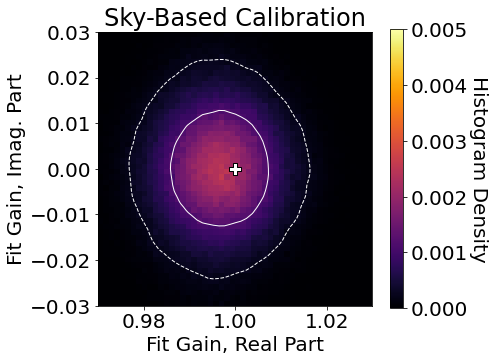

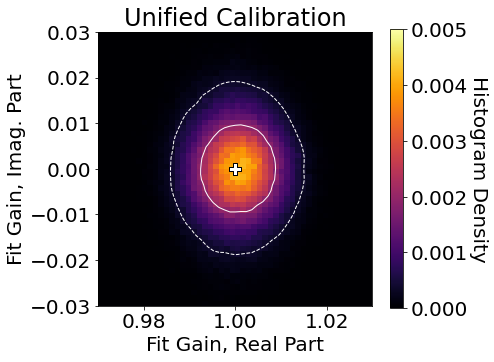

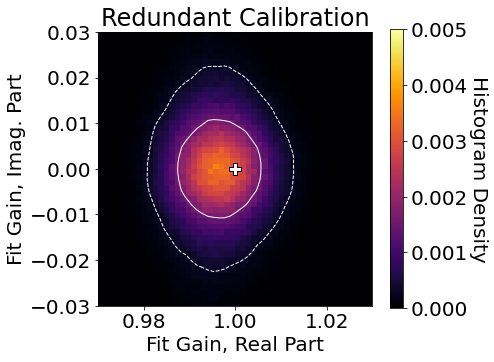

In [195]:
plot_range = .03
colorbar_range = [0, .005]
axis_label = 'Fit Gain'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag+1
save_names = ['sky_cal', 'unified_cal', 'redundant_cal']
titles = ['Sky-Based Calibration', 'Unified Calibration', 'Redundant Calibration']

for data_set_ind in range(3):

    plot_data = gain_vals[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)
    kde, percent_plot = unified_calibration.produce_kde(plot_data, bins_real, bins_imag)

    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    cbar = plt.colorbar()
    cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    plt.contour(
        bins_real, bins_imag, percent_plot, levels=[.5, .9],
        colors='white', linestyles=['solid', 'dashed'], linewidths=1
    )
    plt.scatter(
        [1], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    plt.title(titles[data_set_ind])
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.savefig('{}/{}'.format(save_path, save_names[data_set_ind]), dpi=600)
    plt.show()

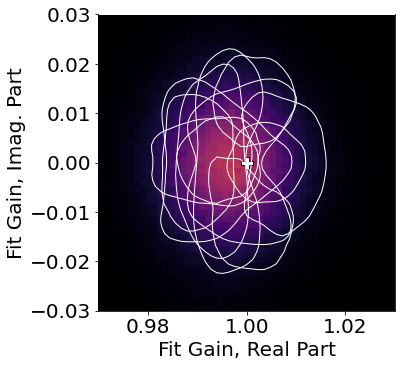

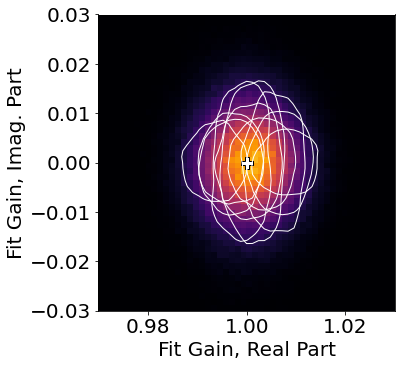

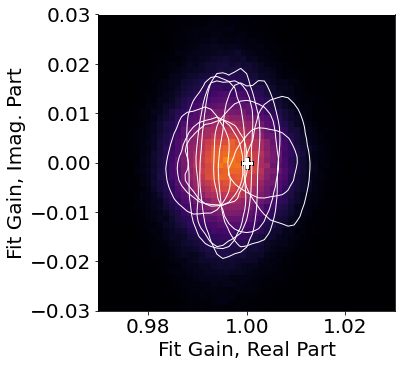

In [198]:
plot_range = .03
colorbar_range = [0, .005]
axis_label = 'Fit Gain'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag+1
save_names = ['sky_cal_model_realizations', 'unified_cal_model_realizations', 'redundant_cal_model_realizations']
titles = ['Sky-Based Calibration', 'Unified Calibration', 'Redundant Calibration']

for data_set_ind in range(3):

    plot_data = gain_vals[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)
    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    #cbar = plt.colorbar()
    #cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    for model_trial in range(10):
        kde, percent_plot = unified_calibration.produce_kde(plot_data[:,model_trial,:], bins_real, bins_imag)
        plt.contour(
            bins_real, bins_imag, percent_plot, levels=[.5],
            colors='white', linestyles=['solid', 'dashed'], linewidths=1
        )
    plt.scatter(
        [1], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    #plt.title(titles[data_set_ind])
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.savefig('{}/{}'.format(save_path, save_names[data_set_ind]), dpi=600)
    plt.show()

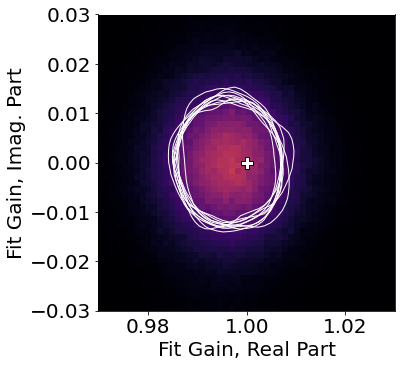

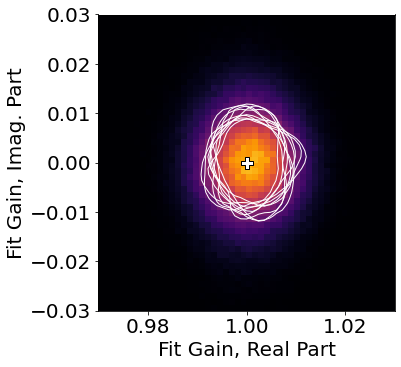

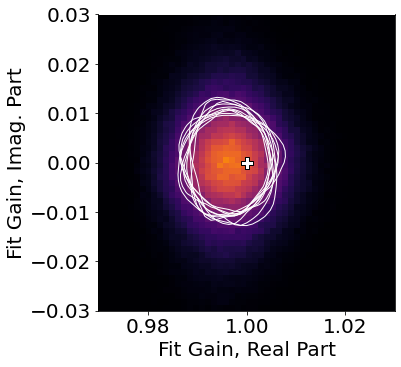

In [199]:
plot_range = .03
colorbar_range = [0, .005]
axis_label = 'Fit Gain'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag+1
save_names = ['sky_cal_data_realizations', 'unified_cal_data_realizations', 'redundant_cal_data_realizations']
titles = ['Sky-Based Calibration', 'Unified Calibration', 'Redundant Calibration']

for data_set_ind in range(3):

    plot_data = gain_vals[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)
    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    #cbar = plt.colorbar()
    #cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    for data_trial in range(10):
        kde, percent_plot = unified_calibration.produce_kde(plot_data[:,:,data_trial], bins_real, bins_imag)
        plt.contour(
            bins_real, bins_imag, percent_plot, levels=[.5],
            colors='white', linestyles=['solid', 'dashed'], linewidths=1
        )
    plt.scatter(
        [1], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    #plt.title(titles[data_set_ind])
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.savefig('{}/{}'.format(save_path, save_names[data_set_ind]), dpi=600)
    plt.show()

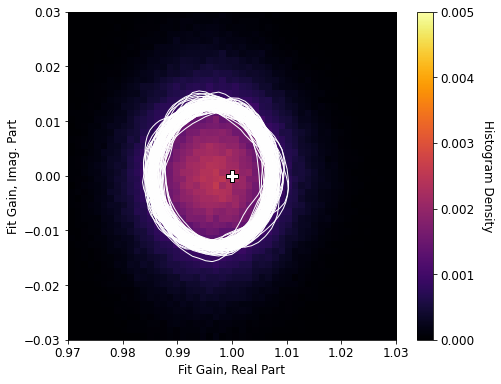

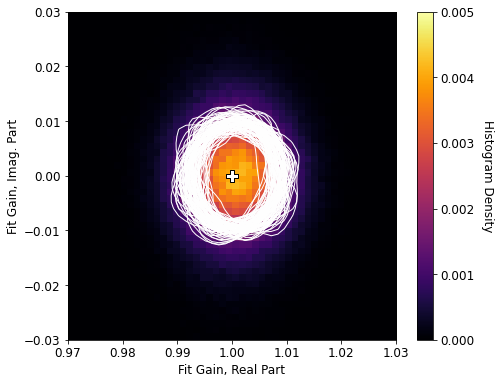

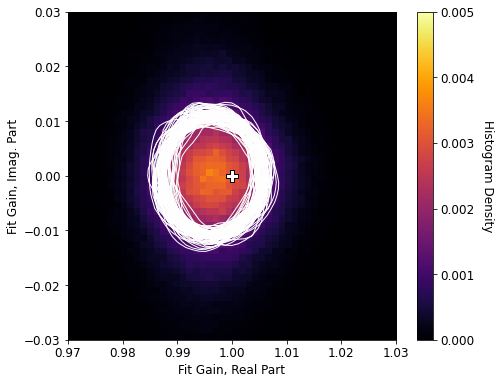

In [20]:
plot_range = .03
colorbar_range = [0, .005]
axis_label = 'Fit Gain'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag+1

for data_set_ind in range(3):

    plot_data = gain_vals[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)

    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    cbar = plt.colorbar()
    cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    for data_trial in range(10):
        kde, percent_plot = unified_calibration.produce_kde(plot_data[:,:,data_trial], bins_real, bins_imag)
        plt.contour(
            bins_real, bins_imag, percent_plot, levels=[.5],
            colors='white', linestyles=['solid', 'dashed'], linewidths=1
        )
    plt.scatter(
        [1], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    #plt.title(title)
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.show()

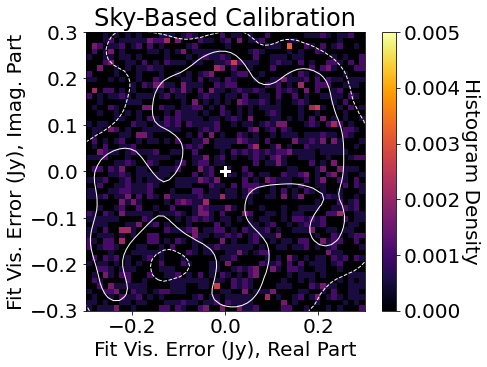

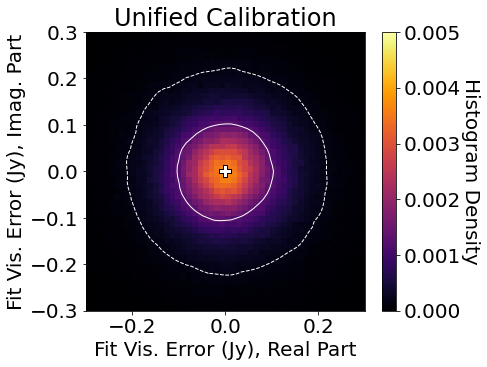

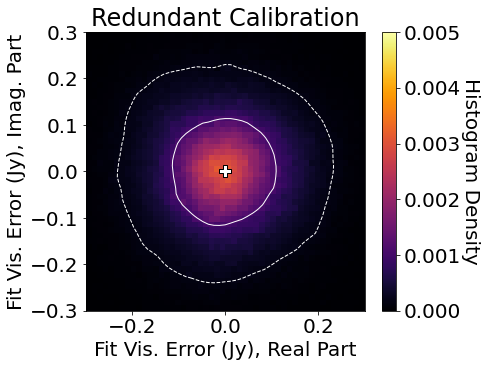

In [203]:
plot_range = .3
colorbar_range = [0, .005]
axis_label = 'Fit Vis. Error (Jy)'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag
titles=['Sky-Based Calibration', 'Unified Calibration', 'Redundant Calibration']
save_names=['sky_vis', 'unified_vis', 'redundant_vis']

for data_set_ind in range(3):

    plot_data = vis_diff_vals[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)
    kde, percent_plot = unified_calibration.produce_kde(plot_data, bins_real, bins_imag)

    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    cbar = plt.colorbar()
    cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    plt.contour(
        bins_real, bins_imag, percent_plot, levels=[.5, .9],
        colors='white', linestyles=['solid', 'dashed'], linewidths=1
    )
    plt.scatter(
        [0], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    plt.title(titles[data_set_ind])
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.savefig('{}/{}'.format(save_path, save_names[data_set_ind]), dpi=600)
    plt.show()

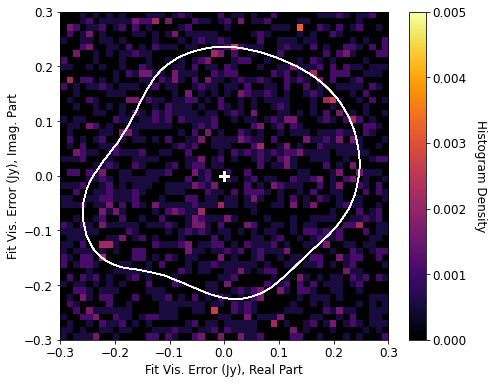

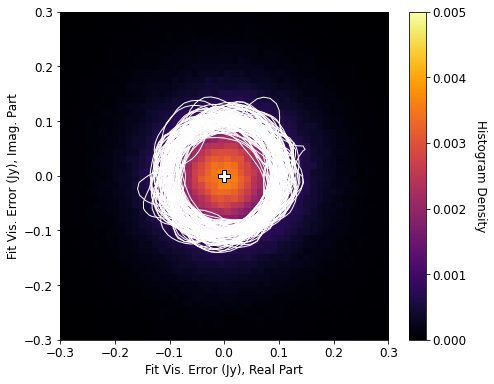

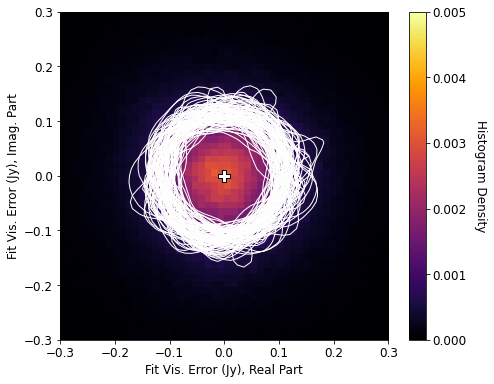

In [21]:
matplotlib.rcParams.update({'font.size': 12})

plot_range = .3
colorbar_range = [0, .005]
axis_label = 'Fit Vis. Error (Jy)'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag

for data_set_ind in range(3):

    plot_data = vis_diff_vals[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)

    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    cbar = plt.colorbar()
    cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    for data_trial in range(100):
        kde, percent_plot = unified_calibration.produce_kde(plot_data[:,:,data_trial], bins_real, bins_imag)
        plt.contour(
            bins_real, bins_imag, percent_plot, levels=[.5],
            colors='white', linestyles=['solid', 'dashed'], linewidths=1
        )
    plt.scatter(
        [0], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    #plt.title(title)
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.show()

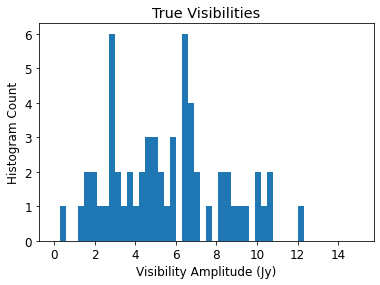

5.575420282504045


In [10]:
plt.hist(np.abs(data_sim_vis_no_noise), bins=50, range=[0,15])
plt.xlabel('Visibility Amplitude (Jy)')
plt.ylabel('Histogram Count')
plt.title('True Visibilities')
plt.show()
print(np.mean(np.abs(data_sim_vis_no_noise)))

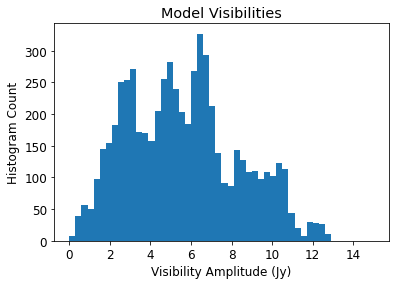

5.596215749625438


In [11]:
plt.hist(np.abs(noisy_model_data.flatten()), bins=50, range=[0,15])
plt.xlabel('Visibility Amplitude (Jy)')
plt.ylabel('Histogram Count')
plt.title('Model Visibilities')
plt.show()
print(np.mean(np.abs(noisy_model_data)))

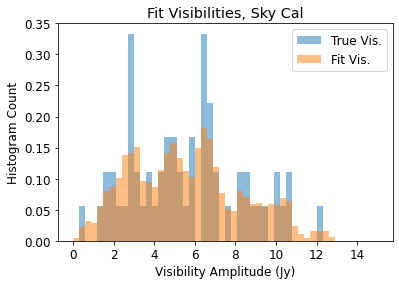

5.596215749625437


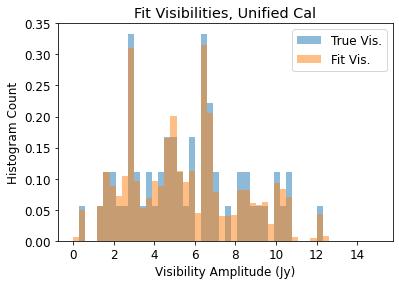

5.572571552512668


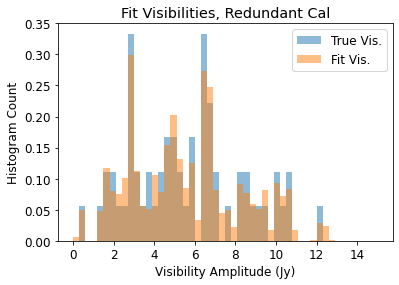

5.618202225189006


In [12]:
fit_visibilities = vis_diff_vals + data_sim_vis_no_noise[:, np.newaxis, np.newaxis, np.newaxis]
titles = ['Sky Cal', 'Unified Cal', 'Redundant Cal']
for ind in range(3):
    plt.hist(np.abs(data_sim_vis_no_noise), bins=50, range=[0,15], alpha=.5, density=True, label='True Vis.')
    plt.hist(np.abs(fit_visibilities[:,:,:,ind].flatten()), bins=50, range=[0,15], alpha=.5, density=True, label='Fit Vis.')
    plt.xlabel('Visibility Amplitude (Jy)')
    plt.ylabel('Histogram Count')
    plt.title('Fit Visibilities, {}'.format(titles[ind]))
    plt.legend()
    plt.show()
    print(np.mean(np.abs(fit_visibilities[:,:,:,ind])))

In [54]:
# Calculate gains analytically
gains_analytic = np.zeros((N_ants, n_trials, n_trials, 3), dtype=np.complex_)
gains_analytic_numerator = np.zeros((N_ants, n_trials, n_trials, 3), dtype=np.complex_)
gains_analytic_denominator = np.zeros((N_ants, n_trials, n_trials, 3), dtype=np.complex_)
for optimize_style_ind in range(3):
    for model_trial in range(n_trials):
        for data_trial in range(n_trials):
            use_gains = gain_vals[:, model_trial, data_trial, optimize_style_ind]
            use_fit_vis = vis_diff_vals[:, model_trial, data_trial, optimize_style_ind] + data_sim_vis_no_noise
            vis_expanded = np.matmul(a_mat, use_fit_vis)
            data_use = noisy_data[:, data_trial]
            gains1_expanded = np.matmul(gains_exp_mat_1, use_gains)
            gains2_expanded = np.matmul(gains_exp_mat_2, use_gains)
            gains_numerator = (
                np.matmul(gains_exp_mat_2.T, np.conj(data_use)*gains1_expanded*vis_expanded)
                + np.matmul(gains_exp_mat_1.T, data_use*gains2_expanded*np.conj(vis_expanded))
            )
            gains_denominator = (
                np.matmul(gains_exp_mat_2.T, np.abs(gains1_expanded*vis_expanded)**2.)
                + np.matmul(gains_exp_mat_1.T, np.abs(np.conj(gains2_expanded)*vis_expanded)**2.)
            )
            gains_analytic_numerator[:, model_trial, data_trial, optimize_style_ind] = gains_numerator
            gains_analytic_denominator[:, model_trial, data_trial, optimize_style_ind] = gains_denominator
            gains_analytic[:, model_trial, data_trial, optimize_style_ind] = gains_numerator/gains_denominator

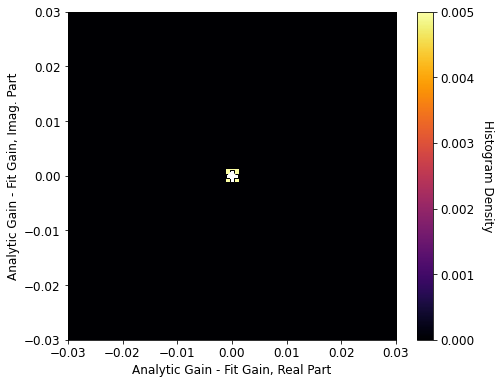

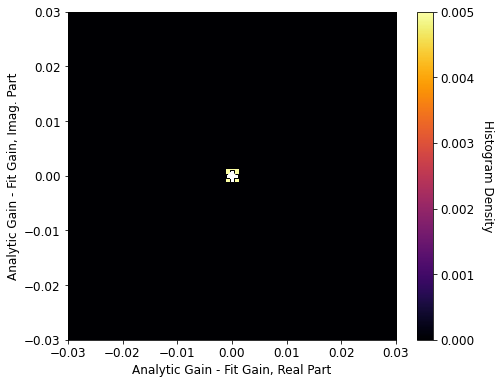

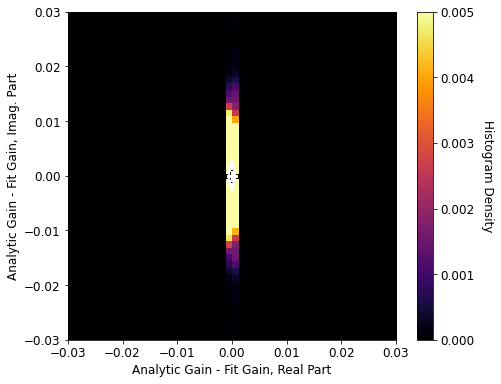

In [43]:
# Plot errors in analytic gain solutions
plot_range = .03
colorbar_range = [0, .005]
axis_label = 'Analytic Gain - Fit Gain'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag

for data_set_ind in range(3):

    plot_data = gains_analytic[:, :, :, data_set_ind] - gain_vals[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)

    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    cbar = plt.colorbar()
    cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    for data_trial in range(100):
        kde, percent_plot = unified_calibration.produce_kde(plot_data[:,:,data_trial], bins_real, bins_imag)
        plt.contour(
            bins_real, bins_imag, percent_plot, levels=[.5],
            colors='white', linestyles=['solid', 'dashed'], linewidths=1
        )
    plt.scatter(
        [0], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    #plt.title(title)
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.show()

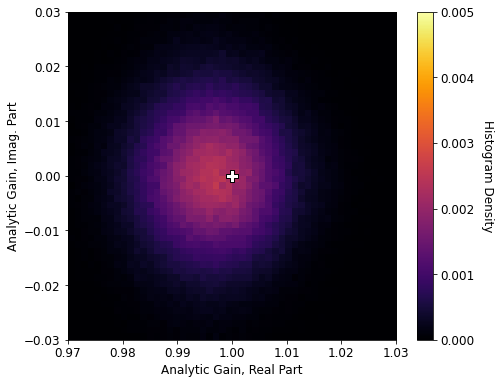

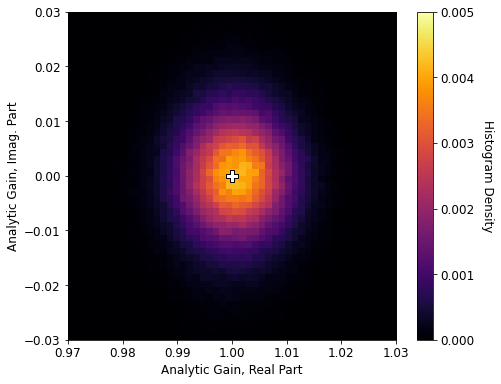

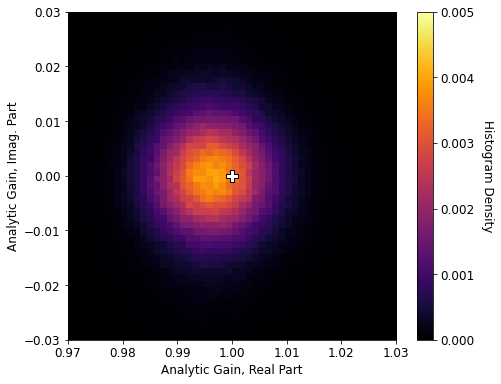

In [51]:
# Plot errors in analytic gain solutions
plot_range = .03
colorbar_range = [0, .005]
axis_label = 'Analytic Gain'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag+1

for data_set_ind in range(3):

    plot_data = gains_analytic[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)

    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    cbar = plt.colorbar()
    cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    plt.scatter(
        [1], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    #plt.title(title)
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.show()

In [55]:
for optimize_style_ind in range(3):
    print(np.mean(np.abs(gains_analytic[:, :, :, optimize_style_ind])))
for optimize_style_ind in range(3):
    print(np.mean(np.abs(gains_analytic_numerator[:, :, :, optimize_style_ind])))
for optimize_style_ind in range(3):
    print(np.mean(np.abs(gains_analytic_denominator[:, :, :, optimize_style_ind])))

0.9964378387678374
1.0004663348015816
0.9963857249390885
1494.820478911364
1499.579280914955
1505.6996851844456
1500.2007192937342
1498.9184118932862
1511.2228779459801


In [56]:
for optimize_style_ind in range(3):
    print(np.mean(np.abs(vis_diff_vals[:, :, :, optimize_style_ind] + data_sim_vis_no_noise[:,np.newaxis,np.newaxis])))

5.596215749625437
5.572571552512668
5.618202225189006


In [58]:
print(1.0004663348015816/0.9963857249390885)
print(5.618202225189006/5.572571552512668)

1.0040954118072523
1.0081884408744404


In [74]:
# Calculate gains analytically to first order
gains_analytic_n0 = np.zeros((N_ants, n_trials, n_trials, 3), dtype=np.complex_)
gains_analytic_numerator_n0 = np.zeros((N_ants, n_trials, n_trials, 3), dtype=np.complex_)
gains_analytic_denominator_n0 = np.zeros((N_ants, n_trials, n_trials, 3), dtype=np.complex_)
for optimize_style_ind in range(3):
    for model_trial in range(n_trials):
        for data_trial in range(n_trials):
            use_gains = np.ones(N_ants)  # Set gains to 1
            use_fit_vis = vis_diff_vals[:, model_trial, data_trial, optimize_style_ind] + data_sim_vis_no_noise
            vis_expanded = np.matmul(a_mat, use_fit_vis)
            data_use = noisy_data[:, data_trial]
            gains1_expanded = np.matmul(gains_exp_mat_1, use_gains)
            gains2_expanded = np.matmul(gains_exp_mat_2, use_gains)
            gains_numerator = (
                np.matmul(gains_exp_mat_2.T, np.conj(data_use)*gains1_expanded*vis_expanded)
                + np.matmul(gains_exp_mat_1.T, data_use*gains2_expanded*np.conj(vis_expanded))
            )
            gains_denominator = (
                np.matmul(gains_exp_mat_2.T, np.abs(gains1_expanded*vis_expanded)**2.)
                + np.matmul(gains_exp_mat_1.T, np.abs(np.conj(gains2_expanded)*vis_expanded)**2.)
            )
            gains_analytic_numerator_n0[:, model_trial, data_trial, optimize_style_ind] = gains_numerator
            gains_analytic_denominator_n0[:, model_trial, data_trial, optimize_style_ind] = gains_denominator
            gains_analytic_n0[:, model_trial, data_trial, optimize_style_ind] = gains_numerator/gains_denominator

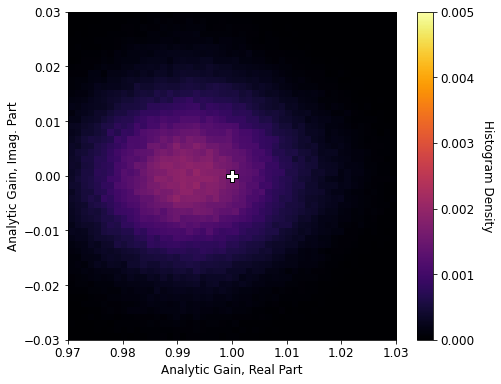

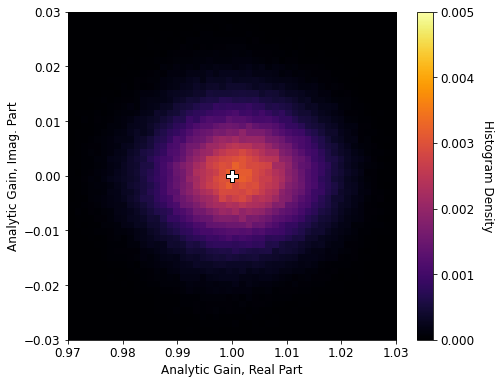

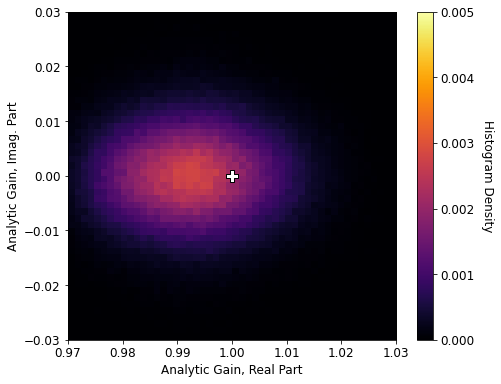

In [75]:
# Plot errors in first-order analytic gain solutions
plot_range = .03
colorbar_range = [0, .005]
axis_label = 'Analytic Gain'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag+1

for data_set_ind in range(3):

    plot_data = gains_analytic_n0[:, :, :, data_set_ind]
    hist, x_edges, y_edges = np.histogram2d(
        np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
        bins=[bins_real, bins_imag]
    )
    hist /= np.sum(hist)

    plt.figure(figsize=[7, 5.5])
    plt.imshow(
        hist.T, interpolation='none', origin='lower',
        extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
        vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
        cmap='inferno'
    )
    cbar = plt.colorbar()
    cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
    plt.scatter(
        [1], [0], marker='P', color='white', edgecolors='black', s=150
    )

    plt.xlabel('{}, Real Part'.format(axis_label))
    plt.ylabel('{}, Imag. Part'.format(axis_label))
    #plt.title(title)
    plt.tight_layout()  # Ensure that axes labels don't get cut off
    plt.show()

In [76]:
for optimize_style_ind in range(3):
    print(np.mean(np.abs(gains_analytic_numerator_n0[:, :, :, optimize_style_ind])))

1500.0204513910105
1498.818497251292
1511.071702728647


In [77]:
for optimize_style_ind in range(3):
    print(np.mean(np.abs(gains_analytic_denominator_n0[:, :, :, optimize_style_ind])))

1511.0310711667994
1497.6167772725012
1522.223481589559


In [78]:
np.mean(np.abs(gains_analytic_denominator_n0[:, :, :, :]), axis=(0,1,2))

array([1511.03107117, 1497.61677727, 1522.22348159])

In [95]:
print(np.mean(np.abs(noisy_data[:, :])))
print(np.mean(np.abs(vis_diff_vals[:, :, :, 0] + data_sim_vis_no_noise[:,np.newaxis,np.newaxis])))
print(np.mean(np.abs(vis_diff_vals[:, :, :, 1] + data_sim_vis_no_noise[:,np.newaxis,np.newaxis])))
print(np.mean(np.abs(vis_diff_vals[:, :, :, 2] + data_sim_vis_no_noise[:,np.newaxis,np.newaxis])))

print(np.abs(np.mean(vis_diff_vals[:, :, :, 0] + data_sim_vis_no_noise[:,np.newaxis,np.newaxis])))
print(np.abs(np.mean(vis_diff_vals[:, :, :, 1] + data_sim_vis_no_noise[:,np.newaxis,np.newaxis])))
print(np.abs(np.mean(vis_diff_vals[:, :, :, 2] + data_sim_vis_no_noise[:,np.newaxis,np.newaxis])))

5.873814467949694
5.596215749625437
5.572571552512668
5.618202225189006
0.5608093190942409
0.5635753073092546
0.5680285060541608


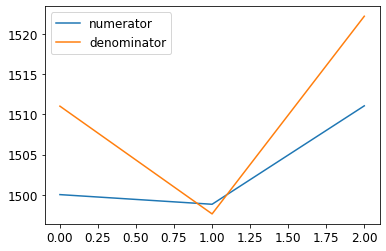

In [79]:
plt.plot(list(range(3)), np.mean(np.abs(gains_analytic_numerator_n0[:, :, :, :]), axis=(0,1,2)), label='numerator')
plt.plot(list(range(3)), np.mean(np.abs(gains_analytic_denominator_n0[:, :, :, :]), axis=(0,1,2)), label='denominator')
plt.legend()
plt.show()

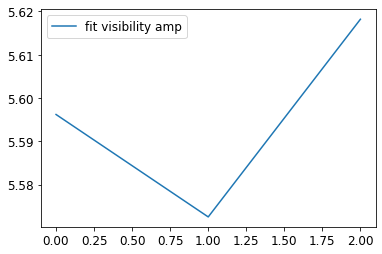

In [84]:
plt.plot(
    list(range(3)), 
    np.mean(np.abs(vis_diff_vals[:, :, :, :] + data_sim_vis_no_noise[:,np.newaxis,np.newaxis,np.newaxis]), axis=(0,1,2)),
    label='fit visibility amp'
)
plt.legend()
plt.show()

In [132]:
gain_vals_red_cal_limit = np.zeros((N_ants, n_trials, n_trials, 1), dtype=np.complex_)
vis_diff_vals_red_cal_limit = np.zeros((N_red_baselines, n_trials, n_trials, 1), dtype=np.complex_)

for model_trial in range(n_trials):
    use_model = noisy_model_data[:, model_trial]
    for data_trial in range(n_trials):
        use_data = noisy_data[:, data_trial]
        optimize_function_name = unified_calibration.optimize_unified_cal
        gains_fit, vis_fit = optimize_function_name(
            use_data, use_model,
            baseline_cov_inv, a_mat, gains_exp_mat_1, gains_exp_mat_2,
            N_red_baselines, N_ants, data_stddev, model_stddev*1e5,
            ant_locs,
            gains_init=None,
            fitted_visibilities_init=use_model,
            
        )
        gain_vals_red_cal_limit[:, model_trial, data_trial, 0] = gains_fit
        vis_diff_vals_red_cal_limit[:, model_trial, data_trial, 0] = vis_fit-data_sim_vis_no_noise

         Current function value: 1077.173242
         Iterations: 377
         Function evaluations: 729
         Gradient evaluations: 717
         Current function value: 1117.834260
         Iterations: 398
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 1112.184797
         Iterations: 370
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 1016.020174
         Iterations: 372
         Function evaluations: 699
         Gradient evaluations: 687
         Current function value: 1037.438421
         Iterations: 348
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1091.009744
         Iterations: 351
         Function evaluations: 682
         Gradient evaluations: 670
         Current function value: 1089.114873
         Iterations: 379
         Function evaluations: 704
         Gradient evaluations: 692
         Current fun

         Current function value: 1154.551258
         Iterations: 350
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 1117.933027
         Iterations: 414
         Function evaluations: 714
         Gradient evaluations: 713
         Current function value: 1055.292120
         Iterations: 363
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1039.434331
         Iterations: 358
         Function evaluations: 700
         Gradient evaluations: 688
         Current function value: 1055.805234
         Iterations: 322
         Function evaluations: 567
         Gradient evaluations: 566
         Current function value: 1028.824858
         Iterations: 334
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1011.168838
         Iterations: 408
         Function evaluations: 716
         Gradient evaluations: 715
         Current fun

         Current function value: 1150.347755
         Iterations: 298
         Function evaluations: 537
         Gradient evaluations: 536
         Current function value: 1003.093252
         Iterations: 347
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 1059.064181
         Iterations: 344
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 1009.189672
         Iterations: 382
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 1060.645499
         Iterations: 391
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 1072.781712
         Iterations: 391
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 1097.452711
         Iterations: 378
         Function evaluations: 667
         Gradient evaluations: 666
         Current fun

         Current function value: 1099.844575
         Iterations: 384
         Function evaluations: 739
         Gradient evaluations: 727
         Current function value: 1065.057606
         Iterations: 336
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 970.760058
         Iterations: 307
         Function evaluations: 557
         Gradient evaluations: 556
         Current function value: 1021.858919
         Iterations: 343
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 1077.665812
         Iterations: 350
         Function evaluations: 696
         Gradient evaluations: 684
         Current function value: 1053.186919
         Iterations: 430
         Function evaluations: 744
         Gradient evaluations: 743
         Current function value: 1066.046648
         Iterations: 340
         Function evaluations: 594
         Gradient evaluations: 593
         Current func

         Current function value: 1026.598652
         Iterations: 373
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 1115.077602
         Iterations: 356
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1065.578582
         Iterations: 381
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 1020.025391
         Iterations: 341
         Function evaluations: 663
         Gradient evaluations: 661
         Current function value: 1025.110794
         Iterations: 340
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 1058.487171
         Iterations: 374
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1023.293947
         Iterations: 390
         Function evaluations: 726
         Gradient evaluations: 714
         Current fun

         Current function value: 1115.617980
         Iterations: 391
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1072.688657
         Iterations: 330
         Function evaluations: 582
         Gradient evaluations: 581
         Current function value: 1100.401066
         Iterations: 457
         Function evaluations: 780
         Gradient evaluations: 779
         Current function value: 1206.869289
         Iterations: 392
         Function evaluations: 729
         Gradient evaluations: 717
         Current function value: 1118.563372
         Iterations: 410
         Function evaluations: 710
         Gradient evaluations: 709
         Current function value: 1077.173242
         Iterations: 393
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 1117.834260
         Iterations: 326
         Function evaluations: 587
         Gradient evaluations: 586
         Current fun

         Current function value: 1108.746483
         Iterations: 307
         Function evaluations: 544
         Gradient evaluations: 543
         Current function value: 1096.074917
         Iterations: 400
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 1019.046972
         Iterations: 381
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1189.814158
         Iterations: 338
         Function evaluations: 585
         Gradient evaluations: 584
         Current function value: 1077.505184
         Iterations: 364
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1154.551258
         Iterations: 434
         Function evaluations: 839
         Gradient evaluations: 827
         Current function value: 1117.933027
         Iterations: 389
         Function evaluations: 674
         Gradient evaluations: 673
         Current fun

         Current function value: 1012.054501
         Iterations: 341
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 1084.711800
         Iterations: 367
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1071.366568
         Iterations: 351
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 1109.098854
         Iterations: 345
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 1077.082982
         Iterations: 379
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1150.347755
         Iterations: 374
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1003.093252
         Iterations: 406
         Function evaluations: 702
         Gradient evaluations: 701
         Current fun

         Current function value: 1035.988866
         Iterations: 378
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 1086.049354
         Iterations: 337
         Function evaluations: 593
         Gradient evaluations: 592
         Current function value: 1024.999698
         Iterations: 342
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 1088.171494
         Iterations: 405
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1041.226642
         Iterations: 351
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 1099.844575
         Iterations: 357
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1065.057606
         Iterations: 395
         Function evaluations: 774
         Gradient evaluations: 762
         Current fun

         Current function value: 1080.447863
         Iterations: 377
         Function evaluations: 747
         Gradient evaluations: 736
         Current function value: 1068.992561
         Iterations: 332
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1009.323344
         Iterations: 315
         Function evaluations: 611
         Gradient evaluations: 609
         Current function value: 1003.302320
         Iterations: 379
         Function evaluations: 744
         Gradient evaluations: 732
         Current function value: 1090.575055
         Iterations: 325
         Function evaluations: 574
         Gradient evaluations: 573
         Current function value: 1026.598652
         Iterations: 362
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 1115.077602
         Iterations: 398
         Function evaluations: 685
         Gradient evaluations: 684
         Current fun

         Current function value: 1095.729650
         Iterations: 337
         Function evaluations: 582
         Gradient evaluations: 581
         Current function value: 1047.879360
         Iterations: 366
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1066.257298
         Iterations: 414
         Function evaluations: 778
         Gradient evaluations: 766
         Current function value: 1047.032367
         Iterations: 297
         Function evaluations: 530
         Gradient evaluations: 529
         Current function value: 1042.985578
         Iterations: 417
         Function evaluations: 723
         Gradient evaluations: 722
         Current function value: 1115.617980
         Iterations: 376
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1072.688657
         Iterations: 319
         Function evaluations: 632
         Gradient evaluations: 620
         Current fun

         Current function value: 1036.170691
         Iterations: 402
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1163.428118
         Iterations: 366
         Function evaluations: 730
         Gradient evaluations: 718
         Current function value: 997.891032
         Iterations: 401
         Function evaluations: 688
         Gradient evaluations: 687
         Current function value: 1073.453770
         Iterations: 345
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 1001.392653
         Iterations: 432
         Function evaluations: 744
         Gradient evaluations: 743
         Current function value: 1108.746483
         Iterations: 451
         Function evaluations: 772
         Gradient evaluations: 771
         Current function value: 1096.074917
         Iterations: 333
         Function evaluations: 580
         Gradient evaluations: 579
         Current func

         Current function value: 1118.980452
         Iterations: 368
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 1087.981110
         Iterations: 322
         Function evaluations: 622
         Gradient evaluations: 611
         Current function value: 1006.497723
         Iterations: 359
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 1074.616596
         Iterations: 415
         Function evaluations: 723
         Gradient evaluations: 722
         Current function value: 1035.046546
         Iterations: 405
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 1012.054501
         Iterations: 388
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 1084.711800
         Iterations: 362
         Function evaluations: 640
         Gradient evaluations: 639
         Current fun

         Current function value: 1075.934154
         Iterations: 384
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 964.759136
         Iterations: 438
         Function evaluations: 753
         Gradient evaluations: 752
         Current function value: 1023.011519
         Iterations: 396
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1133.176496
         Iterations: 312
         Function evaluations: 568
         Gradient evaluations: 567
         Current function value: 1119.611571
         Iterations: 413
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 1035.988866
         Iterations: 451
         Function evaluations: 784
         Gradient evaluations: 783
         Current function value: 1086.049354
         Iterations: 345
         Function evaluations: 604
         Gradient evaluations: 603
         Current func

         Current function value: 1049.760791
         Iterations: 379
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1042.296792
         Iterations: 393
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 1135.901327
         Iterations: 386
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1140.217134
         Iterations: 385
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1100.635847
         Iterations: 405
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 1080.447863
         Iterations: 417
         Function evaluations: 773
         Gradient evaluations: 761
         Current function value: 1068.992561
         Iterations: 357
         Function evaluations: 624
         Gradient evaluations: 623
         Current fun

         Current function value: 1053.174863
         Iterations: 381
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1046.929326
         Iterations: 427
         Function evaluations: 727
         Gradient evaluations: 726
         Current function value: 1105.161769
         Iterations: 438
         Function evaluations: 739
         Gradient evaluations: 738
         Current function value: 1061.728647
         Iterations: 388
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1055.675195
         Iterations: 335
         Function evaluations: 581
         Gradient evaluations: 580
         Current function value: 1095.729650
         Iterations: 379
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 1047.879360
         Iterations: 347
         Function evaluations: 682
         Gradient evaluations: 670
         Current fun

         Current function value: 1073.641727
         Iterations: 387
         Function evaluations: 731
         Gradient evaluations: 719
         Current function value: 1063.567606
         Iterations: 390
         Function evaluations: 733
         Gradient evaluations: 721
         Current function value: 1093.658163
         Iterations: 404
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 1047.223593
         Iterations: 388
         Function evaluations: 684
         Gradient evaluations: 683
         Current function value: 1070.422365
         Iterations: 368
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1036.170691
         Iterations: 430
         Function evaluations: 751
         Gradient evaluations: 750
         Current function value: 1163.428118
         Iterations: 397
         Function evaluations: 710
         Gradient evaluations: 709
         Current fun

         Current function value: 1043.337602
         Iterations: 367
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1058.462370
         Iterations: 402
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1105.458948
         Iterations: 363
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 1058.283706
         Iterations: 357
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 1173.479596
         Iterations: 362
         Function evaluations: 649
         Gradient evaluations: 648
         Current function value: 1118.980452
         Iterations: 358
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1087.981110
         Iterations: 438
         Function evaluations: 746
         Gradient evaluations: 745
         Current fun

         Current function value: 1112.184797
         Iterations: 360
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1016.020174
         Iterations: 367
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1037.438421
         Iterations: 371
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1091.009744
         Iterations: 389
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1089.114873
         Iterations: 375
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 1075.934154
         Iterations: 330
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 964.759136
         Iterations: 436
         Function evaluations: 742
         Gradient evaluations: 741
         Current func

         Current function value: 1055.292120
         Iterations: 354
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1039.434331
         Iterations: 425
         Function evaluations: 730
         Gradient evaluations: 729
         Current function value: 1055.805234
         Iterations: 395
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 1028.824858
         Iterations: 392
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1011.168838
         Iterations: 379
         Function evaluations: 674
         Gradient evaluations: 673
         Current function value: 1049.760791
         Iterations: 351
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 1042.296792
         Iterations: 388
         Function evaluations: 688
         Gradient evaluations: 687
         Current fun

         Current function value: 1059.064181
         Iterations: 359
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 1009.189672
         Iterations: 330
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 1060.645499
         Iterations: 356
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1072.781712
         Iterations: 331
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 1097.452711
         Iterations: 337
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 1053.174863
         Iterations: 432
         Function evaluations: 726
         Gradient evaluations: 725
         Current function value: 1046.929326
         Iterations: 351
         Function evaluations: 600
         Gradient evaluations: 599
         Current fun

         Current function value: 970.760058
         Iterations: 358
         Function evaluations: 742
         Gradient evaluations: 730
         Current function value: 1021.858919
         Iterations: 325
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1077.665812
         Iterations: 371
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1053.186919
         Iterations: 354
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1066.046648
         Iterations: 410
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1073.641727
         Iterations: 507
         Function evaluations: 905
         Gradient evaluations: 893
         Current function value: 1063.567606
         Iterations: 337
         Function evaluations: 605
         Gradient evaluations: 604
         Current func

         Current function value: 1065.578582
         Iterations: 387
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1020.025391
         Iterations: 339
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 1025.110794
         Iterations: 400
         Function evaluations: 767
         Gradient evaluations: 755
         Current function value: 1058.487171
         Iterations: 321
         Function evaluations: 569
         Gradient evaluations: 568
         Current function value: 1023.293947
         Iterations: 366
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1043.337602
         Iterations: 321
         Function evaluations: 556
         Gradient evaluations: 555
         Current function value: 1058.462370
         Iterations: 334
         Function evaluations: 589
         Gradient evaluations: 588
         Current fun

         Current function value: 1100.401066
         Iterations: 398
         Function evaluations: 723
         Gradient evaluations: 711
         Current function value: 1206.869289
         Iterations: 350
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1118.563372
         Iterations: 416
         Function evaluations: 780
         Gradient evaluations: 768
         Current function value: 1077.173242
         Iterations: 339
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 1117.834260
         Iterations: 420
         Function evaluations: 789
         Gradient evaluations: 778
         Current function value: 1112.184797
         Iterations: 369
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1016.020174
         Iterations: 391
         Function evaluations: 730
         Gradient evaluations: 718
         Current fun

         Current function value: 1019.046972
         Iterations: 379
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1189.814158
         Iterations: 366
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 1077.505184
         Iterations: 422
         Function evaluations: 725
         Gradient evaluations: 724
         Current function value: 1154.551258
         Iterations: 343
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 1117.933027
         Iterations: 287
         Function evaluations: 525
         Gradient evaluations: 524
         Current function value: 1055.292120
         Iterations: 371
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 1039.434331
         Iterations: 416
         Function evaluations: 763
         Gradient evaluations: 751
         Current fun

         Current function value: 1071.366568
         Iterations: 367
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1109.098854
         Iterations: 372
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 1077.082982
         Iterations: 347
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 1150.347755
         Iterations: 364
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 1003.093252
         Iterations: 484
         Function evaluations: 830
         Gradient evaluations: 829
         Current function value: 1059.064181
         Iterations: 341
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1009.189672
         Iterations: 357
         Function evaluations: 667
         Gradient evaluations: 655
         Current fun

         Current function value: 1024.999698
         Iterations: 421
         Function evaluations: 803
         Gradient evaluations: 792
         Current function value: 1088.171494
         Iterations: 377
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1041.226642
         Iterations: 392
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 1099.844575
         Iterations: 341
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 1065.057606
         Iterations: 405
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 970.760058
         Iterations: 416
         Function evaluations: 716
         Gradient evaluations: 715
         Current function value: 1021.858919
         Iterations: 390
         Function evaluations: 736
         Gradient evaluations: 724
         Current func

         Current function value: 1009.323344
         Iterations: 423
         Function evaluations: 723
         Gradient evaluations: 722
         Current function value: 1003.302320
         Iterations: 390
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 1090.575055
         Iterations: 391
         Function evaluations: 769
         Gradient evaluations: 756
         Current function value: 1026.598652
         Iterations: 376
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1115.077602
         Iterations: 346
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 1065.578582
         Iterations: 407
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1020.025391
         Iterations: 315
         Function evaluations: 548
         Gradient evaluations: 547
         Current fun

         Current function value: 1066.257298
         Iterations: 392
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1047.032367
         Iterations: 329
         Function evaluations: 572
         Gradient evaluations: 571
         Current function value: 1042.985578
         Iterations: 416
         Function evaluations: 790
         Gradient evaluations: 778
         Current function value: 1115.617980
         Iterations: 333
         Function evaluations: 581
         Gradient evaluations: 580
         Current function value: 1072.688657
         Iterations: 368
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1100.401066
         Iterations: 369
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 1206.869289
         Iterations: 451
         Function evaluations: 759
         Gradient evaluations: 758
         Current fun

         Current function value: 997.891032
         Iterations: 347
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 1073.453770
         Iterations: 331
         Function evaluations: 647
         Gradient evaluations: 635
         Current function value: 1001.392653
         Iterations: 356
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1108.746483
         Iterations: 412
         Function evaluations: 732
         Gradient evaluations: 731
         Current function value: 1096.074917
         Iterations: 375
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1019.046972
         Iterations: 394
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 1189.814158
         Iterations: 389
         Function evaluations: 680
         Gradient evaluations: 679
         Current func

         Current function value: 1006.497723
         Iterations: 336
         Function evaluations: 595
         Gradient evaluations: 594
         Current function value: 1074.616596
         Iterations: 316
         Function evaluations: 576
         Gradient evaluations: 575
         Current function value: 1035.046546
         Iterations: 365
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 1012.054501
         Iterations: 400
         Function evaluations: 714
         Gradient evaluations: 713
         Current function value: 1084.711800
         Iterations: 323
         Function evaluations: 564
         Gradient evaluations: 563
         Current function value: 1071.366568
         Iterations: 418
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 1109.098854
         Iterations: 433
         Function evaluations: 717
         Gradient evaluations: 716
         Current fun

         Current function value: 1023.011519
         Iterations: 364
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 1133.176496
         Iterations: 394
         Function evaluations: 771
         Gradient evaluations: 759
         Current function value: 1119.611571
         Iterations: 403
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1035.988866
         Iterations: 365
         Function evaluations: 715
         Gradient evaluations: 703
         Current function value: 1086.049354
         Iterations: 349
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 1024.999698
         Iterations: 373
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 1088.171494
         Iterations: 357
         Function evaluations: 621
         Gradient evaluations: 620
         Current fun

         Current function value: 1135.901327
         Iterations: 410
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 1140.217134
         Iterations: 312
         Function evaluations: 572
         Gradient evaluations: 571
         Current function value: 1100.635847
         Iterations: 383
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 1080.447863
         Iterations: 332
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 1068.992561
         Iterations: 403
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1009.323344
         Iterations: 362
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 1003.302320
         Iterations: 391
         Function evaluations: 675
         Gradient evaluations: 674
         Current fun

         Current function value: 1105.161769
         Iterations: 343
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 1061.728647
         Iterations: 383
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1055.675195
         Iterations: 383
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1095.729650
         Iterations: 319
         Function evaluations: 571
         Gradient evaluations: 570
         Current function value: 1047.879360
         Iterations: 392
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 1066.257298
         Iterations: 415
         Function evaluations: 725
         Gradient evaluations: 724
         Current function value: 1047.032367
         Iterations: 391
         Function evaluations: 686
         Gradient evaluations: 685
         Current fun

         Current function value: 1093.658163
         Iterations: 407
         Function evaluations: 729
         Gradient evaluations: 717
         Current function value: 1047.223593
         Iterations: 344
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 1070.422365
         Iterations: 342
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1036.170691
         Iterations: 402
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 1163.428118
         Iterations: 314
         Function evaluations: 561
         Gradient evaluations: 560
         Current function value: 997.891032
         Iterations: 386
         Function evaluations: 724
         Gradient evaluations: 712
         Current function value: 1073.453770
         Iterations: 384
         Function evaluations: 688
         Gradient evaluations: 687
         Current func

         Current function value: 1105.458948
         Iterations: 437
         Function evaluations: 786
         Gradient evaluations: 774
         Current function value: 1058.283706
         Iterations: 372
         Function evaluations: 754
         Gradient evaluations: 741
         Current function value: 1173.479596
         Iterations: 328
         Function evaluations: 598
         Gradient evaluations: 597
         Current function value: 1118.980452
         Iterations: 290
         Function evaluations: 523
         Gradient evaluations: 522
         Current function value: 1087.981110
         Iterations: 380
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1006.497723
         Iterations: 406
         Function evaluations: 780
         Gradient evaluations: 767
         Current function value: 1074.616596
         Iterations: 371
         Function evaluations: 707
         Gradient evaluations: 697
         Current fun

         Current function value: 1037.438421
         Iterations: 329
         Function evaluations: 565
         Gradient evaluations: 564
         Current function value: 1091.009744
         Iterations: 371
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1089.114873
         Iterations: 341
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 1075.934154
         Iterations: 386
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 964.759136
         Iterations: 407
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 1023.011519
         Iterations: 407
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 1133.176496
         Iterations: 402
         Function evaluations: 735
         Gradient evaluations: 723
         Current func

         Current function value: 1055.805234
         Iterations: 336
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1028.824858
         Iterations: 380
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1011.168838
         Iterations: 391
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1049.760791
         Iterations: 370
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 1042.296792
         Iterations: 375
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1135.901327
         Iterations: 387
         Function evaluations: 740
         Gradient evaluations: 728
         Current function value: 1140.217134
         Iterations: 365
         Function evaluations: 629
         Gradient evaluations: 628
         Current fun

         Current function value: 1060.645499
         Iterations: 375
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1072.781712
         Iterations: 384
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 1097.452711
         Iterations: 416
         Function evaluations: 777
         Gradient evaluations: 765
         Current function value: 1053.174863
         Iterations: 355
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 1046.929326
         Iterations: 388
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 1105.161769
         Iterations: 346
         Function evaluations: 593
         Gradient evaluations: 592
         Current function value: 1061.728647
         Iterations: 388
         Function evaluations: 716
         Gradient evaluations: 704
         Current fun

         Current function value: 1077.665812
         Iterations: 334
         Function evaluations: 585
         Gradient evaluations: 584
         Current function value: 1053.186919
         Iterations: 383
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1066.046648
         Iterations: 316
         Function evaluations: 559
         Gradient evaluations: 558
         Current function value: 1073.641727
         Iterations: 353
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 1063.567606
         Iterations: 355
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1093.658163
         Iterations: 419
         Function evaluations: 721
         Gradient evaluations: 720
         Current function value: 1047.223593
         Iterations: 391
         Function evaluations: 738
         Gradient evaluations: 726
         Current fun

         Current function value: 1025.110794
         Iterations: 351
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 1058.487171
         Iterations: 348
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 1023.293947
         Iterations: 389
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 1043.337602
         Iterations: 438
         Function evaluations: 820
         Gradient evaluations: 808
         Current function value: 1058.462370
         Iterations: 353
         Function evaluations: 656
         Gradient evaluations: 644
         Current function value: 1105.458948
         Iterations: 406
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 1058.283706
         Iterations: 369
         Function evaluations: 643
         Gradient evaluations: 642
         Current fun

         Current function value: 1118.563372
         Iterations: 339
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 1077.173242
         Iterations: 331
         Function evaluations: 571
         Gradient evaluations: 570
         Current function value: 1117.834260
         Iterations: 301
         Function evaluations: 550
         Gradient evaluations: 549
         Current function value: 1112.184797
         Iterations: 332
         Function evaluations: 666
         Gradient evaluations: 664
         Current function value: 1016.020174
         Iterations: 327
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 1037.438421
         Iterations: 338
         Function evaluations: 597
         Gradient evaluations: 596
         Current function value: 1091.009744
         Iterations: 387
         Function evaluations: 724
         Gradient evaluations: 712
         Current fun

         Current function value: 1077.505184
         Iterations: 379
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1154.551258
         Iterations: 354
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 1117.933027
         Iterations: 327
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 1055.292120
         Iterations: 308
         Function evaluations: 537
         Gradient evaluations: 536
         Current function value: 1039.434331
         Iterations: 354
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1055.805234
         Iterations: 409
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 1028.824858
         Iterations: 433
         Function evaluations: 818
         Gradient evaluations: 806
         Current fun

         Current function value: 1077.082982
         Iterations: 379
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1150.347755
         Iterations: 370
         Function evaluations: 668
         Gradient evaluations: 657
         Current function value: 1003.093252
         Iterations: 409
         Function evaluations: 749
         Gradient evaluations: 738
         Current function value: 1059.064181
         Iterations: 312
         Function evaluations: 554
         Gradient evaluations: 553
         Current function value: 1009.189672
         Iterations: 376
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 1060.645499
         Iterations: 329
         Function evaluations: 572
         Gradient evaluations: 571
         Current function value: 1072.781712
         Iterations: 375
         Function evaluations: 653
         Gradient evaluations: 652
         Current fun

         Current function value: 1041.226642
         Iterations: 385
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 1099.844575
         Iterations: 385
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1065.057606
         Iterations: 417
         Function evaluations: 768
         Gradient evaluations: 756
         Current function value: 970.760058
         Iterations: 411
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 1021.858919
         Iterations: 450
         Function evaluations: 769
         Gradient evaluations: 768
         Current function value: 1077.665812
         Iterations: 338
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 1053.186919
         Iterations: 457
         Function evaluations: 819
         Gradient evaluations: 807
         Current func

         Current function value: 1090.575055
         Iterations: 366
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 1026.598652
         Iterations: 375
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 1115.077602
         Iterations: 443
         Function evaluations: 757
         Gradient evaluations: 756
         Current function value: 1065.578582
         Iterations: 404
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1020.025391
         Iterations: 360
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1025.110794
         Iterations: 351
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1058.487171
         Iterations: 346
         Function evaluations: 661
         Gradient evaluations: 649
         Current fun

         Current function value: 1042.985578
         Iterations: 349
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 1115.617980
         Iterations: 456
         Function evaluations: 785
         Gradient evaluations: 784
         Current function value: 1072.688657
         Iterations: 357
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 1100.401066
         Iterations: 418
         Function evaluations: 723
         Gradient evaluations: 722
         Current function value: 1206.869289
         Iterations: 334
         Function evaluations: 630
         Gradient evaluations: 618
         Current function value: 1118.563372
         Iterations: 350
         Function evaluations: 662
         Gradient evaluations: 650
         Current function value: 1077.173242
         Iterations: 340
         Function evaluations: 602
         Gradient evaluations: 601
         Current fun

         Current function value: 1001.392653
         Iterations: 402
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1108.746483
         Iterations: 384
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1096.074917
         Iterations: 363
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 1019.046972
         Iterations: 340
         Function evaluations: 692
         Gradient evaluations: 680
         Current function value: 1189.814158
         Iterations: 376
         Function evaluations: 715
         Gradient evaluations: 703
         Current function value: 1077.505184
         Iterations: 430
         Function evaluations: 740
         Gradient evaluations: 739
         Current function value: 1154.551258
         Iterations: 372
         Function evaluations: 662
         Gradient evaluations: 661
         Current fun

         Current function value: 1035.046546
         Iterations: 350
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 1012.054501
         Iterations: 383
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 1084.711800
         Iterations: 336
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 1071.366568
         Iterations: 390
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1109.098854
         Iterations: 372
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1077.082982
         Iterations: 419
         Function evaluations: 795
         Gradient evaluations: 783
         Current function value: 1150.347755
         Iterations: 359
         Function evaluations: 641
         Gradient evaluations: 640
         Current fun

         Current function value: 1119.611571
         Iterations: 423
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 1035.988866
         Iterations: 436
         Function evaluations: 761
         Gradient evaluations: 760
         Current function value: 1086.049354
         Iterations: 376
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1024.999698
         Iterations: 374
         Function evaluations: 702
         Gradient evaluations: 690
         Current function value: 1088.171494
         Iterations: 321
         Function evaluations: 632
         Gradient evaluations: 621
         Current function value: 1041.226642
         Iterations: 339
         Function evaluations: 595
         Gradient evaluations: 594
         Current function value: 1099.844575
         Iterations: 426
         Function evaluations: 734
         Gradient evaluations: 733
         Current fun

         Current function value: 1100.635847
         Iterations: 360
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 1080.447863
         Iterations: 299
         Function evaluations: 542
         Gradient evaluations: 541
         Current function value: 1068.992561
         Iterations: 325
         Function evaluations: 582
         Gradient evaluations: 581
         Current function value: 1009.323344
         Iterations: 411
         Function evaluations: 773
         Gradient evaluations: 762
         Current function value: 1003.302320
         Iterations: 331
         Function evaluations: 579
         Gradient evaluations: 578
         Current function value: 1090.575055
         Iterations: 402
         Function evaluations: 763
         Gradient evaluations: 760
         Current function value: 1026.598652
         Iterations: 308
         Function evaluations: 543
         Gradient evaluations: 542
         Current fun

         Current function value: 1055.675195
         Iterations: 417
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 1095.729650
         Iterations: 394
         Function evaluations: 801
         Gradient evaluations: 787
         Current function value: 1047.879360
         Iterations: 368
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1066.257298
         Iterations: 325
         Function evaluations: 569
         Gradient evaluations: 568
         Current function value: 1047.032367
         Iterations: 339
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 1042.985578
         Iterations: 336
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 1115.617980
         Iterations: 348
         Function evaluations: 627
         Gradient evaluations: 626
         Current fun

         Current function value: 1070.422365
         Iterations: 361
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 1036.170691
         Iterations: 381
         Function evaluations: 729
         Gradient evaluations: 717
         Current function value: 1163.428118
         Iterations: 399
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 997.891032
         Iterations: 405
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 1073.453770
         Iterations: 349
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1001.392653
         Iterations: 380
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1108.746483
         Iterations: 357
         Function evaluations: 623
         Gradient evaluations: 622
         Current func

         Current function value: 1173.479596
         Iterations: 422
         Function evaluations: 718
         Gradient evaluations: 717
         Current function value: 1118.980452
         Iterations: 383
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 1087.981110
         Iterations: 358
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1006.497723
         Iterations: 342
         Function evaluations: 598
         Gradient evaluations: 597
         Current function value: 1074.616596
         Iterations: 303
         Function evaluations: 541
         Gradient evaluations: 540
         Current function value: 1035.046546
         Iterations: 357
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1012.054501
         Iterations: 339
         Function evaluations: 589
         Gradient evaluations: 588
         Current fun

         Current function value: 1089.114873
         Iterations: 362
         Function evaluations: 720
         Gradient evaluations: 708
         Current function value: 1075.934154
         Iterations: 391
         Function evaluations: 762
         Gradient evaluations: 750
         Current function value: 964.759136
         Iterations: 349
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 1023.011519
         Iterations: 354
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1133.176496
         Iterations: 392
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1119.611571
         Iterations: 382
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1035.988866
         Iterations: 334
         Function evaluations: 576
         Gradient evaluations: 575
         Current func

         Current function value: 1011.168838
         Iterations: 338
         Function evaluations: 581
         Gradient evaluations: 580
         Current function value: 1049.760791
         Iterations: 377
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1042.296792
         Iterations: 361
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1135.901327
         Iterations: 397
         Function evaluations: 771
         Gradient evaluations: 759
         Current function value: 1140.217134
         Iterations: 356
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 1100.635847
         Iterations: 353
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1080.447863
         Iterations: 377
         Function evaluations: 661
         Gradient evaluations: 660
         Current fun

         Current function value: 1097.452711
         Iterations: 378
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 1053.174863
         Iterations: 363
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1046.929326
         Iterations: 365
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1105.161769
         Iterations: 333
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 1061.728647
         Iterations: 355
         Function evaluations: 623
         Gradient evaluations: 622
         Current function value: 1055.675195
         Iterations: 384
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 1095.729650
         Iterations: 360
         Function evaluations: 656
         Gradient evaluations: 645
         Current fun

         Current function value: 1066.046648
         Iterations: 367
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1073.641727
         Iterations: 466
         Function evaluations: 786
         Gradient evaluations: 785
         Current function value: 1063.567606
         Iterations: 313
         Function evaluations: 565
         Gradient evaluations: 564
         Current function value: 1093.658163
         Iterations: 365
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1047.223593
         Iterations: 332
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 1070.422365
         Iterations: 364
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1036.170691
         Iterations: 385
         Function evaluations: 678
         Gradient evaluations: 677
         Current fun

         Current function value: 1023.293947
         Iterations: 344
         Function evaluations: 657
         Gradient evaluations: 646
         Current function value: 1043.337602
         Iterations: 396
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 1058.462370
         Iterations: 342
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 1105.458948
         Iterations: 337
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1058.283706
         Iterations: 326
         Function evaluations: 569
         Gradient evaluations: 568
         Current function value: 1173.479596
         Iterations: 380
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 1118.980452
         Iterations: 412
         Function evaluations: 700
         Gradient evaluations: 699
         Current fun

         Current function value: 1117.834260
         Iterations: 365
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 1112.184797
         Iterations: 334
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1016.020174
         Iterations: 383
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1037.438421
         Iterations: 375
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1091.009744
         Iterations: 401
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 1089.114873
         Iterations: 332
         Function evaluations: 588
         Gradient evaluations: 587
         Current function value: 1075.934154
         Iterations: 398
         Function evaluations: 675
         Gradient evaluations: 674
         Current fun

         Current function value: 1117.933027
         Iterations: 416
         Function evaluations: 723
         Gradient evaluations: 722
         Current function value: 1055.292120
         Iterations: 341
         Function evaluations: 635
         Gradient evaluations: 623
         Current function value: 1039.434331
         Iterations: 384
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1055.805234
         Iterations: 390
         Function evaluations: 706
         Gradient evaluations: 704
         Current function value: 1028.824858
         Iterations: 414
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 1011.168838
         Iterations: 357
         Function evaluations: 621
         Gradient evaluations: 620
         Current function value: 1049.760791
         Iterations: 399
         Function evaluations: 686
         Gradient evaluations: 685
         Current fun

         Current function value: 1003.093252
         Iterations: 338
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 1059.064181
         Iterations: 371
         Function evaluations: 712
         Gradient evaluations: 700
         Current function value: 1009.189672
         Iterations: 390
         Function evaluations: 730
         Gradient evaluations: 718
         Current function value: 1060.645499
         Iterations: 444
         Function evaluations: 799
         Gradient evaluations: 787
         Current function value: 1072.781712
         Iterations: 357
         Function evaluations: 677
         Gradient evaluations: 665
         Current function value: 1097.452711
         Iterations: 387
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 1053.174863
         Iterations: 385
         Function evaluations: 672
         Gradient evaluations: 671
         Current fun

         Current function value: 1065.057606
         Iterations: 304
         Function evaluations: 551
         Gradient evaluations: 550
         Current function value: 970.760058
         Iterations: 340
         Function evaluations: 597
         Gradient evaluations: 596
         Current function value: 1021.858919
         Iterations: 372
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1077.665812
         Iterations: 357
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1053.186919
         Iterations: 341
         Function evaluations: 694
         Gradient evaluations: 682
         Current function value: 1066.046648
         Iterations: 443
         Function evaluations: 743
         Gradient evaluations: 742
         Current function value: 1073.641727
         Iterations: 346
         Function evaluations: 665
         Gradient evaluations: 654
         Current func

         Current function value: 1115.077602
         Iterations: 343
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 1065.578582
         Iterations: 349
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 1020.025391
         Iterations: 350
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 1025.110794
         Iterations: 395
         Function evaluations: 681
         Gradient evaluations: 680
         Current function value: 1058.487171
         Iterations: 406
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1023.293947
         Iterations: 349
         Function evaluations: 692
         Gradient evaluations: 681
         Current function value: 1043.337602
         Iterations: 377
         Function evaluations: 673
         Gradient evaluations: 672
         Current fun

         Current function value: 1072.688657
         Iterations: 349
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 1100.401066
         Iterations: 433
         Function evaluations: 742
         Gradient evaluations: 741
         Current function value: 1206.869289
         Iterations: 458
         Function evaluations: 793
         Gradient evaluations: 792
         Current function value: 1118.563372
         Iterations: 326
         Function evaluations: 658
         Gradient evaluations: 647
         Current function value: 1077.173242
         Iterations: 355
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1117.834260
         Iterations: 286
         Function evaluations: 532
         Gradient evaluations: 531
         Current function value: 1112.184797
         Iterations: 377
         Function evaluations: 690
         Gradient evaluations: 679
         Current fun

         Current function value: 1096.074917
         Iterations: 344
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 1019.046972
         Iterations: 372
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1189.814158
         Iterations: 347
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 1077.505184
         Iterations: 374
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 1154.551258
         Iterations: 391
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1117.933027
         Iterations: 329
         Function evaluations: 571
         Gradient evaluations: 570
         Current function value: 1055.292120
         Iterations: 345
         Function evaluations: 599
         Gradient evaluations: 598
         Current fun

         Current function value: 1084.711800
         Iterations: 372
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1071.366568
         Iterations: 363
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 1109.098854
         Iterations: 420
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 1077.082982
         Iterations: 319
         Function evaluations: 657
         Gradient evaluations: 645
         Current function value: 1150.347755
         Iterations: 368
         Function evaluations: 705
         Gradient evaluations: 693
         Current function value: 1003.093252
         Iterations: 386
         Function evaluations: 725
         Gradient evaluations: 723
         Current function value: 1059.064181
         Iterations: 342
         Function evaluations: 659
         Gradient evaluations: 647
         Current fun

         Current function value: 1086.049354
         Iterations: 361
         Function evaluations: 706
         Gradient evaluations: 694
         Current function value: 1024.999698
         Iterations: 326
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1088.171494
         Iterations: 317
         Function evaluations: 572
         Gradient evaluations: 571
         Current function value: 1041.226642
         Iterations: 403
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1099.844575
         Iterations: 363
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1065.057606
         Iterations: 398
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 970.760058
         Iterations: 331
         Function evaluations: 596
         Gradient evaluations: 595
         Current func

         Current function value: 1068.992561
         Iterations: 401
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 1009.323344
         Iterations: 375
         Function evaluations: 748
         Gradient evaluations: 736
         Current function value: 1003.302320
         Iterations: 336
         Function evaluations: 662
         Gradient evaluations: 650
         Current function value: 1090.575055
         Iterations: 382
         Function evaluations: 712
         Gradient evaluations: 700
         Current function value: 1026.598652
         Iterations: 300
         Function evaluations: 560
         Gradient evaluations: 559
         Current function value: 1115.077602
         Iterations: 349
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1065.578582
         Iterations: 303
         Function evaluations: 555
         Gradient evaluations: 554
         Current fun

         Current function value: 1047.879360
         Iterations: 430
         Function evaluations: 756
         Gradient evaluations: 755
         Current function value: 1066.257298
         Iterations: 362
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 1047.032367
         Iterations: 379
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1042.985578
         Iterations: 377
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 1115.617980
         Iterations: 361
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1072.688657
         Iterations: 306
         Function evaluations: 542
         Gradient evaluations: 541
         Current function value: 1100.401066
         Iterations: 409
         Function evaluations: 744
         Gradient evaluations: 732
         Current fun

         Current function value: 1163.428118
         Iterations: 320
         Function evaluations: 583
         Gradient evaluations: 582
         Current function value: 997.891032
         Iterations: 363
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1073.453770
         Iterations: 346
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 1001.392653
         Iterations: 361
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 1108.746483
         Iterations: 338
         Function evaluations: 585
         Gradient evaluations: 584
         Current function value: 1096.074917
         Iterations: 413
         Function evaluations: 763
         Gradient evaluations: 751
         Current function value: 1019.046972
         Iterations: 393
         Function evaluations: 667
         Gradient evaluations: 666
         Current func

         Current function value: 1087.981110
         Iterations: 410
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 1006.497723
         Iterations: 358
         Function evaluations: 691
         Gradient evaluations: 679
         Current function value: 1074.616596
         Iterations: 383
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1035.046546
         Iterations: 373
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1012.054501
         Iterations: 354
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1084.711800
         Iterations: 384
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 1071.366568
         Iterations: 342
         Function evaluations: 619
         Gradient evaluations: 618
         Current fun

         Current function value: 964.759136
         Iterations: 400
         Function evaluations: 737
         Gradient evaluations: 725
         Current function value: 1023.011519
         Iterations: 367
         Function evaluations: 722
         Gradient evaluations: 711
         Current function value: 1133.176496
         Iterations: 403
         Function evaluations: 776
         Gradient evaluations: 764
         Current function value: 1119.611571
         Iterations: 368
         Function evaluations: 731
         Gradient evaluations: 719
         Current function value: 1035.988866
         Iterations: 344
         Function evaluations: 603
         Gradient evaluations: 602
         Current function value: 1086.049354
         Iterations: 420
         Function evaluations: 718
         Gradient evaluations: 717
         Current function value: 1024.999698
         Iterations: 371
         Function evaluations: 654
         Gradient evaluations: 653
         Current func

         Current function value: 1042.296792
         Iterations: 337
         Function evaluations: 593
         Gradient evaluations: 592
         Current function value: 1135.901327
         Iterations: 386
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 1140.217134
         Iterations: 336
         Function evaluations: 595
         Gradient evaluations: 594
         Current function value: 1100.635847
         Iterations: 369
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1080.447863
         Iterations: 370
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1068.992561
         Iterations: 405
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1009.323344
         Iterations: 361
         Function evaluations: 649
         Gradient evaluations: 647
         Current fun

         Current function value: 1046.929326
         Iterations: 340
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1105.161769
         Iterations: 392
         Function evaluations: 734
         Gradient evaluations: 723
         Current function value: 1061.728647
         Iterations: 360
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 1055.675195
         Iterations: 331
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 1095.729650
         Iterations: 427
         Function evaluations: 734
         Gradient evaluations: 733
         Current function value: 1047.879360
         Iterations: 377
         Function evaluations: 710
         Gradient evaluations: 698
         Current function value: 1066.257298
         Iterations: 362
         Function evaluations: 638
         Gradient evaluations: 637
         Current fun

         Current function value: 1063.567606
         Iterations: 412
         Function evaluations: 768
         Gradient evaluations: 756
         Current function value: 1093.658163
         Iterations: 410
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 1047.223593
         Iterations: 423
         Function evaluations: 736
         Gradient evaluations: 735
         Current function value: 1070.422365
         Iterations: 404
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 1036.170691
         Iterations: 339
         Function evaluations: 674
         Gradient evaluations: 662
         Current function value: 1163.428118
         Iterations: 340
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 997.891032
         Iterations: 439
         Function evaluations: 746
         Gradient evaluations: 745
         Current func

         Current function value: 1058.462370
         Iterations: 358
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1105.458948
         Iterations: 396
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 1058.283706
         Iterations: 398
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 1173.479596
         Iterations: 352
         Function evaluations: 657
         Gradient evaluations: 646
         Current function value: 1118.980452
         Iterations: 389
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 1087.981110
         Iterations: 318
         Function evaluations: 569
         Gradient evaluations: 568
         Current function value: 1006.497723
         Iterations: 367
         Function evaluations: 672
         Gradient evaluations: 662
         Current fun

         Current function value: 1016.020174
         Iterations: 369
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1037.438421
         Iterations: 363
         Function evaluations: 718
         Gradient evaluations: 706
         Current function value: 1091.009744
         Iterations: 331
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 1089.114873
         Iterations: 322
         Function evaluations: 612
         Gradient evaluations: 609
         Current function value: 1075.934154
         Iterations: 335
         Function evaluations: 579
         Gradient evaluations: 578
         Current function value: 964.759136
         Iterations: 378
         Function evaluations: 698
         Gradient evaluations: 687
         Current function value: 1023.011519
         Iterations: 349
         Function evaluations: 685
         Gradient evaluations: 674
         Current func

         Current function value: 1039.434331
         Iterations: 350
         Function evaluations: 608
         Gradient evaluations: 607
Optimization terminated successfully.
         Current function value: 1055.805234
         Iterations: 406
         Function evaluations: 704
         Gradient evaluations: 704
         Current function value: 1028.824858
         Iterations: 409
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1011.168838
         Iterations: 393
         Function evaluations: 706
         Gradient evaluations: 695
         Current function value: 1049.760791
         Iterations: 394
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1042.296792
         Iterations: 328
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 1135.901327
         Iterations: 337
         Function evaluations: 584
         Gradient

         Current function value: 1009.189672
         Iterations: 336
         Function evaluations: 663
         Gradient evaluations: 651
         Current function value: 1060.645499
         Iterations: 334
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1072.781712
         Iterations: 352
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 1097.452711
         Iterations: 344
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 1053.174863
         Iterations: 300
         Function evaluations: 541
         Gradient evaluations: 540
         Current function value: 1046.929326
         Iterations: 373
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1105.161769
         Iterations: 326
         Function evaluations: 577
         Gradient evaluations: 576
         Current fun

         Current function value: 1021.858919
         Iterations: 401
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1077.665812
         Iterations: 412
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 1053.186919
         Iterations: 362
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 1066.046648
         Iterations: 359
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1073.641727
         Iterations: 379
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1063.567606
         Iterations: 383
         Function evaluations: 717
         Gradient evaluations: 706
         Current function value: 1093.658163
         Iterations: 417
         Function evaluations: 743
         Gradient evaluations: 742
         Current fun

         Current function value: 1020.025391
         Iterations: 326
         Function evaluations: 569
         Gradient evaluations: 568
         Current function value: 1025.110794
         Iterations: 364
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 1058.487171
         Iterations: 383
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1023.293947
         Iterations: 333
         Function evaluations: 582
         Gradient evaluations: 581
         Current function value: 1043.337602
         Iterations: 358
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 1058.462370
         Iterations: 332
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1105.458948
         Iterations: 334
         Function evaluations: 641
         Gradient evaluations: 629
         Current fun

         Current function value: 1206.869289
         Iterations: 310
         Function evaluations: 552
         Gradient evaluations: 551
         Current function value: 1118.563372
         Iterations: 388
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1077.173242
         Iterations: 323
         Function evaluations: 583
         Gradient evaluations: 582
         Current function value: 1117.834260
         Iterations: 368
         Function evaluations: 712
         Gradient evaluations: 700
         Current function value: 1112.184797
         Iterations: 344
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 1016.020174
         Iterations: 349
         Function evaluations: 686
         Gradient evaluations: 674
         Current function value: 1037.438421
         Iterations: 388
         Function evaluations: 751
         Gradient evaluations: 739
         Current fun

         Current function value: 1189.814158
         Iterations: 390
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1077.505184
         Iterations: 401
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 1154.551258
         Iterations: 366
         Function evaluations: 676
         Gradient evaluations: 664
         Current function value: 1117.933027
         Iterations: 420
         Function evaluations: 781
         Gradient evaluations: 769
         Current function value: 1055.292120
         Iterations: 359
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 1039.434331
         Iterations: 336
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 1055.805234
         Iterations: 324
         Function evaluations: 566
         Gradient evaluations: 565
         Current fun

         Current function value: 1109.098854
         Iterations: 356
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1077.082982
         Iterations: 411
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 1150.347755
         Iterations: 358
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1003.093252
         Iterations: 476
         Function evaluations: 864
         Gradient evaluations: 852
         Current function value: 1059.064181
         Iterations: 394
         Function evaluations: 769
         Gradient evaluations: 757
         Current function value: 1009.189672
         Iterations: 382
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 1060.645499
         Iterations: 387
         Function evaluations: 664
         Gradient evaluations: 663
         Current fun

         Current function value: 1088.171494
         Iterations: 364
         Function evaluations: 655
         Gradient evaluations: 653
         Current function value: 1041.226642
         Iterations: 424
         Function evaluations: 722
         Gradient evaluations: 721
         Current function value: 1099.844575
         Iterations: 338
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 1065.057606
         Iterations: 393
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 970.760058
         Iterations: 381
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 1021.858919
         Iterations: 373
         Function evaluations: 649
         Gradient evaluations: 648
         Current function value: 1077.665812
         Iterations: 344
         Function evaluations: 603
         Gradient evaluations: 602
         Current func

         Current function value: 1003.302320
         Iterations: 419
         Function evaluations: 719
         Gradient evaluations: 718
         Current function value: 1090.575055
         Iterations: 349
         Function evaluations: 639
         Gradient evaluations: 627
         Current function value: 1026.598652
         Iterations: 449
         Function evaluations: 788
         Gradient evaluations: 787
         Current function value: 1115.077602
         Iterations: 350
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 1065.578582
         Iterations: 334
         Function evaluations: 580
         Gradient evaluations: 579
         Current function value: 1020.025391
         Iterations: 409
         Function evaluations: 760
         Gradient evaluations: 748
         Current function value: 1025.110794
         Iterations: 336
         Function evaluations: 591
         Gradient evaluations: 590
         Current fun

         Current function value: 1047.032367
         Iterations: 372
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 1042.985578
         Iterations: 344
         Function evaluations: 655
         Gradient evaluations: 643
         Current function value: 1115.617980
         Iterations: 396
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1072.688657
         Iterations: 383
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1100.401066
         Iterations: 411
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 1206.869289
         Iterations: 369
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1118.563372
         Iterations: 349
         Function evaluations: 619
         Gradient evaluations: 618
         Current fun

         Current function value: 1073.453770
         Iterations: 447
         Function evaluations: 759
         Gradient evaluations: 758
         Current function value: 1001.392653
         Iterations: 410
         Function evaluations: 718
         Gradient evaluations: 717
         Current function value: 1108.746483
         Iterations: 349
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1096.074917
         Iterations: 388
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1019.046972
         Iterations: 410
         Function evaluations: 713
         Gradient evaluations: 712
         Current function value: 1189.814158
         Iterations: 410
         Function evaluations: 712
         Gradient evaluations: 711
         Current function value: 1077.505184
         Iterations: 359
         Function evaluations: 637
         Gradient evaluations: 636
         Current fun

         Current function value: 1074.616596
         Iterations: 327
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 1035.046546
         Iterations: 413
         Function evaluations: 726
         Gradient evaluations: 725
         Current function value: 1012.054501
         Iterations: 387
         Function evaluations: 739
         Gradient evaluations: 727
         Current function value: 1084.711800
         Iterations: 439
         Function evaluations: 739
         Gradient evaluations: 738
         Current function value: 1071.366568
         Iterations: 385
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1109.098854
         Iterations: 407
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 1077.082982
         Iterations: 446
         Function evaluations: 775
         Gradient evaluations: 774
         Current fun

         Current function value: 1133.176496
         Iterations: 430
         Function evaluations: 746
         Gradient evaluations: 745
         Current function value: 1119.611571
         Iterations: 413
         Function evaluations: 712
         Gradient evaluations: 711
         Current function value: 1035.988866
         Iterations: 341
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1086.049354
         Iterations: 394
         Function evaluations: 760
         Gradient evaluations: 748
         Current function value: 1024.999698
         Iterations: 409
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 1088.171494
         Iterations: 348
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 1041.226642
         Iterations: 334
         Function evaluations: 600
         Gradient evaluations: 599
         Current fun

         Current function value: 1140.217134
         Iterations: 308
         Function evaluations: 613
         Gradient evaluations: 601
         Current function value: 1100.635847
         Iterations: 301
         Function evaluations: 605
         Gradient evaluations: 593
         Current function value: 1080.447863
         Iterations: 397
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1068.992561
         Iterations: 408
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1009.323344
         Iterations: 361
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1003.302320
         Iterations: 396
         Function evaluations: 732
         Gradient evaluations: 721
         Current function value: 1090.575055
         Iterations: 359
         Function evaluations: 634
         Gradient evaluations: 633
         Current fun

         Current function value: 1061.728647
         Iterations: 387
         Function evaluations: 722
         Gradient evaluations: 710
         Current function value: 1055.675195
         Iterations: 360
         Function evaluations: 633
         Gradient evaluations: 632
         Current function value: 1095.729650
         Iterations: 363
         Function evaluations: 682
         Gradient evaluations: 680
         Current function value: 1047.879360
         Iterations: 383
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 1066.257298
         Iterations: 422
         Function evaluations: 710
         Gradient evaluations: 709
         Current function value: 1047.032367
         Iterations: 388
         Function evaluations: 716
         Gradient evaluations: 704
         Current function value: 1042.985578
         Iterations: 347
         Function evaluations: 597
         Gradient evaluations: 596
         Current fun

         Current function value: 1047.223593
         Iterations: 391
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 1070.422365
         Iterations: 362
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1036.170691
         Iterations: 362
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1163.428118
         Iterations: 351
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 997.891032
         Iterations: 378
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 1073.453770
         Iterations: 371
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 1001.392653
         Iterations: 370
         Function evaluations: 647
         Gradient evaluations: 646
         Current func

         Current function value: 1058.283706
         Iterations: 404
         Function evaluations: 681
         Gradient evaluations: 680
         Current function value: 1173.479596
         Iterations: 329
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1118.980452
         Iterations: 400
         Function evaluations: 704
         Gradient evaluations: 703
         Current function value: 1087.981110
         Iterations: 338
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 1006.497723
         Iterations: 398
         Function evaluations: 760
         Gradient evaluations: 748
         Current function value: 1074.616596
         Iterations: 382
         Function evaluations: 717
         Gradient evaluations: 706
         Current function value: 1035.046546
         Iterations: 390
         Function evaluations: 665
         Gradient evaluations: 664
         Current fun

         Current function value: 1091.009744
         Iterations: 393
         Function evaluations: 710
         Gradient evaluations: 698
         Current function value: 1089.114873
         Iterations: 363
         Function evaluations: 697
         Gradient evaluations: 685
         Current function value: 1075.934154
         Iterations: 355
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 964.759136
         Iterations: 414
         Function evaluations: 750
         Gradient evaluations: 739
         Current function value: 1023.011519
         Iterations: 385
         Function evaluations: 720
         Gradient evaluations: 708
         Current function value: 1133.176496
         Iterations: 335
         Function evaluations: 598
         Gradient evaluations: 597
         Current function value: 1119.611571
         Iterations: 409
         Function evaluations: 713
         Gradient evaluations: 712
         Current func

         Current function value: 1028.824858
         Iterations: 341
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 1011.168838
         Iterations: 401
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1049.760791
         Iterations: 331
         Function evaluations: 597
         Gradient evaluations: 596
         Current function value: 1042.296792
         Iterations: 362
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 1135.901327
         Iterations: 357
         Function evaluations: 690
         Gradient evaluations: 678
         Current function value: 1140.217134
         Iterations: 360
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 1100.635847
         Iterations: 424
         Function evaluations: 800
         Gradient evaluations: 789
         Current fun

         Current function value: 1072.781712
         Iterations: 310
         Function evaluations: 547
         Gradient evaluations: 546
         Current function value: 1097.452711
         Iterations: 358
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1053.174863
         Iterations: 394
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 1046.929326
         Iterations: 395
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 1105.161769
         Iterations: 336
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1061.728647
         Iterations: 372
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1055.675195
         Iterations: 344
         Function evaluations: 606
         Gradient evaluations: 605
         Current fun

         Current function value: 1053.186919
         Iterations: 474
         Function evaluations: 819
         Gradient evaluations: 818
         Current function value: 1066.046648
         Iterations: 368
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1073.641727
         Iterations: 349
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1063.567606
         Iterations: 374
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1093.658163
         Iterations: 376
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1047.223593
         Iterations: 394
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1070.422365
         Iterations: 376
         Function evaluations: 653
         Gradient evaluations: 652
         Current fun

         Current function value: 1058.487171
         Iterations: 415
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 1023.293947
         Iterations: 417
         Function evaluations: 723
         Gradient evaluations: 722
         Current function value: 1043.337602
         Iterations: 388
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1058.462370
         Iterations: 415
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 1105.458948
         Iterations: 344
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 1058.283706
         Iterations: 430
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 1173.479596
         Iterations: 311
         Function evaluations: 549
         Gradient evaluations: 548
         Current fun

         Current function value: 1077.173242
         Iterations: 341
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1117.834260
         Iterations: 400
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 1112.184797
         Iterations: 350
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1016.020174
         Iterations: 308
         Function evaluations: 635
         Gradient evaluations: 623
         Current function value: 1037.438421
         Iterations: 363
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1091.009744
         Iterations: 397
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1089.114873
         Iterations: 364
         Function evaluations: 639
         Gradient evaluations: 638
         Current fun

         Current function value: 1154.551258
         Iterations: 388
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1117.933027
         Iterations: 410
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 1055.292120
         Iterations: 407
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 1039.434331
         Iterations: 358
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1055.805234
         Iterations: 346
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 1028.824858
         Iterations: 366
         Function evaluations: 708
         Gradient evaluations: 706
         Current function value: 1011.168838
         Iterations: 334
         Function evaluations: 569
         Gradient evaluations: 568
         Current fun

         Current function value: 1150.347755
         Iterations: 374
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 1003.093252
         Iterations: 369
         Function evaluations: 679
         Gradient evaluations: 668
         Current function value: 1059.064181
         Iterations: 358
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1009.189672
         Iterations: 373
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1060.645499
         Iterations: 395
         Function evaluations: 697
         Gradient evaluations: 686
         Current function value: 1072.781712
         Iterations: 352
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 1097.452711
         Iterations: 348
         Function evaluations: 623
         Gradient evaluations: 622
         Current fun

         Current function value: 1099.844575
         Iterations: 416
         Function evaluations: 730
         Gradient evaluations: 729
         Current function value: 1065.057606
         Iterations: 408
         Function evaluations: 698
         Gradient evaluations: 697
         Current function value: 970.760058
         Iterations: 369
         Function evaluations: 686
         Gradient evaluations: 675
         Current function value: 1021.858919
         Iterations: 342
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1077.665812
         Iterations: 417
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 1053.186919
         Iterations: 362
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1066.046648
         Iterations: 367
         Function evaluations: 653
         Gradient evaluations: 652
         Current func

         Current function value: 1026.598652
         Iterations: 337
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1115.077602
         Iterations: 364
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 1065.578582
         Iterations: 328
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1020.025391
         Iterations: 352
         Function evaluations: 709
         Gradient evaluations: 696
         Current function value: 1025.110794
         Iterations: 353
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 1058.487171
         Iterations: 361
         Function evaluations: 701
         Gradient evaluations: 689
Optimization terminated successfully.
         Current function value: 1023.293947
         Iterations: 392
         Function evaluations: 691
         Gradient

         Current function value: 1115.617980
         Iterations: 325
         Function evaluations: 572
         Gradient evaluations: 571
         Current function value: 1072.688657
         Iterations: 382
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 1100.401066
         Iterations: 376
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 1206.869289
         Iterations: 325
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 1118.563372
         Iterations: 423
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 1077.173242
         Iterations: 388
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 1117.834260
         Iterations: 358
         Function evaluations: 679
         Gradient evaluations: 667
         Current fun

         Current function value: 1108.746483
         Iterations: 382
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1096.074917
         Iterations: 273
         Function evaluations: 504
         Gradient evaluations: 503
         Current function value: 1019.046972
         Iterations: 414
         Function evaluations: 702
         Gradient evaluations: 701
         Current function value: 1189.814158
         Iterations: 378
         Function evaluations: 724
         Gradient evaluations: 712
         Current function value: 1077.505184
         Iterations: 417
         Function evaluations: 729
         Gradient evaluations: 728
         Current function value: 1154.551258
         Iterations: 352
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 1117.933027
         Iterations: 393
         Function evaluations: 687
         Gradient evaluations: 686
         Current fun

         Current function value: 1012.054501
         Iterations: 376
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1084.711800
         Iterations: 377
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1071.366568
         Iterations: 419
         Function evaluations: 726
         Gradient evaluations: 725
         Current function value: 1109.098854
         Iterations: 384
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 1077.082982
         Iterations: 370
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1150.347755
         Iterations: 396
         Function evaluations: 716
         Gradient evaluations: 704
         Current function value: 1003.093252
         Iterations: 361
         Function evaluations: 658
         Gradient evaluations: 647
         Current fun

         Current function value: 1035.988866
         Iterations: 399
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1086.049354
         Iterations: 343
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 1024.999698
         Iterations: 399
         Function evaluations: 688
         Gradient evaluations: 687
         Current function value: 1088.171494
         Iterations: 339
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 1041.226642
         Iterations: 365
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1099.844575
         Iterations: 322
         Function evaluations: 574
         Gradient evaluations: 573
         Current function value: 1065.057606
         Iterations: 367
         Function evaluations: 639
         Gradient evaluations: 638
         Current fun

         Current function value: 1080.447863
         Iterations: 401
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1068.992561
         Iterations: 369
         Function evaluations: 737
         Gradient evaluations: 725
         Current function value: 1009.323344
         Iterations: 395
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 1003.302320
         Iterations: 435
         Function evaluations: 839
         Gradient evaluations: 827
         Current function value: 1090.575055
         Iterations: 444
         Function evaluations: 754
         Gradient evaluations: 753
Optimization terminated successfully.
         Current function value: 1026.598652
         Iterations: 380
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 1115.077602
         Iterations: 388
         Function evaluations: 673
         Gradient

         Current function value: 1095.729650
         Iterations: 327
         Function evaluations: 571
         Gradient evaluations: 570
         Current function value: 1047.879360
         Iterations: 393
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 1066.257298
         Iterations: 376
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1047.032367
         Iterations: 396
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1042.985578
         Iterations: 304
         Function evaluations: 543
         Gradient evaluations: 542
         Current function value: 1115.617980
         Iterations: 398
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 1072.688657
         Iterations: 350
         Function evaluations: 601
         Gradient evaluations: 600
         Current fun

         Current function value: 1036.170691
         Iterations: 328
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 1163.428118
         Iterations: 434
         Function evaluations: 740
         Gradient evaluations: 739
         Current function value: 997.891032
         Iterations: 405
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 1073.453770
         Iterations: 338
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 1001.392653
         Iterations: 356
         Function evaluations: 679
         Gradient evaluations: 669
         Current function value: 1108.746483
         Iterations: 402
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 1096.074917
         Iterations: 447
         Function evaluations: 753
         Gradient evaluations: 752
         Current func

         Current function value: 1118.980452
         Iterations: 367
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1087.981110
         Iterations: 405
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 1006.497723
         Iterations: 375
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1074.616596
         Iterations: 346
         Function evaluations: 668
         Gradient evaluations: 657
         Current function value: 1035.046546
         Iterations: 395
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 1012.054501
         Iterations: 406
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 1084.711800
         Iterations: 304
         Function evaluations: 624
         Gradient evaluations: 612
         Current fun

         Current function value: 1075.934154
         Iterations: 328
         Function evaluations: 573
         Gradient evaluations: 572
         Current function value: 964.759136
         Iterations: 366
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1023.011519
         Iterations: 352
         Function evaluations: 686
         Gradient evaluations: 674
         Current function value: 1133.176496
         Iterations: 371
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1119.611571
         Iterations: 347
         Function evaluations: 638
         Gradient evaluations: 627
         Current function value: 1035.988866
         Iterations: 316
         Function evaluations: 567
         Gradient evaluations: 566
         Current function value: 1086.049354
         Iterations: 379
         Function evaluations: 653
         Gradient evaluations: 652
         Current func

         Current function value: 1049.760791
         Iterations: 380
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 1042.296792
         Iterations: 349
         Function evaluations: 666
         Gradient evaluations: 664
         Current function value: 1135.901327
         Iterations: 393
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1140.217134
         Iterations: 334
         Function evaluations: 651
         Gradient evaluations: 639
         Current function value: 1100.635847
         Iterations: 334
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1080.447863
         Iterations: 378
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 1068.992561
         Iterations: 358
         Function evaluations: 631
         Gradient evaluations: 630
         Current fun

         Current function value: 1053.174863
         Iterations: 352
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1046.929326
         Iterations: 353
         Function evaluations: 721
         Gradient evaluations: 709
         Current function value: 1105.161769
         Iterations: 344
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 1061.728647
         Iterations: 335
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1055.675195
         Iterations: 392
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 1095.729650
         Iterations: 371
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1047.879360
         Iterations: 341
         Function evaluations: 581
         Gradient evaluations: 580
         Current fun

         Current function value: 1073.641727
         Iterations: 322
         Function evaluations: 582
         Gradient evaluations: 581
         Current function value: 1063.567606
         Iterations: 351
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 1093.658163
         Iterations: 387
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 1047.223593
         Iterations: 475
         Function evaluations: 933
         Gradient evaluations: 920
         Current function value: 1070.422365
         Iterations: 361
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1036.170691
         Iterations: 340
         Function evaluations: 667
         Gradient evaluations: 655
         Current function value: 1163.428118
         Iterations: 380
         Function evaluations: 653
         Gradient evaluations: 652
         Current fun

         Current function value: 1043.337602
         Iterations: 378
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 1058.462370
         Iterations: 396
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1105.458948
         Iterations: 413
         Function evaluations: 723
         Gradient evaluations: 722
         Current function value: 1058.283706
         Iterations: 361
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1173.479596
         Iterations: 314
         Function evaluations: 590
         Gradient evaluations: 578
         Current function value: 1118.980452
         Iterations: 354
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 1087.981110
         Iterations: 351
         Function evaluations: 623
         Gradient evaluations: 622
         Current fun

         Current function value: 1112.184797
         Iterations: 414
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 1016.020174
         Iterations: 352
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 1037.438421
         Iterations: 428
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 1091.009744
         Iterations: 410
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1089.114873
         Iterations: 438
         Function evaluations: 755
         Gradient evaluations: 754
         Current function value: 1075.934154
         Iterations: 312
         Function evaluations: 557
         Gradient evaluations: 556
         Current function value: 964.759136
         Iterations: 450
         Function evaluations: 743
         Gradient evaluations: 742
         Current func

         Current function value: 1055.292120
         Iterations: 354
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 1039.434331
         Iterations: 368
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 1055.805234
         Iterations: 405
         Function evaluations: 759
         Gradient evaluations: 747
         Current function value: 1028.824858
         Iterations: 434
         Function evaluations: 738
         Gradient evaluations: 737
         Current function value: 1011.168838
         Iterations: 370
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 1049.760791
         Iterations: 394
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 1042.296792
         Iterations: 379
         Function evaluations: 677
         Gradient evaluations: 676
         Current fun

         Current function value: 1059.064181
         Iterations: 399
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1009.189672
         Iterations: 430
         Function evaluations: 729
         Gradient evaluations: 728
         Current function value: 1060.645499
         Iterations: 342
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 1072.781712
         Iterations: 349
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 1097.452711
         Iterations: 372
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1053.174863
         Iterations: 388
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 1046.929326
         Iterations: 417
         Function evaluations: 723
         Gradient evaluations: 722
         Current fun

         Current function value: 970.760058
         Iterations: 359
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 1021.858919
         Iterations: 378
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 1077.665812
         Iterations: 375
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1053.186919
         Iterations: 440
         Function evaluations: 758
         Gradient evaluations: 757
         Current function value: 1066.046648
         Iterations: 406
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1073.641727
         Iterations: 393
         Function evaluations: 742
         Gradient evaluations: 730
         Current function value: 1063.567606
         Iterations: 367
         Function evaluations: 645
         Gradient evaluations: 644
         Current func

         Current function value: 1065.578582
         Iterations: 385
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1020.025391
         Iterations: 415
         Function evaluations: 745
         Gradient evaluations: 734
         Current function value: 1025.110794
         Iterations: 398
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 1058.487171
         Iterations: 352
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 1023.293947
         Iterations: 396
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 1043.337602
         Iterations: 348
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1058.462370
         Iterations: 324
         Function evaluations: 585
         Gradient evaluations: 584
         Current fun

         Current function value: 1100.401066
         Iterations: 385
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1206.869289
         Iterations: 383
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1118.563372
         Iterations: 356
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1077.173242
         Iterations: 331
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 1117.834260
         Iterations: 408
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1112.184797
         Iterations: 367
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 1016.020174
         Iterations: 367
         Function evaluations: 657
         Gradient evaluations: 656
         Current fun

         Current function value: 1019.046972
         Iterations: 368
         Function evaluations: 696
         Gradient evaluations: 684
         Current function value: 1189.814158
         Iterations: 365
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1077.505184
         Iterations: 334
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 1154.551258
         Iterations: 330
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 1117.933027
         Iterations: 366
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 1055.292120
         Iterations: 380
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1039.434331
         Iterations: 382
         Function evaluations: 679
         Gradient evaluations: 678
         Current fun

         Current function value: 1071.366568
         Iterations: 324
         Function evaluations: 562
         Gradient evaluations: 561
         Current function value: 1109.098854
         Iterations: 386
         Function evaluations: 752
         Gradient evaluations: 740
         Current function value: 1077.082982
         Iterations: 402
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 1150.347755
         Iterations: 366
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 1003.093252
         Iterations: 407
         Function evaluations: 712
         Gradient evaluations: 711
         Current function value: 1059.064181
         Iterations: 324
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 1009.189672
         Iterations: 337
         Function evaluations: 601
         Gradient evaluations: 600
         Current fun

         Current function value: 1024.999698
         Iterations: 391
         Function evaluations: 674
         Gradient evaluations: 673
         Current function value: 1088.171494
         Iterations: 402
         Function evaluations: 752
         Gradient evaluations: 741
         Current function value: 1041.226642
         Iterations: 410
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 1099.844575
         Iterations: 354
         Function evaluations: 693
         Gradient evaluations: 681
         Current function value: 1065.057606
         Iterations: 311
         Function evaluations: 565
         Gradient evaluations: 564
         Current function value: 970.760058
         Iterations: 405
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 1021.858919
         Iterations: 332
         Function evaluations: 579
         Gradient evaluations: 578
         Current func

         Current function value: 1009.323344
         Iterations: 384
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 1003.302320
         Iterations: 364
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1090.575055
         Iterations: 341
         Function evaluations: 595
         Gradient evaluations: 594
         Current function value: 1026.598652
         Iterations: 361
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1115.077602
         Iterations: 394
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1065.578582
         Iterations: 391
         Function evaluations: 767
         Gradient evaluations: 755
         Current function value: 1020.025391
         Iterations: 363
         Function evaluations: 628
         Gradient evaluations: 627
         Current fun

         Current function value: 1066.257298
         Iterations: 371
         Function evaluations: 684
         Gradient evaluations: 673
         Current function value: 1047.032367
         Iterations: 393
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1042.985578
         Iterations: 356
         Function evaluations: 633
         Gradient evaluations: 632
         Current function value: 1115.617980
         Iterations: 348
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 1072.688657
         Iterations: 360
         Function evaluations: 620
         Gradient evaluations: 619
         Current function value: 1100.401066
         Iterations: 376
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 1206.869289
         Iterations: 370
         Function evaluations: 644
         Gradient evaluations: 643
         Current fun

         Current function value: 997.891032
         Iterations: 351
         Function evaluations: 696
         Gradient evaluations: 684
         Current function value: 1073.453770
         Iterations: 404
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1001.392653
         Iterations: 411
         Function evaluations: 729
         Gradient evaluations: 728
         Current function value: 1108.746483
         Iterations: 338
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 1096.074917
         Iterations: 386
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1019.046972
         Iterations: 391
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 1189.814158
         Iterations: 337
         Function evaluations: 646
         Gradient evaluations: 635
         Current func

         Current function value: 1006.497723
         Iterations: 331
         Function evaluations: 645
         Gradient evaluations: 633
         Current function value: 1074.616596
         Iterations: 383
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 1035.046546
         Iterations: 352
         Function evaluations: 723
         Gradient evaluations: 711
         Current function value: 1012.054501
         Iterations: 436
         Function evaluations: 800
         Gradient evaluations: 798
         Current function value: 1084.711800
         Iterations: 393
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 1071.366568
         Iterations: 397
         Function evaluations: 773
         Gradient evaluations: 761
         Current function value: 1109.098854
         Iterations: 447
         Function evaluations: 756
         Gradient evaluations: 755
         Current fun

         Current function value: 1023.011519
         Iterations: 410
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 1133.176496
         Iterations: 371
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1119.611571
         Iterations: 338
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 1035.988866
         Iterations: 392
         Function evaluations: 684
         Gradient evaluations: 683
         Current function value: 1086.049354
         Iterations: 330
         Function evaluations: 581
         Gradient evaluations: 580
         Current function value: 1024.999698
         Iterations: 347
         Function evaluations: 623
         Gradient evaluations: 622
         Current function value: 1088.171494
         Iterations: 385
         Function evaluations: 680
         Gradient evaluations: 679
         Current fun

         Current function value: 1135.901327
         Iterations: 321
         Function evaluations: 567
         Gradient evaluations: 566
         Current function value: 1140.217134
         Iterations: 391
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1100.635847
         Iterations: 417
         Function evaluations: 724
         Gradient evaluations: 723
         Current function value: 1080.447863
         Iterations: 343
         Function evaluations: 676
         Gradient evaluations: 664
         Current function value: 1068.992561
         Iterations: 303
         Function evaluations: 549
         Gradient evaluations: 548
         Current function value: 1009.323344
         Iterations: 377
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1003.302320
         Iterations: 370
         Function evaluations: 711
         Gradient evaluations: 699
         Current fun

         Current function value: 1105.161769
         Iterations: 392
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 1061.728647
         Iterations: 333
         Function evaluations: 639
         Gradient evaluations: 628
         Current function value: 1055.675195
         Iterations: 330
         Function evaluations: 580
         Gradient evaluations: 579
         Current function value: 1095.729650
         Iterations: 348
         Function evaluations: 597
         Gradient evaluations: 596
         Current function value: 1047.879360
         Iterations: 385
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 1066.257298
         Iterations: 353
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1047.032367
         Iterations: 341
         Function evaluations: 609
         Gradient evaluations: 608
         Current fun

         Current function value: 1093.658163
         Iterations: 354
         Function evaluations: 619
         Gradient evaluations: 618
         Current function value: 1047.223593
         Iterations: 424
         Function evaluations: 728
         Gradient evaluations: 727
         Current function value: 1070.422365
         Iterations: 367
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1036.170691
         Iterations: 307
         Function evaluations: 540
         Gradient evaluations: 539
         Current function value: 1163.428118
         Iterations: 365
         Function evaluations: 700
         Gradient evaluations: 689
         Current function value: 997.891032
         Iterations: 368
         Function evaluations: 713
         Gradient evaluations: 701
         Current function value: 1073.453770
         Iterations: 356
         Function evaluations: 621
         Gradient evaluations: 620
         Current func

         Current function value: 1105.458948
         Iterations: 338
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1058.283706
         Iterations: 426
         Function evaluations: 728
         Gradient evaluations: 727
         Current function value: 1173.479596
         Iterations: 364
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1118.980452
         Iterations: 350
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 1087.981110
         Iterations: 311
         Function evaluations: 553
         Gradient evaluations: 552
         Current function value: 1006.497723
         Iterations: 337
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 1074.616596
         Iterations: 354
         Function evaluations: 638
         Gradient evaluations: 637
         Current fun

         Current function value: 1037.438421
         Iterations: 366
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1091.009744
         Iterations: 420
         Function evaluations: 796
         Gradient evaluations: 785
         Current function value: 1089.114873
         Iterations: 370
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1075.934154
         Iterations: 450
         Function evaluations: 770
         Gradient evaluations: 769
         Current function value: 964.759136
         Iterations: 414
         Function evaluations: 716
         Gradient evaluations: 715
         Current function value: 1023.011519
         Iterations: 335
         Function evaluations: 593
         Gradient evaluations: 592
         Current function value: 1133.176496
         Iterations: 354
         Function evaluations: 693
         Gradient evaluations: 681
         Current func

         Current function value: 1055.805234
         Iterations: 409
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 1028.824858
         Iterations: 384
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1011.168838
         Iterations: 366
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1049.760791
         Iterations: 351
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1042.296792
         Iterations: 393
         Function evaluations: 723
         Gradient evaluations: 711
         Current function value: 1135.901327
         Iterations: 332
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 1140.217134
         Iterations: 452
         Function evaluations: 761
         Gradient evaluations: 760
         Current fun

         Current function value: 1060.645499
         Iterations: 422
         Function evaluations: 727
         Gradient evaluations: 726
         Current function value: 1072.781712
         Iterations: 412
         Function evaluations: 719
         Gradient evaluations: 718
         Current function value: 1097.452711
         Iterations: 378
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1053.174863
         Iterations: 382
         Function evaluations: 704
         Gradient evaluations: 692
         Current function value: 1046.929326
         Iterations: 332
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 1105.161769
         Iterations: 310
         Function evaluations: 549
         Gradient evaluations: 548
         Current function value: 1061.728647
         Iterations: 308
         Function evaluations: 541
         Gradient evaluations: 540
         Current fun

         Current function value: 1077.665812
         Iterations: 356
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1053.186919
         Iterations: 365
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1066.046648
         Iterations: 336
         Function evaluations: 585
         Gradient evaluations: 584
         Current function value: 1073.641727
         Iterations: 386
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1063.567606
         Iterations: 348
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1093.658163
         Iterations: 326
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1047.223593
         Iterations: 374
         Function evaluations: 671
         Gradient evaluations: 670
         Current fun

         Current function value: 1025.110794
         Iterations: 348
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 1058.487171
         Iterations: 397
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 1023.293947
         Iterations: 403
         Function evaluations: 758
         Gradient evaluations: 746
         Current function value: 1043.337602
         Iterations: 392
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 1058.462370
         Iterations: 400
         Function evaluations: 766
         Gradient evaluations: 754
         Current function value: 1105.458948
         Iterations: 334
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 1058.283706
         Iterations: 395
         Function evaluations: 694
         Gradient evaluations: 693
         Current fun

         Current function value: 1118.563372
         Iterations: 358
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1077.173242
         Iterations: 399
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1117.834260
         Iterations: 312
         Function evaluations: 574
         Gradient evaluations: 573
         Current function value: 1112.184797
         Iterations: 343
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 1016.020174
         Iterations: 366
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 1037.438421
         Iterations: 348
         Function evaluations: 603
         Gradient evaluations: 602
         Current function value: 1091.009744
         Iterations: 402
         Function evaluations: 685
         Gradient evaluations: 684
         Current fun

         Current function value: 1077.505184
         Iterations: 391
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 1154.551258
         Iterations: 381
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1117.933027
         Iterations: 417
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 1055.292120
         Iterations: 343
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 1039.434331
         Iterations: 329
         Function evaluations: 585
         Gradient evaluations: 584
         Current function value: 1055.805234
         Iterations: 399
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 1028.824858
         Iterations: 359
         Function evaluations: 628
         Gradient evaluations: 627
         Current fun

         Current function value: 1077.082982
         Iterations: 432
         Function evaluations: 741
         Gradient evaluations: 740
         Current function value: 1150.347755
         Iterations: 362
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 1003.093252
         Iterations: 354
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 1059.064181
         Iterations: 314
         Function evaluations: 558
         Gradient evaluations: 557
         Current function value: 1009.189672
         Iterations: 375
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1060.645499
         Iterations: 327
         Function evaluations: 580
         Gradient evaluations: 579
         Current function value: 1072.781712
         Iterations: 416
         Function evaluations: 770
         Gradient evaluations: 758
         Current fun

         Current function value: 1041.226642
         Iterations: 401
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 1099.844575
         Iterations: 387
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1065.057606
         Iterations: 369
         Function evaluations: 703
         Gradient evaluations: 691
         Current function value: 970.760058
         Iterations: 381
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 1021.858919
         Iterations: 408
         Function evaluations: 759
         Gradient evaluations: 747
         Current function value: 1077.665812
         Iterations: 388
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1053.186919
         Iterations: 379
         Function evaluations: 657
         Gradient evaluations: 656
         Current func

         Current function value: 1090.575055
         Iterations: 372
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 1026.598652
         Iterations: 432
         Function evaluations: 760
         Gradient evaluations: 759
         Current function value: 1115.077602
         Iterations: 411
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 1065.578582
         Iterations: 408
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1020.025391
         Iterations: 398
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 1025.110794
         Iterations: 391
         Function evaluations: 730
         Gradient evaluations: 718
         Current function value: 1058.487171
         Iterations: 319
         Function evaluations: 591
         Gradient evaluations: 579
         Current fun

         Current function value: 1042.985578
         Iterations: 346
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 1115.617980
         Iterations: 337
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 1072.688657
         Iterations: 386
         Function evaluations: 744
         Gradient evaluations: 732
         Current function value: 1100.401066
         Iterations: 412
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 1206.869289
         Iterations: 398
         Function evaluations: 712
         Gradient evaluations: 711
         Current function value: 1118.563372
         Iterations: 385
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1077.173242
         Iterations: 376
         Function evaluations: 667
         Gradient evaluations: 666
         Current fun

         Current function value: 1001.392653
         Iterations: 340
         Function evaluations: 667
         Gradient evaluations: 655
         Current function value: 1108.746483
         Iterations: 408
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1096.074917
         Iterations: 359
         Function evaluations: 681
         Gradient evaluations: 669
         Current function value: 1019.046972
         Iterations: 377
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1189.814158
         Iterations: 397
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1077.505184
         Iterations: 387
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 1154.551258
         Iterations: 377
         Function evaluations: 709
         Gradient evaluations: 698
         Current fun

         Current function value: 1035.046546
         Iterations: 403
         Function evaluations: 705
         Gradient evaluations: 704
         Current function value: 1012.054501
         Iterations: 378
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1084.711800
         Iterations: 399
         Function evaluations: 745
         Gradient evaluations: 734
         Current function value: 1071.366568
         Iterations: 321
         Function evaluations: 576
         Gradient evaluations: 575
         Current function value: 1109.098854
         Iterations: 398
         Function evaluations: 698
         Gradient evaluations: 697
         Current function value: 1077.082982
         Iterations: 384
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 1150.347755
         Iterations: 373
         Function evaluations: 642
         Gradient evaluations: 641
         Current fun

         Current function value: 1119.611571
         Iterations: 393
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 1035.988866
         Iterations: 453
         Function evaluations: 784
         Gradient evaluations: 783
         Current function value: 1086.049354
         Iterations: 351
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1024.999698
         Iterations: 295
         Function evaluations: 539
         Gradient evaluations: 538
         Current function value: 1088.171494
         Iterations: 376
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1041.226642
         Iterations: 327
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 1099.844575
         Iterations: 326
         Function evaluations: 602
         Gradient evaluations: 601
         Current fun

         Current function value: 1100.635847
         Iterations: 318
         Function evaluations: 559
         Gradient evaluations: 558
         Current function value: 1080.447863
         Iterations: 356
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 1068.992561
         Iterations: 290
         Function evaluations: 514
         Gradient evaluations: 513
         Current function value: 1009.323344
         Iterations: 429
         Function evaluations: 733
         Gradient evaluations: 732
         Current function value: 1003.302320
         Iterations: 348
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1090.575055
         Iterations: 393
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 1026.598652
         Iterations: 339
         Function evaluations: 602
         Gradient evaluations: 601
         Current fun

         Current function value: 1055.675195
         Iterations: 360
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 1095.729650
         Iterations: 312
         Function evaluations: 563
         Gradient evaluations: 562
         Current function value: 1047.879360
         Iterations: 400
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1066.257298
         Iterations: 363
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1047.032367
         Iterations: 340
         Function evaluations: 681
         Gradient evaluations: 669
         Current function value: 1042.985578
         Iterations: 388
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 1115.617980
         Iterations: 359
         Function evaluations: 625
         Gradient evaluations: 624
         Current fun

         Current function value: 1070.422365
         Iterations: 365
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1036.170691
         Iterations: 372
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1163.428118
         Iterations: 350
         Function evaluations: 638
         Gradient evaluations: 626
         Current function value: 997.891032
         Iterations: 373
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1073.453770
         Iterations: 318
         Function evaluations: 575
         Gradient evaluations: 574
         Current function value: 1001.392653
         Iterations: 323
         Function evaluations: 573
         Gradient evaluations: 572
         Current function value: 1108.746483
         Iterations: 378
         Function evaluations: 653
         Gradient evaluations: 652
         Current func

         Current function value: 1173.479596
         Iterations: 376
         Function evaluations: 727
         Gradient evaluations: 715
         Current function value: 1118.980452
         Iterations: 358
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1087.981110
         Iterations: 317
         Function evaluations: 564
         Gradient evaluations: 563
         Current function value: 1006.497723
         Iterations: 385
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1074.616596
         Iterations: 334
         Function evaluations: 690
         Gradient evaluations: 678
         Current function value: 1035.046546
         Iterations: 439
         Function evaluations: 754
         Gradient evaluations: 753
         Current function value: 1012.054501
         Iterations: 368
         Function evaluations: 649
         Gradient evaluations: 648
         Current fun

         Current function value: 1089.114873
         Iterations: 425
         Function evaluations: 726
         Gradient evaluations: 725
         Current function value: 1075.934154
         Iterations: 325
         Function evaluations: 576
         Gradient evaluations: 575
         Current function value: 964.759136
         Iterations: 402
         Function evaluations: 756
         Gradient evaluations: 744
         Current function value: 1023.011519
         Iterations: 394
         Function evaluations: 684
         Gradient evaluations: 683
         Current function value: 1133.176496
         Iterations: 376
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1119.611571
         Iterations: 326
         Function evaluations: 565
         Gradient evaluations: 564
         Current function value: 1035.988866
         Iterations: 448
         Function evaluations: 771
         Gradient evaluations: 770
         Current func

         Current function value: 1011.168838
         Iterations: 404
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 1049.760791
         Iterations: 412
         Function evaluations: 809
         Gradient evaluations: 796
         Current function value: 1042.296792
         Iterations: 406
         Function evaluations: 704
         Gradient evaluations: 703
         Current function value: 1135.901327
         Iterations: 374
         Function evaluations: 710
         Gradient evaluations: 699
         Current function value: 1140.217134
         Iterations: 407
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 1100.635847
         Iterations: 352
         Function evaluations: 673
         Gradient evaluations: 661
         Current function value: 1080.447863
         Iterations: 350
         Function evaluations: 602
         Gradient evaluations: 601
         Current fun

         Current function value: 1097.452711
         Iterations: 330
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 1053.174863
         Iterations: 358
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1046.929326
         Iterations: 404
         Function evaluations: 701
         Gradient evaluations: 700
Optimization terminated successfully.
         Current function value: 1105.161769
         Iterations: 376
         Function evaluations: 643
         Gradient evaluations: 643
         Current function value: 1061.728647
         Iterations: 344
         Function evaluations: 666
         Gradient evaluations: 654
         Current function value: 1055.675195
         Iterations: 306
         Function evaluations: 543
         Gradient evaluations: 542
         Current function value: 1095.729650
         Iterations: 306
         Function evaluations: 555
         Gradient

         Current function value: 1066.046648
         Iterations: 361
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1073.641727
         Iterations: 310
         Function evaluations: 564
         Gradient evaluations: 563
         Current function value: 1063.567606
         Iterations: 382
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1093.658163
         Iterations: 456
         Function evaluations: 824
         Gradient evaluations: 822
         Current function value: 1047.223593
         Iterations: 388
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 1070.422365
         Iterations: 428
         Function evaluations: 731
         Gradient evaluations: 730
         Current function value: 1036.170691
         Iterations: 371
         Function evaluations: 653
         Gradient evaluations: 652
         Current fun

         Current function value: 1023.293947
         Iterations: 432
         Function evaluations: 735
         Gradient evaluations: 734
         Current function value: 1043.337602
         Iterations: 431
         Function evaluations: 744
         Gradient evaluations: 743
         Current function value: 1058.462370
         Iterations: 376
         Function evaluations: 724
         Gradient evaluations: 713
         Current function value: 1105.458948
         Iterations: 428
         Function evaluations: 726
         Gradient evaluations: 725
         Current function value: 1058.283706
         Iterations: 424
         Function evaluations: 716
         Gradient evaluations: 715
         Current function value: 1173.479596
         Iterations: 384
         Function evaluations: 726
         Gradient evaluations: 714
         Current function value: 1118.980452
         Iterations: 313
         Function evaluations: 550
         Gradient evaluations: 549
         Current fun

         Current function value: 1117.834260
         Iterations: 394
         Function evaluations: 725
         Gradient evaluations: 713
         Current function value: 1112.184797
         Iterations: 315
         Function evaluations: 596
         Gradient evaluations: 585
         Current function value: 1016.020174
         Iterations: 339
         Function evaluations: 593
         Gradient evaluations: 592
         Current function value: 1037.438421
         Iterations: 361
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1091.009744
         Iterations: 400
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 1089.114873
         Iterations: 387
         Function evaluations: 732
         Gradient evaluations: 720
         Current function value: 1075.934154
         Iterations: 322
         Function evaluations: 566
         Gradient evaluations: 565
         Current fun

         Current function value: 1117.933027
         Iterations: 432
         Function evaluations: 736
         Gradient evaluations: 735
         Current function value: 1055.292120
         Iterations: 395
         Function evaluations: 692
         Gradient evaluations: 691
         Current function value: 1039.434331
         Iterations: 379
         Function evaluations: 689
         Gradient evaluations: 677
         Current function value: 1055.805234
         Iterations: 355
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1028.824858
         Iterations: 362
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1011.168838
         Iterations: 347
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 1049.760791
         Iterations: 374
         Function evaluations: 662
         Gradient evaluations: 661
         Current fun

         Current function value: 1003.093252
         Iterations: 386
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 1059.064181
         Iterations: 358
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 1009.189672
         Iterations: 412
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 1060.645499
         Iterations: 364
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1072.781712
         Iterations: 352
         Function evaluations: 659
         Gradient evaluations: 647
         Current function value: 1097.452711
         Iterations: 426
         Function evaluations: 735
         Gradient evaluations: 734
         Current function value: 1053.174863
         Iterations: 386
         Function evaluations: 668
         Gradient evaluations: 667
         Current fun

         Current function value: 1065.057606
         Iterations: 347
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 970.760058
         Iterations: 368
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 1021.858919
         Iterations: 402
         Function evaluations: 759
         Gradient evaluations: 748
         Current function value: 1077.665812
         Iterations: 420
         Function evaluations: 718
         Gradient evaluations: 717
         Current function value: 1053.186919
         Iterations: 384
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 1066.046648
         Iterations: 362
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1073.641727
         Iterations: 373
         Function evaluations: 655
         Gradient evaluations: 654
         Current func

         Current function value: 1115.077602
         Iterations: 414
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 1065.578582
         Iterations: 366
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1020.025391
         Iterations: 363
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1025.110794
         Iterations: 370
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1058.487171
         Iterations: 365
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 1023.293947
         Iterations: 422
         Function evaluations: 724
         Gradient evaluations: 723
         Current function value: 1043.337602
         Iterations: 361
         Function evaluations: 637
         Gradient evaluations: 636
         Current fun

         Current function value: 1072.688657
         Iterations: 422
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 1100.401066
         Iterations: 346
         Function evaluations: 649
         Gradient evaluations: 637
         Current function value: 1206.869289
         Iterations: 342
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1118.563372
         Iterations: 332
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 1077.173242
         Iterations: 442
         Function evaluations: 749
         Gradient evaluations: 748
         Current function value: 1117.834260
         Iterations: 417
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 1112.184797
         Iterations: 360
         Function evaluations: 615
         Gradient evaluations: 614
         Current fun

         Current function value: 1096.074917
         Iterations: 390
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1019.046972
         Iterations: 420
         Function evaluations: 724
         Gradient evaluations: 723
         Current function value: 1189.814158
         Iterations: 355
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1077.505184
         Iterations: 383
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 1154.551258
         Iterations: 369
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1117.933027
         Iterations: 348
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 1055.292120
         Iterations: 393
         Function evaluations: 739
         Gradient evaluations: 727
         Current fun

         Current function value: 1084.711800
         Iterations: 329
         Function evaluations: 643
         Gradient evaluations: 631
         Current function value: 1071.366568
         Iterations: 323
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 1109.098854
         Iterations: 311
         Function evaluations: 550
         Gradient evaluations: 549
         Current function value: 1077.082982
         Iterations: 363
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 1150.347755
         Iterations: 372
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 1003.093252
         Iterations: 372
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1059.064181
         Iterations: 360
         Function evaluations: 630
         Gradient evaluations: 629
         Current fun

         Current function value: 1086.049354
         Iterations: 329
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 1024.999698
         Iterations: 396
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 1088.171494
         Iterations: 366
         Function evaluations: 698
         Gradient evaluations: 686
         Current function value: 1041.226642
         Iterations: 385
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1099.844575
         Iterations: 397
         Function evaluations: 720
         Gradient evaluations: 708
         Current function value: 1065.057606
         Iterations: 375
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 970.760058
         Iterations: 362
         Function evaluations: 642
         Gradient evaluations: 641
         Current func

         Current function value: 1068.992561
         Iterations: 359
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 1009.323344
         Iterations: 357
         Function evaluations: 686
         Gradient evaluations: 674
         Current function value: 1003.302320
         Iterations: 421
         Function evaluations: 738
         Gradient evaluations: 737
         Current function value: 1090.575055
         Iterations: 356
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1026.598652
         Iterations: 404
         Function evaluations: 778
         Gradient evaluations: 766
         Current function value: 1115.077602
         Iterations: 376
         Function evaluations: 717
         Gradient evaluations: 705
         Current function value: 1065.578582
         Iterations: 352
         Function evaluations: 618
         Gradient evaluations: 617
         Current fun

         Current function value: 1047.879360
         Iterations: 422
         Function evaluations: 808
         Gradient evaluations: 796
         Current function value: 1066.257298
         Iterations: 401
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1047.032367
         Iterations: 362
         Function evaluations: 681
         Gradient evaluations: 669
         Current function value: 1042.985578
         Iterations: 428
         Function evaluations: 742
         Gradient evaluations: 741
         Current function value: 1115.617980
         Iterations: 403
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 1072.688657
         Iterations: 402
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1100.401066
         Iterations: 348
         Function evaluations: 619
         Gradient evaluations: 618
         Current fun

         Current function value: 1163.428118
         Iterations: 468
         Function evaluations: 801
         Gradient evaluations: 800
         Current function value: 997.891032
         Iterations: 401
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 1073.453770
         Iterations: 396
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1001.392653
         Iterations: 365
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 1108.746483
         Iterations: 374
         Function evaluations: 665
         Gradient evaluations: 664
         Current function value: 1096.074917
         Iterations: 356
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 1019.046972
         Iterations: 388
         Function evaluations: 689
         Gradient evaluations: 688
         Current func

         Current function value: 1087.981110
         Iterations: 349
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1006.497723
         Iterations: 357
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 1074.616596
         Iterations: 371
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 1035.046546
         Iterations: 363
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1012.054501
         Iterations: 378
         Function evaluations: 730
         Gradient evaluations: 718
         Current function value: 1084.711800
         Iterations: 339
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1071.366568
         Iterations: 379
         Function evaluations: 667
         Gradient evaluations: 666
         Current fun

         Current function value: 964.759136
         Iterations: 369
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1023.011519
         Iterations: 359
         Function evaluations: 700
         Gradient evaluations: 689
         Current function value: 1133.176496
         Iterations: 397
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 1119.611571
         Iterations: 344
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 1035.988866
         Iterations: 480
         Function evaluations: 820
         Gradient evaluations: 819
         Current function value: 1086.049354
         Iterations: 412
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 1024.999698
         Iterations: 347
         Function evaluations: 598
         Gradient evaluations: 597
         Current func

         Current function value: 1042.296792
         Iterations: 370
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1135.901327
         Iterations: 353
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1140.217134
         Iterations: 398
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 1100.635847
         Iterations: 352
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1080.447863
         Iterations: 350
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 1068.992561
         Iterations: 361
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1009.323344
         Iterations: 378
         Function evaluations: 677
         Gradient evaluations: 676
         Current fun

         Current function value: 1046.929326
         Iterations: 333
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1105.161769
         Iterations: 472
         Function evaluations: 792
         Gradient evaluations: 791
         Current function value: 1061.728647
         Iterations: 405
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 1055.675195
         Iterations: 360
         Function evaluations: 689
         Gradient evaluations: 677
         Current function value: 1095.729650
         Iterations: 325
         Function evaluations: 572
         Gradient evaluations: 571
         Current function value: 1047.879360
         Iterations: 353
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 1066.257298
         Iterations: 373
         Function evaluations: 652
         Gradient evaluations: 651
         Current fun

         Current function value: 1063.567606
         Iterations: 359
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1093.658163
         Iterations: 403
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1047.223593
         Iterations: 373
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1070.422365
         Iterations: 365
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 1036.170691
         Iterations: 303
         Function evaluations: 570
         Gradient evaluations: 569
         Current function value: 1163.428118
         Iterations: 386
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 997.891032
         Iterations: 339
         Function evaluations: 632
         Gradient evaluations: 620
         Current func

         Current function value: 1058.462370
         Iterations: 417
         Function evaluations: 728
         Gradient evaluations: 727
         Current function value: 1105.458948
         Iterations: 410
         Function evaluations: 752
         Gradient evaluations: 740
         Current function value: 1058.283706
         Iterations: 390
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 1173.479596
         Iterations: 345
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 1118.980452
         Iterations: 500
         Function evaluations: 835
         Gradient evaluations: 834
         Current function value: 1087.981110
         Iterations: 360
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 1006.497723
         Iterations: 437
         Function evaluations: 736
         Gradient evaluations: 735
         Current fun

         Current function value: 1016.020174
         Iterations: 414
         Function evaluations: 735
         Gradient evaluations: 734
         Current function value: 1037.438421
         Iterations: 367
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 1091.009744
         Iterations: 380
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 1089.114873
         Iterations: 432
         Function evaluations: 772
         Gradient evaluations: 760
         Current function value: 1075.934154
         Iterations: 398
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 964.759136
         Iterations: 381
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 1023.011519
         Iterations: 404
         Function evaluations: 708
         Gradient evaluations: 707
         Current func

         Current function value: 1039.434331
         Iterations: 366
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1055.805234
         Iterations: 339
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 1028.824858
         Iterations: 347
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 1011.168838
         Iterations: 423
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 1049.760791
         Iterations: 427
         Function evaluations: 745
         Gradient evaluations: 744
         Current function value: 1042.296792
         Iterations: 454
         Function evaluations: 779
         Gradient evaluations: 778
         Current function value: 1135.901327
         Iterations: 402
         Function evaluations: 694
         Gradient evaluations: 693
         Current fun

         Current function value: 1009.189672
         Iterations: 429
         Function evaluations: 741
         Gradient evaluations: 740
         Current function value: 1060.645499
         Iterations: 323
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 1072.781712
         Iterations: 380
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1097.452711
         Iterations: 377
         Function evaluations: 661
         Gradient evaluations: 660
         Current function value: 1053.174863
         Iterations: 413
         Function evaluations: 721
         Gradient evaluations: 720
         Current function value: 1046.929326
         Iterations: 363
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 1105.161769
         Iterations: 384
         Function evaluations: 673
         Gradient evaluations: 672
         Current fun

         Current function value: 1021.858919
         Iterations: 390
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1077.665812
         Iterations: 374
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 1053.186919
         Iterations: 382
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1066.046648
         Iterations: 398
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1073.641727
         Iterations: 383
         Function evaluations: 723
         Gradient evaluations: 711
         Current function value: 1063.567606
         Iterations: 395
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1093.658163
         Iterations: 366
         Function evaluations: 660
         Gradient evaluations: 659
         Current fun

         Current function value: 1020.025391
         Iterations: 350
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 1025.110794
         Iterations: 448
         Function evaluations: 769
         Gradient evaluations: 768
         Current function value: 1058.487171
         Iterations: 328
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1023.293947
         Iterations: 348
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 1043.337602
         Iterations: 460
         Function evaluations: 790
         Gradient evaluations: 789
         Current function value: 1058.462370
         Iterations: 369
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1105.458948
         Iterations: 409
         Function evaluations: 775
         Gradient evaluations: 763
         Current fun

         Current function value: 1206.869289
         Iterations: 434
         Function evaluations: 757
         Gradient evaluations: 756
         Current function value: 1118.563372
         Iterations: 385
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1077.173242
         Iterations: 389
         Function evaluations: 728
         Gradient evaluations: 726
         Current function value: 1117.834260
         Iterations: 383
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 1112.184797
         Iterations: 349
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 1016.020174
         Iterations: 365
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1037.438421
         Iterations: 369
         Function evaluations: 650
         Gradient evaluations: 649
         Current fun

         Current function value: 1189.814158
         Iterations: 392
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 1077.505184
         Iterations: 354
         Function evaluations: 621
         Gradient evaluations: 620
         Current function value: 1154.551258
         Iterations: 317
         Function evaluations: 638
         Gradient evaluations: 626
         Current function value: 1117.933027
         Iterations: 356
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1055.292120
         Iterations: 410
         Function evaluations: 698
         Gradient evaluations: 697
         Current function value: 1039.434331
         Iterations: 340
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 1055.805234
         Iterations: 389
         Function evaluations: 733
         Gradient evaluations: 722
         Current fun

         Current function value: 1109.098854
         Iterations: 412
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 1077.082982
         Iterations: 412
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1150.347755
         Iterations: 395
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1003.093252
         Iterations: 320
         Function evaluations: 617
         Gradient evaluations: 605
         Current function value: 1059.064181
         Iterations: 394
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 1009.189672
         Iterations: 381
         Function evaluations: 740
         Gradient evaluations: 738
         Current function value: 1060.645499
         Iterations: 372
         Function evaluations: 637
         Gradient evaluations: 636
         Current fun

         Current function value: 1088.171494
         Iterations: 371
         Function evaluations: 637
         Gradient evaluations: 636
         Current function value: 1041.226642
         Iterations: 346
         Function evaluations: 660
         Gradient evaluations: 648
         Current function value: 1099.844575
         Iterations: 386
         Function evaluations: 704
         Gradient evaluations: 702
         Current function value: 1065.057606
         Iterations: 361
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 970.760058
         Iterations: 330
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 1021.858919
         Iterations: 412
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 1077.665812
         Iterations: 334
         Function evaluations: 617
         Gradient evaluations: 606
         Current func

         Current function value: 1003.302320
         Iterations: 353
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 1090.575055
         Iterations: 393
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 1026.598652
         Iterations: 390
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1115.077602
         Iterations: 429
         Function evaluations: 733
         Gradient evaluations: 732
         Current function value: 1065.578582
         Iterations: 383
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 1020.025391
         Iterations: 350
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 1025.110794
         Iterations: 415
         Function evaluations: 723
         Gradient evaluations: 722
         Current fun

         Current function value: 1047.032367
         Iterations: 381
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 1042.985578
         Iterations: 380
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 1115.617980
         Iterations: 394
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1072.688657
         Iterations: 410
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1100.401066
         Iterations: 337
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1206.869289
         Iterations: 400
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1118.563372
         Iterations: 365
         Function evaluations: 674
         Gradient evaluations: 662
         Current fun

         Current function value: 1073.453770
         Iterations: 385
         Function evaluations: 754
         Gradient evaluations: 742
         Current function value: 1001.392653
         Iterations: 331
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 1108.746483
         Iterations: 409
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 1096.074917
         Iterations: 369
         Function evaluations: 713
         Gradient evaluations: 701
         Current function value: 1019.046972
         Iterations: 391
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 1189.814158
         Iterations: 345
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1077.505184
         Iterations: 434
         Function evaluations: 748
         Gradient evaluations: 747
         Current fun

         Current function value: 1074.616596
         Iterations: 425
         Function evaluations: 722
         Gradient evaluations: 721
         Current function value: 1035.046546
         Iterations: 431
         Function evaluations: 735
         Gradient evaluations: 734
         Current function value: 1012.054501
         Iterations: 366
         Function evaluations: 626
         Gradient evaluations: 625
         Current function value: 1084.711800
         Iterations: 371
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 1071.366568
         Iterations: 345
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 1109.098854
         Iterations: 433
         Function evaluations: 813
         Gradient evaluations: 801
         Current function value: 1077.082982
         Iterations: 452
         Function evaluations: 742
         Gradient evaluations: 741
         Current fun

         Current function value: 1133.176496
         Iterations: 339
         Function evaluations: 588
         Gradient evaluations: 587
         Current function value: 1119.611571
         Iterations: 369
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1035.988866
         Iterations: 359
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1086.049354
         Iterations: 395
         Function evaluations: 765
         Gradient evaluations: 753
         Current function value: 1024.999698
         Iterations: 396
         Function evaluations: 689
         Gradient evaluations: 688
         Current function value: 1088.171494
         Iterations: 305
         Function evaluations: 544
         Gradient evaluations: 543
         Current function value: 1041.226642
         Iterations: 332
         Function evaluations: 599
         Gradient evaluations: 598
         Current fun

         Current function value: 1140.217134
         Iterations: 406
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 1100.635847
         Iterations: 423
         Function evaluations: 726
         Gradient evaluations: 725
         Current function value: 1080.447863
         Iterations: 390
         Function evaluations: 670
         Gradient evaluations: 669
         Current function value: 1068.992561
         Iterations: 376
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1009.323344
         Iterations: 331
         Function evaluations: 652
         Gradient evaluations: 641
         Current function value: 1003.302320
         Iterations: 459
         Function evaluations: 865
         Gradient evaluations: 853
         Current function value: 1090.575055
         Iterations: 381
         Function evaluations: 667
         Gradient evaluations: 666
         Current fun

         Current function value: 1061.728647
         Iterations: 353
         Function evaluations: 648
         Gradient evaluations: 646
         Current function value: 1055.675195
         Iterations: 320
         Function evaluations: 582
         Gradient evaluations: 581
         Current function value: 1095.729650
         Iterations: 398
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 1047.879360
         Iterations: 383
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 1066.257298
         Iterations: 382
         Function evaluations: 704
         Gradient evaluations: 701
         Current function value: 1047.032367
         Iterations: 414
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 1042.985578
         Iterations: 364
         Function evaluations: 622
         Gradient evaluations: 621
         Current fun

         Current function value: 1047.223593
         Iterations: 308
         Function evaluations: 565
         Gradient evaluations: 564
         Current function value: 1070.422365
         Iterations: 431
         Function evaluations: 741
         Gradient evaluations: 740
         Current function value: 1036.170691
         Iterations: 352
         Function evaluations: 606
         Gradient evaluations: 605
         Current function value: 1163.428118
         Iterations: 402
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 997.891032
         Iterations: 403
         Function evaluations: 780
         Gradient evaluations: 768
         Current function value: 1073.453770
         Iterations: 381
         Function evaluations: 696
         Gradient evaluations: 684
         Current function value: 1001.392653
         Iterations: 360
         Function evaluations: 620
         Gradient evaluations: 619
         Current func

         Current function value: 1058.283706
         Iterations: 376
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1173.479596
         Iterations: 361
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1118.980452
         Iterations: 339
         Function evaluations: 621
         Gradient evaluations: 620
         Current function value: 1087.981110
         Iterations: 356
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 1006.497723
         Iterations: 400
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 1074.616596
         Iterations: 369
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1035.046546
         Iterations: 348
         Function evaluations: 687
         Gradient evaluations: 676
         Current fun

         Current function value: 1091.009744
         Iterations: 356
         Function evaluations: 685
         Gradient evaluations: 674
         Current function value: 1089.114873
         Iterations: 292
         Function evaluations: 546
         Gradient evaluations: 545
         Current function value: 1075.934154
         Iterations: 338
         Function evaluations: 586
         Gradient evaluations: 585
         Current function value: 964.759136
         Iterations: 339
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1023.011519
         Iterations: 324
         Function evaluations: 659
         Gradient evaluations: 648
         Current function value: 1133.176496
         Iterations: 312
         Function evaluations: 555
         Gradient evaluations: 554
         Current function value: 1119.611571
         Iterations: 381
         Function evaluations: 671
         Gradient evaluations: 670
         Current func

         Current function value: 1028.824858
         Iterations: 473
         Function evaluations: 800
         Gradient evaluations: 799
         Current function value: 1011.168838
         Iterations: 373
         Function evaluations: 704
         Gradient evaluations: 692
         Current function value: 1049.760791
         Iterations: 414
         Function evaluations: 704
         Gradient evaluations: 703
         Current function value: 1042.296792
         Iterations: 346
         Function evaluations: 612
         Gradient evaluations: 611
         Current function value: 1135.901327
         Iterations: 377
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1140.217134
         Iterations: 357
         Function evaluations: 691
         Gradient evaluations: 679
         Current function value: 1100.635847
         Iterations: 340
         Function evaluations: 604
         Gradient evaluations: 603
         Current fun

         Current function value: 1072.781712
         Iterations: 335
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1097.452711
         Iterations: 310
         Function evaluations: 555
         Gradient evaluations: 554
         Current function value: 1053.174863
         Iterations: 399
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 1046.929326
         Iterations: 319
         Function evaluations: 572
         Gradient evaluations: 571
         Current function value: 1105.161769
         Iterations: 338
         Function evaluations: 605
         Gradient evaluations: 604
         Current function value: 1061.728647
         Iterations: 363
         Function evaluations: 673
         Gradient evaluations: 662
         Current function value: 1055.675195
         Iterations: 353
         Function evaluations: 634
         Gradient evaluations: 633
         Current fun

         Current function value: 1053.186919
         Iterations: 398
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 1066.046648
         Iterations: 366
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1073.641727
         Iterations: 412
         Function evaluations: 730
         Gradient evaluations: 729
         Current function value: 1063.567606
         Iterations: 310
         Function evaluations: 568
         Gradient evaluations: 567
         Current function value: 1093.658163
         Iterations: 425
         Function evaluations: 719
         Gradient evaluations: 718
         Current function value: 1047.223593
         Iterations: 391
         Function evaluations: 674
         Gradient evaluations: 673
         Current function value: 1070.422365
         Iterations: 378
         Function evaluations: 649
         Gradient evaluations: 648
         Current fun

         Current function value: 1058.487171
         Iterations: 327
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1023.293947
         Iterations: 347
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1043.337602
         Iterations: 383
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 1058.462370
         Iterations: 354
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1105.458948
         Iterations: 397
         Function evaluations: 751
         Gradient evaluations: 740
         Current function value: 1058.283706
         Iterations: 359
         Function evaluations: 621
         Gradient evaluations: 620
         Current function value: 1173.479596
         Iterations: 353
         Function evaluations: 619
         Gradient evaluations: 618
         Current fun

         Current function value: 1077.173242
         Iterations: 412
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 1117.834260
         Iterations: 366
         Function evaluations: 623
         Gradient evaluations: 622
         Current function value: 1112.184797
         Iterations: 363
         Function evaluations: 618
         Gradient evaluations: 617
         Current function value: 1016.020174
         Iterations: 366
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1037.438421
         Iterations: 350
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 1091.009744
         Iterations: 304
         Function evaluations: 542
         Gradient evaluations: 541
         Current function value: 1089.114873
         Iterations: 335
         Function evaluations: 614
         Gradient evaluations: 613
         Current fun

         Current function value: 1154.551258
         Iterations: 351
         Function evaluations: 676
         Gradient evaluations: 665
         Current function value: 1117.933027
         Iterations: 406
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1055.292120
         Iterations: 290
         Function evaluations: 533
         Gradient evaluations: 532
         Current function value: 1039.434331
         Iterations: 352
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1055.805234
         Iterations: 428
         Function evaluations: 735
         Gradient evaluations: 734
         Current function value: 1028.824858
         Iterations: 411
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 1011.168838
         Iterations: 319
         Function evaluations: 677
         Gradient evaluations: 665
         Current fun

         Current function value: 1150.347755
         Iterations: 376
         Function evaluations: 652
         Gradient evaluations: 651
         Current function value: 1003.093252
         Iterations: 393
         Function evaluations: 695
         Gradient evaluations: 694
         Current function value: 1059.064181
         Iterations: 433
         Function evaluations: 728
         Gradient evaluations: 727
         Current function value: 1009.189672
         Iterations: 376
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1060.645499
         Iterations: 327
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1072.781712
         Iterations: 378
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1097.452711
         Iterations: 356
         Function evaluations: 641
         Gradient evaluations: 640
         Current fun

         Current function value: 1099.844575
         Iterations: 406
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 1065.057606
         Iterations: 381
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 970.760058
         Iterations: 428
         Function evaluations: 735
         Gradient evaluations: 734
         Current function value: 1021.858919
         Iterations: 374
         Function evaluations: 710
         Gradient evaluations: 698
         Current function value: 1077.665812
         Iterations: 385
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 1053.186919
         Iterations: 368
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1066.046648
         Iterations: 386
         Function evaluations: 675
         Gradient evaluations: 674
         Current func

         Current function value: 1026.598652
         Iterations: 414
         Function evaluations: 728
         Gradient evaluations: 727
         Current function value: 1115.077602
         Iterations: 356
         Function evaluations: 633
         Gradient evaluations: 632
         Current function value: 1065.578582
         Iterations: 439
         Function evaluations: 754
         Gradient evaluations: 753
         Current function value: 1020.025391
         Iterations: 328
         Function evaluations: 591
         Gradient evaluations: 590
         Current function value: 1025.110794
         Iterations: 341
         Function evaluations: 621
         Gradient evaluations: 620
         Current function value: 1058.487171
         Iterations: 341
         Function evaluations: 590
         Gradient evaluations: 589
         Current function value: 1023.293947
         Iterations: 383
         Function evaluations: 660
         Gradient evaluations: 659
         Current fun

         Current function value: 1115.617980
         Iterations: 413
         Function evaluations: 770
         Gradient evaluations: 758
         Current function value: 1072.688657
         Iterations: 399
         Function evaluations: 766
         Gradient evaluations: 754
         Current function value: 1100.401066
         Iterations: 452
         Function evaluations: 747
         Gradient evaluations: 746
         Current function value: 1206.869289
         Iterations: 384
         Function evaluations: 678
         Gradient evaluations: 677
         Current function value: 1118.563372
         Iterations: 351
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1077.173242
         Iterations: 359
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1117.834260
         Iterations: 355
         Function evaluations: 639
         Gradient evaluations: 638
         Current fun

         Current function value: 1108.746483
         Iterations: 391
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1096.074917
         Iterations: 333
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 1019.046972
         Iterations: 381
         Function evaluations: 659
         Gradient evaluations: 658
         Current function value: 1189.814158
         Iterations: 383
         Function evaluations: 757
         Gradient evaluations: 745
         Current function value: 1077.505184
         Iterations: 352
         Function evaluations: 641
         Gradient evaluations: 640
         Current function value: 1154.551258
         Iterations: 353
         Function evaluations: 623
         Gradient evaluations: 622
         Current function value: 1117.933027
         Iterations: 298
         Function evaluations: 525
         Gradient evaluations: 524
         Current fun

         Current function value: 1012.054501
         Iterations: 322
         Function evaluations: 567
         Gradient evaluations: 566
         Current function value: 1084.711800
         Iterations: 392
         Function evaluations: 751
         Gradient evaluations: 749
         Current function value: 1071.366568
         Iterations: 381
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 1109.098854
         Iterations: 340
         Function evaluations: 597
         Gradient evaluations: 596
         Current function value: 1077.082982
         Iterations: 391
         Function evaluations: 719
         Gradient evaluations: 707
         Current function value: 1150.347755
         Iterations: 323
         Function evaluations: 583
         Gradient evaluations: 582
         Current function value: 1003.093252
         Iterations: 399
         Function evaluations: 695
         Gradient evaluations: 694
         Current fun

         Current function value: 1035.988866
         Iterations: 420
         Function evaluations: 720
         Gradient evaluations: 719
         Current function value: 1086.049354
         Iterations: 348
         Function evaluations: 698
         Gradient evaluations: 686
         Current function value: 1024.999698
         Iterations: 343
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 1088.171494
         Iterations: 417
         Function evaluations: 707
         Gradient evaluations: 706
         Current function value: 1041.226642
         Iterations: 329
         Function evaluations: 568
         Gradient evaluations: 567
         Current function value: 1099.844575
         Iterations: 382
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 1065.057606
         Iterations: 421
         Function evaluations: 789
         Gradient evaluations: 778
         Current fun

         Current function value: 1080.447863
         Iterations: 375
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1068.992561
         Iterations: 402
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1009.323344
         Iterations: 445
         Function evaluations: 763
         Gradient evaluations: 762
         Current function value: 1003.302320
         Iterations: 392
         Function evaluations: 671
         Gradient evaluations: 670
         Current function value: 1090.575055
         Iterations: 336
         Function evaluations: 613
         Gradient evaluations: 601
         Current function value: 1026.598652
         Iterations: 385
         Function evaluations: 675
         Gradient evaluations: 674
         Current function value: 1115.077602
         Iterations: 350
         Function evaluations: 610
         Gradient evaluations: 609
         Current fun

         Current function value: 1095.729650
         Iterations: 380
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1047.879360
         Iterations: 370
         Function evaluations: 650
         Gradient evaluations: 649
         Current function value: 1066.257298
         Iterations: 347
         Function evaluations: 616
         Gradient evaluations: 615
         Current function value: 1047.032367
         Iterations: 352
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1042.985578
         Iterations: 338
         Function evaluations: 604
         Gradient evaluations: 603
         Current function value: 1115.617980
         Iterations: 352
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 1072.688657
         Iterations: 341
         Function evaluations: 598
         Gradient evaluations: 597
         Current fun

         Current function value: 1036.170691
         Iterations: 325
         Function evaluations: 574
         Gradient evaluations: 573
         Current function value: 1163.428118
         Iterations: 320
         Function evaluations: 620
         Gradient evaluations: 608
         Current function value: 997.891032
         Iterations: 404
         Function evaluations: 781
         Gradient evaluations: 779
         Current function value: 1073.453770
         Iterations: 392
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 1001.392653
         Iterations: 401
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1108.746483
         Iterations: 398
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 1096.074917
         Iterations: 386
         Function evaluations: 666
         Gradient evaluations: 665
         Current func

         Current function value: 1118.980452
         Iterations: 420
         Function evaluations: 766
         Gradient evaluations: 755
         Current function value: 1087.981110
         Iterations: 344
         Function evaluations: 687
         Gradient evaluations: 685
         Current function value: 1006.497723
         Iterations: 425
         Function evaluations: 765
         Gradient evaluations: 754
         Current function value: 1074.616596
         Iterations: 376
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1035.046546
         Iterations: 407
         Function evaluations: 704
         Gradient evaluations: 703
         Current function value: 1012.054501
         Iterations: 375
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 1084.711800
         Iterations: 348
         Function evaluations: 623
         Gradient evaluations: 622
         Current fun

         Current function value: 1075.934154
         Iterations: 381
         Function evaluations: 696
         Gradient evaluations: 694
         Current function value: 964.759136
         Iterations: 387
         Function evaluations: 721
         Gradient evaluations: 710
         Current function value: 1023.011519
         Iterations: 392
         Function evaluations: 747
         Gradient evaluations: 736
         Current function value: 1133.176496
         Iterations: 379
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 1119.611571
         Iterations: 398
         Function evaluations: 729
         Gradient evaluations: 717
         Current function value: 1035.988866
         Iterations: 344
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1086.049354
         Iterations: 352
         Function evaluations: 619
         Gradient evaluations: 618
         Current func

         Current function value: 1049.760791
         Iterations: 369
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1042.296792
         Iterations: 384
         Function evaluations: 740
         Gradient evaluations: 728
         Current function value: 1135.901327
         Iterations: 389
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 1140.217134
         Iterations: 373
         Function evaluations: 709
         Gradient evaluations: 707
         Current function value: 1100.635847
         Iterations: 379
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1080.447863
         Iterations: 364
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1068.992561
         Iterations: 360
         Function evaluations: 629
         Gradient evaluations: 628
         Current fun

         Current function value: 1053.174863
         Iterations: 373
         Function evaluations: 644
         Gradient evaluations: 643
         Current function value: 1046.929326
         Iterations: 335
         Function evaluations: 625
         Gradient evaluations: 613
         Current function value: 1105.161769
         Iterations: 372
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1061.728647
         Iterations: 383
         Function evaluations: 658
         Gradient evaluations: 657
         Current function value: 1055.675195
         Iterations: 380
         Function evaluations: 734
         Gradient evaluations: 722
         Current function value: 1095.729650
         Iterations: 323
         Function evaluations: 581
         Gradient evaluations: 580
         Current function value: 1047.879360
         Iterations: 307
         Function evaluations: 542
         Gradient evaluations: 541
         Current fun

         Current function value: 1073.641727
         Iterations: 353
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1063.567606
         Iterations: 379
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1093.658163
         Iterations: 424
         Function evaluations: 721
         Gradient evaluations: 720
         Current function value: 1047.223593
         Iterations: 344
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 1070.422365
         Iterations: 408
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 1036.170691
         Iterations: 413
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1163.428118
         Iterations: 306
         Function evaluations: 548
         Gradient evaluations: 547
         Current fun

         Current function value: 1043.337602
         Iterations: 400
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 1058.462370
         Iterations: 387
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 1105.458948
         Iterations: 385
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1058.283706
         Iterations: 347
         Function evaluations: 621
         Gradient evaluations: 620
         Current function value: 1173.479596
         Iterations: 381
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1118.980452
         Iterations: 376
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1087.981110
         Iterations: 375
         Function evaluations: 663
         Gradient evaluations: 662
         Current fun

         Current function value: 1112.184797
         Iterations: 360
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1016.020174
         Iterations: 363
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 1037.438421
         Iterations: 395
         Function evaluations: 687
         Gradient evaluations: 686
         Current function value: 1091.009744
         Iterations: 353
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1089.114873
         Iterations: 359
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 1075.934154
         Iterations: 364
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 964.759136
         Iterations: 418
         Function evaluations: 714
         Gradient evaluations: 713
         Current func

         Current function value: 1055.292120
         Iterations: 417
         Function evaluations: 703
         Gradient evaluations: 702
         Current function value: 1039.434331
         Iterations: 406
         Function evaluations: 713
         Gradient evaluations: 712
         Current function value: 1055.805234
         Iterations: 433
         Function evaluations: 751
         Gradient evaluations: 750
         Current function value: 1028.824858
         Iterations: 353
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1011.168838
         Iterations: 407
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 1049.760791
         Iterations: 352
         Function evaluations: 633
         Gradient evaluations: 632
         Current function value: 1042.296792
         Iterations: 420
         Function evaluations: 796
         Gradient evaluations: 785
         Current fun

         Current function value: 1059.064181
         Iterations: 334
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 1009.189672
         Iterations: 369
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1060.645499
         Iterations: 373
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1072.781712
         Iterations: 365
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 1097.452711
         Iterations: 361
         Function evaluations: 678
         Gradient evaluations: 666
         Current function value: 1053.174863
         Iterations: 373
         Function evaluations: 649
         Gradient evaluations: 648
         Current function value: 1046.929326
         Iterations: 377
         Function evaluations: 689
         Gradient evaluations: 677
         Current fun

         Current function value: 970.760058
         Iterations: 361
         Function evaluations: 667
         Gradient evaluations: 665
         Current function value: 1021.858919
         Iterations: 405
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1077.665812
         Iterations: 406
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 1053.186919
         Iterations: 376
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 1066.046648
         Iterations: 389
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 1073.641727
         Iterations: 407
         Function evaluations: 690
         Gradient evaluations: 689
         Current function value: 1063.567606
         Iterations: 339
         Function evaluations: 593
         Gradient evaluations: 592
         Current func

         Current function value: 1065.578582
         Iterations: 362
         Function evaluations: 686
         Gradient evaluations: 674
         Current function value: 1020.025391
         Iterations: 393
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1025.110794
         Iterations: 369
         Function evaluations: 763
         Gradient evaluations: 750
         Current function value: 1058.487171
         Iterations: 364
         Function evaluations: 700
         Gradient evaluations: 688
         Current function value: 1023.293947
         Iterations: 355
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1043.337602
         Iterations: 350
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 1058.462370
         Iterations: 375
         Function evaluations: 649
         Gradient evaluations: 648
         Current fun

         Current function value: 1100.401066
         Iterations: 345
         Function evaluations: 681
         Gradient evaluations: 669
         Current function value: 1206.869289
         Iterations: 321
         Function evaluations: 563
         Gradient evaluations: 562
         Current function value: 1118.563372
         Iterations: 393
         Function evaluations: 723
         Gradient evaluations: 711
         Current function value: 1077.173242
         Iterations: 405
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 1117.834260
         Iterations: 361
         Function evaluations: 736
         Gradient evaluations: 723
         Current function value: 1112.184797
         Iterations: 415
         Function evaluations: 730
         Gradient evaluations: 729
         Current function value: 1016.020174
         Iterations: 366
         Function evaluations: 646
         Gradient evaluations: 645
         Current fun

         Current function value: 1019.046972
         Iterations: 360
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 1189.814158
         Iterations: 425
         Function evaluations: 747
         Gradient evaluations: 746
         Current function value: 1077.505184
         Iterations: 375
         Function evaluations: 679
         Gradient evaluations: 678
         Current function value: 1154.551258
         Iterations: 347
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 1117.933027
         Iterations: 428
         Function evaluations: 782
         Gradient evaluations: 770
         Current function value: 1055.292120
         Iterations: 384
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1039.434331
         Iterations: 327
         Function evaluations: 589
         Gradient evaluations: 588
         Current fun

         Current function value: 1071.366568
         Iterations: 451
         Function evaluations: 757
         Gradient evaluations: 756
         Current function value: 1109.098854
         Iterations: 401
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 1077.082982
         Iterations: 406
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1150.347755
         Iterations: 432
         Function evaluations: 734
         Gradient evaluations: 733
         Current function value: 1003.093252
         Iterations: 369
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1059.064181
         Iterations: 398
         Function evaluations: 683
         Gradient evaluations: 682
         Current function value: 1009.189672
         Iterations: 364
         Function evaluations: 644
         Gradient evaluations: 643
         Current fun

         Current function value: 1024.999698
         Iterations: 344
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 1088.171494
         Iterations: 348
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 1041.226642
         Iterations: 332
         Function evaluations: 573
         Gradient evaluations: 572
         Current function value: 1099.844575
         Iterations: 380
         Function evaluations: 663
         Gradient evaluations: 662
         Current function value: 1065.057606
         Iterations: 375
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 970.760058
         Iterations: 325
         Function evaluations: 569
         Gradient evaluations: 568
         Current function value: 1021.858919
         Iterations: 371
         Function evaluations: 628
         Gradient evaluations: 627
         Current func

         Current function value: 1009.323344
         Iterations: 356
         Function evaluations: 760
         Gradient evaluations: 757
         Current function value: 1003.302320
         Iterations: 346
         Function evaluations: 613
         Gradient evaluations: 612
         Current function value: 1090.575055
         Iterations: 350
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1026.598652
         Iterations: 334
         Function evaluations: 587
         Gradient evaluations: 586
         Current function value: 1115.077602
         Iterations: 370
         Function evaluations: 648
         Gradient evaluations: 647
         Current function value: 1065.578582
         Iterations: 369
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1020.025391
         Iterations: 349
         Function evaluations: 631
         Gradient evaluations: 630
         Current fun

         Current function value: 1066.257298
         Iterations: 331
         Function evaluations: 600
         Gradient evaluations: 599
         Current function value: 1047.032367
         Iterations: 398
         Function evaluations: 767
         Gradient evaluations: 755
         Current function value: 1042.985578
         Iterations: 371
         Function evaluations: 715
         Gradient evaluations: 704
         Current function value: 1115.617980
         Iterations: 404
         Function evaluations: 737
         Gradient evaluations: 725
         Current function value: 1072.688657
         Iterations: 319
         Function evaluations: 588
         Gradient evaluations: 577
         Current function value: 1100.401066
         Iterations: 368
         Function evaluations: 657
         Gradient evaluations: 656
         Current function value: 1206.869289
         Iterations: 382
         Function evaluations: 662
         Gradient evaluations: 661
         Current fun

         Current function value: 997.891032
         Iterations: 379
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1073.453770
         Iterations: 395
         Function evaluations: 694
         Gradient evaluations: 693
         Current function value: 1001.392653
         Iterations: 314
         Function evaluations: 670
         Gradient evaluations: 657
         Current function value: 1108.746483
         Iterations: 376
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1096.074917
         Iterations: 405
         Function evaluations: 772
         Gradient evaluations: 760
         Current function value: 1019.046972
         Iterations: 385
         Function evaluations: 669
         Gradient evaluations: 668
         Current function value: 1189.814158
         Iterations: 377
         Function evaluations: 668
         Gradient evaluations: 667
         Current func

         Current function value: 1006.497723
         Iterations: 410
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 1074.616596
         Iterations: 400
         Function evaluations: 716
         Gradient evaluations: 715
         Current function value: 1035.046546
         Iterations: 406
         Function evaluations: 718
         Gradient evaluations: 717
         Current function value: 1012.054501
         Iterations: 429
         Function evaluations: 819
         Gradient evaluations: 806
         Current function value: 1084.711800
         Iterations: 365
         Function evaluations: 635
         Gradient evaluations: 634
         Current function value: 1071.366568
         Iterations: 410
         Function evaluations: 706
         Gradient evaluations: 705
         Current function value: 1109.098854
         Iterations: 412
         Function evaluations: 697
         Gradient evaluations: 696
         Current fun

         Current function value: 1023.011519
         Iterations: 368
         Function evaluations: 656
         Gradient evaluations: 655
         Current function value: 1133.176496
         Iterations: 439
         Function evaluations: 762
         Gradient evaluations: 761
         Current function value: 1119.611571
         Iterations: 337
         Function evaluations: 608
         Gradient evaluations: 607
         Current function value: 1035.988866
         Iterations: 400
         Function evaluations: 746
         Gradient evaluations: 734
         Current function value: 1086.049354
         Iterations: 360
         Function evaluations: 622
         Gradient evaluations: 621
         Current function value: 1024.999698
         Iterations: 338
         Function evaluations: 594
         Gradient evaluations: 593
         Current function value: 1088.171494
         Iterations: 403
         Function evaluations: 684
         Gradient evaluations: 683
         Current fun

         Current function value: 1135.901327
         Iterations: 398
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 1140.217134
         Iterations: 377
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1100.635847
         Iterations: 342
         Function evaluations: 615
         Gradient evaluations: 614
         Current function value: 1080.447863
         Iterations: 359
         Function evaluations: 627
         Gradient evaluations: 626
         Current function value: 1068.992561
         Iterations: 377
         Function evaluations: 724
         Gradient evaluations: 712
         Current function value: 1009.323344
         Iterations: 406
         Function evaluations: 709
         Gradient evaluations: 708
         Current function value: 1003.302320
         Iterations: 388
         Function evaluations: 682
         Gradient evaluations: 681
         Current fun

         Current function value: 1105.161769
         Iterations: 321
         Function evaluations: 577
         Gradient evaluations: 576
         Current function value: 1061.728647
         Iterations: 343
         Function evaluations: 594
         Gradient evaluations: 593
Optimization terminated successfully.
         Current function value: 1055.675195
         Iterations: 411
         Function evaluations: 711
         Gradient evaluations: 711
         Current function value: 1095.729650
         Iterations: 393
         Function evaluations: 734
         Gradient evaluations: 722
         Current function value: 1047.879360
         Iterations: 331
         Function evaluations: 589
         Gradient evaluations: 588
         Current function value: 1066.257298
         Iterations: 309
         Function evaluations: 554
         Gradient evaluations: 553
         Current function value: 1047.032367
         Iterations: 400
         Function evaluations: 702
         Gradient

         Current function value: 1093.658163
         Iterations: 314
         Function evaluations: 552
         Gradient evaluations: 551
         Current function value: 1047.223593
         Iterations: 357
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 1070.422365
         Iterations: 414
         Function evaluations: 696
         Gradient evaluations: 695
         Current function value: 1036.170691
         Iterations: 319
         Function evaluations: 578
         Gradient evaluations: 577
         Current function value: 1163.428118
         Iterations: 433
         Function evaluations: 747
         Gradient evaluations: 746
         Current function value: 997.891032
         Iterations: 369
         Function evaluations: 653
         Gradient evaluations: 652
         Current function value: 1073.453770
         Iterations: 425
         Function evaluations: 799
         Gradient evaluations: 787
         Current func

         Current function value: 1105.458948
         Iterations: 342
         Function evaluations: 617
         Gradient evaluations: 616
         Current function value: 1058.283706
         Iterations: 338
         Function evaluations: 592
         Gradient evaluations: 591
         Current function value: 1173.479596
         Iterations: 367
         Function evaluations: 634
         Gradient evaluations: 633
         Current function value: 1118.980452
         Iterations: 361
         Function evaluations: 632
         Gradient evaluations: 631
         Current function value: 1087.981110
         Iterations: 351
         Function evaluations: 621
         Gradient evaluations: 620
         Current function value: 1006.497723
         Iterations: 314
         Function evaluations: 548
         Gradient evaluations: 547
         Current function value: 1074.616596
         Iterations: 420
         Function evaluations: 732
         Gradient evaluations: 731
         Current fun

         Current function value: 1037.438421
         Iterations: 368
         Function evaluations: 636
         Gradient evaluations: 635
         Current function value: 1091.009744
         Iterations: 382
         Function evaluations: 722
         Gradient evaluations: 720
         Current function value: 1089.114873
         Iterations: 422
         Function evaluations: 714
         Gradient evaluations: 713
         Current function value: 1075.934154
         Iterations: 378
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 964.759136
         Iterations: 416
         Function evaluations: 795
         Gradient evaluations: 783
         Current function value: 1023.011519
         Iterations: 346
         Function evaluations: 725
         Gradient evaluations: 713
         Current function value: 1133.176496
         Iterations: 363
         Function evaluations: 637
         Gradient evaluations: 636
         Current func

         Current function value: 1055.805234
         Iterations: 300
         Function evaluations: 542
         Gradient evaluations: 541
         Current function value: 1028.824858
         Iterations: 340
         Function evaluations: 610
         Gradient evaluations: 609
         Current function value: 1011.168838
         Iterations: 405
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1049.760791
         Iterations: 422
         Function evaluations: 741
         Gradient evaluations: 740
         Current function value: 1042.296792
         Iterations: 327
         Function evaluations: 642
         Gradient evaluations: 640
         Current function value: 1135.901327
         Iterations: 310
         Function evaluations: 540
         Gradient evaluations: 539
         Current function value: 1140.217134
         Iterations: 418
         Function evaluations: 720
         Gradient evaluations: 719
         Current fun

         Current function value: 1060.645499
         Iterations: 393
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1072.781712
         Iterations: 383
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 1097.452711
         Iterations: 360
         Function evaluations: 629
         Gradient evaluations: 628
         Current function value: 1053.174863
         Iterations: 334
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 1046.929326
         Iterations: 324
         Function evaluations: 641
         Gradient evaluations: 629
         Current function value: 1105.161769
         Iterations: 411
         Function evaluations: 701
         Gradient evaluations: 700
         Current function value: 1061.728647
         Iterations: 391
         Function evaluations: 686
         Gradient evaluations: 685
         Current fun

         Current function value: 1077.665812
         Iterations: 415
         Function evaluations: 724
         Gradient evaluations: 723
         Current function value: 1053.186919
         Iterations: 396
         Function evaluations: 681
         Gradient evaluations: 680
         Current function value: 1066.046648
         Iterations: 356
         Function evaluations: 601
         Gradient evaluations: 600
         Current function value: 1073.641727
         Iterations: 412
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 1063.567606
         Iterations: 336
         Function evaluations: 585
         Gradient evaluations: 584
         Current function value: 1093.658163
         Iterations: 370
         Function evaluations: 646
         Gradient evaluations: 645
         Current function value: 1047.223593
         Iterations: 392
         Function evaluations: 758
         Gradient evaluations: 746
         Current fun

         Current function value: 1025.110794
         Iterations: 394
         Function evaluations: 685
         Gradient evaluations: 684
         Current function value: 1058.487171
         Iterations: 365
         Function evaluations: 631
         Gradient evaluations: 630
         Current function value: 1023.293947
         Iterations: 412
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 1043.337602
         Iterations: 377
         Function evaluations: 655
         Gradient evaluations: 654
         Current function value: 1058.462370
         Iterations: 388
         Function evaluations: 664
         Gradient evaluations: 663
         Current function value: 1105.458948
         Iterations: 431
         Function evaluations: 729
         Gradient evaluations: 728
         Current function value: 1058.283706
         Iterations: 355
         Function evaluations: 625
         Gradient evaluations: 624
         Current fun

         Current function value: 1118.563372
         Iterations: 355
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 1077.173242
         Iterations: 416
         Function evaluations: 717
         Gradient evaluations: 716
         Current function value: 1117.834260
         Iterations: 354
         Function evaluations: 625
         Gradient evaluations: 624
         Current function value: 1112.184797
         Iterations: 438
         Function evaluations: 743
         Gradient evaluations: 742
         Current function value: 1016.020174
         Iterations: 335
         Function evaluations: 635
         Gradient evaluations: 623
         Current function value: 1037.438421
         Iterations: 374
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1091.009744
         Iterations: 341
         Function evaluations: 600
         Gradient evaluations: 599
         Current fun

         Current function value: 1077.505184
         Iterations: 345
         Function evaluations: 611
         Gradient evaluations: 610
         Current function value: 1154.551258
         Iterations: 378
         Function evaluations: 660
         Gradient evaluations: 659
         Current function value: 1117.933027
         Iterations: 396
         Function evaluations: 751
         Gradient evaluations: 739
         Current function value: 1055.292120
         Iterations: 321
         Function evaluations: 562
         Gradient evaluations: 561
         Current function value: 1039.434331
         Iterations: 378
         Function evaluations: 717
         Gradient evaluations: 705
         Current function value: 1055.805234
         Iterations: 296
         Function evaluations: 527
         Gradient evaluations: 526
         Current function value: 1028.824858
         Iterations: 337
         Function evaluations: 604
         Gradient evaluations: 603
         Current fun

         Current function value: 1077.082982
         Iterations: 396
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 1150.347755
         Iterations: 386
         Function evaluations: 667
         Gradient evaluations: 666
         Current function value: 1003.093252
         Iterations: 391
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 1059.064181
         Iterations: 318
         Function evaluations: 627
         Gradient evaluations: 615
         Current function value: 1009.189672
         Iterations: 369
         Function evaluations: 651
         Gradient evaluations: 650
         Current function value: 1060.645499
         Iterations: 351
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 1072.781712
         Iterations: 349
         Function evaluations: 608
         Gradient evaluations: 607
         Current fun

         Current function value: 1041.226642
         Iterations: 381
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1099.844575
         Iterations: 357
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 1065.057606
         Iterations: 319
         Function evaluations: 647
         Gradient evaluations: 636
         Current function value: 970.760058
         Iterations: 337
         Function evaluations: 596
         Gradient evaluations: 595
         Current function value: 1021.858919
         Iterations: 347
         Function evaluations: 670
         Gradient evaluations: 668
         Current function value: 1077.665812
         Iterations: 372
         Function evaluations: 662
         Gradient evaluations: 661
         Current function value: 1053.186919
         Iterations: 385
         Function evaluations: 651
         Gradient evaluations: 650
         Current func

         Current function value: 1090.575055
         Iterations: 395
         Function evaluations: 742
         Gradient evaluations: 730
         Current function value: 1026.598652
         Iterations: 417
         Function evaluations: 711
         Gradient evaluations: 710
         Current function value: 1115.077602
         Iterations: 358
         Function evaluations: 638
         Gradient evaluations: 637
         Current function value: 1065.578582
         Iterations: 352
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 1020.025391
         Iterations: 370
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1025.110794
         Iterations: 414
         Function evaluations: 699
         Gradient evaluations: 698
         Current function value: 1058.487171
         Iterations: 344
         Function evaluations: 621
         Gradient evaluations: 620
         Current fun

         Current function value: 1042.985578
         Iterations: 316
         Function evaluations: 570
         Gradient evaluations: 569
         Current function value: 1115.617980
         Iterations: 385
         Function evaluations: 668
         Gradient evaluations: 667
         Current function value: 1072.688657
         Iterations: 431
         Function evaluations: 754
         Gradient evaluations: 753
         Current function value: 1100.401066
         Iterations: 414
         Function evaluations: 721
         Gradient evaluations: 720
         Current function value: 1206.869289
         Iterations: 356
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 1118.563372
         Iterations: 382
         Function evaluations: 676
         Gradient evaluations: 675
         Current function value: 1077.173242
         Iterations: 312
         Function evaluations: 568
         Gradient evaluations: 567
         Current fun

         Current function value: 1001.392653
         Iterations: 280
         Function evaluations: 513
         Gradient evaluations: 512
         Current function value: 1108.746483
         Iterations: 385
         Function evaluations: 672
         Gradient evaluations: 671
         Current function value: 1096.074917
         Iterations: 405
         Function evaluations: 677
         Gradient evaluations: 676
         Current function value: 1019.046972
         Iterations: 333
         Function evaluations: 648
         Gradient evaluations: 636
         Current function value: 1189.814158
         Iterations: 398
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 1077.505184
         Iterations: 331
         Function evaluations: 581
         Gradient evaluations: 580
         Current function value: 1154.551258
         Iterations: 404
         Function evaluations: 700
         Gradient evaluations: 699
         Current fun

         Current function value: 1035.046546
         Iterations: 362
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1012.054501
         Iterations: 361
         Function evaluations: 630
         Gradient evaluations: 629
         Current function value: 1084.711800
         Iterations: 359
         Function evaluations: 709
         Gradient evaluations: 697
         Current function value: 1071.366568
         Iterations: 346
         Function evaluations: 607
         Gradient evaluations: 606
         Current function value: 1109.098854
         Iterations: 334
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 1077.082982
         Iterations: 290
         Function evaluations: 524
         Gradient evaluations: 523
         Current function value: 1150.347755
         Iterations: 435
         Function evaluations: 720
         Gradient evaluations: 719
         Current fun

         Current function value: 1119.611571
         Iterations: 337
         Function evaluations: 602
         Gradient evaluations: 601
         Current function value: 1035.988866
         Iterations: 383
         Function evaluations: 722
         Gradient evaluations: 710
         Current function value: 1086.049354
         Iterations: 427
         Function evaluations: 722
         Gradient evaluations: 721
         Current function value: 1024.999698
         Iterations: 397
         Function evaluations: 719
         Gradient evaluations: 707
         Current function value: 1088.171494
         Iterations: 362
         Function evaluations: 643
         Gradient evaluations: 642
         Current function value: 1041.226642
         Iterations: 318
         Function evaluations: 580
         Gradient evaluations: 568
         Current function value: 1099.844575
         Iterations: 408
         Function evaluations: 710
         Gradient evaluations: 709
         Current fun

         Current function value: 1100.635847
         Iterations: 358
         Function evaluations: 628
         Gradient evaluations: 627
         Current function value: 1080.447863
         Iterations: 323
         Function evaluations: 570
         Gradient evaluations: 569
         Current function value: 1068.992561
         Iterations: 382
         Function evaluations: 680
         Gradient evaluations: 679
         Current function value: 1009.323344
         Iterations: 362
         Function evaluations: 708
         Gradient evaluations: 697
         Current function value: 1003.302320
         Iterations: 353
         Function evaluations: 624
         Gradient evaluations: 623
         Current function value: 1090.575055
         Iterations: 400
         Function evaluations: 744
         Gradient evaluations: 732
         Current function value: 1026.598652
         Iterations: 403
         Function evaluations: 746
         Gradient evaluations: 744
         Current fun

         Current function value: 1055.675195
         Iterations: 397
         Function evaluations: 686
         Gradient evaluations: 685
         Current function value: 1095.729650
         Iterations: 400
         Function evaluations: 819
         Gradient evaluations: 806
         Current function value: 1047.879360
         Iterations: 372
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1066.257298
         Iterations: 340
         Function evaluations: 599
         Gradient evaluations: 598
         Current function value: 1047.032367
         Iterations: 374
         Function evaluations: 654
         Gradient evaluations: 653
         Current function value: 1042.985578
         Iterations: 410
         Function evaluations: 713
         Gradient evaluations: 712
         Current function value: 1115.617980
         Iterations: 336
         Function evaluations: 590
         Gradient evaluations: 589
         Current fun

         Current function value: 1070.422365
         Iterations: 401
         Function evaluations: 693
         Gradient evaluations: 692
         Current function value: 1036.170691
         Iterations: 372
         Function evaluations: 640
         Gradient evaluations: 639
         Current function value: 1163.428118
         Iterations: 341
         Function evaluations: 609
         Gradient evaluations: 608
         Current function value: 997.891032
         Iterations: 359
         Function evaluations: 639
         Gradient evaluations: 638
         Current function value: 1073.453770
         Iterations: 392
         Function evaluations: 666
         Gradient evaluations: 665
         Current function value: 1001.392653
         Iterations: 365
         Function evaluations: 642
         Gradient evaluations: 641
         Current function value: 1108.746483
         Iterations: 472
         Function evaluations: 816
         Gradient evaluations: 815
         Current func

         Current function value: 1173.479596
         Iterations: 313
         Function evaluations: 543
         Gradient evaluations: 542
         Current function value: 1118.980452
         Iterations: 443
         Function evaluations: 828
         Gradient evaluations: 814
         Current function value: 1087.981110
         Iterations: 407
         Function evaluations: 700
         Gradient evaluations: 699
         Current function value: 1006.497723
         Iterations: 405
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 1074.616596
         Iterations: 432
         Function evaluations: 733
         Gradient evaluations: 732
         Current function value: 1035.046546
         Iterations: 394
         Function evaluations: 673
         Gradient evaluations: 672
         Current function value: 1012.054501
         Iterations: 389
         Function evaluations: 681
         Gradient evaluations: 680
         Current fun

         Current function value: 1089.114873
         Iterations: 404
         Function evaluations: 757
         Gradient evaluations: 746
Optimization terminated successfully.
         Current function value: 1075.934154
         Iterations: 366
         Function evaluations: 710
         Gradient evaluations: 709
         Current function value: 964.759136
         Iterations: 413
         Function evaluations: 713
         Gradient evaluations: 712
         Current function value: 1023.011519
         Iterations: 368
         Function evaluations: 647
         Gradient evaluations: 646
         Current function value: 1133.176496
         Iterations: 319
         Function evaluations: 571
         Gradient evaluations: 570
         Current function value: 1119.611571
         Iterations: 348
         Function evaluations: 614
         Gradient evaluations: 613
         Current function value: 1035.988866
         Iterations: 428
         Function evaluations: 724
         Gradient 

         Current function value: 1049.760791
         Iterations: 433
         Function evaluations: 754
         Gradient evaluations: 753
         Current function value: 1042.296792
         Iterations: 336
         Function evaluations: 580
         Gradient evaluations: 579
         Current function value: 1135.901327
         Iterations: 380
         Function evaluations: 715
         Gradient evaluations: 704
         Current function value: 1140.217134
         Iterations: 345
         Function evaluations: 598
         Gradient evaluations: 597
         Current function value: 1100.635847
         Iterations: 401
         Function evaluations: 691
         Gradient evaluations: 690
         Current function value: 1080.447863
         Iterations: 400
         Function evaluations: 708
         Gradient evaluations: 707
         Current function value: 1068.992561
         Iterations: 344
         Function evaluations: 609
         Gradient evaluations: 608
         Current fun

         Current function value: 1053.174863
         Iterations: 414
         Function evaluations: 715
         Gradient evaluations: 714
         Current function value: 1046.929326
         Iterations: 366
         Function evaluations: 645
         Gradient evaluations: 644
         Current function value: 1105.161769
         Iterations: 274
         Function evaluations: 501
         Gradient evaluations: 500
         Current function value: 1061.728647
         Iterations: 408
         Function evaluations: 710
         Gradient evaluations: 709
         Current function value: 1055.675195
         Iterations: 404
         Function evaluations: 697
         Gradient evaluations: 696
         Current function value: 1095.729650
         Iterations: 386
         Function evaluations: 682
         Gradient evaluations: 681
         Current function value: 1047.879360
         Iterations: 388
         Function evaluations: 667
         Gradient evaluations: 666
         Current fun

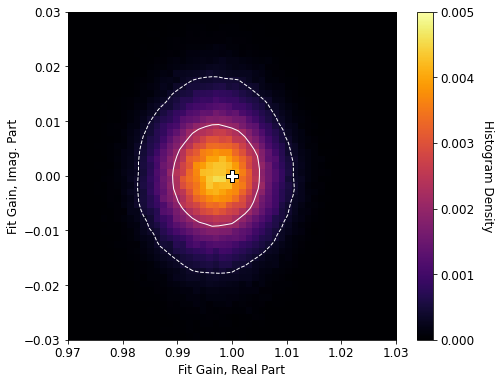

In [133]:
matplotlib.rcParams.update({'font.size': 12})

plot_range = .03
colorbar_range = [0, .005]
axis_label = 'Fit Gain'
nbins = 50

bins_imag = np.linspace(-plot_range, plot_range, num=nbins+1)
bins_real = bins_imag+1

plot_data = gain_vals_red_cal_limit[:, :, :, 0]
hist, x_edges, y_edges = np.histogram2d(
    np.real(plot_data).flatten(), np.imag(plot_data).flatten(),
    bins=[bins_real, bins_imag]
)
hist /= np.sum(hist)
kde, percent_plot = unified_calibration.produce_kde(plot_data, bins_real, bins_imag)

plt.figure(figsize=[7, 5.5])
plt.imshow(
    hist.T, interpolation='none', origin='lower',
    extent=[x_edges[0], x_edges[-1], y_edges[0], y_edges[-1]],
    vmin=colorbar_range[0], vmax=colorbar_range[1], aspect='equal',
    cmap='inferno'
)
cbar = plt.colorbar()
cbar.ax.set_ylabel('Histogram Density', rotation=270, labelpad=20)
plt.contour(
    bins_real, bins_imag, percent_plot, levels=[.5, .9],
    colors='white', linestyles=['solid', 'dashed'], linewidths=1
)
plt.scatter(
    [1], [0], marker='P', color='white', edgecolors='black', s=150
)

plt.xlabel('{}, Real Part'.format(axis_label))
plt.ylabel('{}, Imag. Part'.format(axis_label))
#plt.title(title)
plt.tight_layout()  # Ensure that axes labels don't get cut off
plt.show()

In [180]:
test_modelstddev = [.4*10.**val for val in np.arange(-5, 5, 1)]
print(test_modelstddev)
avg_gain_amp = [0.995993,0.995993,0.995993, 0.99601, 0.997168, 0.999906, 0.999999, 1., 1., 1.]

[4.000000000000001e-06, 4e-05, 0.0004, 0.004, 0.04000000000000001, 0.4, 4.0, 40.0, 400.0, 4000.0]


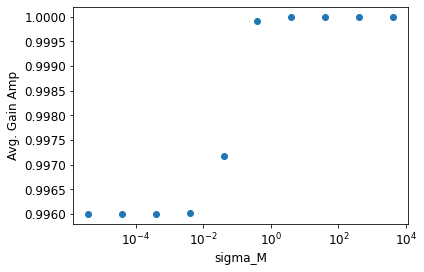

In [186]:
plt.semilogx(test_modelstddev, avg_gain_amp, 'o')
plt.xlabel('sigma_M')
plt.ylabel('Avg. Gain Amp')
plt.show()

In [228]:
def avg_gain_amp_fn(
    avg_gain_amp,
    avg_bls, sigma_m, sigma_t, true_vis_amp2, thermal_noise_amp2, model_error_amp2
):
    term1 = (1/sigma_t**2)*avg_gain_amp**4*avg_bls + 1/sigma_m**2
    term2 = (
        ((1/sigma_t**2)*avg_gain_amp**2*avg_bls + 1/sigma_m**2)*true_vis_amp2
        + (1/sigma_t**2)*avg_gain_amp**2*avg_bls*thermal_noise_amp2
    )
    term3 = (
        ((1/sigma_t**2)*avg_gain_amp**2*avg_bls + 1/sigma_m**2)**2*true_vis_amp2
        + 1/sigma_t**4*avg_gain_amp**4*avg_bls**2*thermal_noise_amp2 
        + 1/sigma_m**4*model_error_amp2
    )
    total = term1*term2/term3-avg_gain_amp**2
    return total

avg_bls = 10.5
sigma_m = .4
sigma_t = .2
true_vis_amp2 = 38.45
thermal_noise_amp2 = .08
model_error_amp2 = .31
test_modelstddev = [.4*5.**val for val in np.arange(-20, 20, .5)]
avg_gain_amps = []
for use_sigma_m in test_modelstddev:
    avg_gain_amp_sln = scipy.optimize.fsolve(
        avg_gain_amp_fn, 1,
        args=(avg_bls, use_sigma_m, sigma_t, true_vis_amp2, thermal_noise_amp2, model_error_amp2)
    )
    avg_gain_amps.append(avg_gain_amp_sln)

In [222]:
avg_gain_amp_sln

array([1.00092198])

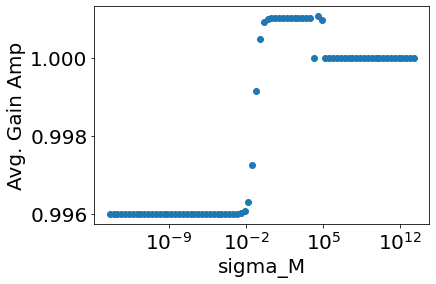

In [229]:
plt.semilogx(test_modelstddev, avg_gain_amps, 'o')
plt.xlabel('sigma_M')
plt.ylabel('Avg. Gain Amp')
plt.show()